# SUJET 5: Régularité mensuelle des TER

## Traitement des données

In [1]:
import ssl
ssl._create_default_https_context = ssl._create_unverified_context

import numpy
import pandas
site_TER="https://data.sncf.com/explore/dataset/regularite-mensuelle-ter/download/?format=csv&timezone=Europe/Berlin&lang=fr&use_labels_for_header=true&csv_separator=%3B"
df_TER=pandas.read_csv(site_TER,sep=";")

df_TER.head()

,Date,Région,Nombre de trains programmés,Nombre de trains ayant circulé,Nombre de trains annulés,Nombre de trains en retard à l'arrivée,Taux de régularité,Nombre de trains à l'heure pour un train en retard à l'arrivée,Commentaires
0,2013-01,Bretagne,8776.0,8631.0,145.0,554.0,93.581277,14.579422,Fortes chutes de neige ayant entrainé des pert...
1,2013-01,Languedoc Roussillon,5024.0,4897.0,127.0,377.0,92.301409,11.989390,Chute de neige sur le littoral.
2,2013-01,Bourgogne,8400.0,8332.0,68.0,625.0,92.498800,12.331200,Un mois de janvier qui surpasse les six exerci...
3,2013-01,Basse Normandie,3331.0,3297.0,34.0,311.0,90.567182,9.601286,Grand froid et épisode neigeux les semaines 3 ...
4,2013-01,Alsace,20095.0,19874.0,221.0,897.0,95.486565,21.156076,Intempéries.


On ordonne les données par régions et année-mois

In [2]:
df_TER=df_TER.sort_values(by=[df_TER.columns[1] , df_TER.columns[0]])

df_TER.head()

,Date,Région,Nombre de trains programmés,Nombre de trains ayant circulé,Nombre de trains annulés,Nombre de trains en retard à l'arrivée,Taux de régularité,Nombre de trains à l'heure pour un train en retard à l'arrivée,Commentaires
4,2013-01,Alsace,20095.0,19874.0,221.0,897.0,95.486565,21.156076,Intempéries.
21,2013-02,Alsace,18263.0,18097.0,166.0,771.0,95.739625,22.472114,Intempéries.
33,2013-03,Alsace,19138.0,18970.0,168.0,658.0,96.531365,27.829787,NaN
71,2013-04,Alsace,18846.0,18726.0,120.0,581.0,96.897362,31.230637,NaN
92,2013-05,Alsace,18659.0,18533.0,126.0,444.0,97.604273,40.740991,NaN


On supprime les colonnes inutiles

In [3]:
df_TER = df_TER.drop([df_TER.columns[8],df_TER.columns[7]], axis=1)

df_TER.head()

,Date,Région,Nombre de trains programmés,Nombre de trains ayant circulé,Nombre de trains annulés,Nombre de trains en retard à l'arrivée,Taux de régularité
4,2013-01,Alsace,20095.0,19874.0,221.0,897.0,95.486565
21,2013-02,Alsace,18263.0,18097.0,166.0,771.0,95.739625
33,2013-03,Alsace,19138.0,18970.0,168.0,658.0,96.531365
71,2013-04,Alsace,18846.0,18726.0,120.0,581.0,96.897362
92,2013-05,Alsace,18659.0,18533.0,126.0,444.0,97.604273


On supprime les lignes contenant des données manquantes pour les colonnes 'Nombre de trains programmés' et 'Nombre de trains annulés'

In [4]:
df=df_TER.copy()
df.isna().sum()  # nombre de "nan" par colonne

Date                                       0
Région                                     0
Nombre de trains programmés               37
Nombre de trains ayant circulé            37
Nombre de trains annulés                  37
Nombre de trains en retard à l'arrivée    37
Taux de régularité                        37
dtype: int64

In [5]:
df=df.loc[df['Nombre de trains programmés'].notnull()]
df=df.loc[df['Nombre de trains annulés'].notnull()]

In [6]:
df.isna().sum()

Date                                      0
Région                                    0
Nombre de trains programmés               0
Nombre de trains ayant circulé            0
Nombre de trains annulés                  0
Nombre de trains en retard à l'arrivée    0
Taux de régularité                        0
dtype: int64

Nombre d'occurence pour chaque région

In [7]:
dic_Region=dict(df[df.columns[1]].value_counts())
dic_Region

{"Provence Alpes Côte d'Azur": 134,
 'Bretagne': 134,
 'Pays-de-la-Loire': 134,
 'Centre': 92,
 'Aquitaine': 92,
 'Grand Est': 86,
 'Hauts-de-France': 74,
 'Auvergne-Rhône-Alpes': 74,
 'Bourgogne-Franche-Comté': 74,
 'Normandie': 74,
 'Occitanie': 68,
 'Midi Pyrénées': 66,
 'Limousin': 60,
 'Poitou Charentes': 60,
 'Picardie': 60,
 'Rhône Alpes': 60,
 'Languedoc Roussillon': 60,
 'Haute Normandie': 60,
 'Franche Comté': 60,
 'Bourgogne': 60,
 'Basse Normandie': 60,
 'Auvergne': 60,
 'Nord Pas de Calais': 58,
 'Champagne Ardenne': 48,
 'Alsace': 48,
 'Nouvelle Aquitaine': 42,
 'Centre Val-de-Loire': 42,
 'Lorraine': 13}

**Nous checherons à détecter les moments de ruptures pour chaque région**

## Mise en place de la méthode de detection de rupture

In [35]:
import numpy as np
import math
import scipy
import scipy.optimize
from scipy.stats import norm
from scipy.special import ndtr
import matplotlib.pyplot as plt
from scipy.stats import skewnorm
import scipy.stats as stats

In [36]:
import numpy as np
from scipy.stats import norm
from scipy.optimize import minimize
import math

def candidate_rupt(X):
    n = len(X)
    index_list = []
    log_lik_list = []
    param_list = []
    # Possible improvement: Parallelize this loop
    for k in range(10, n - 10):
        param = reg_scipy(k, X)  # Estimate parameters for this break point
        log_lik_est = log_lik(X, param, k)  # Estimate log likelihood for these parameters
        index_list.append(k)
        param_list.append(param)
        log_lik_list.append(log_lik_est)
    return index_list, param_list, log_lik_list

def log_lik(X, phi, k):
    n = len(X)
    mu_1, mu_2, sigma_1, sigma_2, theta = phi
    sum_sq_1 = np.sum((X[:k] - mu_1)**2)
    sum_sq_2 = np.sum((X[k:] - mu_2)**2)
    list_norm_cdf_1 = norm.cdf(theta * ((X[:k] - mu_1) / sigma_1))
    list_norm_cdf_2 = norm.cdf(theta * ((X[k:] - mu_2) / sigma_2))
    sum_log_1 = np.sum(np.log(np.maximum(list_norm_cdf_1, 1e-99)))
    sum_log_2 = np.sum(np.log(np.maximum(list_norm_cdf_2, 1e-99)))
    log_lik = n * np.log(2) - n * np.log(2 * np.pi) - k * np.log(sigma_1) - (n - k) * np.log(sigma_2) - (1 / (2 * sigma_1**2)) * sum_sq_1 - (1 / (2 * sigma_2**2)) * sum_sq_2 + sum_log_1 + sum_log_2
    return log_lik

def reg_scipy(k, X):
    def fonction_objective(phi):
        mu_1, mu_2, sigma_1, sigma_2, theta = phi
        sum_sq_1 = np.sum((X[:k] - mu_1)**2)
        sum_sq_2 = np.sum((X[k:] - mu_2)**2)
        list_norm_cdf_1 = norm.cdf(theta * ((X[:k] - mu_1) / sigma_1))
        list_norm_cdf_2 = norm.cdf(theta * ((X[k:] - mu_2) / sigma_2))
        sum_log_1 = np.sum(np.log(np.maximum(list_norm_cdf_1, 1e-99)))
        sum_log_2 = np.sum(np.log(np.maximum(list_norm_cdf_2, 1e-99)))
        log_lik = -k * np.log(sigma_1) - (n - k) * np.log(sigma_2) - (1 / (2 * sigma_1**2)) * sum_sq_1 - (1 / (2 * sigma_2**2)) * sum_sq_2 + sum_log_1 + sum_log_2
        return -log_lik
    n = len(X)
    bounds = [(None, None), (None, None), (1e-9, None), (1e-9, None), (None, None)]
    phi_0 = np.random.rand(5)
    res1 = minimize(fonction_objective, phi_0, method='L-BFGS-B', bounds=bounds, options={'maxiter': 2500, 'ftol': 1e-9, 'disp': True})
    return res1.x

## Application aux donnees

Appliquons notre méthode de détection de point de rupture pour les régions pour lesquelles nous disposons de strictement plus que 60 observations

### Provence Alpes Cote d'Azur

**Trains programmés**

In [ ]:
PACA=df[df['Région']=="Provence Alpes Côte d'Azur"]
PACA=PACA.reset_index(inplace=False, drop=True)

PACA.head()

,Date,Région,Nombre de trains programmés,Nombre de trains ayant circulé,Nombre de trains annulés,Nombre de trains en retard à l'arrivée,Taux de régularité
0,2013-01,Provence Alpes Côte d'Azur,13956.0,13219.0,737.0,1816.0,86.262198
1,2013-02,Provence Alpes Côte d'Azur,12581.0,12142.0,439.0,1761.0,85.496623
2,2013-03,Provence Alpes Côte d'Azur,13994.0,13042.0,952.0,2010.0,84.588253
3,2013-04,Provence Alpes Côte d'Azur,13437.0,12168.0,1269.0,1660.0,86.357659
4,2013-05,Provence Alpes Côte d'Azur,13312.0,12977.0,335.0,2244.0,82.707868


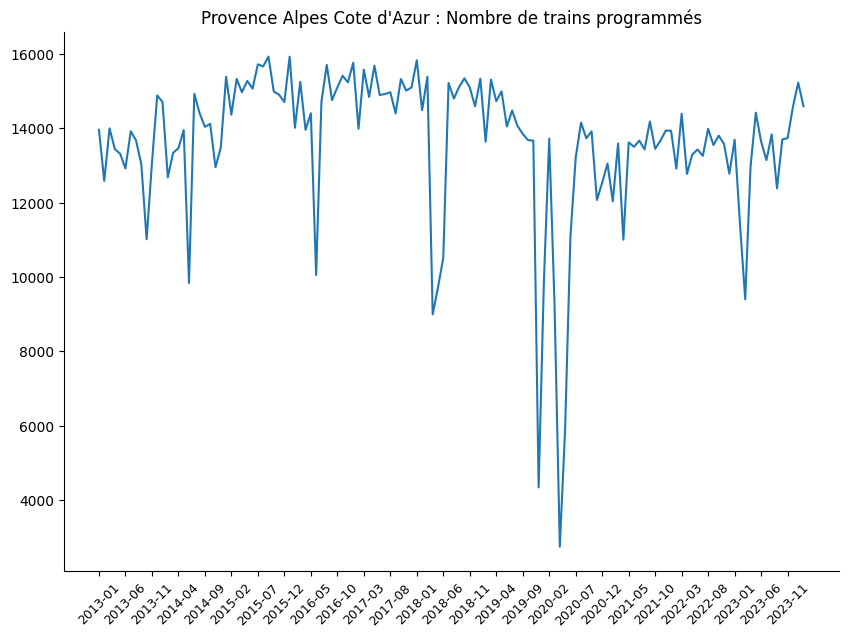

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(PACA)) if i%5==0]
plt.xticks(ensemble_affichage,[PACA[PACA.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(PACA['Date'],PACA['Nombre de trains programmés'])
plt.title("Provence Alpes Cote d'Azur : Nombre de trains programmés")

plt.show()

PACA : Nombre de trains programmés


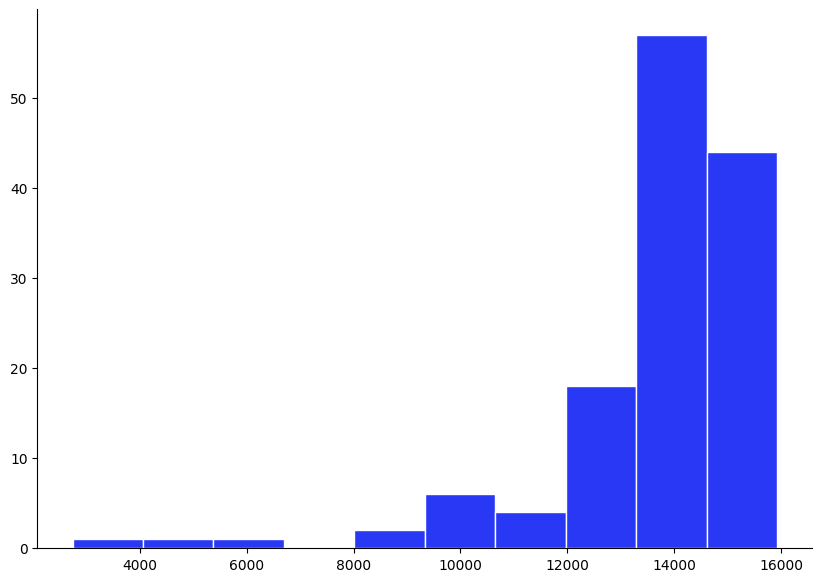

In [ ]:
print("PACA : Nombre de trains programmés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(PACA[PACA.columns[2]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [ ]:
index_list_PACA, param_list_PACA, log_lik_list_PACA=candidate_rupt(PACA['Nombre de trains programmés'])

In [ ]:
max_value_PACA = max(log_lik_list_PACA)
max_index_PACA =log_lik_list_PACA.index(max_value_PACA)

PACA : vraissemblance selon k


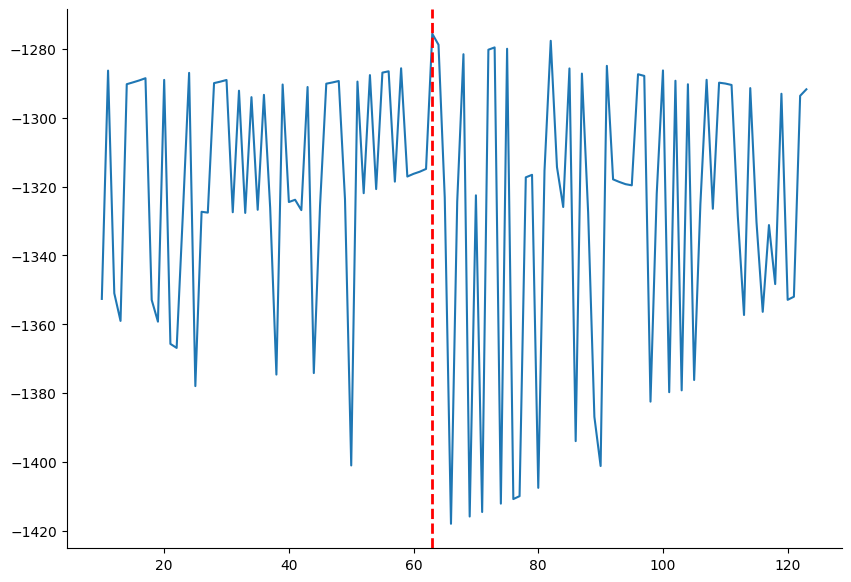

In [ ]:
print("PACA : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_PACA,log_lik_list_PACA)
plt.axvline(x=index_list_PACA[max_index_PACA], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [ ]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_PACA[max_index_PACA]}, Parametres des lois:{param_list_PACA[max_index_PACA]}")

Maximum de vraissemblance atteint pour k= 63, Parametres des lois:[15925.16139984 15344.0029103   1998.17219316  3337.64663462
 -4378.41606602]


In [ ]:
PACA.loc[63]

Date                                                         2018-04
Région                                    Provence Alpes Côte d'Azur
Nombre de trains programmés                                   8990.0
Nombre de trains ayant circulé                                8657.0
Nombre de trains annulés                                       333.0
Nombre de trains en retard à l'arrivée                        1016.0
Taux de régularité                                         88.263833
Name: 63, dtype: object

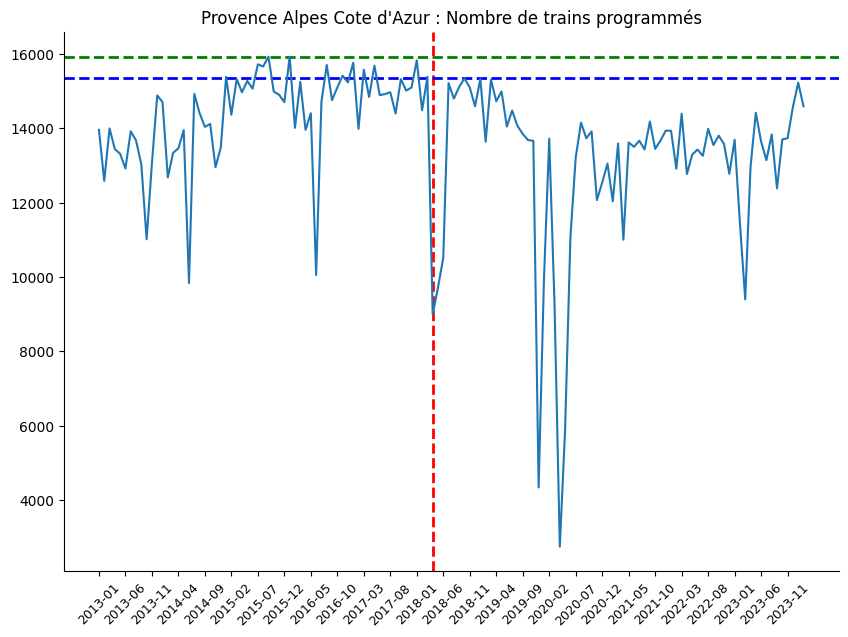

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(PACA)) if i%5==0]
plt.xticks(ensemble_affichage,[PACA[PACA.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_PACA=param_list_PACA[max_index_PACA]
plt.axvline(x=index_list_PACA[max_index_PACA], color='red', linestyle='dashed', linewidth=2)
plt.axhline(y=param_PACA[0], color='green', linestyle='dashed', linewidth=2)
plt.axhline(y=param_PACA[1], color='blue', linestyle='dashed', linewidth=2)

plt.plot(PACA['Date'],PACA['Nombre de trains programmés'])
plt.title("Provence Alpes Cote d'Azur : Nombre de trains programmés")

plt.show()

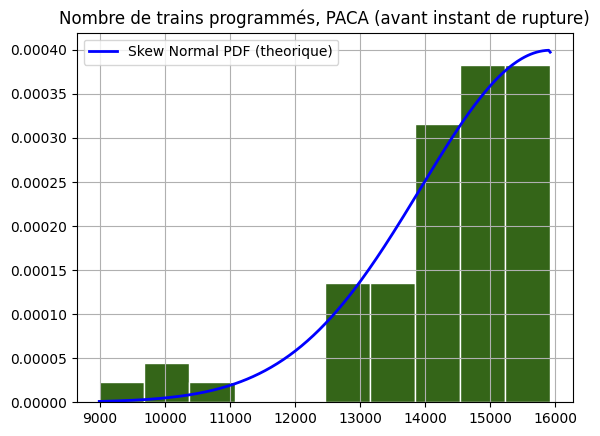

In [ ]:
counts, bins, patches = plt.hist(PACA.loc[:63,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_PACA[4], param_PACA[0], param_PACA[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, PACA (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

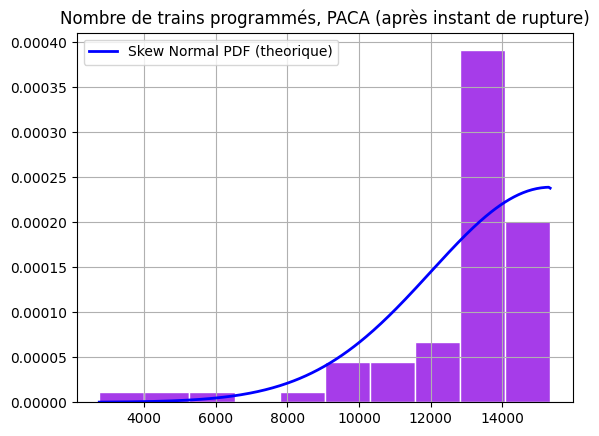

In [ ]:
counts, bins, patches = plt.hist(PACA.loc[63:,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_PACA[4], param_PACA[1], param_PACA[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, PACA (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
data1 = PACA.loc[63:,'Nombre de trains programmés']
data2 = PACA.loc[:63,'Nombre de trains programmés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")


Kolmogorov-Smirnov statistic: 0.43860035211267606
p-value: 2.3015497120329066e-06
Reject null hypothesis, distributions likely differ.


**Trains annulés**

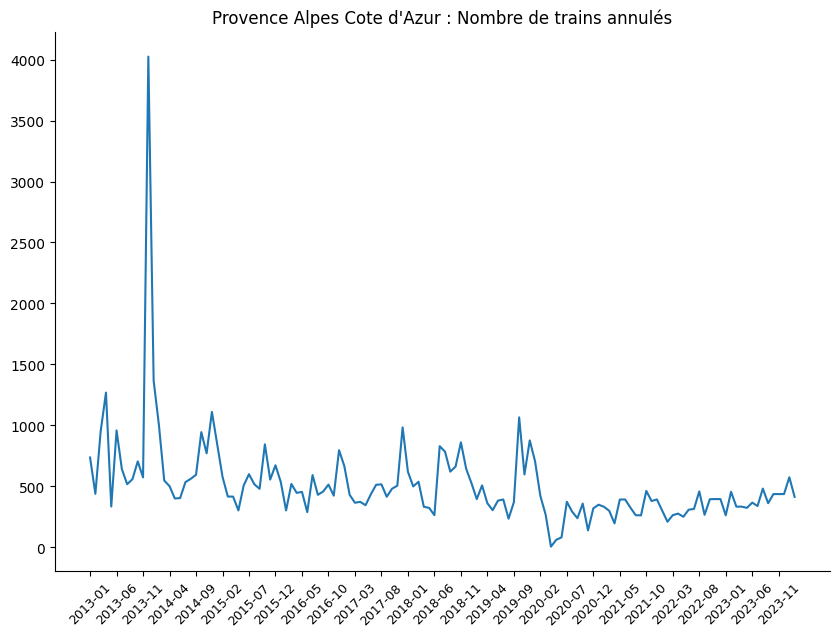

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(PACA)) if i%5==0]
plt.xticks(ensemble_affichage,[PACA[PACA.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(PACA['Date'],PACA['Nombre de trains annulés'])
plt.title("Provence Alpes Cote d'Azur : Nombre de trains annulés")

plt.show()

PACA : Nombre de trains annulés


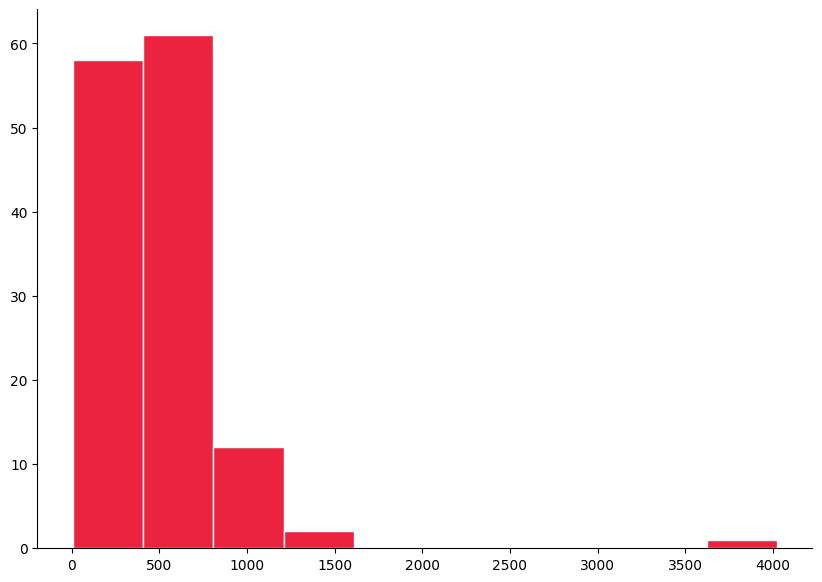

In [ ]:
print("PACA : Nombre de trains annulés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(PACA[PACA.columns[4]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [ ]:
index_list_PACA_2, param_list_PACA_2, log_lik_list_PACA_2=candidate_rupt(PACA['Nombre de trains annulés'])

In [ ]:
max_value_PACA_2 = max(log_lik_list_PACA_2)
max_index_PACA_2 =log_lik_list_PACA_2.index(max_value_PACA_2)

PACA : vraissemblance selon k


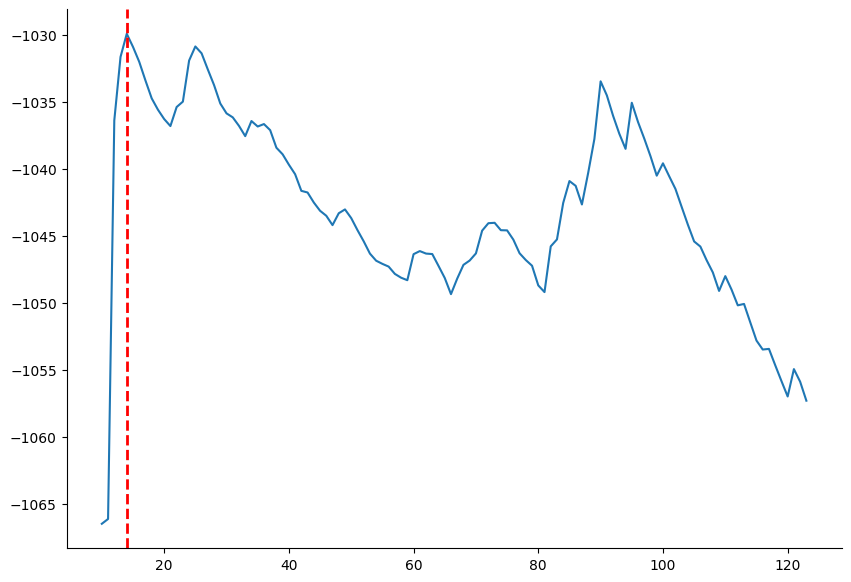

In [ ]:
print("PACA : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_PACA_2,log_lik_list_PACA_2)
plt.axvline(x=index_list_PACA_2[max_index_PACA_2], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [ ]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_PACA_2[max_index_PACA_2]}, Parametres des lois:{param_list_PACA_2[max_index_PACA_2]}")

Maximum de vraissemblance atteint pour k= 14, Parametres des lois:[ 274.11211117  238.39572534 1062.16651664  294.67233262    3.03299142]


In [ ]:
PACA.loc[index_list_PACA_2[max_index_PACA_2]]

Date                                                         2014-03
Région                                    Provence Alpes Côte d'Azur
Nombre de trains programmés                                  13338.0
Nombre de trains ayant circulé                               12790.0
Nombre de trains annulés                                       548.0
Nombre de trains en retard à l'arrivée                        1903.0
Taux de régularité                                         85.121188
Name: 14, dtype: object

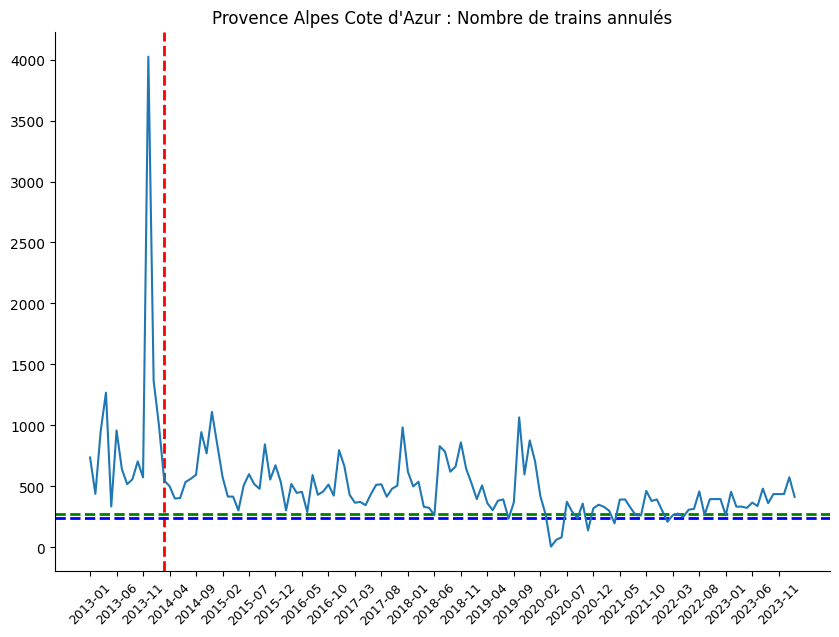

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

ensemble_affichage=[i for i in range(len(PACA)) if i%5==0]
plt.xticks(ensemble_affichage,[PACA[PACA.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_PACA_2=param_list_PACA_2[max_index_PACA_2]
plt.axvline(x=index_list_PACA_2[max_index_PACA_2], color='red', linestyle='dashed', linewidth=2)
plt.axhline(y=param_PACA_2[0], color='green', linestyle='dashed', linewidth=2)
plt.axhline(y=param_PACA_2[1], color='blue', linestyle='dashed', linewidth=2)

plt.plot(PACA['Date'],PACA['Nombre de trains annulés'])
plt.title("Provence Alpes Cote d'Azur : Nombre de trains annulés")

plt.show()

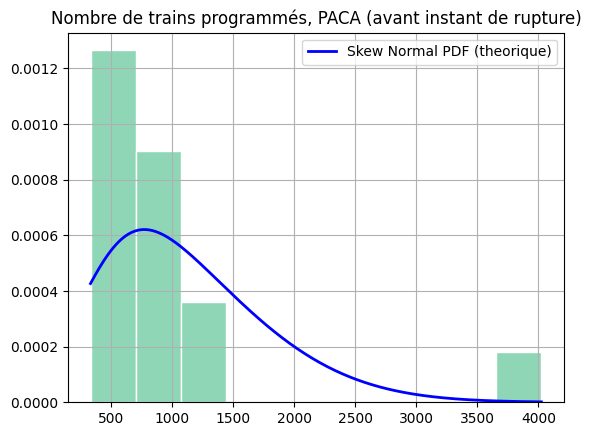

In [ ]:
k=index_list_PACA_2[max_index_PACA_2]

counts, bins, patches = plt.hist(PACA.loc[:k,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_PACA_2[4], param_PACA_2[0], param_PACA_2[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, PACA (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

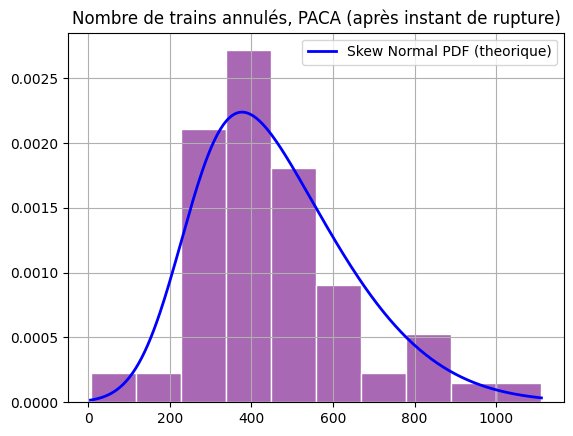

In [ ]:
counts, bins, patches = plt.hist(PACA.loc[k:,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_PACA_2[4], param_PACA_2[1], param_PACA_2[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains annulés, PACA (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
data1 = PACA.loc[k:,'Nombre de trains annulés']
data2 = PACA.loc[:k,'Nombre de trains annulés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")


Kolmogorov-Smirnov statistic: 0.5833333333333334
p-value: 9.500723584300223e-05
Reject null hypothesis, distributions likely differ.


### Bretagne

**Trains programmés**

In [ ]:
Bret=df[df['Région']=='Bretagne']
Bret=Bret.reset_index(inplace=False, drop=True)

Bret.head()

,Date,Région,Nombre de trains programmés,Nombre de trains ayant circulé,Nombre de trains annulés,Nombre de trains en retard à l'arrivée,Taux de régularité
0,2013-01,Bretagne,8776.0,8631.0,145.0,554.0,93.581277
1,2013-02,Bretagne,7729.0,7644.0,85.0,448.0,94.139194
2,2013-03,Bretagne,8363.0,8208.0,155.0,924.0,88.742690
3,2013-04,Bretagne,8371.0,8276.0,95.0,579.0,93.003867
4,2013-05,Bretagne,7977.0,7910.0,67.0,323.0,95.916561


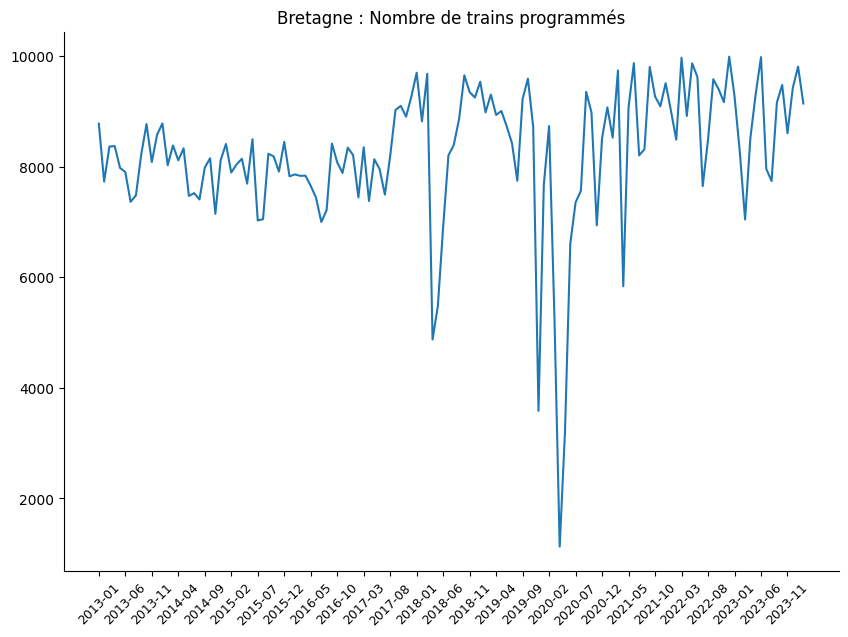

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(Bret)) if i%5==0]
plt.xticks(ensemble_affichage,[Bret[Bret.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(Bret['Date'],Bret['Nombre de trains programmés'])
plt.title("Bretagne : Nombre de trains programmés")

plt.show()

Bretagne : Nombre de trains programmés


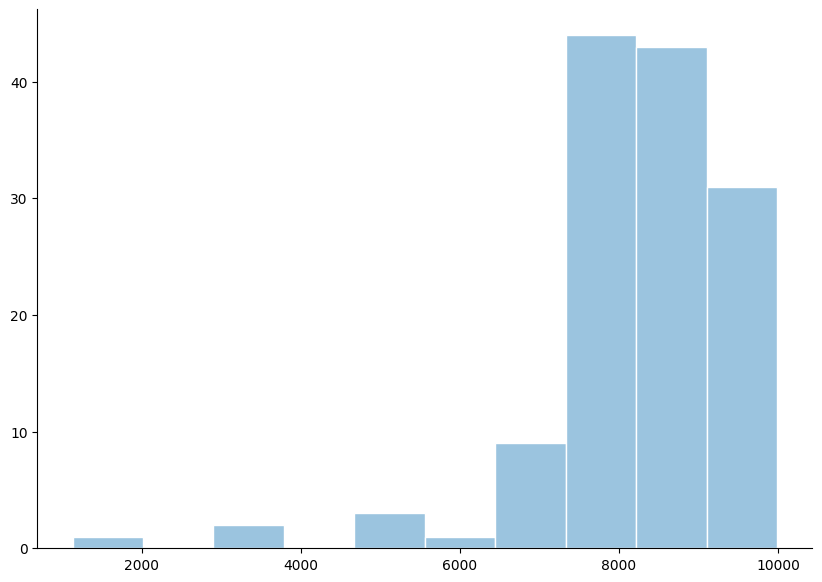

In [ ]:
print("Bretagne : Nombre de trains programmés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(Bret[Bret.columns[2]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [ ]:
index_list_Bret, param_list_Bret, log_lik_list_Bret=candidate_rupt(Bret['Nombre de trains programmés'])

In [ ]:
max_value_Bret = max(log_lik_list_Bret)
max_index_Bret =log_lik_list_Bret.index(max_value_Bret)

Bretagne : vraissemblance selon k


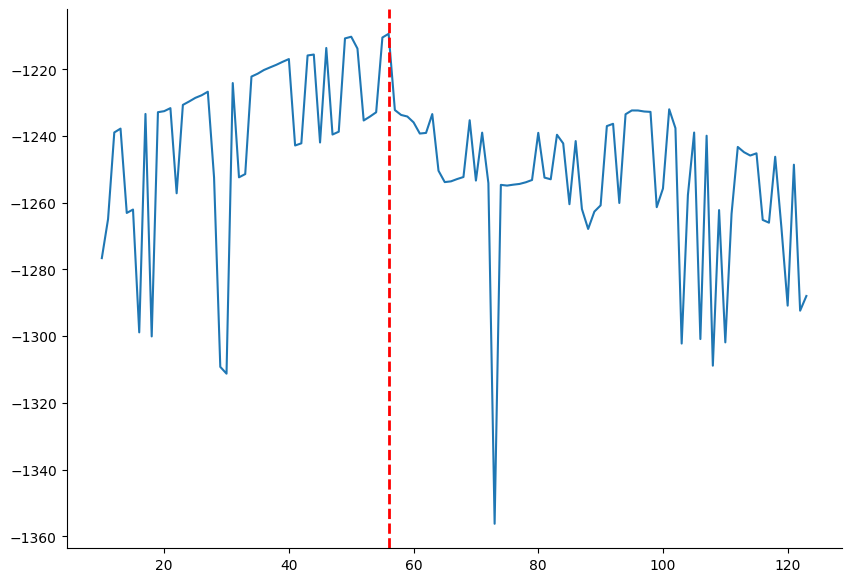

In [ ]:
print("Bretagne : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_Bret,log_lik_list_Bret)
plt.axvline(x=index_list_Bret[max_index_Bret], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [ ]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_Bret[max_index_Bret]}, Parametres des lois:{param_list_Bret[max_index_Bret]}")

Maximum de vraissemblance atteint pour k= 56, Parametres des lois:[ 8.62761471e+03  9.95724903e+03  8.50730189e+02  2.14079721e+03
 -6.96301601e+00]


In [ ]:
k=index_list_Bret[max_index_Bret]
Bret.loc[k]

Date                                       2017-09
Région                                    Bretagne
Nombre de trains programmés                 9024.0
Nombre de trains ayant circulé              8920.0
Nombre de trains annulés                     104.0
Nombre de trains en retard à l'arrivée       393.0
Taux de régularité                        95.59417
Name: 56, dtype: object

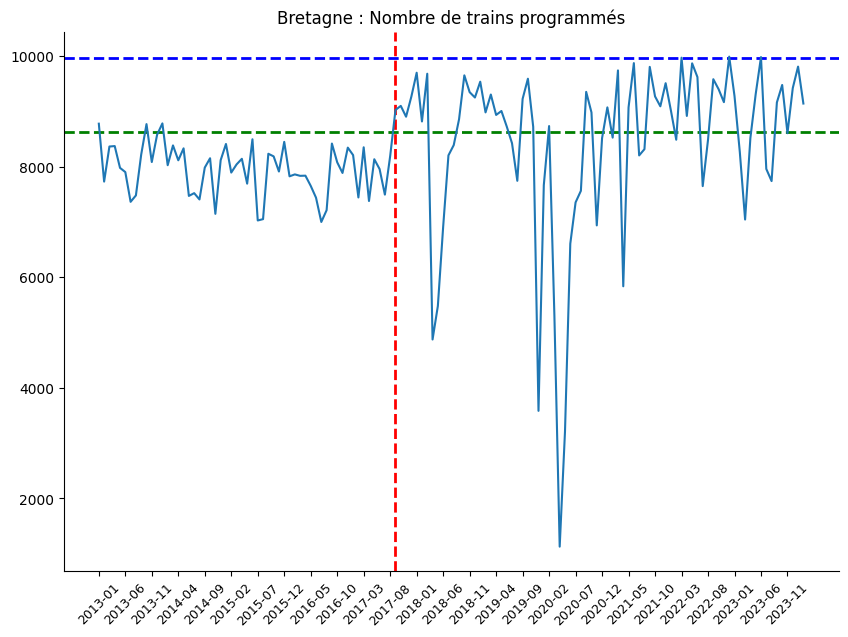

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(Bret)) if i%5==0]
plt.xticks(ensemble_affichage,[Bret[Bret.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_Bret=param_list_Bret[max_index_Bret]
plt.axvline(x=index_list_Bret[max_index_Bret], color='red', linestyle='dashed', linewidth=2)
plt.axhline(y=param_Bret[0], color='green', linestyle='dashed', linewidth=2)
plt.axhline(y=param_Bret[1], color='blue', linestyle='dashed', linewidth=2)

plt.plot(Bret['Date'],Bret['Nombre de trains programmés'])
plt.title("Bretagne : Nombre de trains programmés")

plt.show()

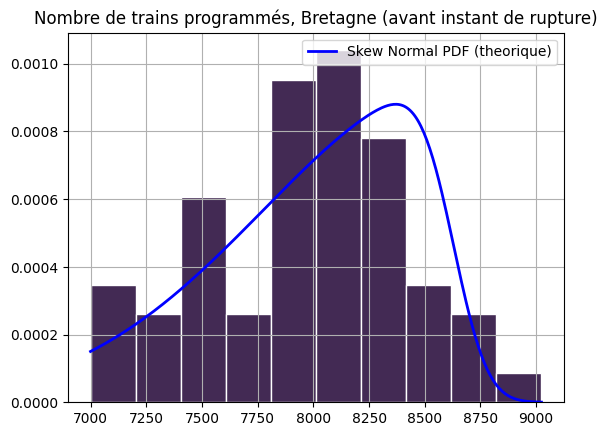

In [ ]:
counts, bins, patches = plt.hist(Bret.loc[:k,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_Bret[4], param_Bret[0], param_Bret[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, Bretagne (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

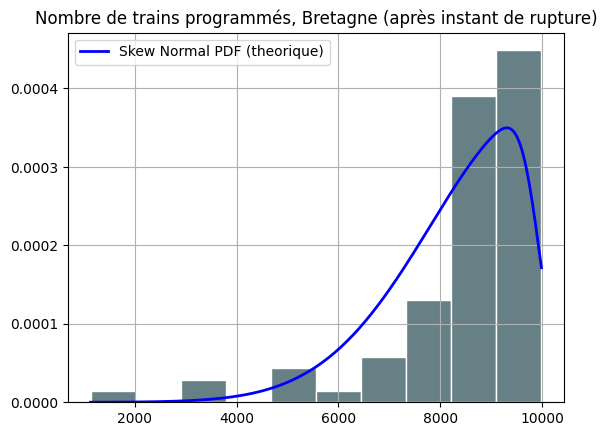

In [ ]:
counts, bins, patches = plt.hist(Bret.loc[k:,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_Bret[4], param_Bret[1], param_Bret[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, Bretagne (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
data1 = Bret.loc[index_list_Bret[max_index_Bret]:,'Nombre de trains programmés']
data2 = Bret.loc[:index_list_Bret[max_index_Bret],'Nombre de trains programmés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

NameError: name 'index_list_Bret' is not defined

**Trains annulés**

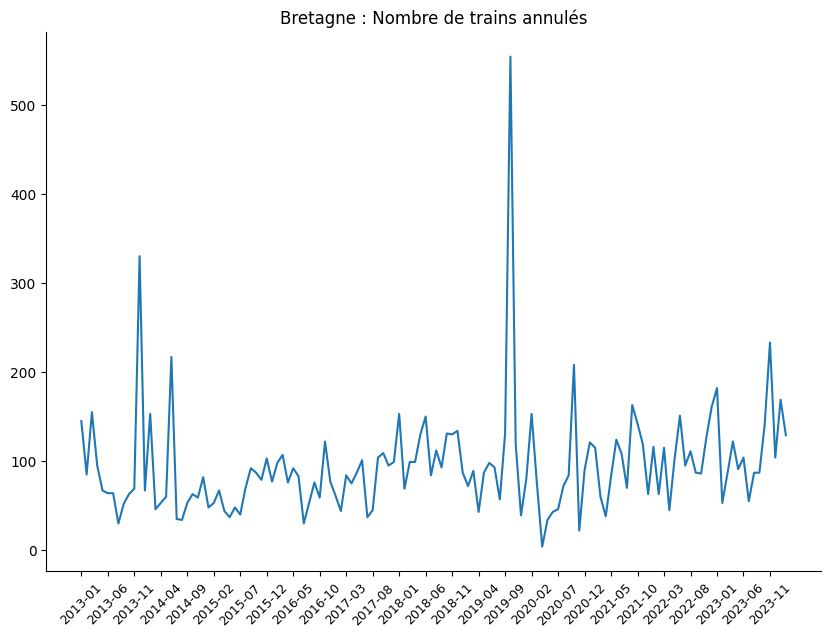

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(Bret)) if i%5==0]
plt.xticks(ensemble_affichage,[Bret[Bret.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(Bret['Date'],Bret['Nombre de trains annulés'])
plt.title("Bretagne : Nombre de trains annulés")

plt.show()


Bretagne : Nombre de trains annulés


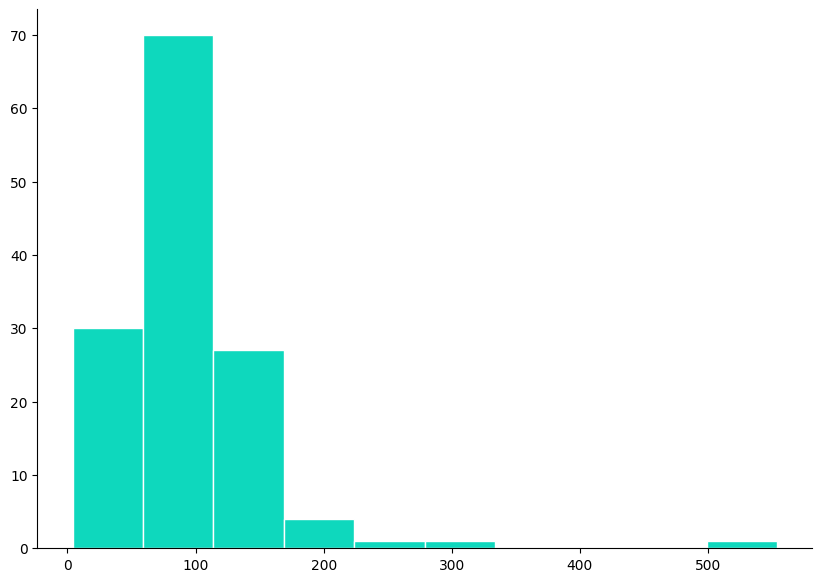

In [ ]:
print("Bretagne : Nombre de trains annulés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(Bret[Bret.columns[4]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [ ]:
index_list_Bret_2, param_list_Bret_2, log_lik_list_Bret_2=candidate_rupt(Bret['Nombre de trains annulés'])

In [ ]:
max_value_Bret_2 = max(log_lik_list_Bret_2)
max_index_Bret_2 =log_lik_list_Bret_2.index(max_value_Bret_2)

Bretagne : vraissemblance selon k


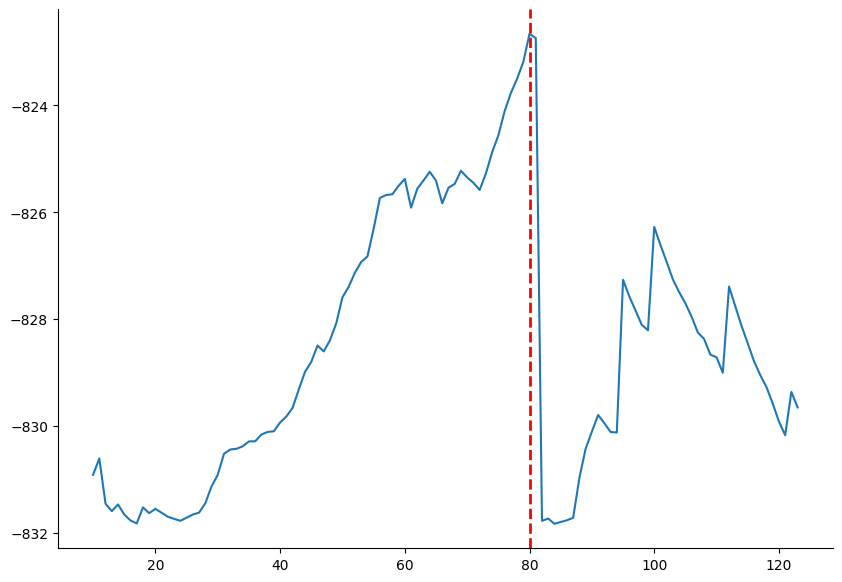

In [ ]:
print("Bretagne : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_Bret_2,log_lik_list_Bret_2)
plt.axvline(x=index_list_Bret_2[max_index_Bret_2], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [ ]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_Bret_2[max_index_Bret_2]}, Parametres des lois:{param_list_Bret_2[max_index_Bret_2]}")

Maximum de vraissemblance atteint pour k= 80, Parametres des lois:[ 35.10278974  26.35115883  66.07888145 113.60093521   7.85879906]


In [ ]:
Bret.loc[index_list_Bret_2[max_index_Bret_2]]

Date                                        2019-09
Région                                     Bretagne
Nombre de trains programmés                  9224.0
Nombre de trains ayant circulé               9093.0
Nombre de trains annulés                      131.0
Nombre de trains en retard à l'arrivée        365.0
Taux de régularité                        95.990002
Name: 80, dtype: object

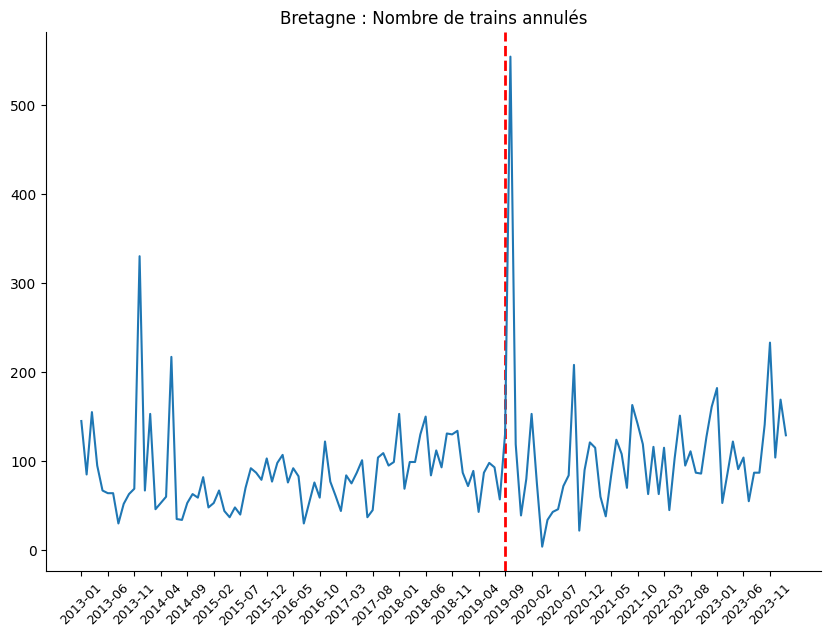

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

ensemble_affichage=[i for i in range(len(Bret)) if i%5==0]
plt.xticks(ensemble_affichage,[Bret[Bret.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_Bret_2=param_list_Bret_2[max_index_Bret_2]
plt.axvline(x=index_list_Bret_2[max_index_Bret_2], color='red', linestyle='dashed', linewidth=2)

plt.plot(Bret['Date'],Bret['Nombre de trains annulés'])
plt.title("Bretagne : Nombre de trains annulés")

plt.show()

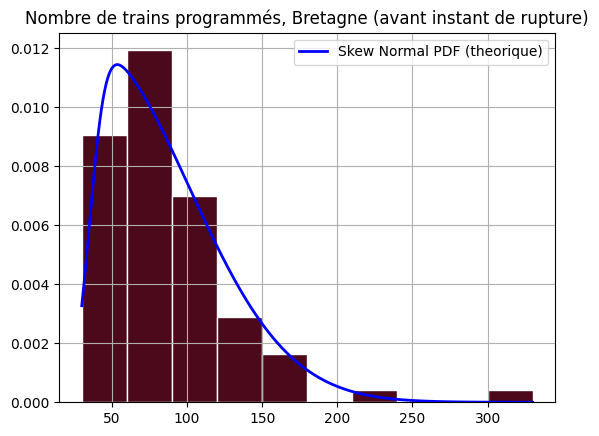

In [ ]:
k=index_list_Bret_2[max_index_Bret_2]

counts, bins, patches = plt.hist(Bret.loc[:k,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_Bret_2[4], param_Bret_2[0], param_Bret_2[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, Bretagne (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

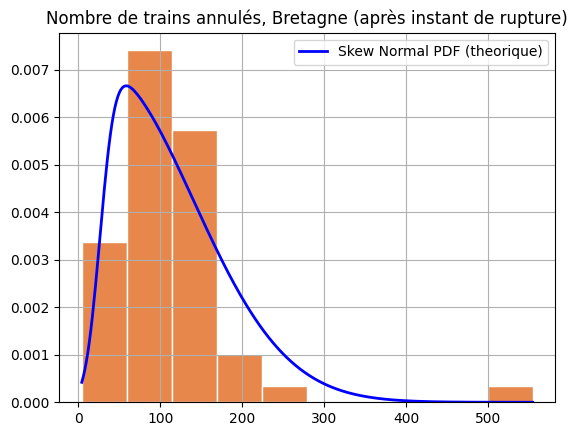

In [ ]:
counts, bins, patches = plt.hist(Bret.loc[k:,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_Bret_2[4], param_Bret_2[1], param_Bret_2[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains annulés, Bretagne (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
data1 = Bret.loc[k:,'Nombre de trains annulés']
data2 = Bret.loc[:k,'Nombre de trains annulés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.2777777777777778
p-value: 0.011480013674291916
Reject null hypothesis, distributions likely differ.


###Pays-de-la-Loire

**Trains programmés**

In [ ]:
PL=df[df['Région']=='Pays-de-la-Loire']
PL=PL.reset_index(inplace=False, drop=True)

PL.head()

,Date,Région,Nombre de trains programmés,Nombre de trains ayant circulé,Nombre de trains annulés,Nombre de trains en retard à l'arrivée,Taux de régularité
0,2013-01,Pays-de-la-Loire,10407.0,10195.0,212.0,713.0,93.006376
1,2013-02,Pays-de-la-Loire,9238.0,9126.0,112.0,503.0,94.488275
2,2013-03,Pays-de-la-Loire,9837.0,9484.0,353.0,520.0,94.517081
3,2013-04,Pays-de-la-Loire,9758.0,9549.0,209.0,501.0,94.753377
4,2013-05,Pays-de-la-Loire,9823.0,9420.0,403.0,658.0,93.014862


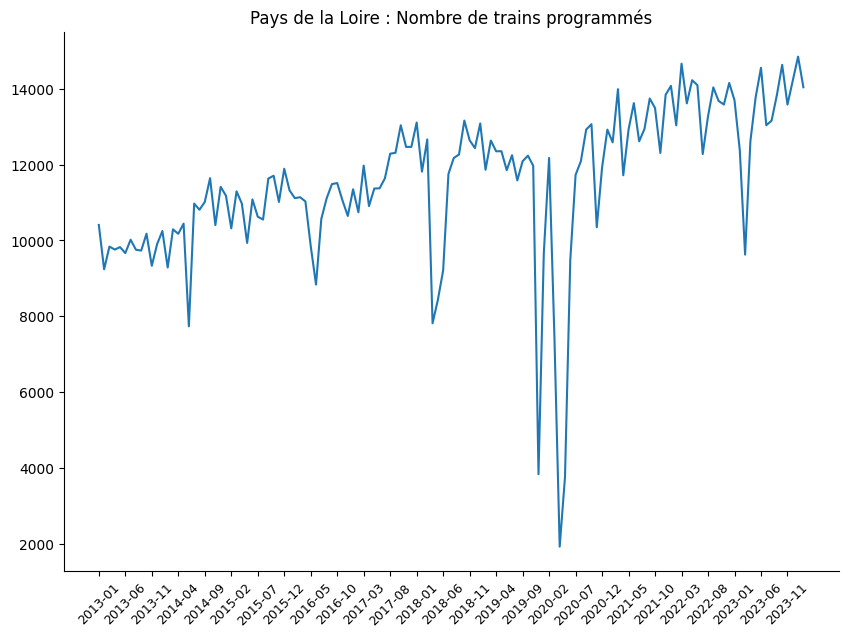

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(PL)) if i%5==0]
plt.xticks(ensemble_affichage,[PL[PL.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(PL['Date'],PL['Nombre de trains programmés'])
plt.title("Pays de la Loire : Nombre de trains programmés")

plt.show()


Pays de la Loire : Nombre de trains programmés


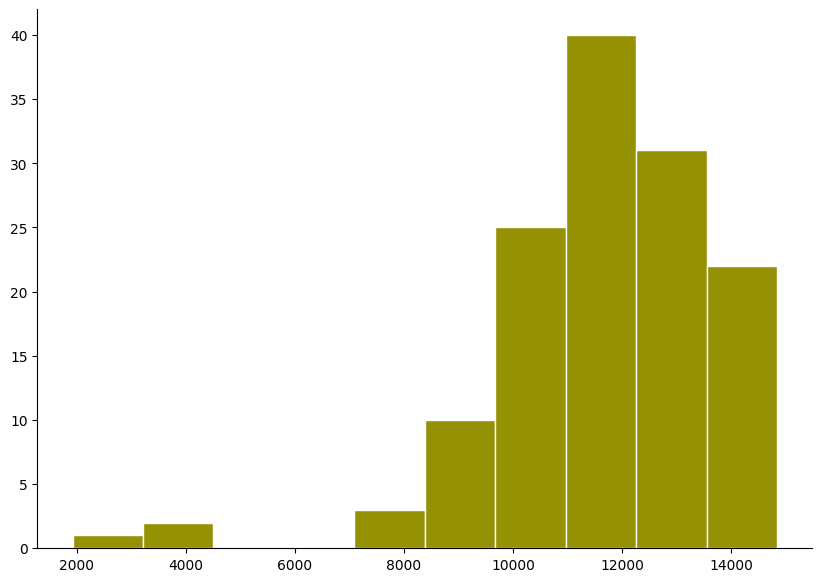

In [ ]:
print("Pays de la Loire : Nombre de trains programmés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(PL[PL.columns[2]].values , ec="white",color=numpy.random.rand(3))
plt.show()


In [ ]:
index_list_PL, param_list_PL, log_lik_list_PL=candidate_rupt(PL['Nombre de trains programmés'])

In [ ]:
max_value_PL = max(log_lik_list_PL)
max_index_PL =log_lik_list_PL.index(max_value_PL)

Pays de la Loire : vraissemblance selon k


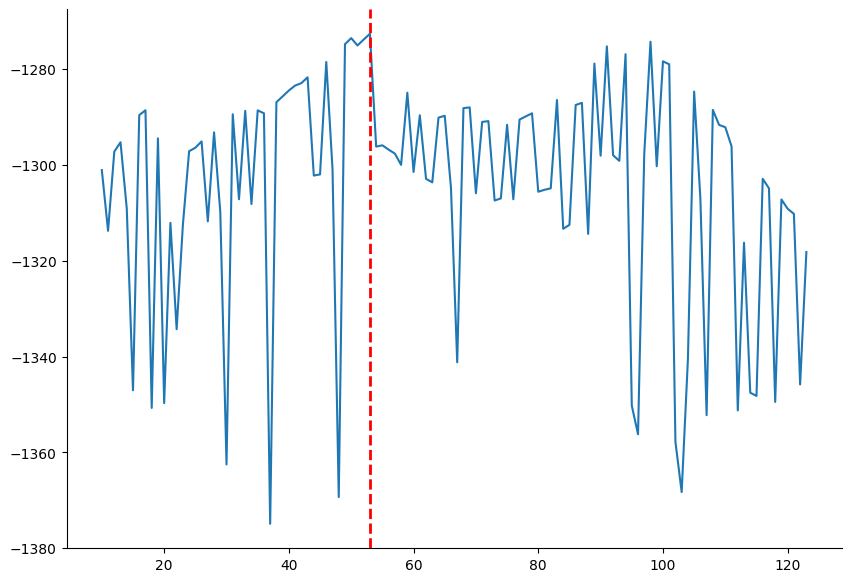

In [ ]:
print("Pays de la Loire : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_PL,log_lik_list_PL)
plt.axvline(x=index_list_PL[max_index_PL], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [ ]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_PL[max_index_PL]}, Parametres des lois:{param_list_PL[max_index_PL]}")

Maximum de vraissemblance atteint pour k= 53, Parametres des lois:[ 1.17379607e+04  1.45039062e+04  1.45996235e+03  3.23132166e+03
 -7.82846752e+00]


In [ ]:
k=index_list_PL[max_index_PL]
PL.loc[k]

Date                                               2017-06
Région                                    Pays-de-la-Loire
Nombre de trains programmés                        11373.0
Nombre de trains ayant circulé                     11167.0
Nombre de trains annulés                             206.0
Nombre de trains en retard à l'arrivée              1051.0
Taux de régularité                               90.588341
Name: 53, dtype: object

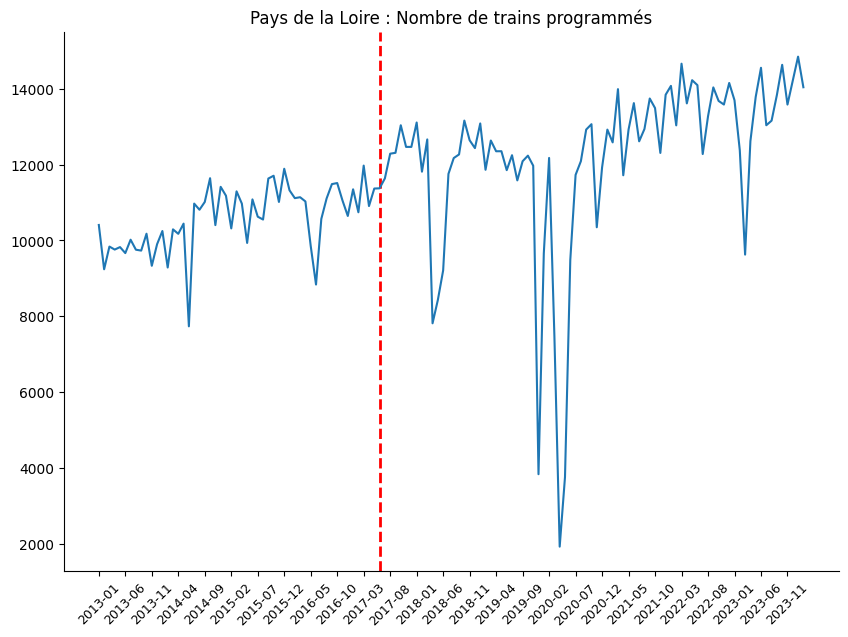

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(PL)) if i%5==0]
plt.xticks(ensemble_affichage,[PL[PL.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_PL=param_list_PL[max_index_PL]
plt.axvline(x=index_list_PL[max_index_PL], color='red', linestyle='dashed', linewidth=2)

plt.plot(PL['Date'],PL['Nombre de trains programmés'])
plt.title("Pays de la Loire : Nombre de trains programmés")

plt.show()


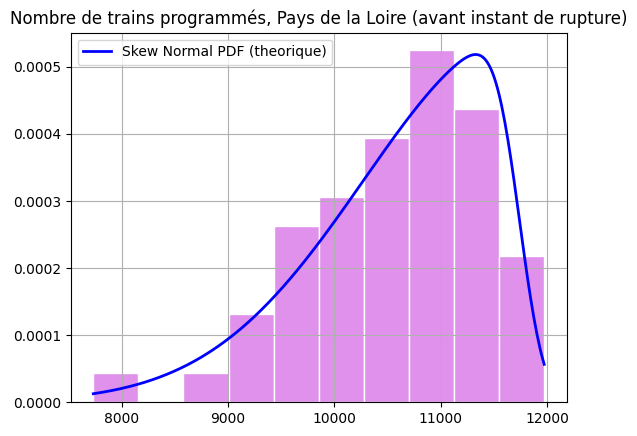

In [ ]:
counts, bins, patches = plt.hist(PL.loc[:k,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_PL[4], param_PL[0], param_PL[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, Pays de la Loire (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

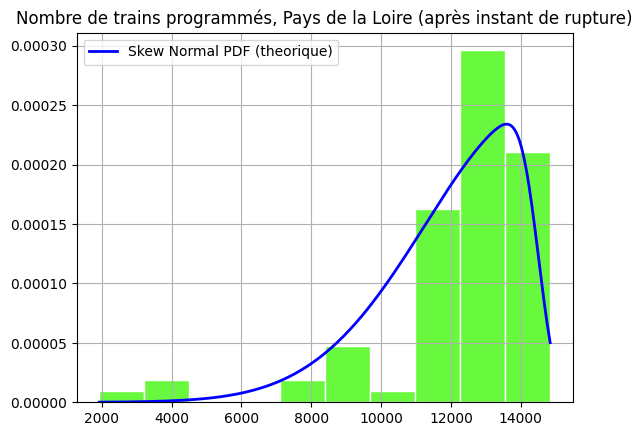

In [ ]:
counts, bins, patches = plt.hist(PL.loc[k:,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_PL[4], param_PL[1], param_PL[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, Pays de la Loire (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()


In [ ]:
data1 = PL.loc[index_list_PL[max_index_PL]:,'Nombre de trains programmés']
data2 = PL.loc[:index_list_PL[max_index_PL],'Nombre de trains programmés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.7901234567901234
p-value: 1.4287088306788144e-20
Reject null hypothesis, distributions likely differ.


**Trains annulées**

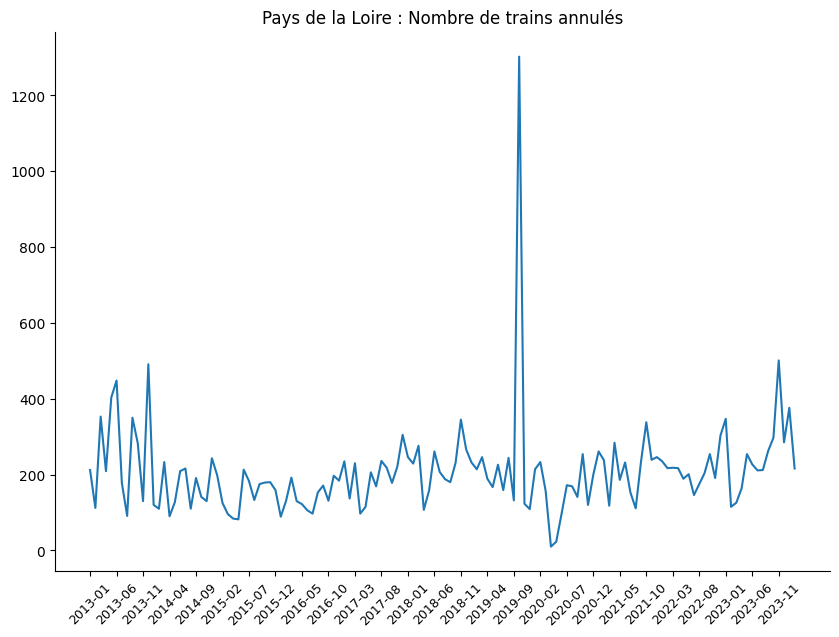

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(PL)) if i%5==0]
plt.xticks(ensemble_affichage,[PL[PL.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(PL['Date'],PL['Nombre de trains annulés'])
plt.title("Pays de la Loire : Nombre de trains annulés")

plt.show()

Pays de la Loire : Nombre de trains annulés


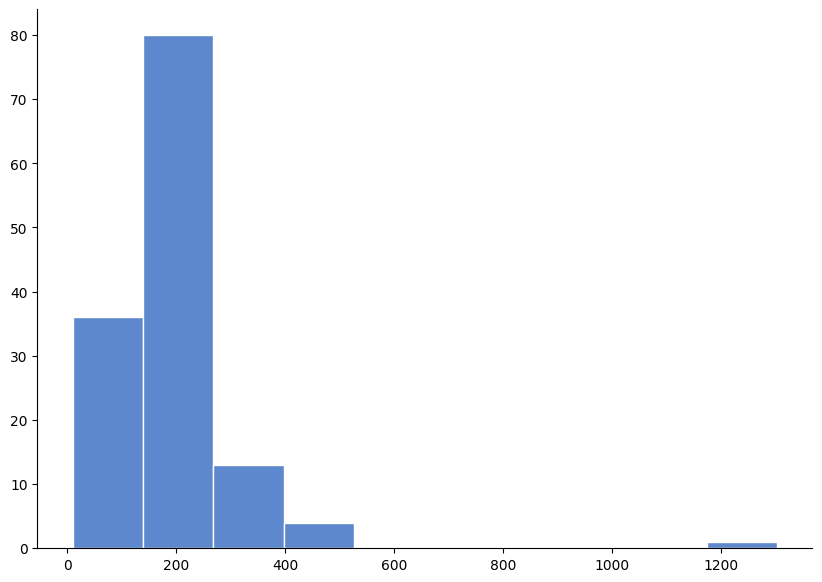

In [ ]:
print("Pays de la Loire : Nombre de trains annulés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(PL[PL.columns[4]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [ ]:
index_list_PL_2, param_list_PL_2, log_lik_list_PL_2=candidate_rupt(PL['Nombre de trains annulés'])

In [ ]:
max_value_PL_2 = max(log_lik_list_PL_2)
max_index_PL_2 =log_lik_list_PL_2.index(max_value_PL_2)

Pays de la Loire : vraissemblance selon k


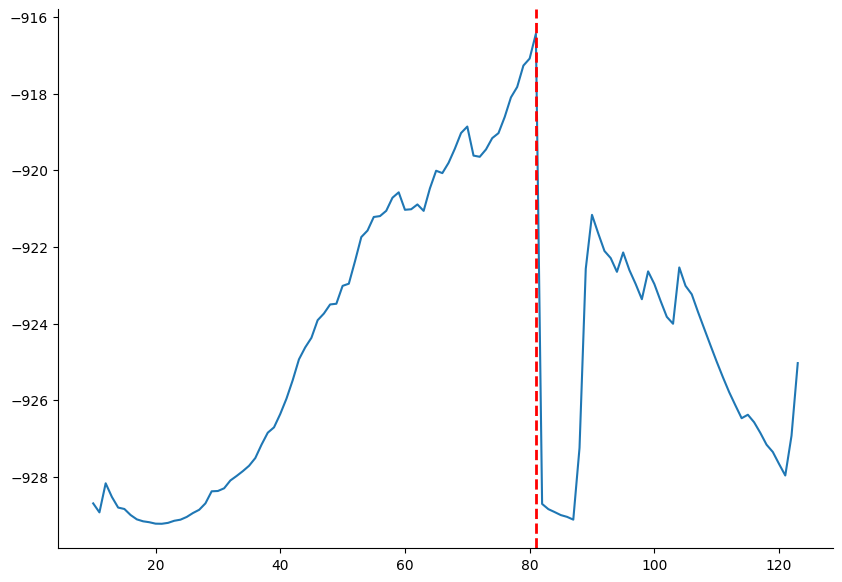

In [ ]:
print("Pays de la Loire : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_PL_2,log_lik_list_PL_2)
plt.axvline(x=index_list_PL_2[max_index_PL_2], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [ ]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_PL_2[max_index_PL_2]}, Parametres des lois:{param_list_PL_2[max_index_PL_2]}")

Maximum de vraissemblance atteint pour k= 81, Parametres des lois:[ 92.91731193  68.2340909  125.48418211 239.38415118   6.28350483]


In [ ]:
PL.loc[index_list_PL_2[max_index_PL_2]]

Date                                               2019-10
Région                                    Pays-de-la-Loire
Nombre de trains programmés                        12234.0
Nombre de trains ayant circulé                     10932.0
Nombre de trains annulés                            1302.0
Nombre de trains en retard à l'arrivée              1002.0
Taux de régularité                               90.835668
Name: 81, dtype: object

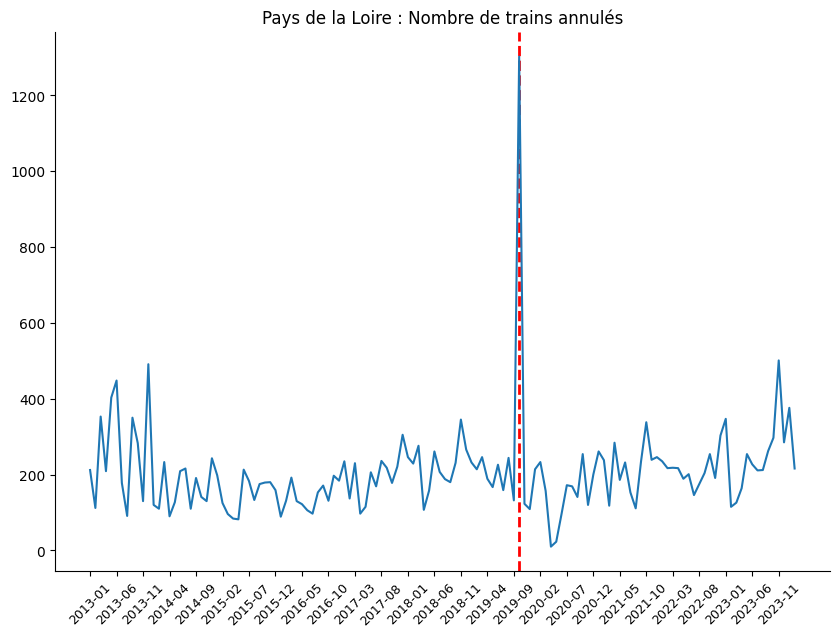

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

ensemble_affichage=[i for i in range(len(PL)) if i%5==0]
plt.xticks(ensemble_affichage,[PL[PL.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_PL_2=param_list_PL_2[max_index_PL_2]
plt.axvline(x=index_list_PL_2[max_index_PL_2], color='red', linestyle='dashed', linewidth=2)

plt.plot(PL['Date'],PL['Nombre de trains annulés'])
plt.title("Pays de la Loire : Nombre de trains annulés")

plt.show()

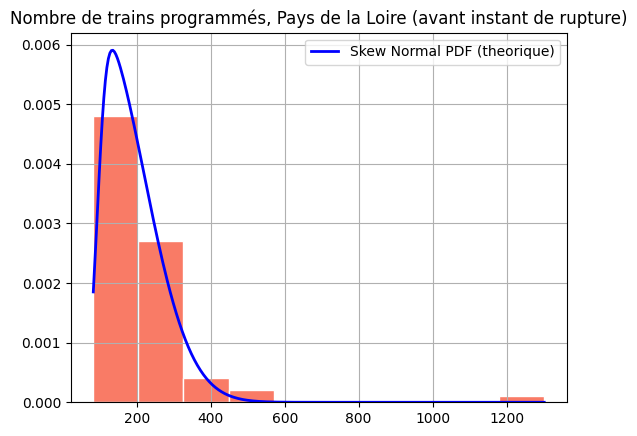

In [ ]:
k=index_list_PL_2[max_index_PL_2]

counts, bins, patches = plt.hist(PL.loc[:k,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_PL_2[4], param_PL_2[0], param_PL_2[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, Pays de la Loire (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

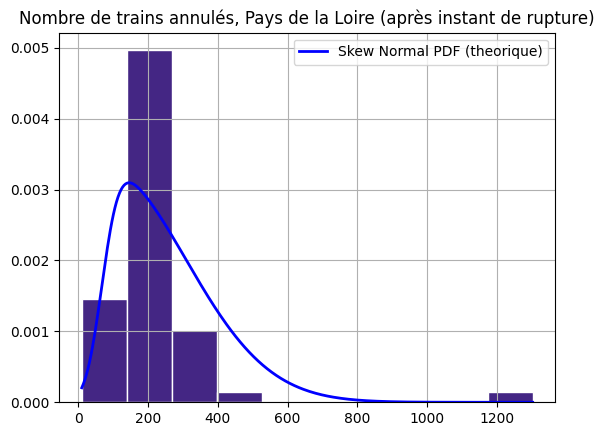

In [ ]:
counts, bins, patches = plt.hist(PL.loc[k:,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_PL_2[4], param_PL_2[1], param_PL_2[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains annulés, Pays de la Loire (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
data1 = PL.loc[k:,'Nombre de trains annulés']
data2 = PL.loc[:k,'Nombre de trains annulés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.18913943856419696
p-value: 0.17093865572310263
Fail to reject null hypothesis, distributions might be similar.


###Centre

**Trains programmés**

In [ ]:
Centre=df[df['Région']=='Centre']
Centre=Centre.reset_index(inplace=False, drop=True)

Centre.head()

,Date,Région,Nombre de trains programmés,Nombre de trains ayant circulé,Nombre de trains annulés,Nombre de trains en retard à l'arrivée,Taux de régularité
0,2013-01,Centre,9882.0,9687.0,195.0,812.0,91.617632
1,2013-02,Centre,8979.0,8830.0,149.0,629.0,92.876557
2,2013-03,Centre,9633.0,9446.0,187.0,634.0,93.288164
3,2013-04,Centre,9327.0,9241.0,86.0,561.0,93.929228
4,2013-05,Centre,9017.0,8952.0,65.0,418.0,95.330652


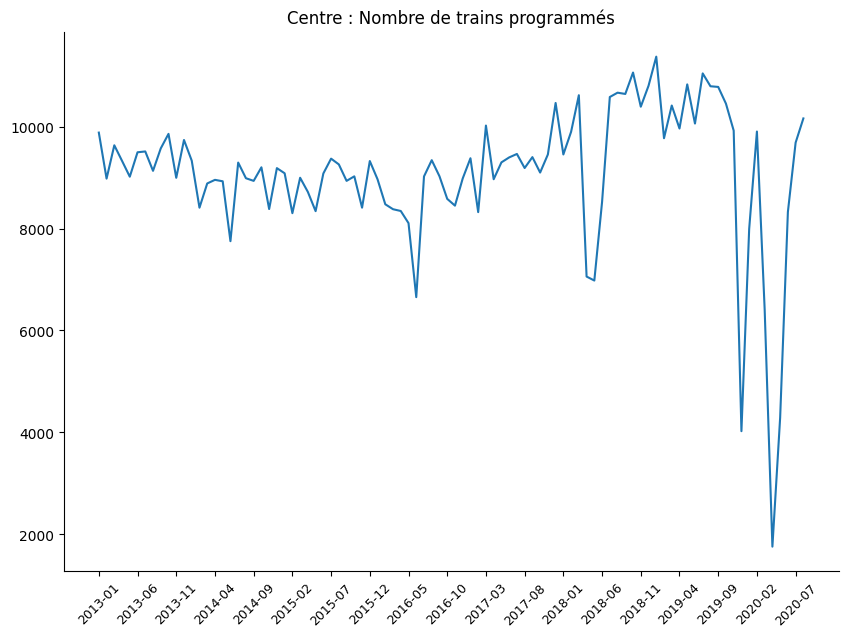

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(Centre)) if i%5==0]
plt.xticks(ensemble_affichage,[Centre[Centre.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(Centre['Date'],Centre['Nombre de trains programmés'])
plt.title("Centre : Nombre de trains programmés")

plt.show()

Centre : Nombre de trains programmés


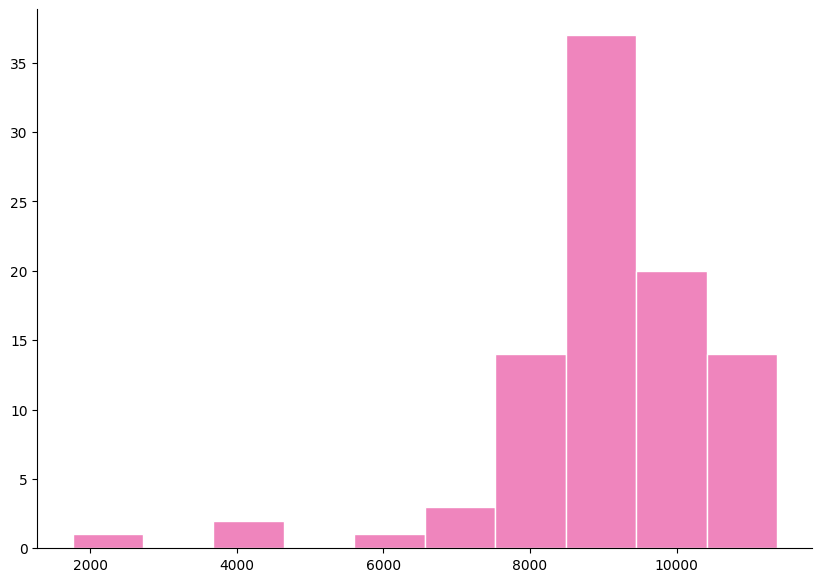

In [ ]:
print("Centre : Nombre de trains programmés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(Centre[Centre.columns[2]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [ ]:
index_list_Centre, param_list_Centre, log_lik_list_Centre=candidate_rupt(Centre['Nombre de trains programmés'])

In [ ]:
max_value_Centre = max(log_lik_list_Centre)
max_index_Centre =log_lik_list_Centre.index(max_value_Centre)

Centre : vraissemblance selon k


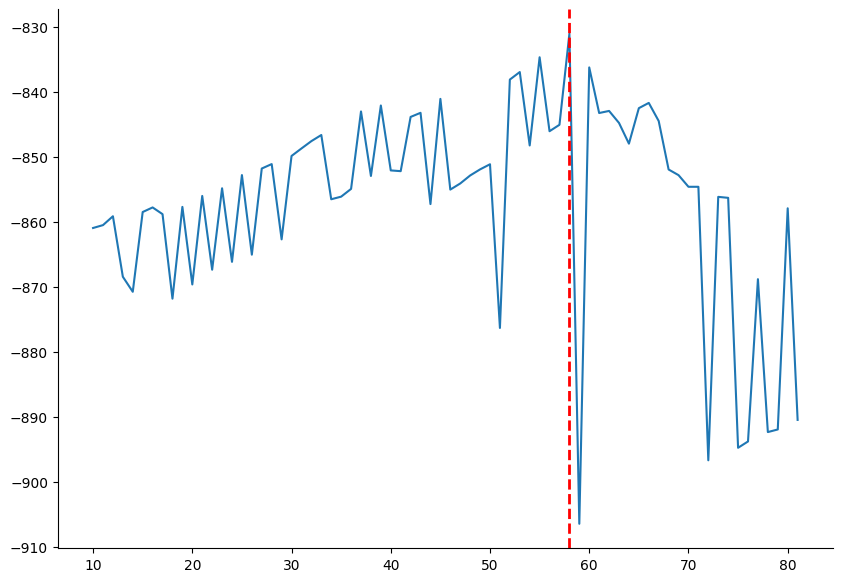

In [ ]:
print("Centre : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_Centre,log_lik_list_Centre)
plt.axvline(x=index_list_Centre[max_index_Centre], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [ ]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_Centre[max_index_Centre]}, Parametres des lois:{param_list_Centre[max_index_Centre]}")

Maximum de vraissemblance atteint pour k= 58, Parametres des lois:[ 9.68897541e+03  1.13077069e+04  9.30181789e+02  2.86048081e+03
 -4.93819171e+00]


In [ ]:
k=index_list_Centre[max_index_Centre]
Centre.loc[k]

Date                                        2017-11
Région                                       Centre
Nombre de trains programmés                  9453.0
Nombre de trains ayant circulé               9260.0
Nombre de trains annulés                      193.0
Nombre de trains en retard à l'arrivée       1212.0
Taux de régularité                        86.911447
Name: 58, dtype: object

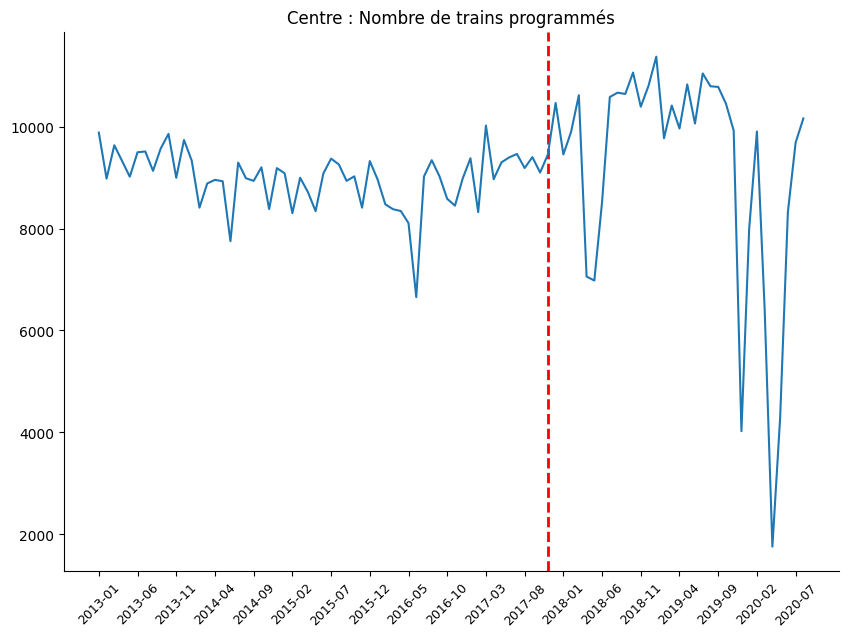

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(Centre)) if i%5==0]
plt.xticks(ensemble_affichage,[Centre[Centre.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_Centre=param_list_Centre[max_index_Centre]
plt.axvline(x=index_list_Centre[max_index_Centre], color='red', linestyle='dashed', linewidth=2)

plt.plot(Centre['Date'],Centre['Nombre de trains programmés'])
plt.title("Centre : Nombre de trains programmés")

plt.show()

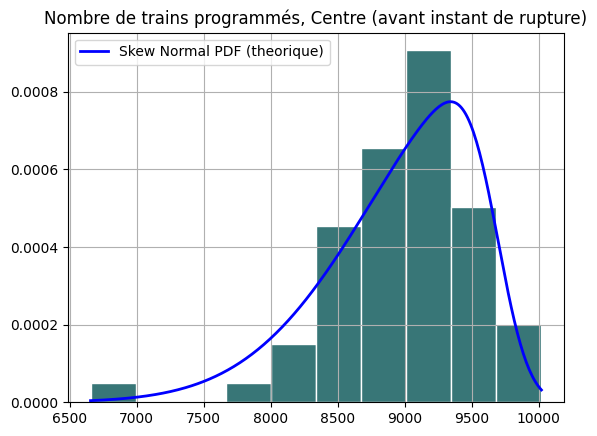

In [ ]:
counts, bins, patches = plt.hist(Centre.loc[:k,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_Centre[4], param_Centre[0], param_Centre[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, Centre (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

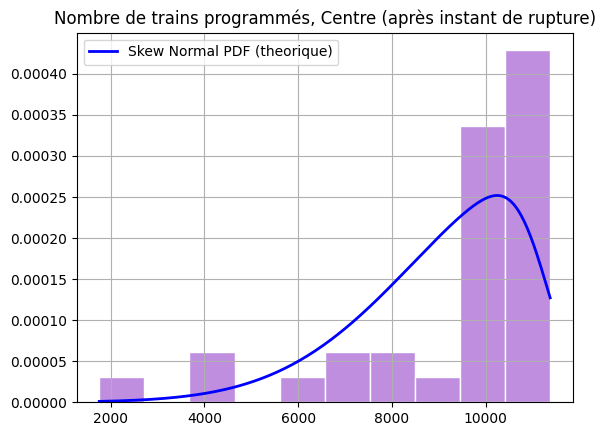

In [ ]:
counts, bins, patches = plt.hist(Centre.loc[k:,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_Centre[4], param_Centre[1], param_Centre[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, Centre (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()


In [ ]:
data1 = Centre.loc[index_list_Centre[max_index_Centre]:,'Nombre de trains programmés']
data2 = Centre.loc[:index_list_Centre[max_index_Centre],'Nombre de trains programmés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.6086739780658026
p-value: 4.6510806502752564e-08
Reject null hypothesis, distributions likely differ.


**Trains annulés**

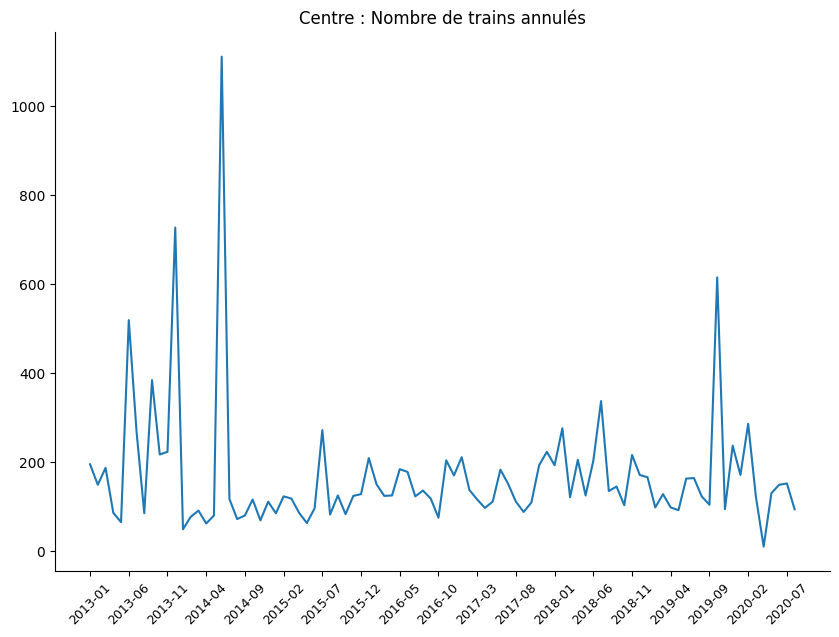

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(Centre)) if i%5==0]
plt.xticks(ensemble_affichage,[Centre[Centre.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(Centre['Date'],Centre['Nombre de trains annulés'])
plt.title("Centre : Nombre de trains annulés")

plt.show()

Centre : Nombre de trains annulés


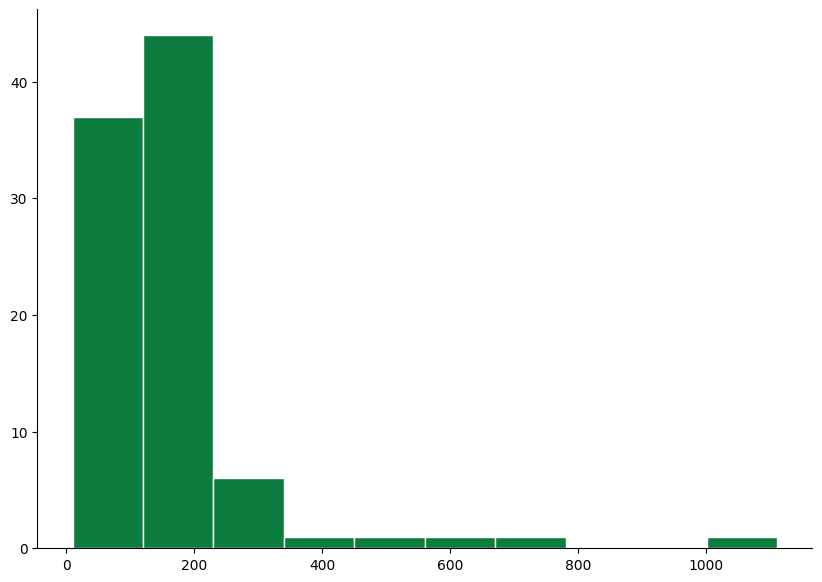

In [ ]:
print("Centre : Nombre de trains annulés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(Centre[Centre.columns[4]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [ ]:
index_list_Centre_2, param_list_Centre_2, log_lik_list_Centre_2=candidate_rupt(Centre['Nombre de trains annulés'])

In [ ]:
max_value_Centre_2 = max(log_lik_list_Centre_2)
max_index_Centre_2 =log_lik_list_Centre_2.index(max_value_Centre_2)

Centre : vraissemblance selon k


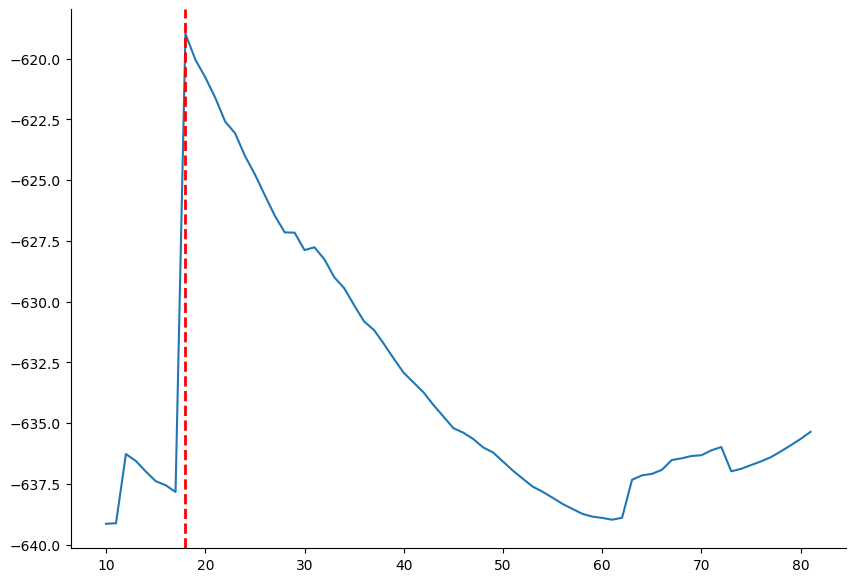

In [ ]:
print("Centre : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_Centre_2,log_lik_list_Centre_2)
plt.axvline(x=index_list_Centre_2[max_index_Centre_2], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [ ]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_Centre_2[max_index_Centre_2]}, Parametres des lois:{param_list_Centre_2[max_index_Centre_2]}")

Maximum de vraissemblance atteint pour k= 18, Parametres des lois:[  9.66957071  66.36947716 343.49648357 114.80473781   5.29457132]


In [ ]:
Centre.loc[index_list_Centre_2[max_index_Centre_2]]

Date                                        2014-07
Région                                       Centre
Nombre de trains programmés                  9294.0
Nombre de trains ayant circulé               9177.0
Nombre de trains annulés                      117.0
Nombre de trains en retard à l'arrivée        791.0
Taux de régularité                        91.380625
Name: 18, dtype: object

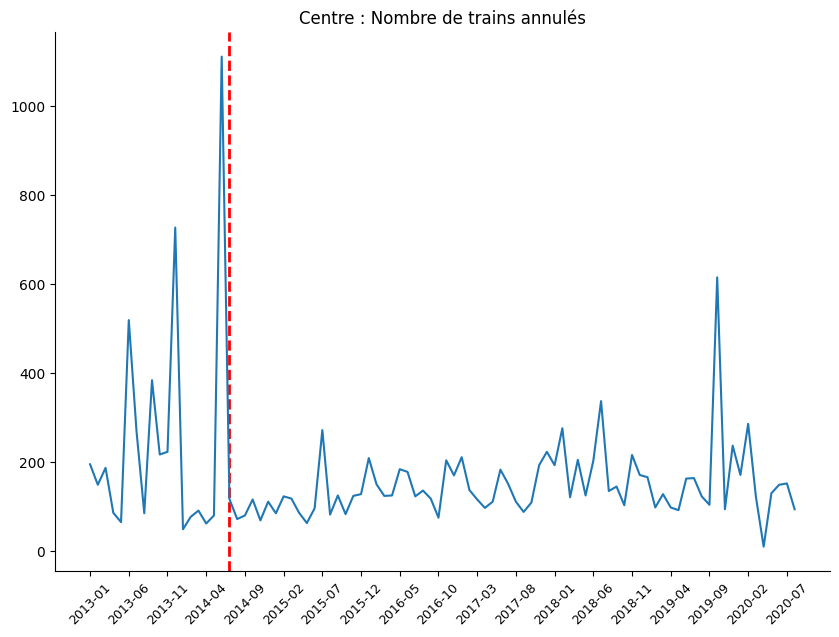

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

ensemble_affichage=[i for i in range(len(Centre)) if i%5==0]
plt.xticks(ensemble_affichage,[Centre[Centre.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_Centre_2=param_list_Centre_2[max_index_Centre_2]
plt.axvline(x=index_list_Centre_2[max_index_Centre_2], color='red', linestyle='dashed', linewidth=2)


plt.plot(Centre['Date'],Centre['Nombre de trains annulés'])
plt.title("Centre : Nombre de trains annulés")

plt.show()

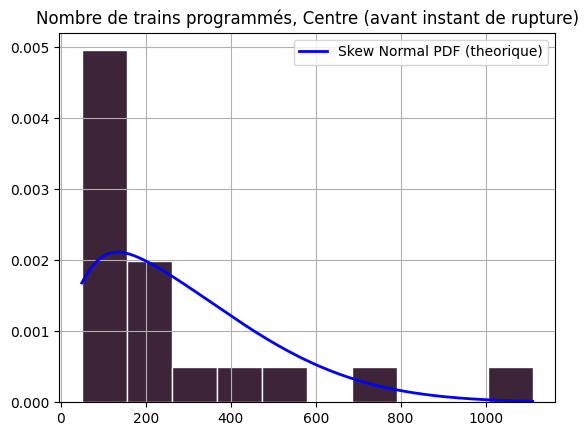

In [ ]:
k=index_list_Centre_2[max_index_Centre_2]

counts, bins, patches = plt.hist(Centre.loc[:k,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_Centre_2[4], param_Centre_2[0], param_Centre_2[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, Centre (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

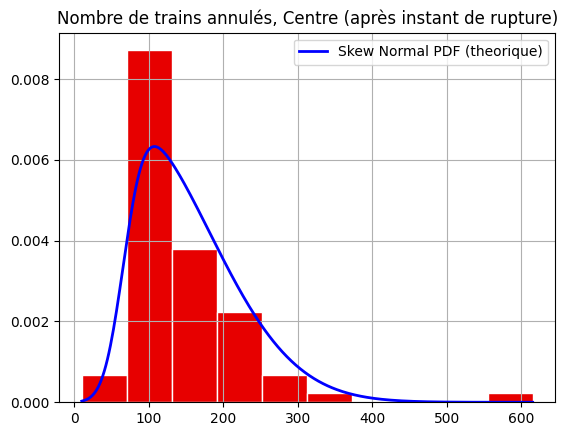

In [ ]:
counts, bins, patches = plt.hist(Centre.loc[k:,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_Centre_2[4], param_Centre_2[1], param_Centre_2[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains annulés, Centre (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
data1 = Centre.loc[k:,'Nombre de trains annulés']
data2 = Centre.loc[:k,'Nombre de trains annulés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")


Kolmogorov-Smirnov statistic: 0.27382645803698435
p-value: 0.16696825332011145
Fail to reject null hypothesis, distributions might be similar.


###Aquitaine

**Trains programmés**

In [ ]:
Aq=df[df['Région']=='Aquitaine']
Aq=Aq.reset_index(inplace=False, drop=True)

Aq.head()

,Date,Région,Nombre de trains programmés,Nombre de trains ayant circulé,Nombre de trains annulés,Nombre de trains en retard à l'arrivée,Taux de régularité
0,2013-01,Aquitaine,8099.0,8014.0,85.0,731.0,90.878463
1,2013-02,Aquitaine,7926.0,7832.0,94.0,912.0,88.355465
2,2013-03,Aquitaine,8167.0,8081.0,86.0,822.0,89.827992
3,2013-04,Aquitaine,8329.0,8236.0,93.0,967.0,88.258864
4,2013-05,Aquitaine,8722.0,8656.0,66.0,833.0,90.376617


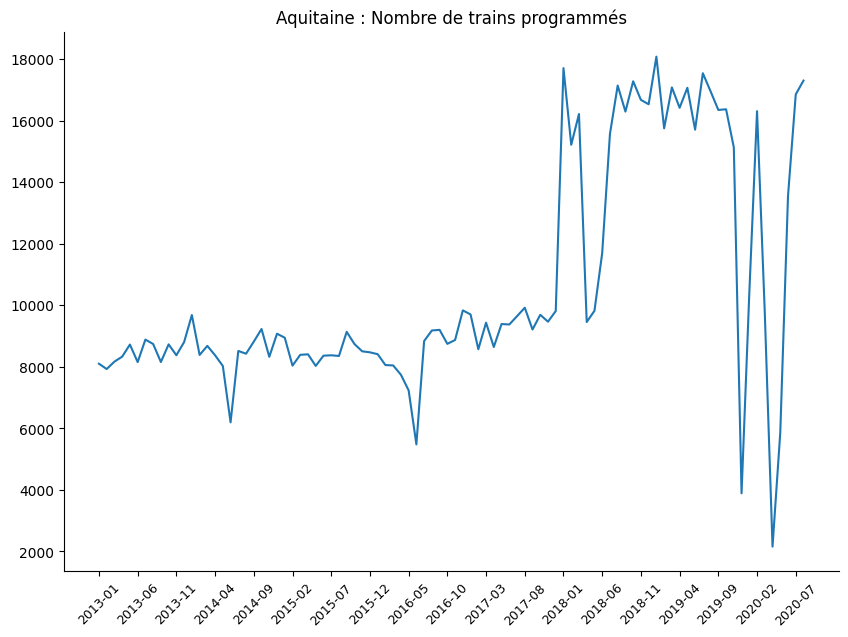

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(Aq)) if i%5==0]
plt.xticks(ensemble_affichage,[Aq[Aq.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(Aq['Date'],Aq['Nombre de trains programmés'])
plt.title("Aquitaine : Nombre de trains programmés")

plt.show()

Aquitaine : Nombre de trains programmés


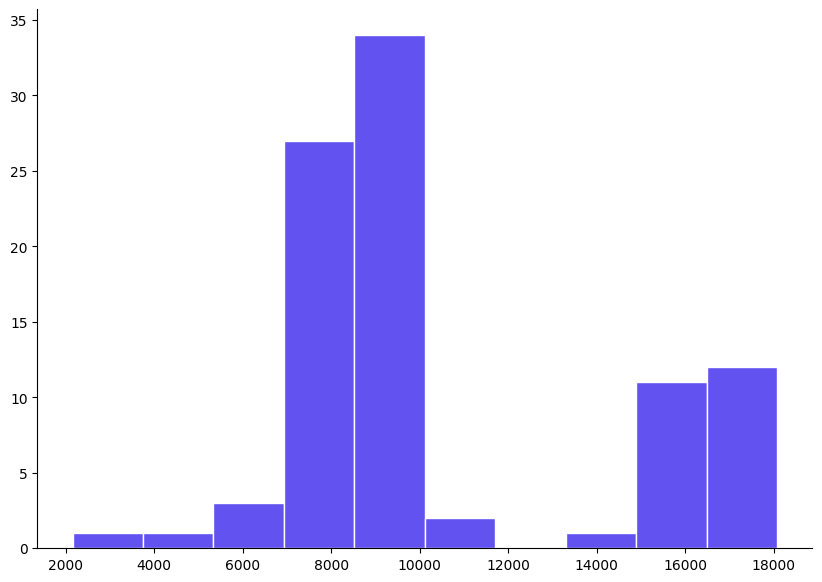

In [ ]:
print("Aquitaine : Nombre de trains programmés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(Aq[Aq.columns[2]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [ ]:
index_list_Aq, param_list_Aq, log_lik_list_Aq=candidate_rupt(Aq['Nombre de trains programmés'])

In [ ]:
max_value_Aq = max(log_lik_list_Aq)
max_index_Aq =log_lik_list_Aq.index(max_value_Aq)

Aquitaine : vraissemblance selon k


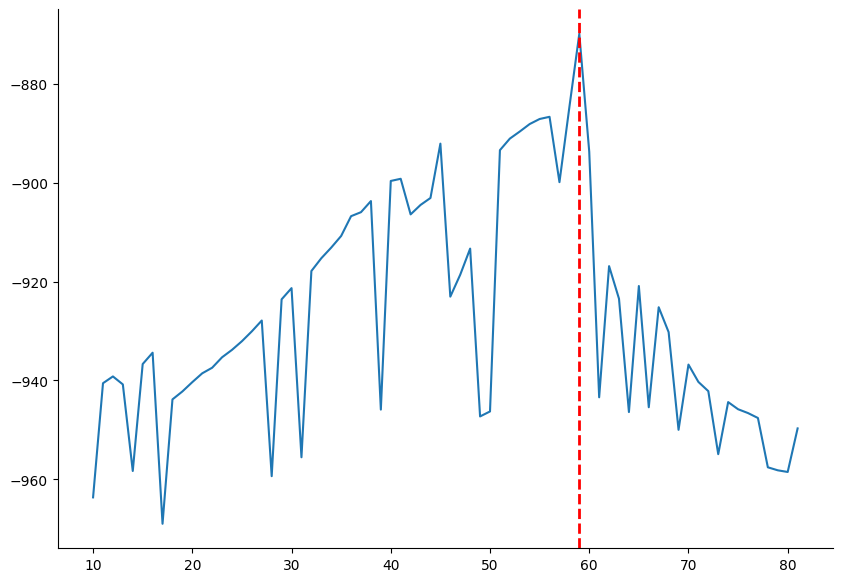

In [ ]:
print("Aquitaine : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_Aq,log_lik_list_Aq)
plt.axvline(x=index_list_Aq[max_index_Aq], color='red', linestyle='dashed', linewidth=2)

plt.show()


In [ ]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_Aq[max_index_Aq]}, Parametres des lois:{param_list_Aq[max_index_Aq]}")

Maximum de vraissemblance atteint pour k= 59, Parametres des lois:[ 9.79476421e+03  1.80417857e+04  1.43618833e+03  5.57450614e+03
 -1.31829067e+01]


In [ ]:
k=index_list_Aq[max_index_Aq]
Aq.loc[k]

Date                                        2017-12
Région                                    Aquitaine
Nombre de trains programmés                  9810.0
Nombre de trains ayant circulé               9537.0
Nombre de trains annulés                      273.0
Nombre de trains en retard à l'arrivée       1229.0
Taux de régularité                        87.113348
Name: 59, dtype: object

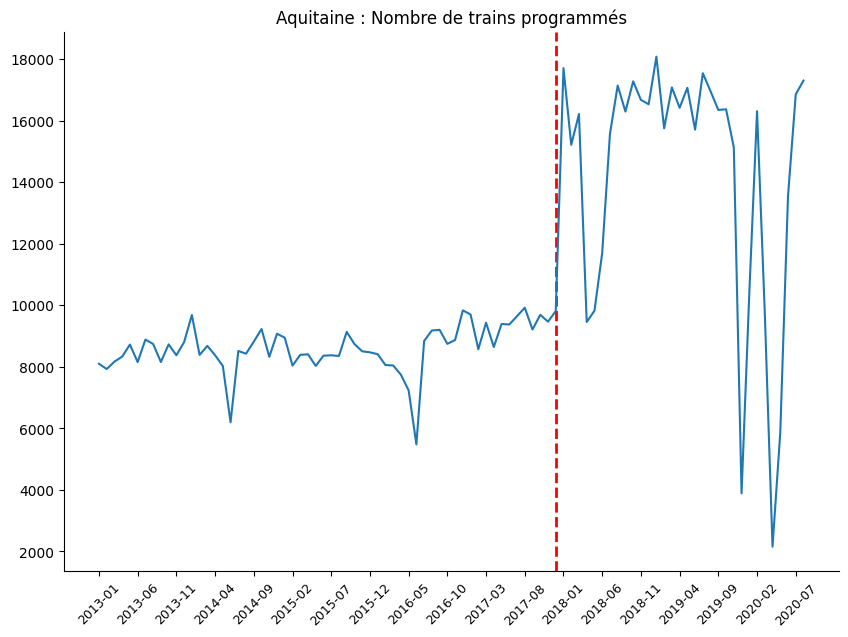

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(Aq)) if i%5==0]
plt.xticks(ensemble_affichage,[Aq[Aq.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_Aq=param_list_Aq[max_index_Aq]
plt.axvline(x=index_list_Aq[max_index_Aq], color='red', linestyle='dashed', linewidth=2)


plt.plot(Aq['Date'],Aq['Nombre de trains programmés'])
plt.title("Aquitaine : Nombre de trains programmés")

plt.show()

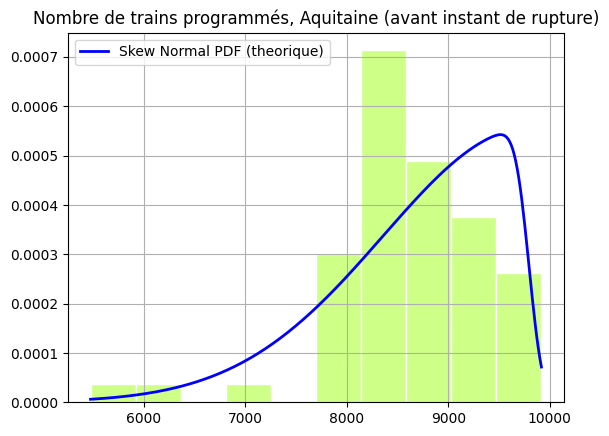

In [ ]:
counts, bins, patches = plt.hist(Aq.loc[:k,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_Aq[4], param_Aq[0], param_Aq[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, Aquitaine (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

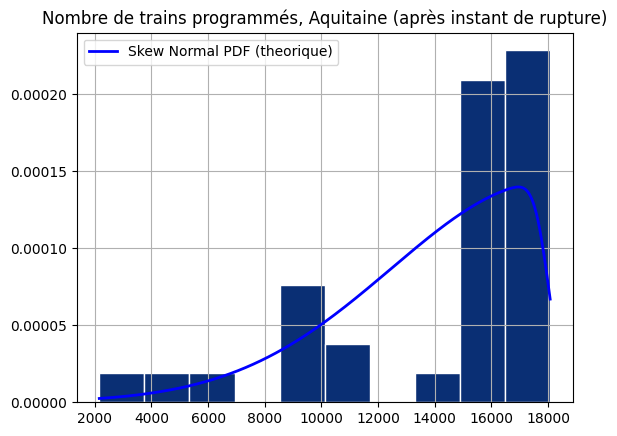

In [ ]:
counts, bins, patches = plt.hist(Aq.loc[k:,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_Aq[4], param_Aq[1], param_Aq[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, Aquitaine (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
data1 = Aq.loc[index_list_Aq[max_index_Aq]:,'Nombre de trains programmés']
data2 = Aq.loc[:index_list_Aq[max_index_Aq],'Nombre de trains programmés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.8287878787878787
p-value: 1.5789521915581405e-15
Reject null hypothesis, distributions likely differ.


**Trains annulés**

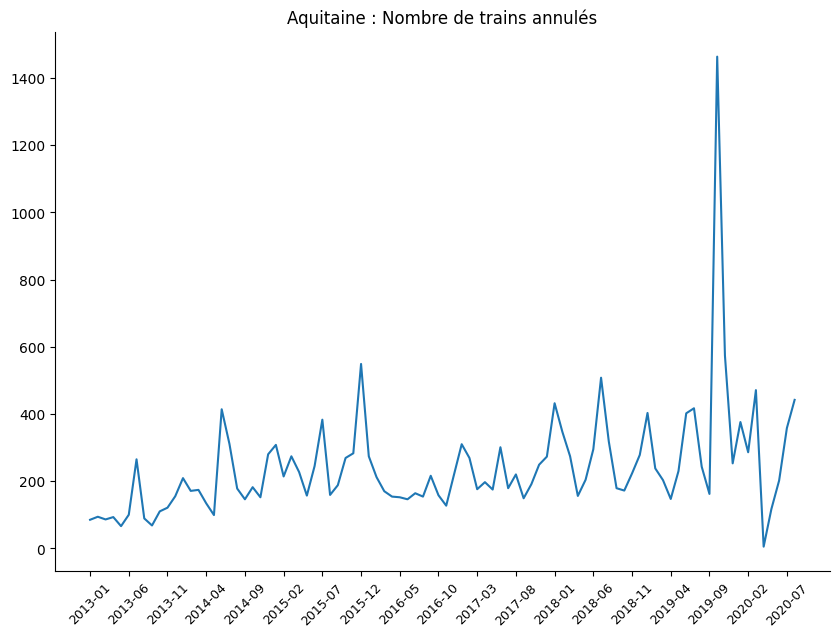

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(Aq)) if i%5==0]
plt.xticks(ensemble_affichage,[Aq[Aq.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(Aq['Date'],Aq['Nombre de trains annulés'])
plt.title("Aquitaine : Nombre de trains annulés")

plt.show()

Aquitaine : Nombre de trains annulés


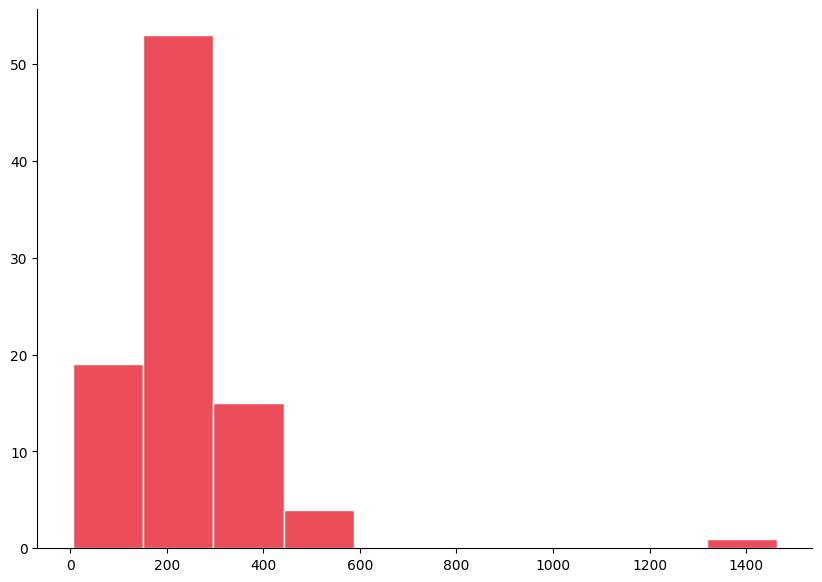

In [ ]:
print("Aquitaine : Nombre de trains annulés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(Aq[Aq.columns[4]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [ ]:
index_list_Aq_2, param_list_Aq_2, log_lik_list_Aq_2=candidate_rupt(Aq['Nombre de trains annulés'])

In [ ]:
max_value_Aq_2 = max(log_lik_list_Aq_2)
max_index_Aq_2 =log_lik_list_Aq_2.index(max_value_Aq_2)

Aquitaine : vraissemblance selon k


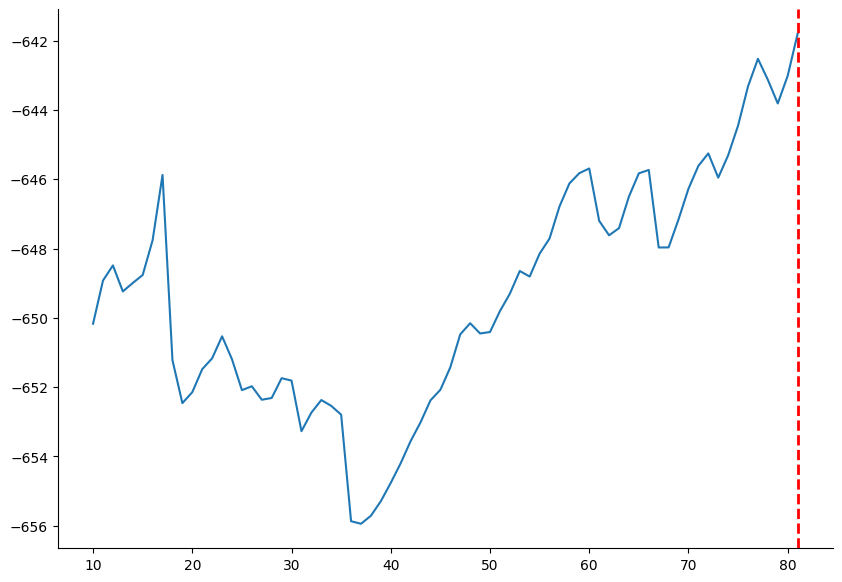

In [ ]:
print("Aquitaine : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_Aq_2,log_lik_list_Aq_2)
plt.axvline(x=index_list_Aq_2[max_index_Aq_2], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [ ]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_Aq_2[max_index_Aq_2]}, Parametres des lois:{param_list_Aq_2[max_index_Aq_2]}")

Maximum de vraissemblance atteint pour k= 81, Parametres des lois:[ 98.60025567  39.88619881 155.60519799 515.51660342   4.87537057]


In [ ]:
Aq.loc[index_list_Aq_2[max_index_Aq_2]]

Date                                        2019-10
Région                                    Aquitaine
Nombre de trains programmés                 16366.0
Nombre de trains ayant circulé              14902.0
Nombre de trains annulés                     1464.0
Nombre de trains en retard à l'arrivée       1256.0
Taux de régularité                        91.570928
Name: 81, dtype: object

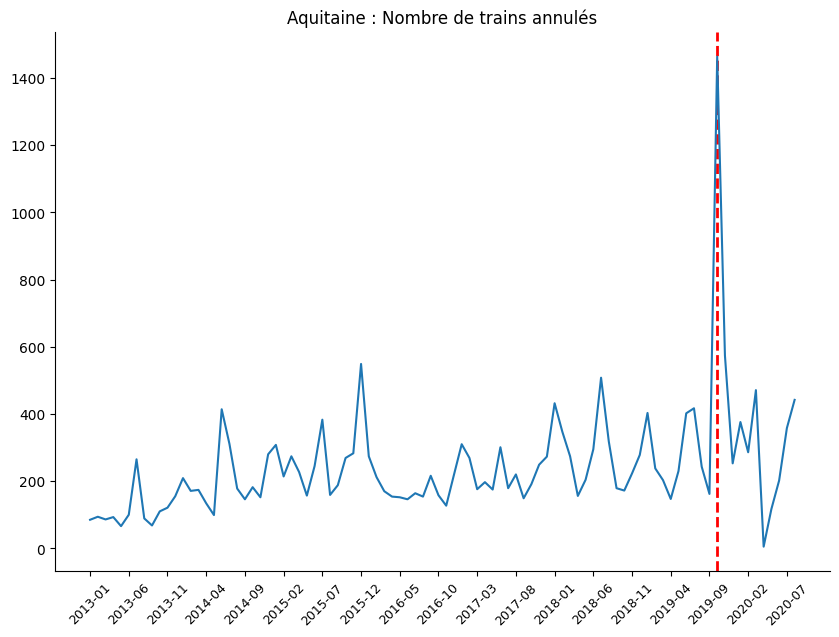

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

ensemble_affichage=[i for i in range(len(Aq)) if i%5==0]
plt.xticks(ensemble_affichage,[Aq[Aq.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_Aq_2=param_list_Aq_2[max_index_Aq_2]
plt.axvline(x=index_list_Aq_2[max_index_Aq_2], color='red', linestyle='dashed', linewidth=2)


plt.plot(Aq['Date'],Aq['Nombre de trains annulés'])
plt.title("Aquitaine : Nombre de trains annulés")

plt.show()

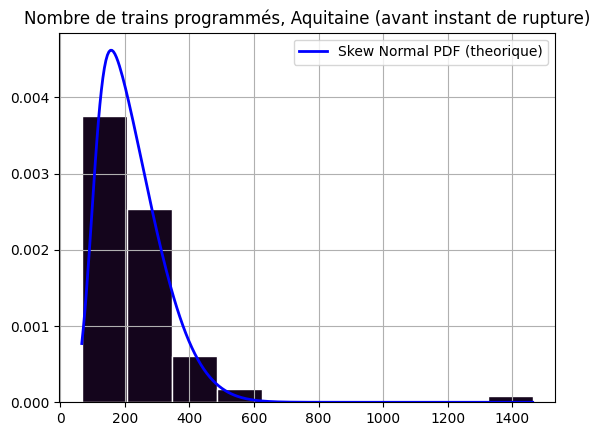

In [ ]:
k=index_list_Aq_2[max_index_Aq_2]

counts, bins, patches = plt.hist(Aq.loc[:k,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_Aq_2[4], param_Aq_2[0], param_Aq_2[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, Aquitaine (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

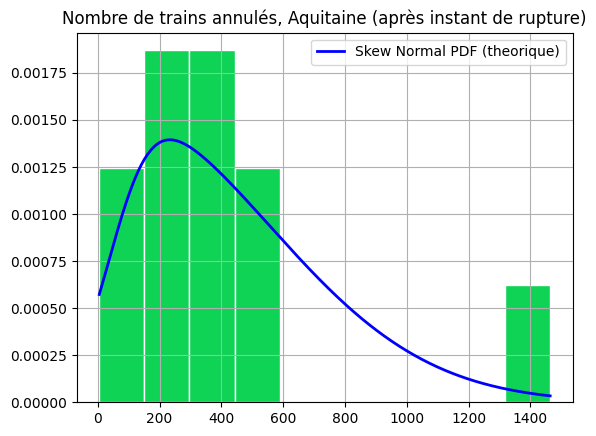

In [ ]:
counts, bins, patches = plt.hist(Aq.loc[k:,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_Aq_2[4], param_Aq_2[1], param_Aq_2[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains annulés, Aquitaine (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
data1 = Aq.loc[k:,'Nombre de trains annulés']
data2 = Aq.loc[:k,'Nombre de trains annulés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.44124168514412415
p-value: 0.03042677774966097
Reject null hypothesis, distributions likely differ.


###Grand Est

**Trains programmés**

In [ ]:
GE=df[df['Région']=='Grand Est']
GE=GE.reset_index(inplace=False, drop=True)

GE.head()

,Date,Région,Nombre de trains programmés,Nombre de trains ayant circulé,Nombre de trains annulés,Nombre de trains en retard à l'arrivée,Taux de régularité
0,2017-01,Grand Est,44541.0,43326.0,1215.0,2816.0,93.500439
1,2017-02,Grand Est,38595.0,37318.0,1277.0,1819.0,95.125677
2,2017-03,Grand Est,44810.0,43948.0,862.0,1721.0,96.084008
3,2017-04,Grand Est,40278.0,39538.0,740.0,1612.0,95.922910
4,2017-05,Grand Est,44045.0,43420.0,625.0,1858.0,95.720866


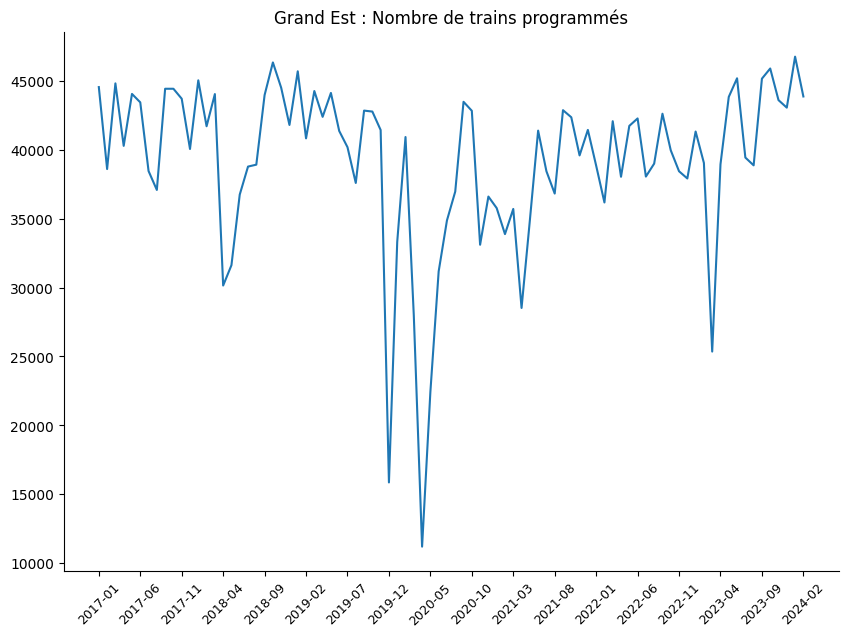

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(GE)) if i%5==0]
plt.xticks(ensemble_affichage,[GE[GE.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(GE['Date'],GE['Nombre de trains programmés'])
plt.title("Grand Est : Nombre de trains programmés")

plt.show()

Grand Est : Nombre de trains programmés


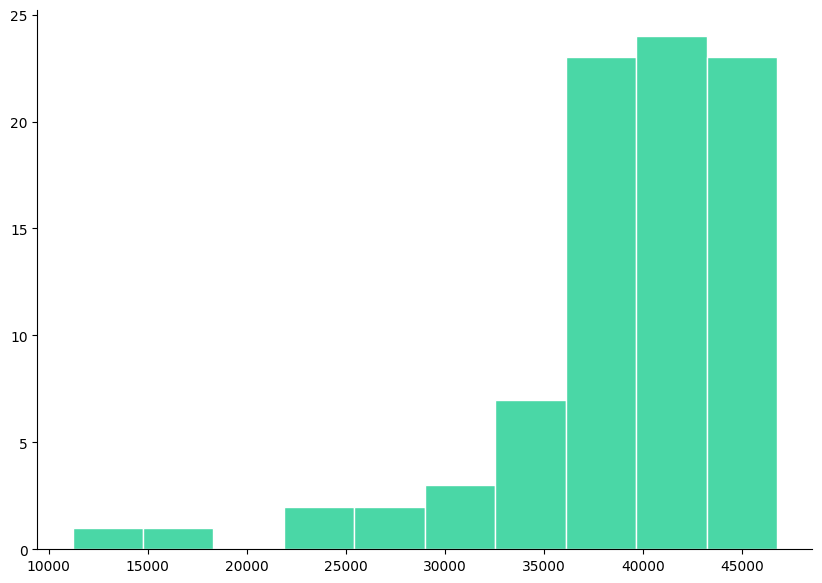

In [ ]:
print("Grand Est : Nombre de trains programmés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(GE[GE.columns[2]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [ ]:
index_list_GE, param_list_GE, log_lik_list_GE=candidate_rupt(GE['Nombre de trains programmés'])

In [ ]:
max_value_GE = max(log_lik_list_GE)
max_index_GE =log_lik_list_GE.index(max_value_GE)

Grand Est : vraissemblance selon k


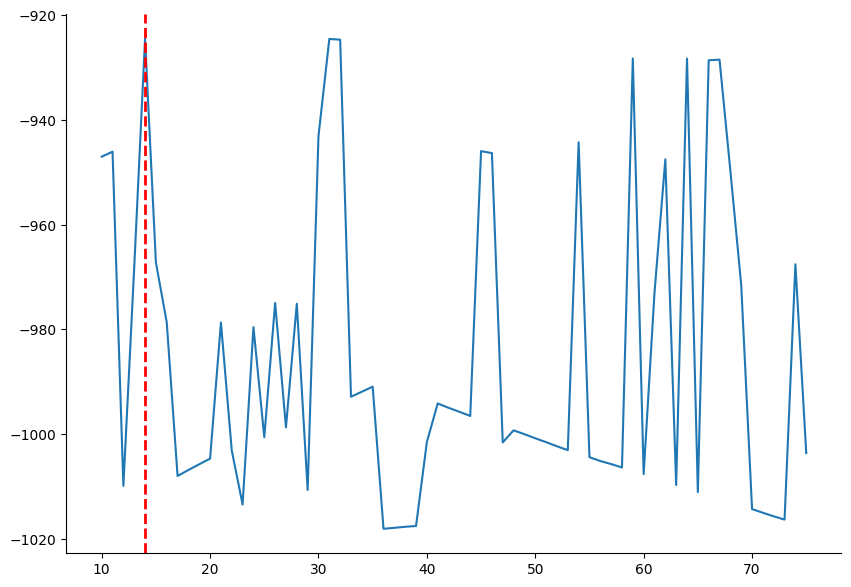

In [ ]:
print("Grand Est : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_GE,log_lik_list_GE)
plt.axvline(x=index_list_GE[max_index_GE], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [ ]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_GE[max_index_GE]}, Parametres des lois:{param_list_GE[max_index_GE]}")

Maximum de vraissemblance atteint pour k= 14, Parametres des lois:[ 4.51548704e+04  4.63578339e+04  3.93277015e+03  1.01627227e+04
 -2.08555705e+01]


In [ ]:
k=index_list_GE[max_index_GE]
GE.loc[k]

Date                                        2018-03
Région                                    Grand Est
Nombre de trains programmés                 44033.0
Nombre de trains ayant circulé              43038.0
Nombre de trains annulés                      995.0
Nombre de trains en retard à l'arrivée       2393.0
Taux de régularité                        94.439797
Name: 14, dtype: object

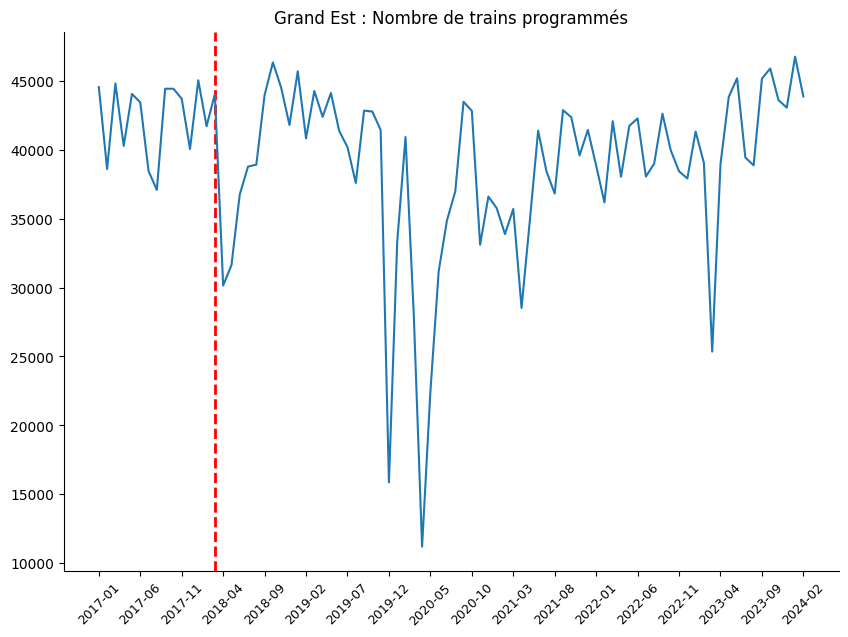

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(GE)) if i%5==0]
plt.xticks(ensemble_affichage,[GE[GE.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_GE=param_list_GE[max_index_GE]
plt.axvline(x=index_list_GE[max_index_GE], color='red', linestyle='dashed', linewidth=2)

plt.plot(GE['Date'],GE['Nombre de trains programmés'])
plt.title("Grand Est : Nombre de trains programmés")

plt.show()

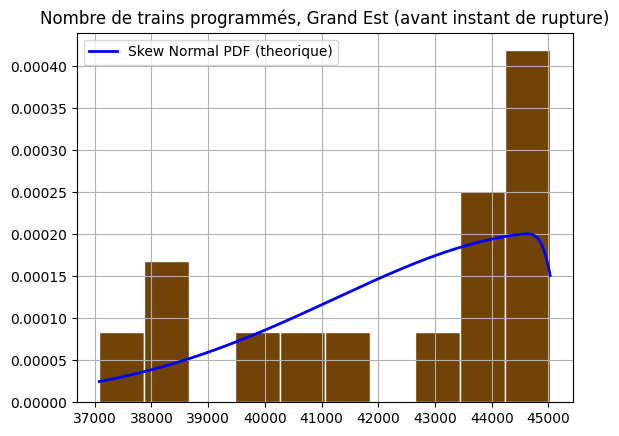

In [ ]:
counts, bins, patches = plt.hist(GE.loc[:k,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_GE[4], param_GE[0], param_GE[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, Grand Est (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

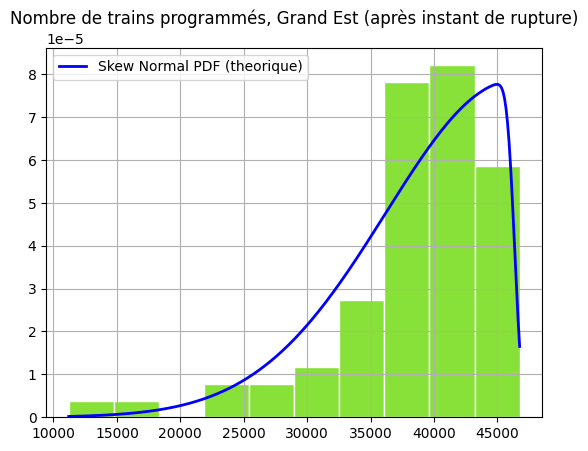

In [ ]:
counts, bins, patches = plt.hist(GE.loc[k:,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_GE[4], param_GE[1], param_GE[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, Grand Est (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
data1 = GE.loc[index_list_GE[max_index_GE]:,'Nombre de trains programmés']
data2 = GE.loc[:index_list_GE[max_index_GE],'Nombre de trains programmés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.39166666666666666
p-value: 0.032159370167422464
Reject null hypothesis, distributions likely differ.


**Train annulés**


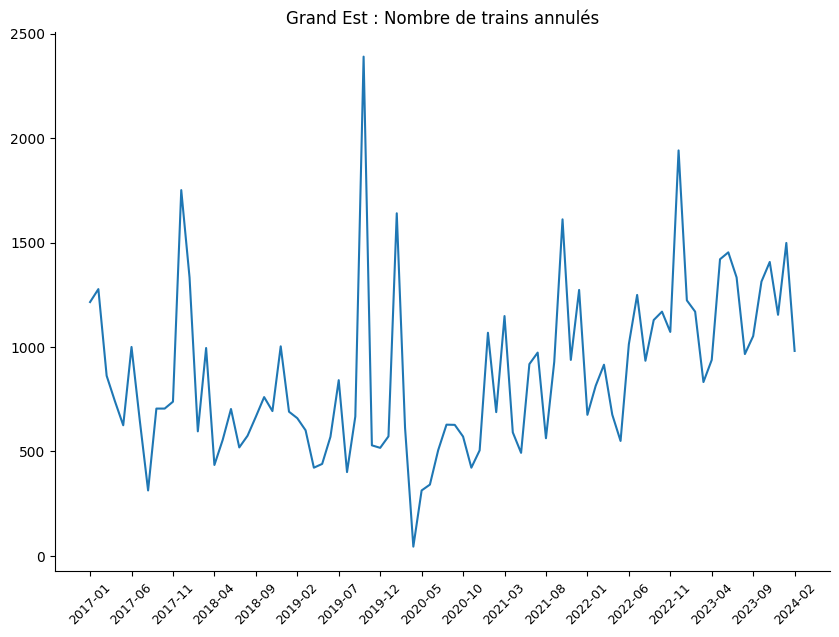

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(GE)) if i%5==0]
plt.xticks(ensemble_affichage,[GE[GE.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(GE['Date'],GE['Nombre de trains annulés'])
plt.title("Grand Est : Nombre de trains annulés")

plt.show()

Grand Est : Nombre de trains annulés


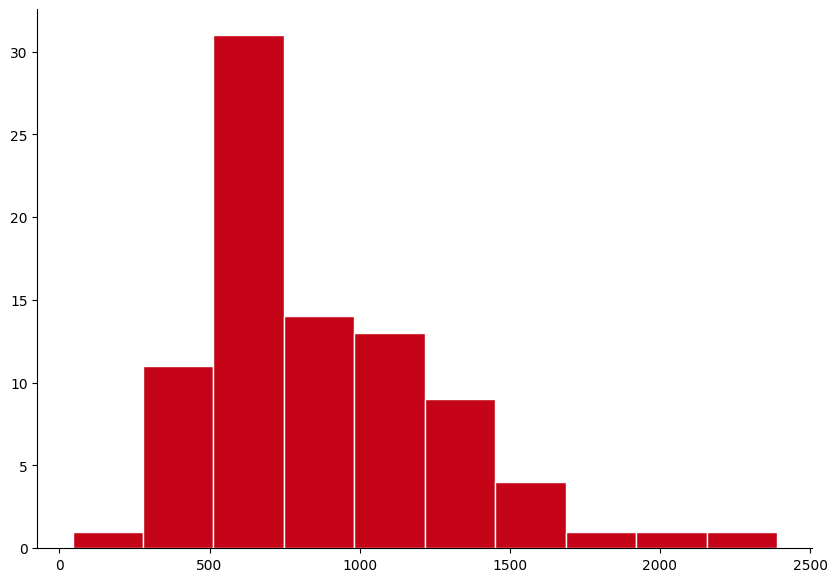

In [ ]:
print("Grand Est : Nombre de trains annulés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(GE[GE.columns[4]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [ ]:
index_list_GE_2, param_list_GE_2, log_lik_list_GE_2=candidate_rupt(GE['Nombre de trains annulés'])

In [ ]:
max_value_GE_2 = max(log_lik_list_GE_2)
max_index_GE_2 =log_lik_list_GE_2.index(max_value_GE_2)

Grand Est : vraissemblance selon k


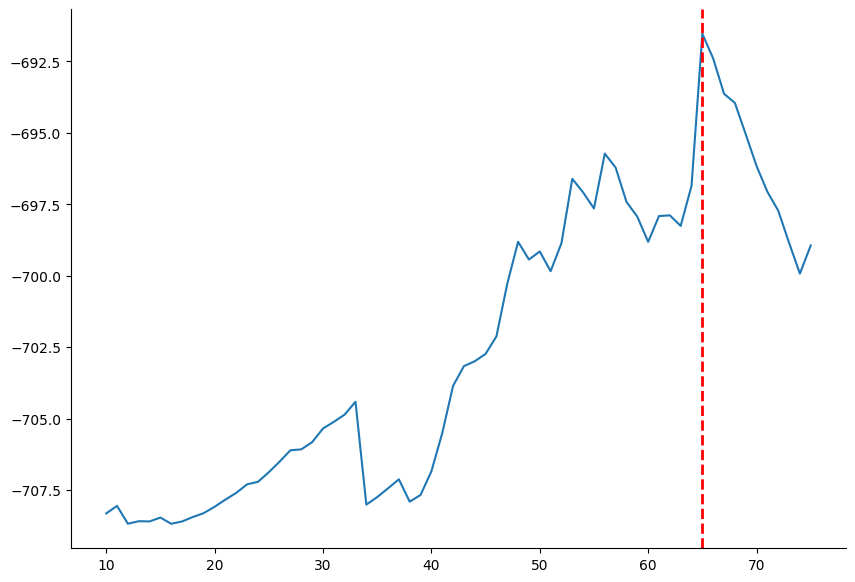

In [ ]:
print("Grand Est : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_GE_2,log_lik_list_GE_2)
plt.axvline(x=index_list_GE_2[max_index_GE_2], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [ ]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_GE_2[max_index_GE_2]}, Parametres des lois:{param_list_GE_2[max_index_GE_2]}")

Maximum de vraissemblance atteint pour k= 65, Parametres des lois:[361.04136144 910.05568395 556.32135901 377.77321397   4.00633406]


In [ ]:
GE.loc[index_list_GE_2[max_index_GE_2]]

Date                                        2022-06
Région                                    Grand Est
Nombre de trains programmés                 42266.0
Nombre de trains ayant circulé              41393.0
Nombre de trains annulés                     1013.0
Nombre de trains en retard à l'arrivée       2113.0
Taux de régularité                             94.9
Name: 65, dtype: object

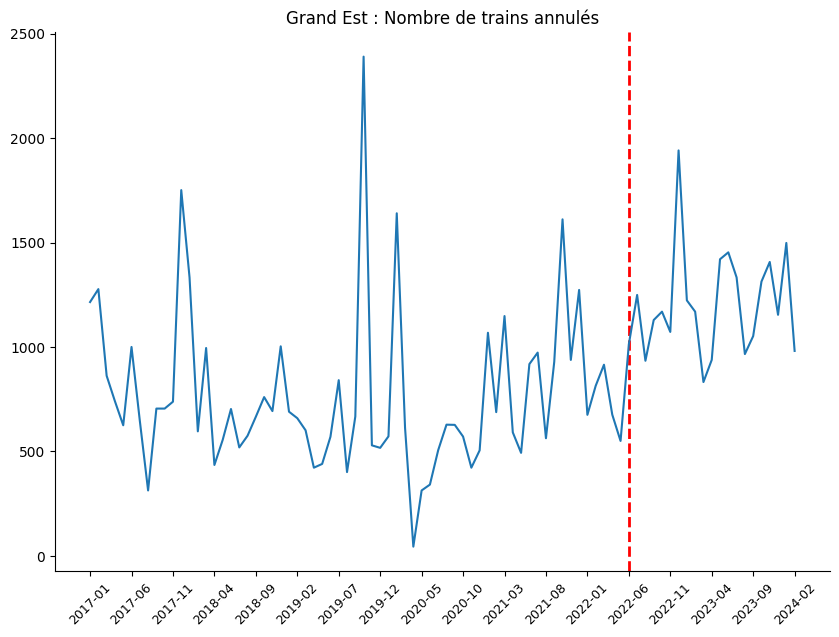

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

ensemble_affichage=[i for i in range(len(GE)) if i%5==0]
plt.xticks(ensemble_affichage,[GE[GE.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_GE_2=param_list_GE_2[max_index_GE_2]
plt.axvline(x=index_list_GE_2[max_index_GE_2], color='red', linestyle='dashed', linewidth=2)

plt.plot(GE['Date'],GE['Nombre de trains annulés'])
plt.title("Grand Est : Nombre de trains annulés")

plt.show()


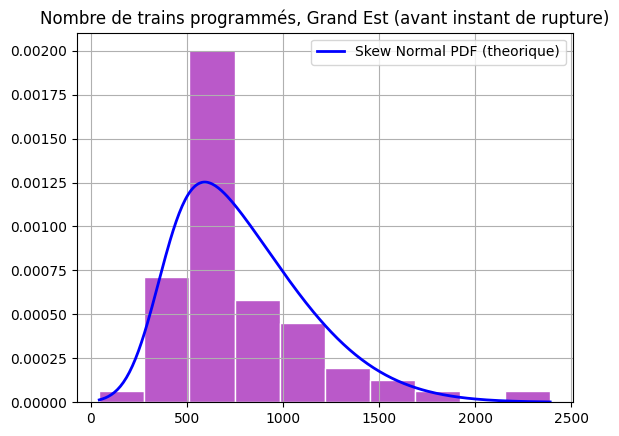

In [ ]:
k=index_list_GE_2[max_index_GE_2]

counts, bins, patches = plt.hist(GE.loc[:k,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_GE_2[4], param_GE_2[0], param_GE_2[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, Grand Est (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()


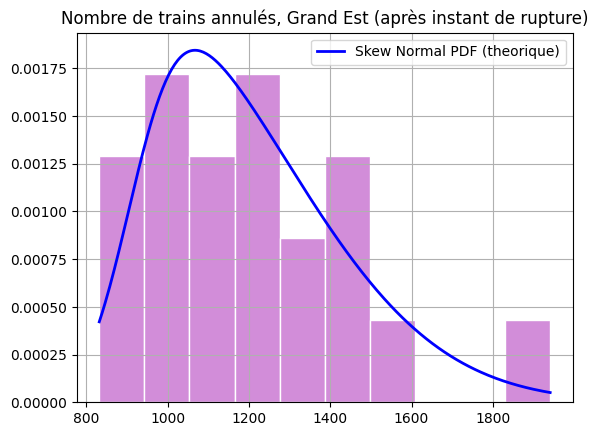

In [ ]:
counts, bins, patches = plt.hist(GE.loc[k:,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_GE_2[4], param_GE_2[1], param_GE_2[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains annulés, Grand Est (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
data1 = GE.loc[k:,'Nombre de trains annulés']
data2 = GE.loc[:k,'Nombre de trains annulés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.70995670995671
p-value: 2.2071186335499754e-08
Reject null hypothesis, distributions likely differ.


###Hauts-de-France

**Trains programmés**

In [ ]:
HF=df[df['Région']=='Hauts-de-France']
HF=HF.reset_index(inplace=False, drop=True)

HF.head()

,Date,Région,Nombre de trains programmés,Nombre de trains ayant circulé,Nombre de trains annulés,Nombre de trains en retard à l'arrivée,Taux de régularité
0,2018-01,Hauts-de-France,29552.0,28979.0,573.0,2808.0,90.310225
1,2018-02,Hauts-de-France,26751.0,26064.0,687.0,3021.0,88.409300
2,2018-03,Hauts-de-France,28029.0,27498.0,531.0,2221.0,91.923049
3,2018-04,Hauts-de-France,15738.0,15334.0,394.0,1773.0,88.437459
4,2018-05,Hauts-de-France,20318.0,19790.0,528.0,2548.0,87.124811


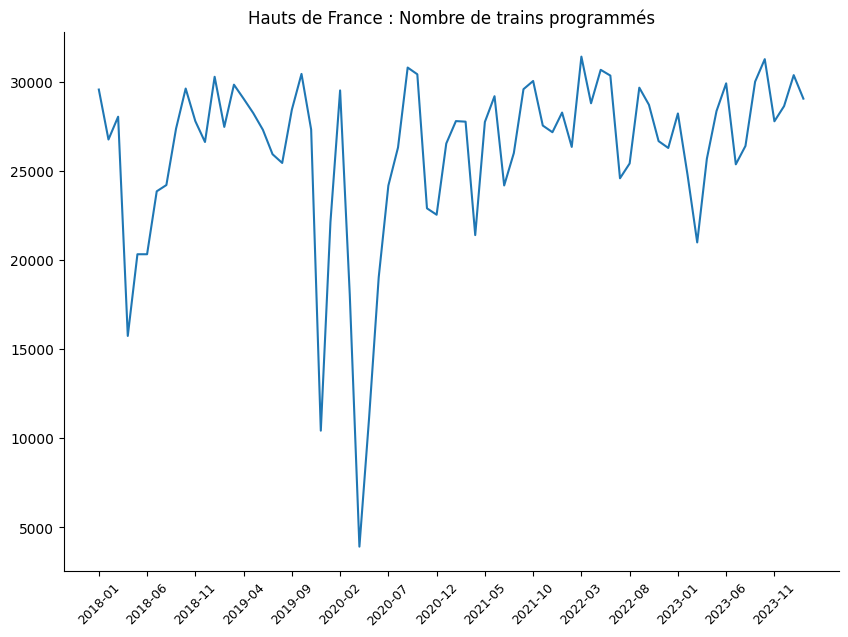

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(HF)) if i%5==0]
plt.xticks(ensemble_affichage,[HF[HF.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(HF['Date'],HF['Nombre de trains programmés'])
plt.title("Hauts de France : Nombre de trains programmés")

plt.show()

Hauts de France: Nombre de trains programmés


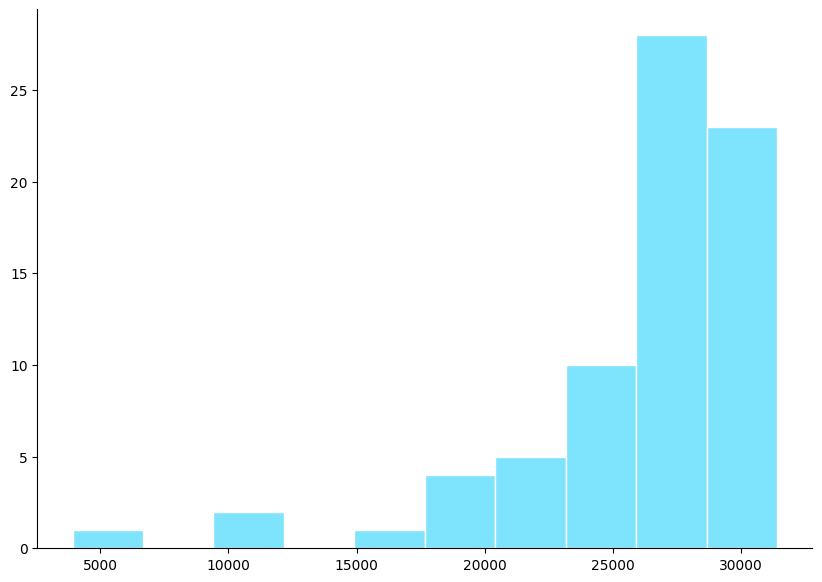

In [ ]:
print("Hauts de France: Nombre de trains programmés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(HF[HF.columns[2]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [ ]:
index_list_HF, param_list_HF, log_lik_list_HF=candidate_rupt(HF['Nombre de trains programmés'])

In [ ]:
max_value_HF = max(log_lik_list_HF)
max_index_HF =log_lik_list_HF.index(max_value_HF)

Hauts de France : vraissemblance selon k


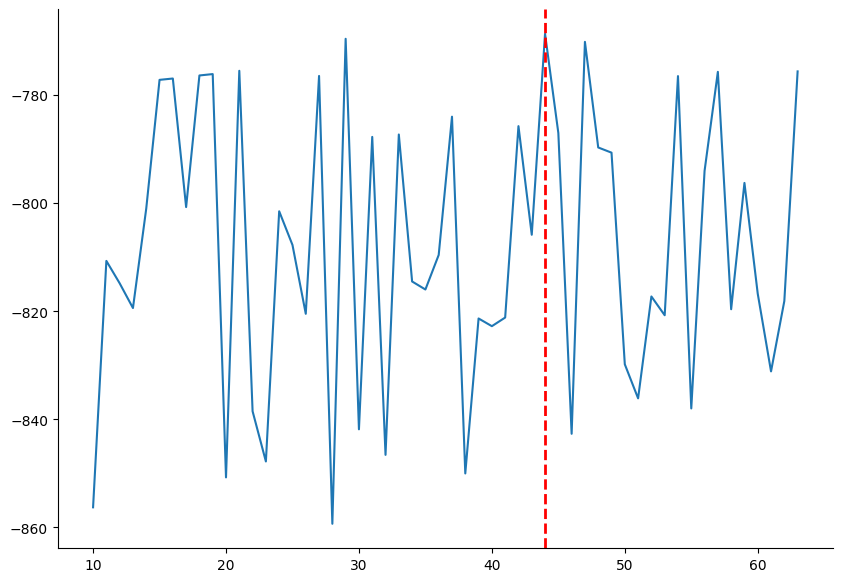

In [ ]:
print("Hauts de France : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_HF,log_lik_list_HF)
plt.axvline(x=index_list_HF[max_index_HF], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [ ]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_HF[max_index_HF]}, Parametres des lois:{param_list_HF[max_index_HF]}")

Maximum de vraissemblance atteint pour k= 44, Parametres des lois:[30788.66712007 31398.9005275   8249.19875438  4146.02610092
 -6679.83279816]


In [ ]:
k=index_list_HF[max_index_HF]
HF.loc[k]

Date                                              2021-09
Région                                    Hauts-de-France
Nombre de trains programmés                       29572.0
Nombre de trains ayant circulé                    28260.0
Nombre de trains annulés                           1312.0
Nombre de trains en retard à l'arrivée             2766.0
Taux de régularité                              90.212314
Name: 44, dtype: object

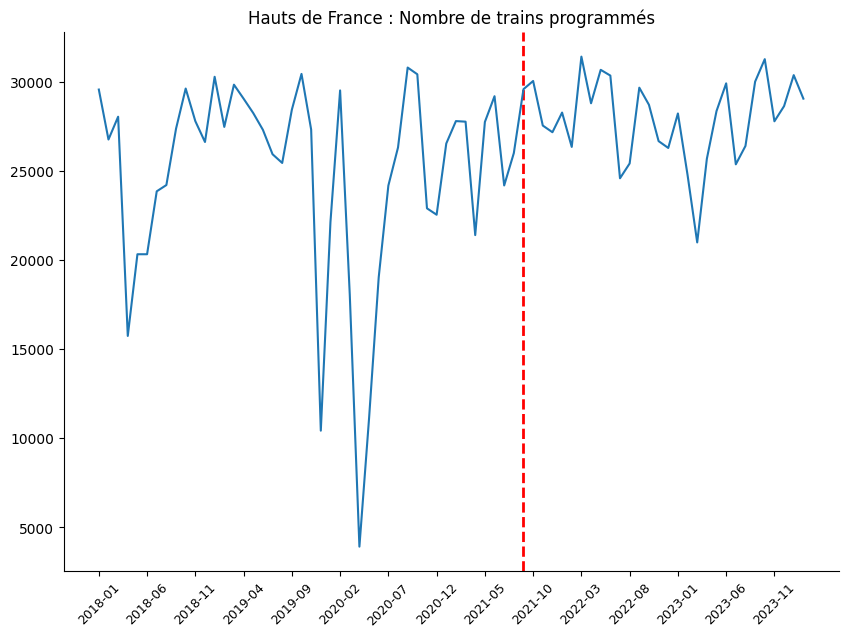

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(HF)) if i%5==0]
plt.xticks(ensemble_affichage,[HF[HF.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_HF=param_list_HF[max_index_HF]
plt.axvline(x=index_list_HF[max_index_HF], color='red', linestyle='dashed', linewidth=2)

plt.plot(HF['Date'],HF['Nombre de trains programmés'])
plt.title("Hauts de France : Nombre de trains programmés")

plt.show()

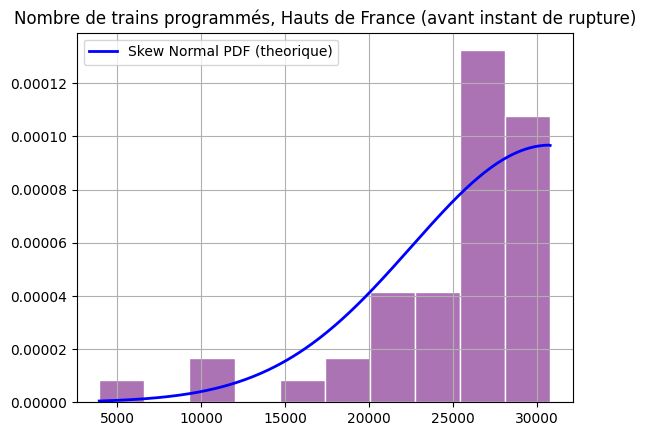

In [ ]:
counts, bins, patches = plt.hist(HF.loc[:k,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_HF[4], param_HF[0], param_HF[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, Hauts de France (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

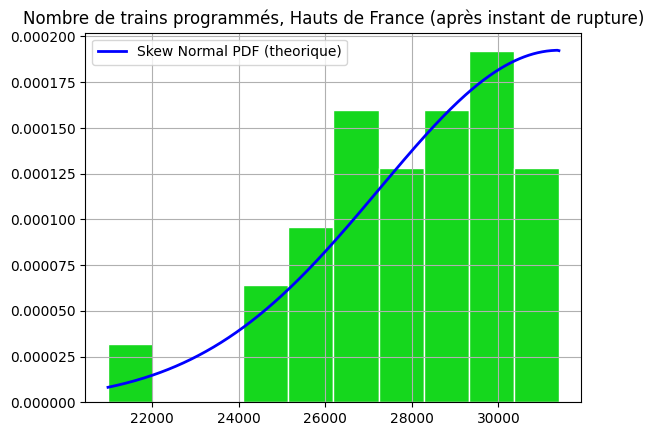

In [ ]:
counts, bins, patches = plt.hist(HF.loc[k:,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_HF[4], param_HF[1], param_HF[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, Hauts de France (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
data1 = HF.loc[k:,'Nombre de trains programmés']
data2 = HF.loc[:k,'Nombre de trains programmés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.32222222222222224
p-value: 0.040192997556569195
Reject null hypothesis, distributions likely differ.


**Trains annulés**

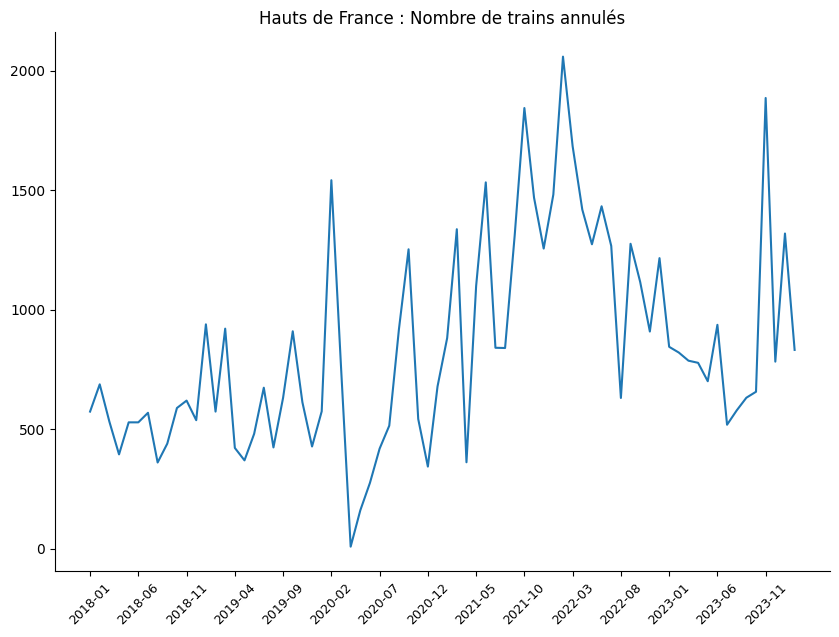

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(HF)) if i%5==0]
plt.xticks(ensemble_affichage,[HF[HF.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(HF['Date'],HF['Nombre de trains annulés'])
plt.title("Hauts de France : Nombre de trains annulés")

plt.show()

Hauts de France : Nombre de trains annulés


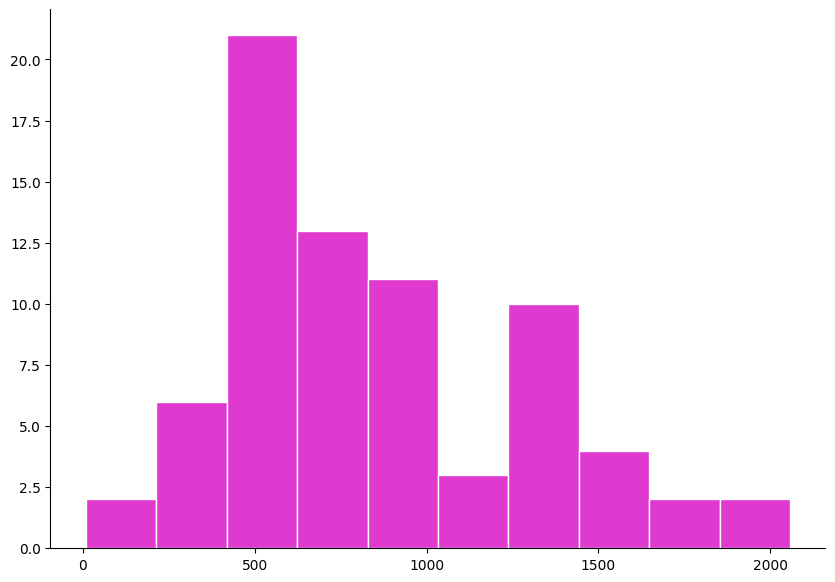

In [ ]:
print("Hauts de France : Nombre de trains annulés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(HF[HF.columns[4]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [ ]:
index_list_HF_2, param_list_HF_2, log_lik_list_HF_2=candidate_rupt(HF['Nombre de trains annulés'])

In [ ]:
max_value_HF_2 = max(log_lik_list_HF_2)
max_index_HF_2 =log_lik_list_HF_2.index(max_value_HF_2)

Hauts de france : vraissemblance selon k


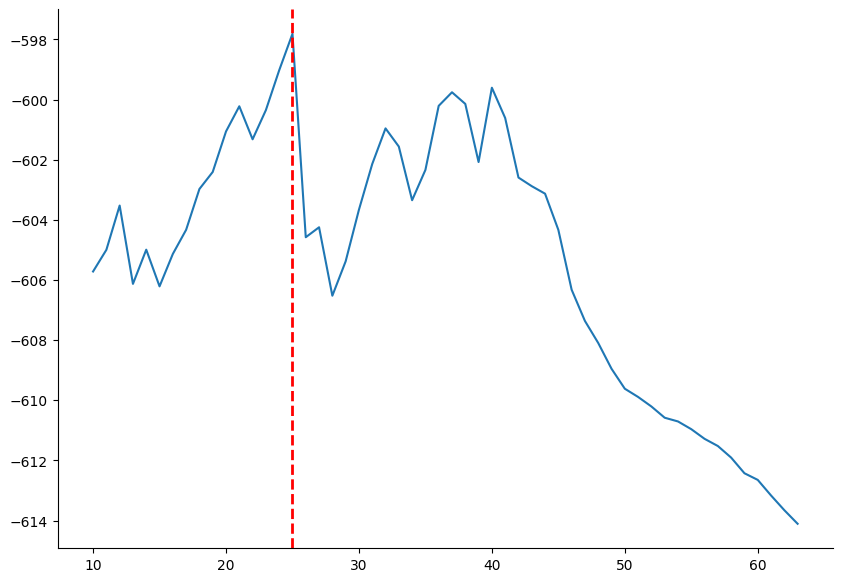

In [ ]:
print("Hauts de france : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_HF_2,log_lik_list_HF_2)
plt.axvline(x=index_list_HF_2[max_index_HF_2], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [ ]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_HF_2[max_index_HF_2]}, Parametres des lois:{param_list_HF_2[max_index_HF_2]}")

Maximum de vraissemblance atteint pour k= 25, Parametres des lois:[405.98067636 438.87001392 223.42561116 718.54650115   2.67847053]


In [ ]:
HF.loc[index_list_HF_2[max_index_HF_2]]

Date                                              2020-02
Région                                    Hauts-de-France
Nombre de trains programmés                       29503.0
Nombre de trains ayant circulé                    27962.0
Nombre de trains annulés                           1541.0
Nombre de trains en retard à l'arrivée             3076.0
Taux de régularité                                   89.0
Name: 25, dtype: object

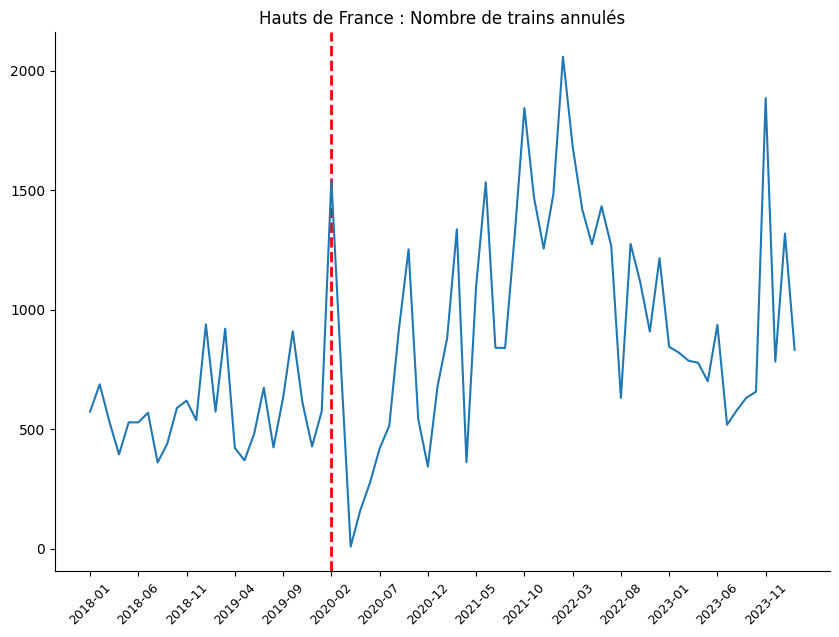

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

ensemble_affichage=[i for i in range(len(HF)) if i%5==0]
plt.xticks(ensemble_affichage,[HF[HF.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_HF_2=param_list_HF_2[max_index_HF_2]
plt.axvline(x=index_list_HF_2[max_index_HF_2], color='red', linestyle='dashed', linewidth=2)

plt.plot(HF['Date'],HF['Nombre de trains annulés'])
plt.title("Hauts de France : Nombre de trains annulés")

plt.show()

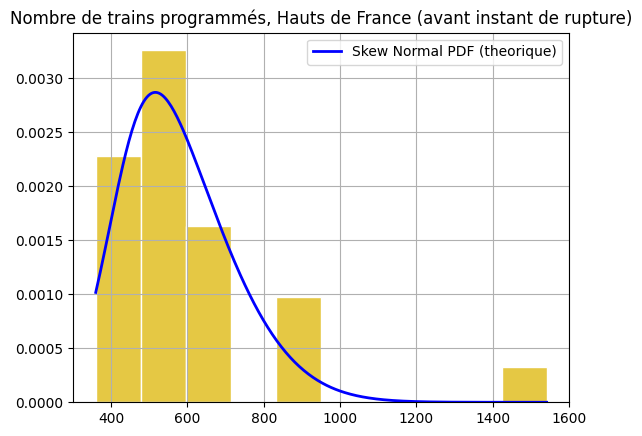

In [ ]:
k=index_list_HF_2[max_index_HF_2]

counts, bins, patches = plt.hist(HF.loc[:k,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_HF_2[4], param_HF_2[0], param_HF_2[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, Hauts de France (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

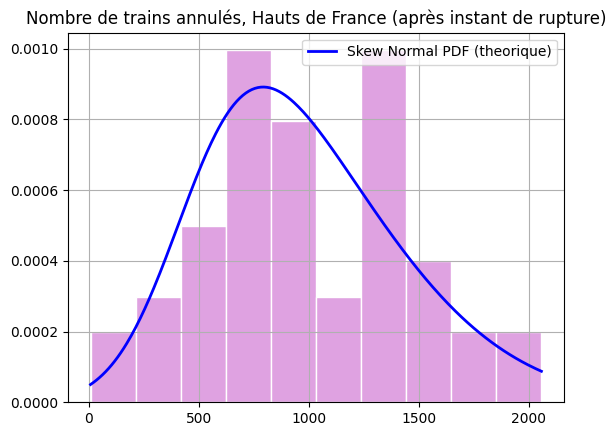

In [ ]:
counts, bins, patches = plt.hist(HF.loc[k:,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_HF_2[4], param_HF_2[1], param_HF_2[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains annulés, Hauts de France (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
data1 = HF.loc[k:,'Nombre de trains annulés']
data2 = HF.loc[:k,'Nombre de trains annulés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.5604395604395604
p-value: 1.901530116493336e-05
Reject null hypothesis, distributions likely differ.


###Auvergne-Rhône-Alpes

**Trains programmés**

In [ ]:
ARA=df[df['Région']=='Auvergne-Rhône-Alpes']
ARA=ARA.reset_index(inplace=False, drop=True)

ARA.head()

,Date,Région,Nombre de trains programmés,Nombre de trains ayant circulé,Nombre de trains annulés,Nombre de trains en retard à l'arrivée,Taux de régularité
0,2018-01,Auvergne-Rhône-Alpes,34277.0,33671.0,606.0,3874.0,88.494550
1,2018-02,Auvergne-Rhône-Alpes,31153.0,30759.0,394.0,3757.0,87.785689
2,2018-03,Auvergne-Rhône-Alpes,33527.0,32809.0,718.0,3741.0,88.597641
3,2018-04,Auvergne-Rhône-Alpes,13039.0,12785.0,254.0,1620.0,87.328901
4,2018-05,Auvergne-Rhône-Alpes,14740.0,14523.0,217.0,1650.0,88.638711


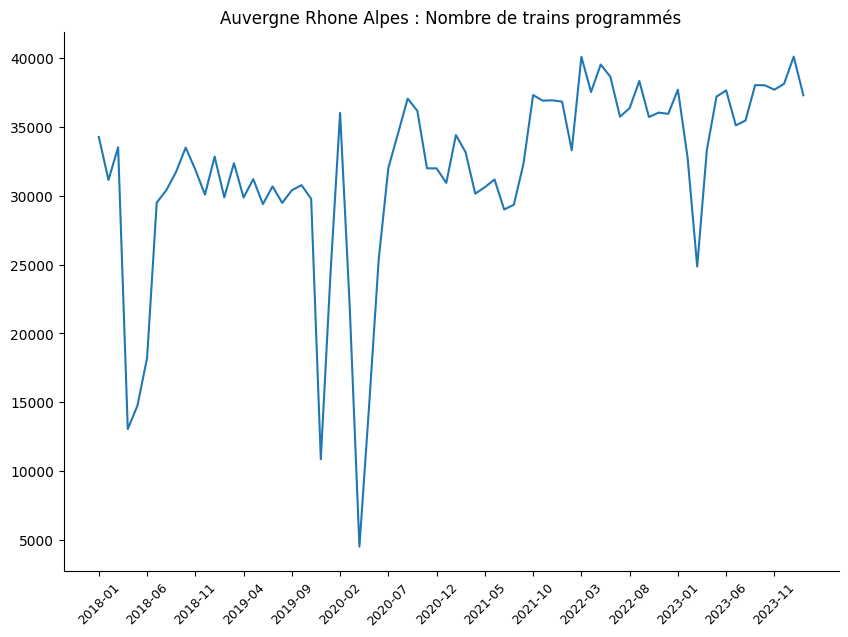

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(ARA)) if i%5==0]
plt.xticks(ensemble_affichage,[ARA[ARA.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(ARA['Date'],ARA['Nombre de trains programmés'])
plt.title("Auvergne Rhone Alpes : Nombre de trains programmés")

plt.show()

Auvergne Rhone Alpes : Nombre de trains programmés


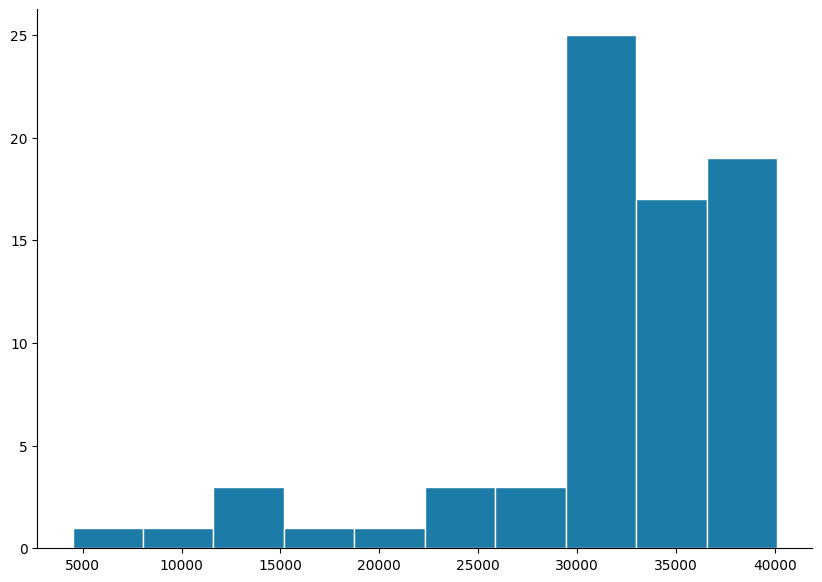

In [ ]:
print("Auvergne Rhone Alpes : Nombre de trains programmés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(ARA[ARA.columns[2]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [ ]:
index_list_ARA, param_list_ARA, log_lik_list_ARA=candidate_rupt(ARA['Nombre de trains programmés'])

In [ ]:
max_value_ARA = max(log_lik_list_ARA)
max_index_ARA =log_lik_list_ARA.index(max_value_ARA)

Auvergne Rhone Alpes : vraissemblance selon k


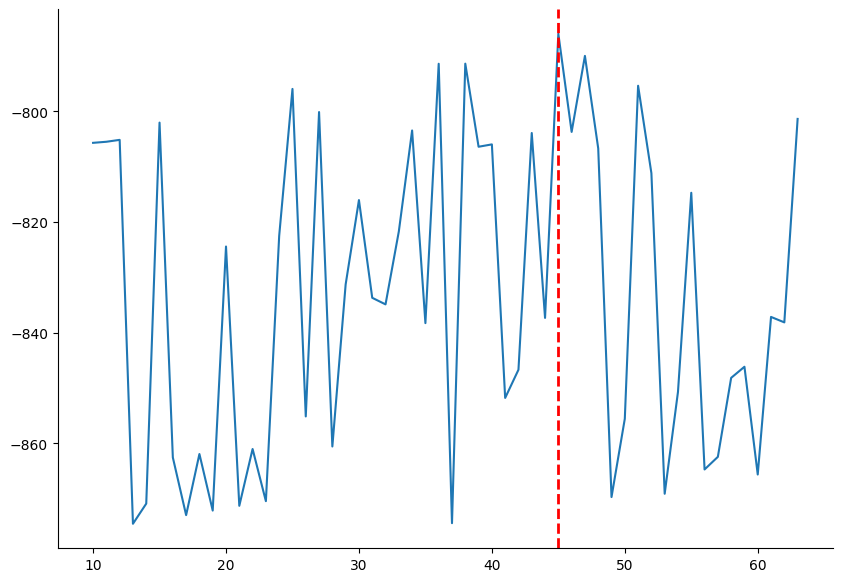

In [ ]:
print("Auvergne Rhone Alpes : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_ARA,log_lik_list_ARA)
plt.axvline(x=index_list_ARA[max_index_ARA], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [ ]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_ARA[max_index_ARA]}, Parametres des lois:{param_list_ARA[max_index_ARA]}")

Maximum de vraissemblance atteint pour k= 45, Parametres des lois:[ 3.57027026e+04  3.96695773e+04  9.84948234e+03  4.29427748e+03
 -6.04357536e+00]


In [ ]:
k=index_list_ARA[max_index_ARA]
ARA.loc[k]

Date                                                   2021-10
Région                                    Auvergne-Rhône-Alpes
Nombre de trains programmés                            37326.0
Nombre de trains ayant circulé                         36707.0
Nombre de trains annulés                                 619.0
Nombre de trains en retard à l'arrivée                  2732.0
Taux de régularité                                   92.557278
Name: 45, dtype: object

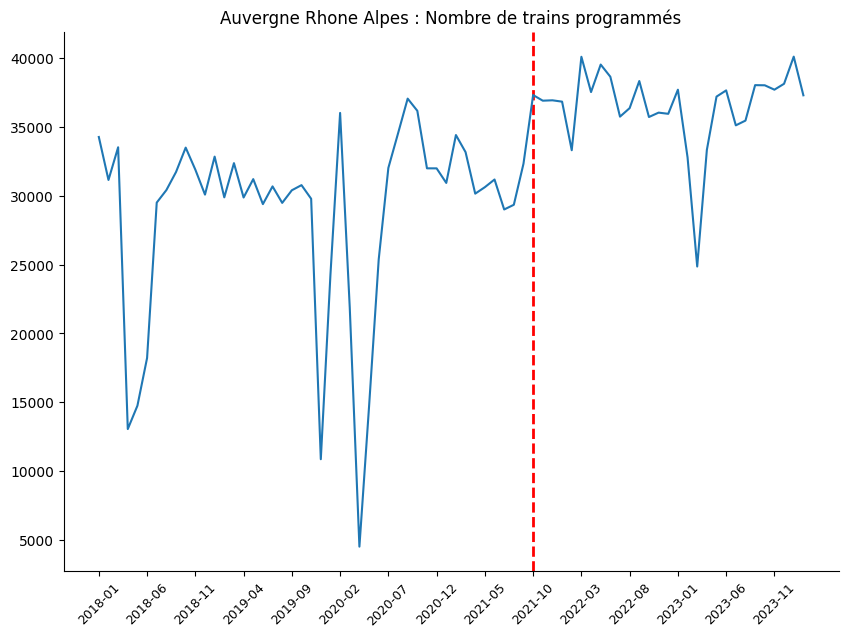

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(ARA)) if i%5==0]
plt.xticks(ensemble_affichage,[ARA[ARA.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_ARA=param_list_ARA[max_index_ARA]
plt.axvline(x=index_list_ARA[max_index_ARA], color='red', linestyle='dashed', linewidth=2)


plt.plot(ARA['Date'],ARA['Nombre de trains programmés'])
plt.title("Auvergne Rhone Alpes : Nombre de trains programmés")

plt.show()

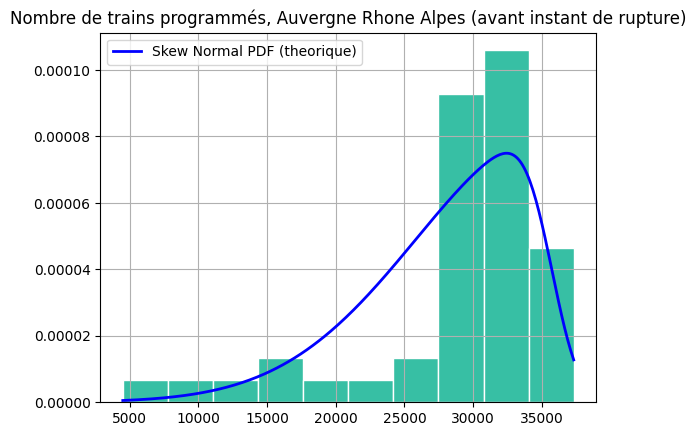

In [ ]:
counts, bins, patches = plt.hist(ARA.loc[:k,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_ARA[4], param_ARA[0], param_ARA[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, Auvergne Rhone Alpes (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

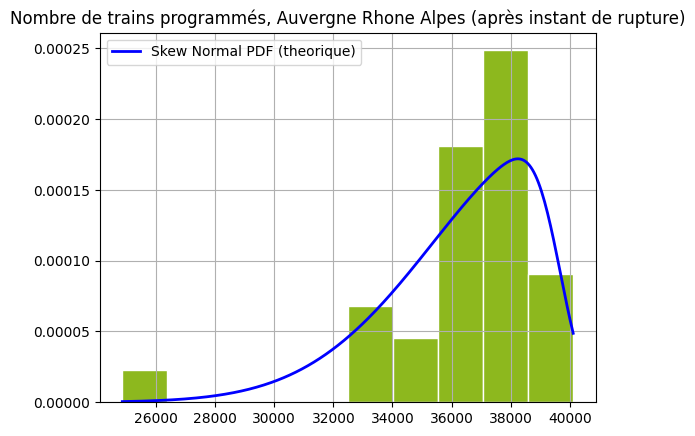

In [ ]:
counts, bins, patches = plt.hist(ARA.loc[k:,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_ARA[4], param_ARA[1], param_ARA[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, Auvergne Rhone Alpes (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
data1 = ARA.loc[k:,'Nombre de trains programmés']
data2 = ARA.loc[:k,'Nombre de trains programmés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.775112443778111
p-value: 4.3585957222992403e-11
Reject null hypothesis, distributions likely differ.


**Trains annulés**

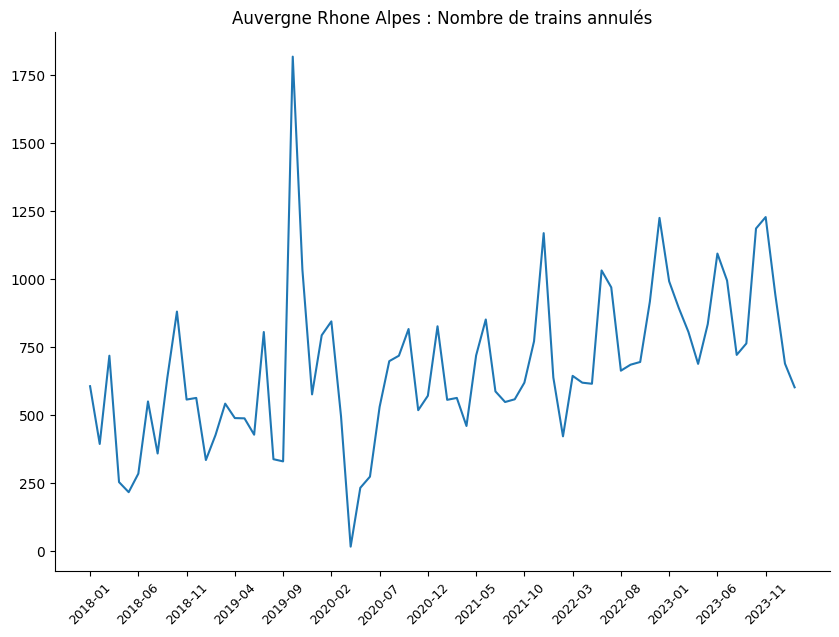

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(ARA)) if i%5==0]
plt.xticks(ensemble_affichage,[ARA[ARA.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(ARA['Date'],ARA['Nombre de trains annulés'])
plt.title("Auvergne Rhone Alpes : Nombre de trains annulés")

plt.show()

Auvergne Rhone Alpes : Nombre de trains annulés


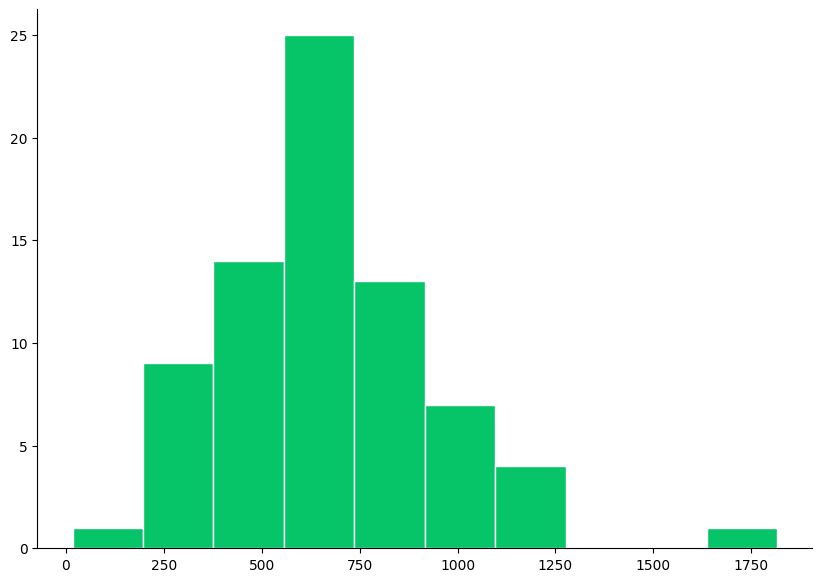

In [ ]:
print("Auvergne Rhone Alpes : Nombre de trains annulés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(ARA[ARA.columns[4]].values , ec="white",color=numpy.random.rand(3))
plt.show()


In [ ]:
index_list_ARA_2, param_list_ARA_2, log_lik_list_ARA_2=candidate_rupt(ARA['Nombre de trains annulés'])

In [ ]:
max_value_ARA_2 = max(log_lik_list_ARA_2)
max_index_ARA_2 =log_lik_list_ARA_2.index(max_value_ARA_2)

Auvergne Rhone Alpes: vraissemblance selon k


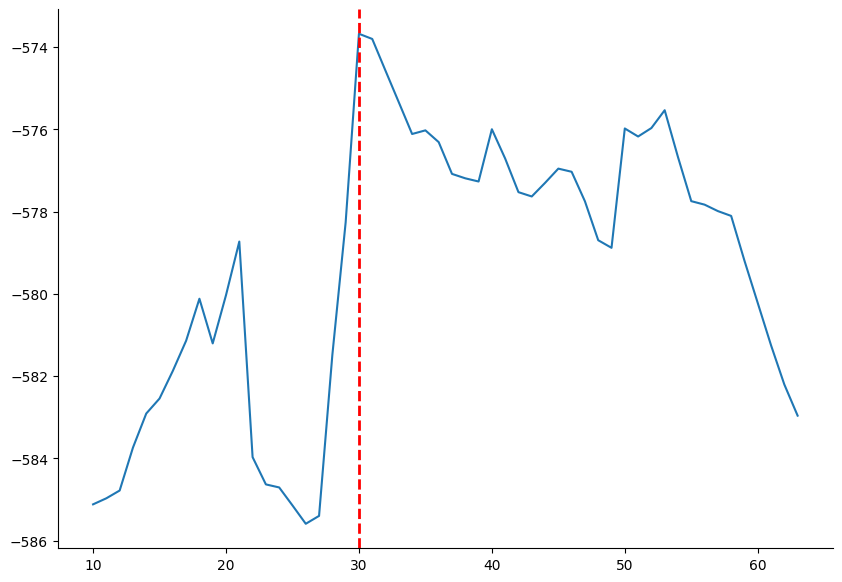

In [ ]:
print("Auvergne Rhone Alpes: vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_ARA_2,log_lik_list_ARA_2)
plt.axvline(x=index_list_ARA_2[max_index_ARA_2], color='red', linestyle='dashed', linewidth=2)

plt.show()


In [ ]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_ARA_2[max_index_ARA_2]}, Parametres des lois:{param_list_ARA_2[max_index_ARA_2]}")

Maximum de vraissemblance atteint pour k= 30, Parametres des lois:[180.6322164  508.58786336 490.82816775 327.95505681   4.58485626]


In [ ]:
ARA.loc[index_list_ARA_2[max_index_ARA_2]]

Date                                                   2020-07
Région                                    Auvergne-Rhône-Alpes
Nombre de trains programmés                            32029.0
Nombre de trains ayant circulé                         31499.0
Nombre de trains annulés                                 530.0
Nombre de trains en retard à l'arrivée                  2562.0
Taux de régularité                                   91.866408
Name: 30, dtype: object

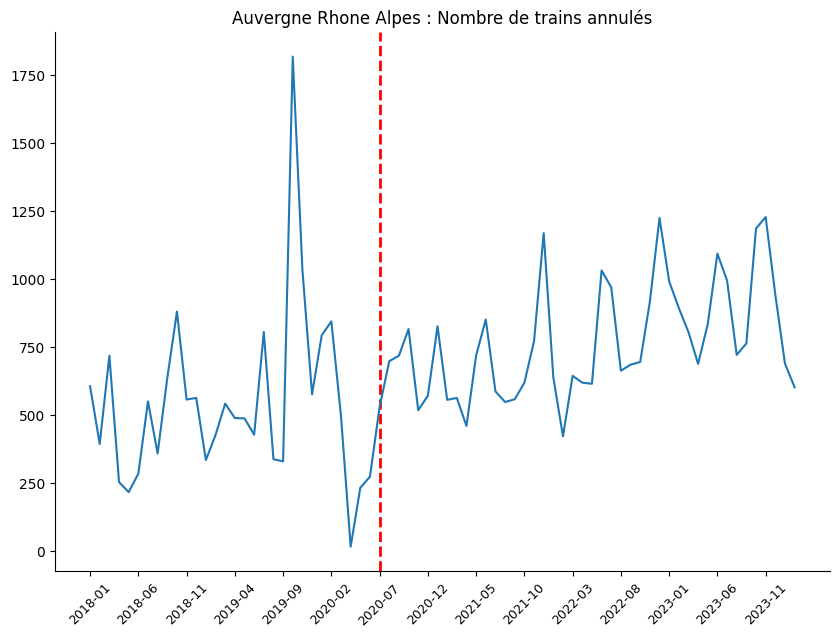

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

ensemble_affichage=[i for i in range(len(ARA)) if i%5==0]
plt.xticks(ensemble_affichage,[ARA[ARA.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_ARA_2=param_list_ARA_2[max_index_ARA_2]
plt.axvline(x=index_list_ARA_2[max_index_ARA_2], color='red', linestyle='dashed', linewidth=2)


plt.plot(ARA['Date'],ARA['Nombre de trains annulés'])
plt.title("Auvergne Rhone Alpes : Nombre de trains annulés")

plt.show()

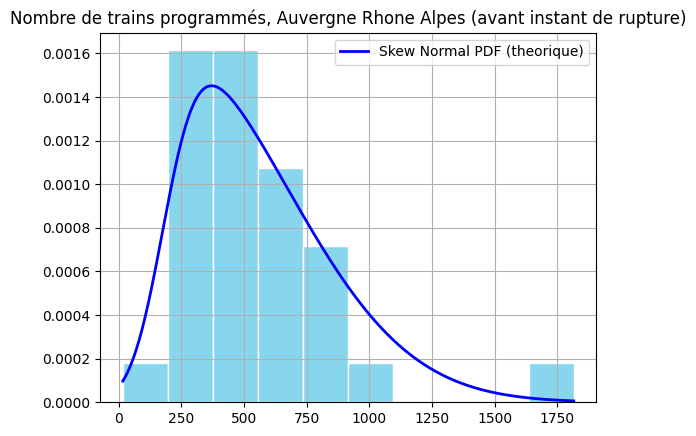

In [ ]:
k=index_list_ARA_2[max_index_ARA_2]

counts, bins, patches = plt.hist(ARA.loc[:k,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_ARA_2[4], param_ARA_2[0], param_ARA_2[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, Auvergne Rhone Alpes (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()


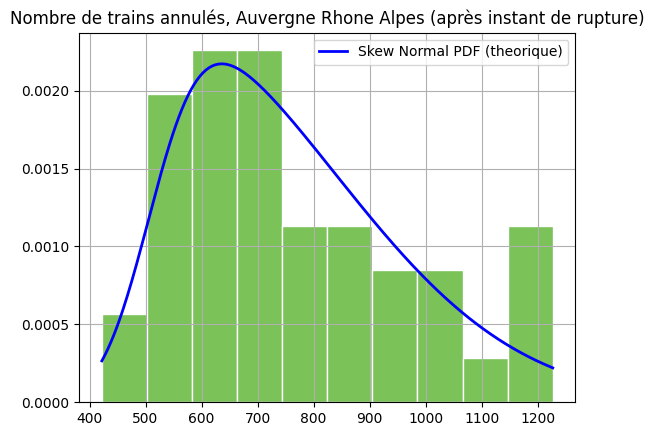

In [ ]:
counts, bins, patches = plt.hist(ARA.loc[k:,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_ARA_2[4], param_ARA_2[1], param_ARA_2[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains annulés, Auvergne Rhone Alpes (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
data1 = ARA.loc[k:,'Nombre de trains annulés']
data2 = ARA.loc[:k,'Nombre de trains annulés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")


Kolmogorov-Smirnov statistic: 0.5087976539589443
p-value: 7.613544040203094e-05
Reject null hypothesis, distributions likely differ.


###Bourgogne-Franche-Comté

**Trains programmés**

In [ ]:
BFC=df[df['Région']=='Bourgogne-Franche-Comté']
BFC=BFC.reset_index(inplace=False, drop=True)

BFC.head()

,Date,Région,Nombre de trains programmés,Nombre de trains ayant circulé,Nombre de trains annulés,Nombre de trains en retard à l'arrivée,Taux de régularité
0,2018-01,Bourgogne-Franche-Comté,13942.0,13676.0,266.0,1214.0,91.123135
1,2018-02,Bourgogne-Franche-Comté,12498.0,12367.0,131.0,897.0,92.746826
2,2018-03,Bourgogne-Franche-Comté,13512.0,13331.0,181.0,1035.0,92.236141
3,2018-04,Bourgogne-Franche-Comté,8100.0,7996.0,104.0,587.0,92.658829
4,2018-05,Bourgogne-Franche-Comté,9083.0,8923.0,160.0,898.0,89.936120


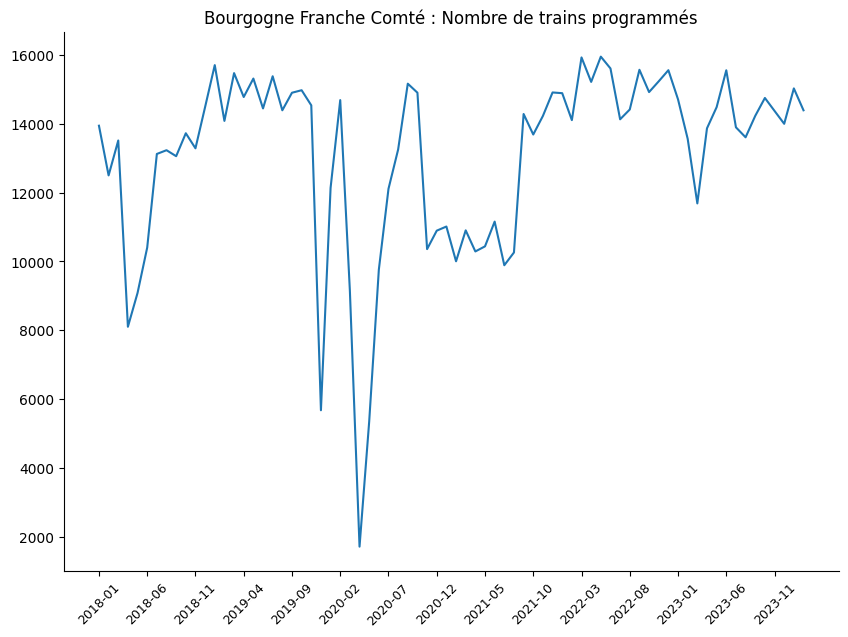

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(BFC)) if i%5==0]
plt.xticks(ensemble_affichage,[BFC[BFC.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(BFC['Date'],BFC['Nombre de trains programmés'])
plt.title("Bourgogne Franche Comté : Nombre de trains programmés")

plt.show()

Bourgogne Franche Comté : Nombre de trains programmés


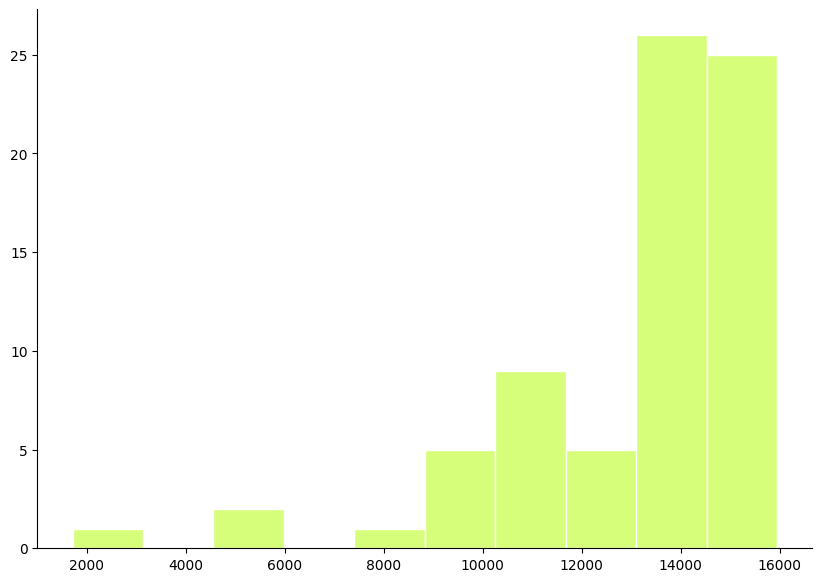

In [ ]:
print("Bourgogne Franche Comté : Nombre de trains programmés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(BFC[BFC.columns[2]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [ ]:
index_list_BFC, param_list_BFC, log_lik_list_BFC=candidate_rupt(BFC['Nombre de trains programmés'])

In [ ]:
max_value_BFC = max(log_lik_list_BFC)
max_index_BFC =log_lik_list_BFC.index(max_value_BFC)

Bourgogne Franche Comté : vraissemblance selon k


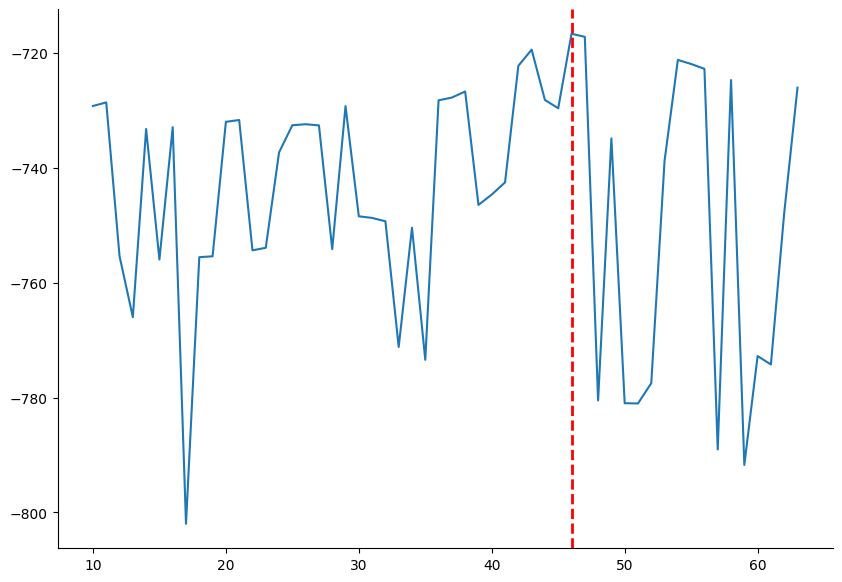

In [ ]:
print("Bourgogne Franche Comté : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_BFC,log_lik_list_BFC)
plt.axvline(x=index_list_BFC[max_index_BFC], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [ ]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_BFC[max_index_BFC]}, Parametres des lois:{param_list_BFC[max_index_BFC]}")

Maximum de vraissemblance atteint pour k= 46, Parametres des lois:[15705.18191075 15949.79522016  4622.20314184  1611.03840701
 -6197.28804601]


In [ ]:
k=index_list_BFC[max_index_BFC]
BFC.loc[k]

Date                                                      2021-11
Région                                    Bourgogne-Franche-Comté
Nombre de trains programmés                               14226.0
Nombre de trains ayant circulé                            13974.0
Nombre de trains annulés                                    252.0
Nombre de trains en retard à l'arrivée                     1226.0
Taux de régularité                                      91.226564
Name: 46, dtype: object

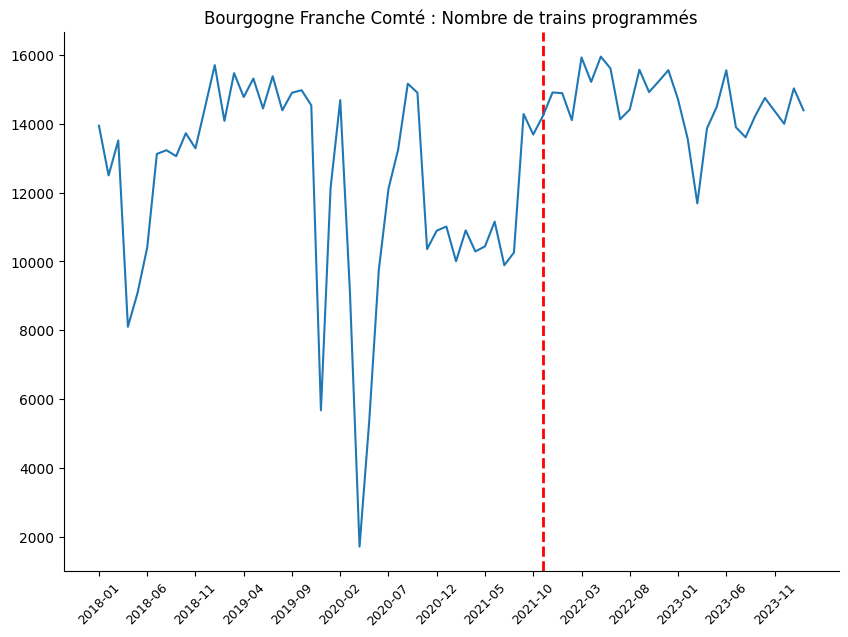

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(BFC)) if i%5==0]
plt.xticks(ensemble_affichage,[BFC[BFC.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_BFC=param_list_BFC[max_index_BFC]
plt.axvline(x=index_list_BFC[max_index_BFC], color='red', linestyle='dashed', linewidth=2)


plt.plot(BFC['Date'],BFC['Nombre de trains programmés'])
plt.title("Bourgogne Franche Comté : Nombre de trains programmés")

plt.show()

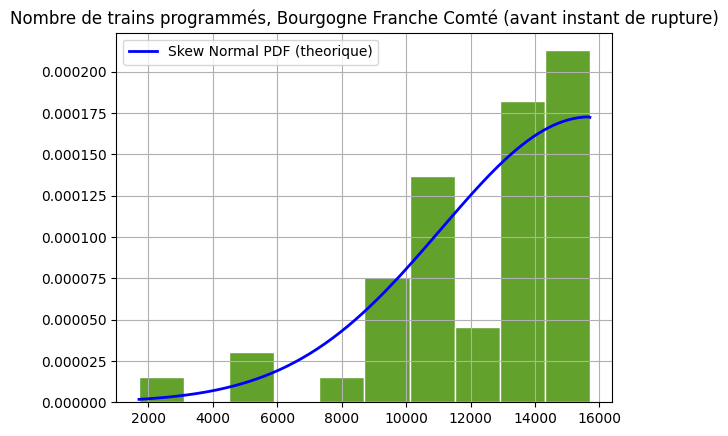

In [ ]:
counts, bins, patches = plt.hist(BFC.loc[:k,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_BFC[4], param_BFC[0], param_BFC[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, Bourgogne Franche Comté (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

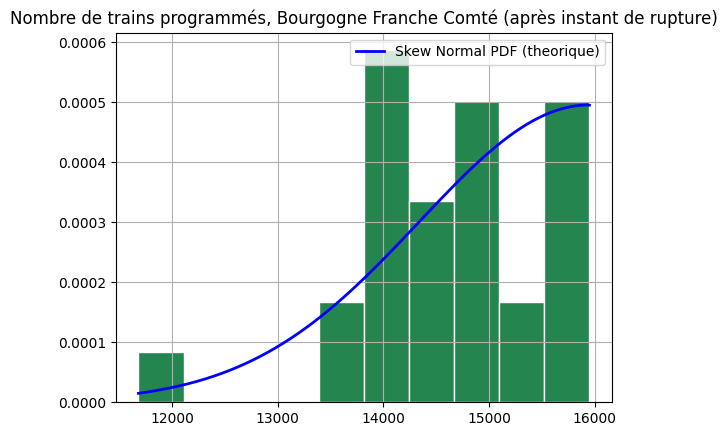

In [ ]:
counts, bins, patches = plt.hist(BFC.loc[k:,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_BFC[4], param_BFC[1], param_BFC[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, Bourgogne Franche Comté (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
data1 = BFC.loc[k:,'Nombre de trains programmés']
data2 = BFC.loc[:k,'Nombre de trains programmés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.5387537993920972
p-value: 2.8203837236507415e-05
Reject null hypothesis, distributions likely differ.


**Trains Annulés**

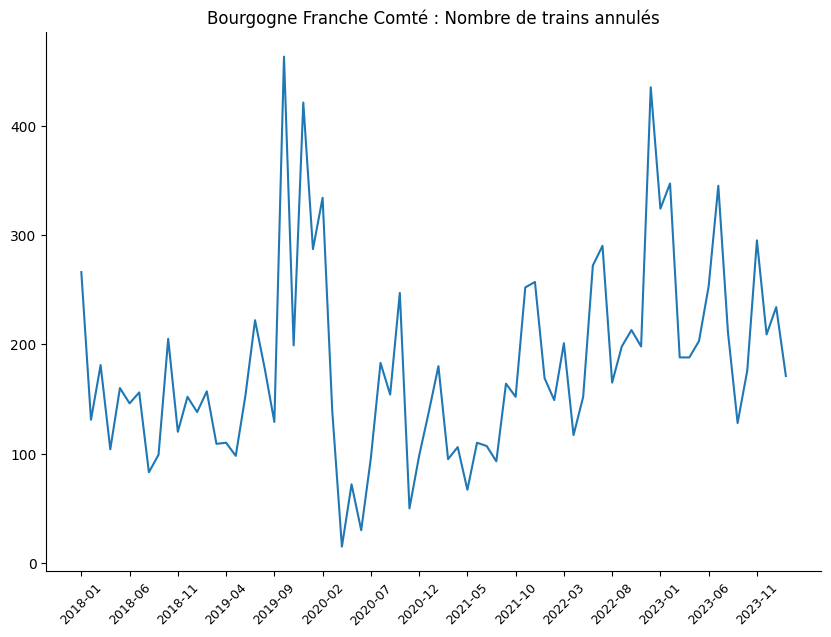

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(BFC)) if i%5==0]
plt.xticks(ensemble_affichage,[BFC[BFC.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(BFC['Date'],BFC['Nombre de trains annulés'])
plt.title("Bourgogne Franche Comté : Nombre de trains annulés")

plt.show()

Bourgogne Franche Comté : Nombre de trains annulés


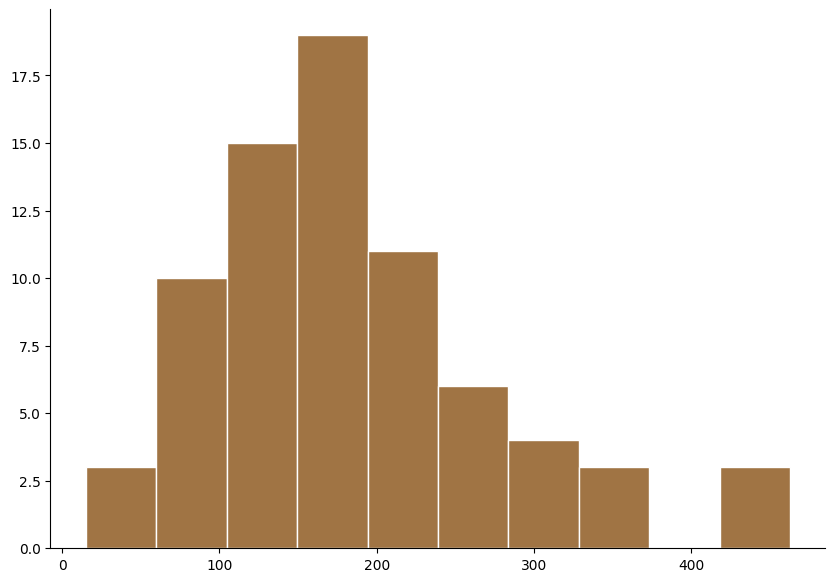

In [ ]:
print("Bourgogne Franche Comté : Nombre de trains annulés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(BFC[BFC.columns[4]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [ ]:
index_list_BFC_2, param_list_BFC_2, log_lik_list_BFC_2=candidate_rupt(BFC['Nombre de trains annulés'])

In [ ]:
max_value_BFC_2 = max(log_lik_list_BFC_2)
max_index_BFC_2 =log_lik_list_BFC_2.index(max_value_BFC_2)

Bourgogne Franche Comté : vraissemblance selon k


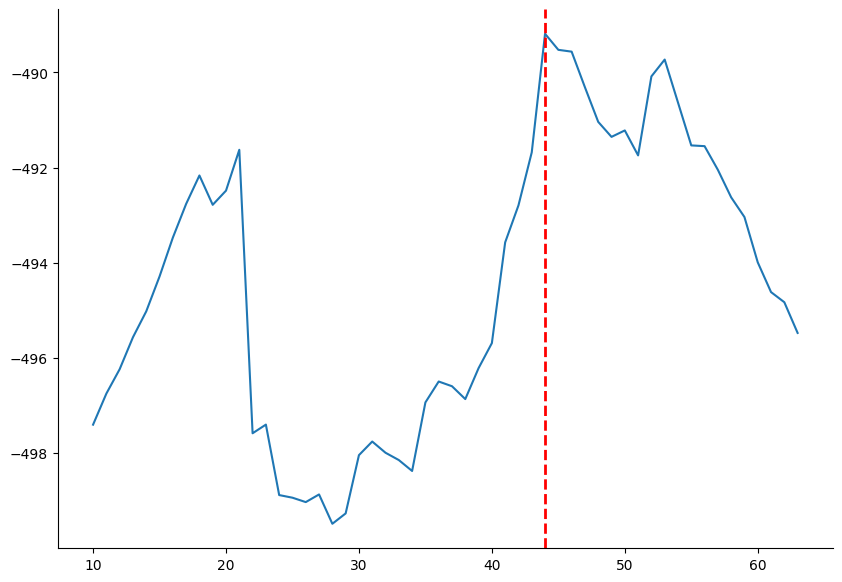

In [ ]:
print("Bourgogne Franche Comté : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_BFC_2,log_lik_list_BFC_2)
plt.axvline(x=index_list_BFC_2[max_index_BFC_2], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [ ]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_BFC_2[max_index_BFC_2]}, Parametres des lois:{param_list_BFC_2[max_index_BFC_2]}")

Maximum de vraissemblance atteint pour k= 44, Parametres des lois:[ 55.03111825 137.46271858 134.4421484  109.76069931   4.63434599]


In [ ]:
BFC.loc[index_list_BFC_2[max_index_BFC_2]]

Date                                                      2021-09
Région                                    Bourgogne-Franche-Comté
Nombre de trains programmés                               14282.0
Nombre de trains ayant circulé                            14118.0
Nombre de trains annulés                                    164.0
Nombre de trains en retard à l'arrivée                      837.0
Taux de régularité                                      94.071398
Name: 44, dtype: object

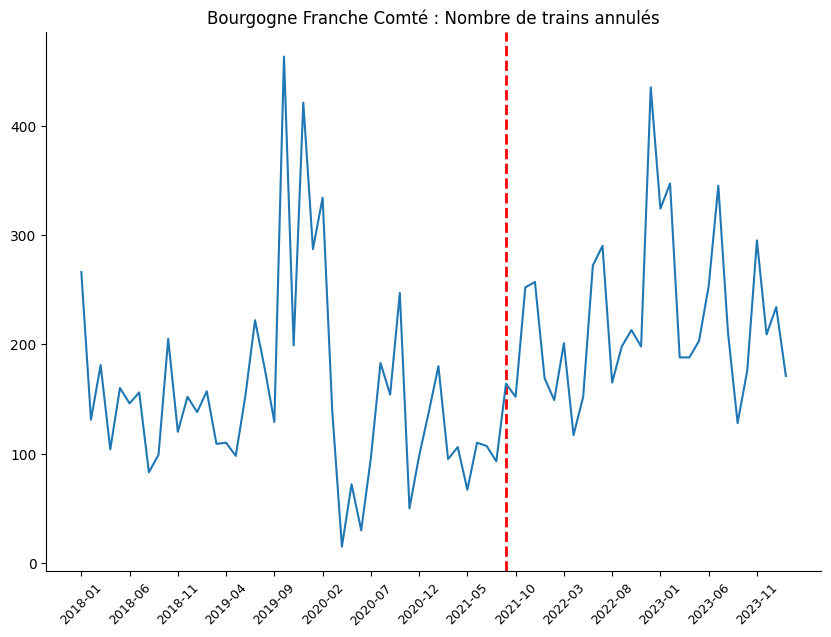

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

ensemble_affichage=[i for i in range(len(BFC)) if i%5==0]
plt.xticks(ensemble_affichage,[BFC[BFC.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_BFC_2=param_list_BFC_2[max_index_BFC_2]
plt.axvline(x=index_list_BFC_2[max_index_BFC_2], color='red', linestyle='dashed', linewidth=2)


plt.plot(BFC['Date'],BFC['Nombre de trains annulés'])
plt.title("Bourgogne Franche Comté : Nombre de trains annulés")

plt.show()

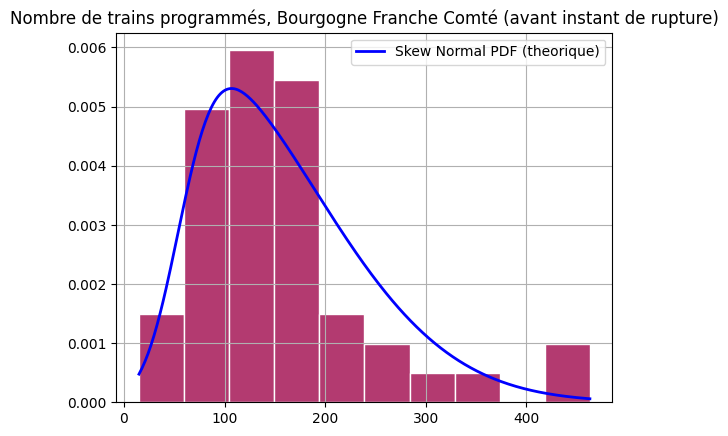

In [ ]:
k=index_list_BFC_2[max_index_BFC_2]

counts, bins, patches = plt.hist(BFC.loc[:k,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_BFC_2[4], param_BFC_2[0], param_BFC_2[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, Bourgogne Franche Comté (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

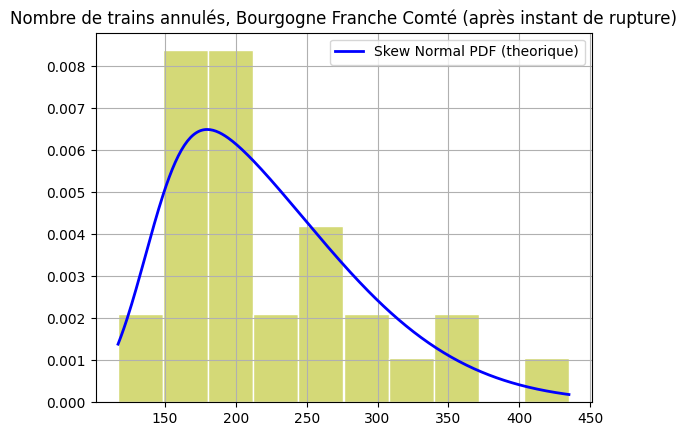

In [ ]:
counts, bins, patches = plt.hist(BFC.loc[k:,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_BFC_2[4], param_BFC_2[1], param_BFC_2[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains annulés, Bourgogne Franche Comté (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
data1 = BFC.loc[k:,'Nombre de trains annulés']
data2 = BFC.loc[:k,'Nombre de trains annulés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.5222222222222223
p-value: 5.883970821319061e-05
Reject null hypothesis, distributions likely differ.


###Normandie

**Trains programmés**

In [ ]:
Nor=df[df['Région']=='Normandie']
Nor=Nor.reset_index(inplace=False, drop=True)

Nor.head()

,Date,Région,Nombre de trains programmés,Nombre de trains ayant circulé,Nombre de trains annulés,Nombre de trains en retard à l'arrivée,Taux de régularité
0,2018-01,Normandie,8654.0,8356.0,298.0,486.0,94.183820
1,2018-02,Normandie,7921.0,7788.0,133.0,607.0,92.205958
2,2018-03,Normandie,8579.0,8498.0,81.0,484.0,94.304542
3,2018-04,Normandie,5057.0,4971.0,86.0,497.0,90.002012
4,2018-05,Normandie,5269.0,5169.0,100.0,460.0,91.100793


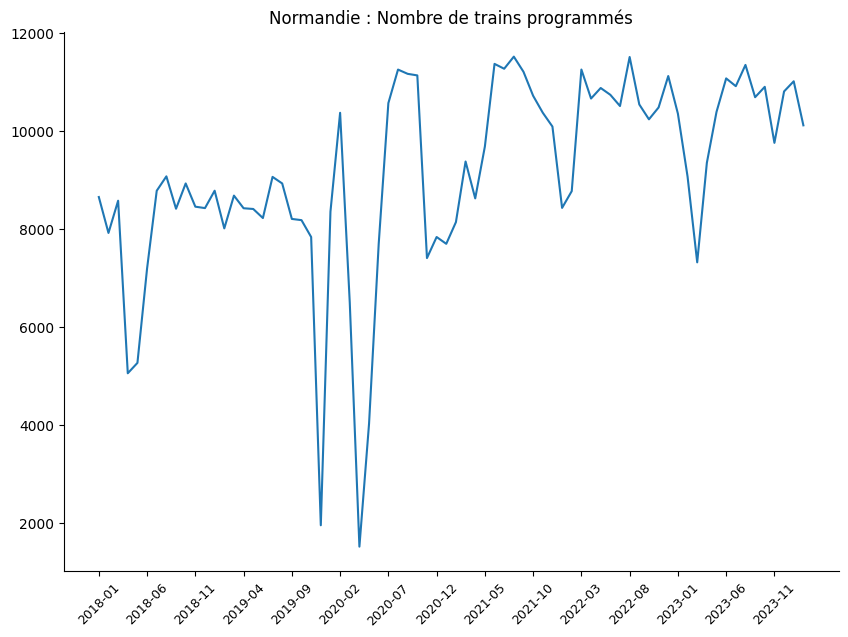

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(Nor)) if i%5==0]
plt.xticks(ensemble_affichage,[Nor[Nor.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(Nor['Date'],Nor['Nombre de trains programmés'])
plt.title("Normandie : Nombre de trains programmés")

plt.show()

Normandie : Nombre de trains programmés


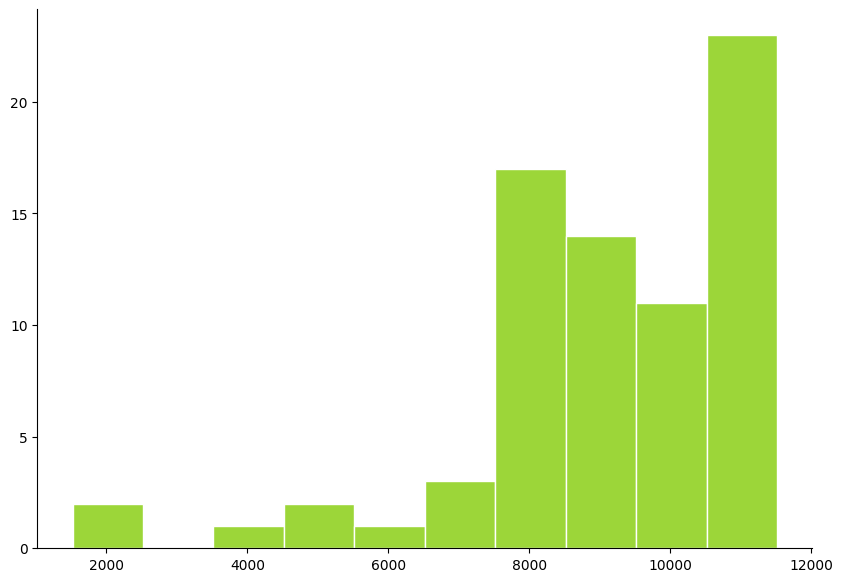

In [ ]:
print("Normandie : Nombre de trains programmés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(Nor[Nor.columns[2]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [ ]:
index_list_Nor, param_list_Nor, log_lik_list_Nor=candidate_rupt(Nor['Nombre de trains programmés'])

In [ ]:
max_value_Nor = max(log_lik_list_Nor)
max_index_Nor =log_lik_list_Nor.index(max_value_Nor)

Normandie : vraissemblance selon k


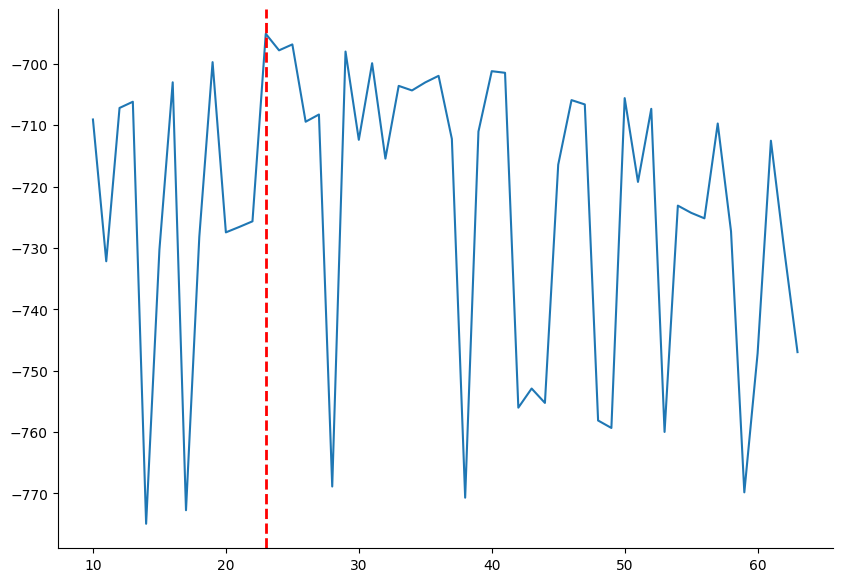

In [ ]:
print("Normandie : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_Nor,log_lik_list_Nor)
plt.axvline(x=index_list_Nor[max_index_Nor], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [ ]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_Nor[max_index_Nor]}, Parametres des lois:{param_list_Nor[max_index_Nor]}")

Maximum de vraissemblance atteint pour k= 23, Parametres des lois:[ 9076.73012891 11520.44020165  1373.39525898  2933.11008589
 -5965.36708315]


In [ ]:
k=index_list_Nor[max_index_Nor]
Nor.loc[k]

Date                                        2019-12
Région                                    Normandie
Nombre de trains programmés                  1955.0
Nombre de trains ayant circulé               1888.0
Nombre de trains annulés                       67.0
Nombre de trains en retard à l'arrivée        240.0
Taux de régularité                        87.294239
Name: 23, dtype: object

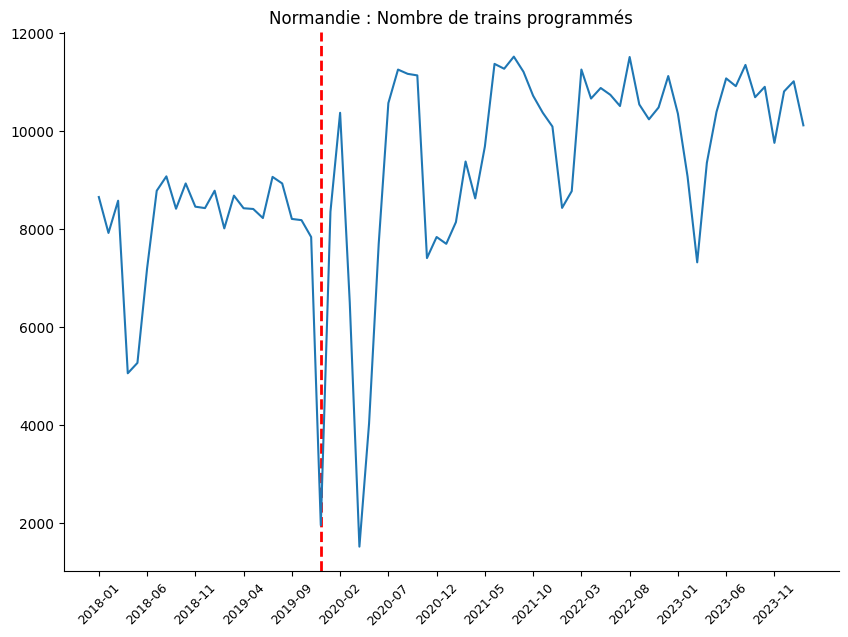

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(Nor)) if i%5==0]
plt.xticks(ensemble_affichage,[Nor[Nor.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_Nor=param_list_Nor[max_index_Nor]
plt.axvline(x=index_list_Nor[max_index_Nor], color='red', linestyle='dashed', linewidth=2)


plt.plot(Nor['Date'],Nor['Nombre de trains programmés'])
plt.title("Normandie : Nombre de trains programmés")

plt.show()

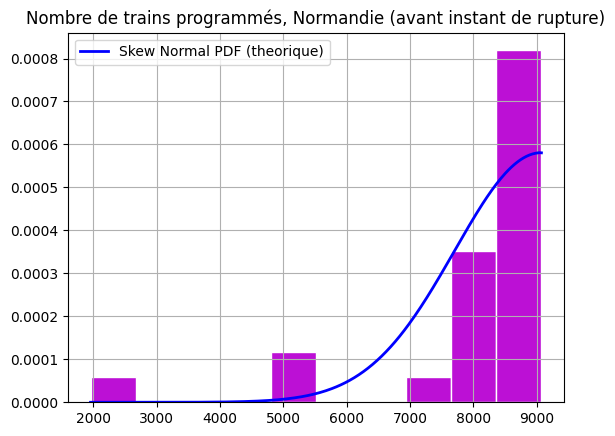

In [ ]:
counts, bins, patches = plt.hist(Nor.loc[:k,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_Nor[4], param_Nor[0], param_Nor[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, Normandie (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

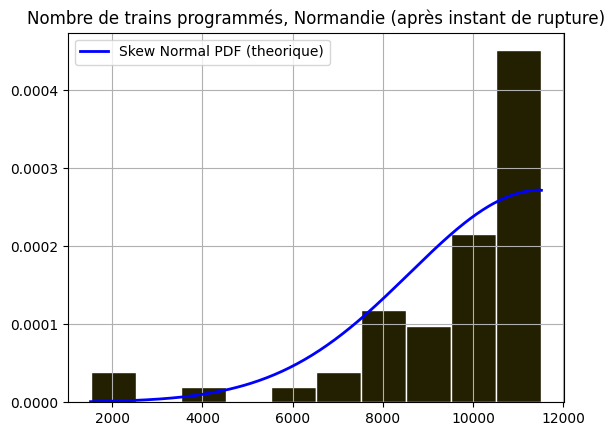

In [ ]:
counts, bins, patches = plt.hist(Nor.loc[k:,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_Nor[4], param_Nor[1], param_Nor[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, Normandie (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
data1 = Nor.loc[k:,'Nombre de trains programmés']
data2 = Nor.loc[:k,'Nombre de trains programmés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.7058823529411765
p-value: 1.6646321165853662e-08
Reject null hypothesis, distributions likely differ.


**Trains annulés**

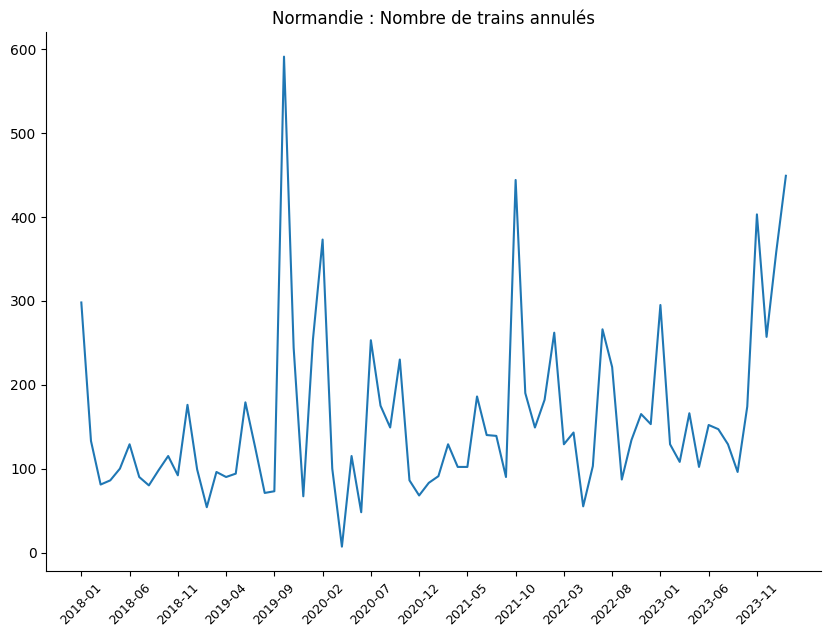

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(Nor)) if i%5==0]
plt.xticks(ensemble_affichage,[Nor[Nor.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(Nor['Date'],Nor['Nombre de trains annulés'])
plt.title("Normandie : Nombre de trains annulés")

plt.show()

Normandie : Nombre de trains annulés


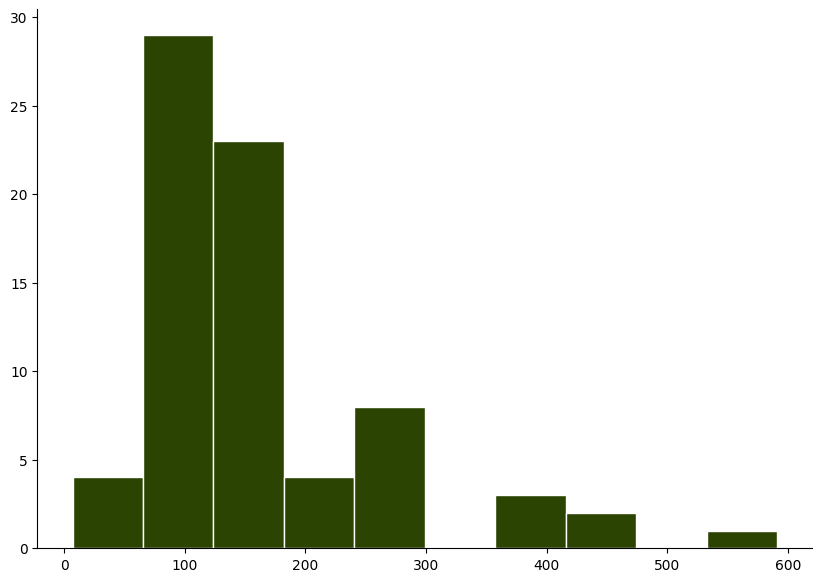

In [ ]:
print("Normandie : Nombre de trains annulés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(Nor[Nor.columns[4]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [ ]:
index_list_Nor_2, param_list_Nor_2, log_lik_list_Nor_2=candidate_rupt(Nor['Nombre de trains annulés'])

In [ ]:
max_value_Nor_2 = max(log_lik_list_Nor_2)
max_index_Nor_2 =log_lik_list_Nor_2.index(max_value_Nor_2)

Normandie : vraissemblance selon k


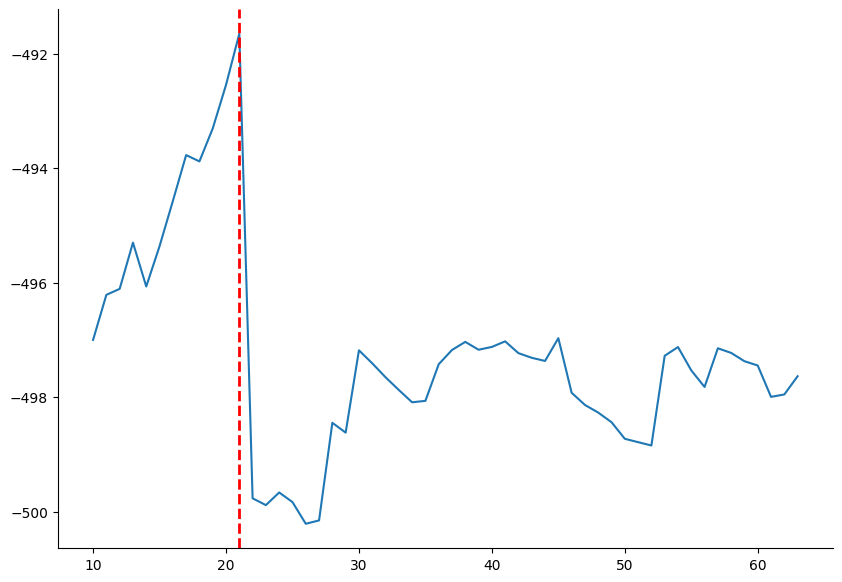

In [ ]:
print("Normandie : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_Nor_2,log_lik_list_Nor_2)
plt.axvline(x=index_list_Nor_2[max_index_Nor_2], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [ ]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_Nor_2[max_index_Nor_2]}, Parametres des lois:{param_list_Nor_2[max_index_Nor_2]}")

Maximum de vraissemblance atteint pour k= 21, Parametres des lois:[ 62.35668023  52.55306775  71.21353371 170.24824561   6.12872145]


In [ ]:
Nor.loc[index_list_Nor_2[max_index_Nor_2]]

Date                                        2019-10
Région                                    Normandie
Nombre de trains programmés                  8182.0
Nombre de trains ayant circulé               7591.0
Nombre de trains annulés                      591.0
Nombre de trains en retard à l'arrivée        681.0
Taux de régularité                        91.033043
Name: 21, dtype: object

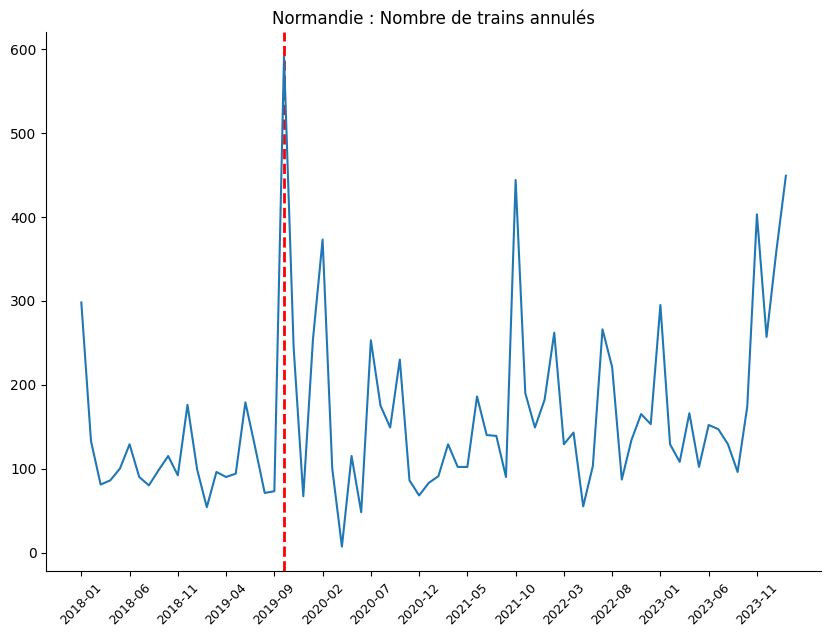

In [ ]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

ensemble_affichage=[i for i in range(len(Nor)) if i%5==0]
plt.xticks(ensemble_affichage,[Nor[Nor.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_Nor_2=param_list_Nor_2[max_index_Nor_2]
plt.axvline(x=index_list_Nor_2[max_index_Nor_2], color='red', linestyle='dashed', linewidth=2)

plt.plot(Nor['Date'],Nor['Nombre de trains annulés'])
plt.title("Normandie : Nombre de trains annulés")

plt.show()

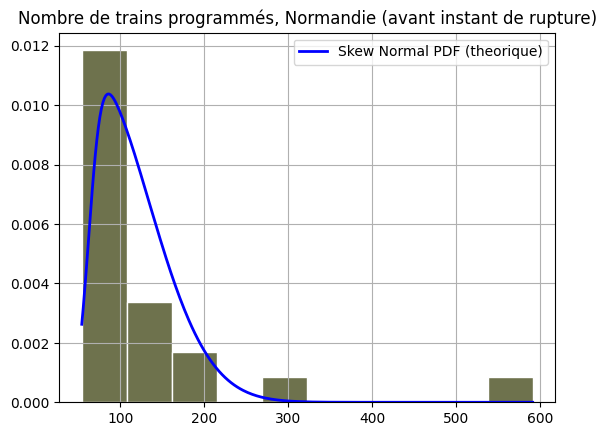

In [ ]:
k=index_list_Nor_2[max_index_Nor_2]

counts, bins, patches = plt.hist(Nor.loc[:k,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_Nor_2[4], param_Nor_2[0], param_Nor_2[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains programmés, Normandie (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

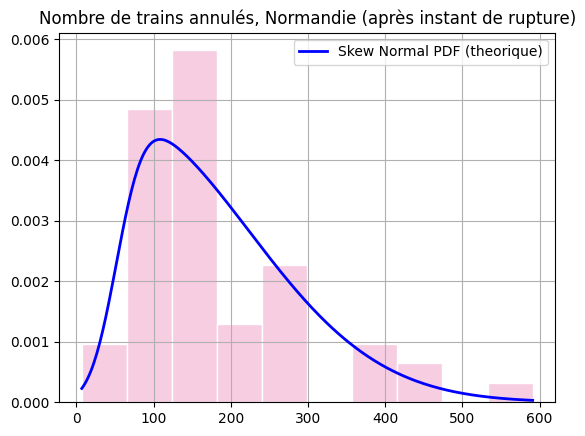

In [ ]:
counts, bins, patches = plt.hist(Nor.loc[k:,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_Nor_2[4], param_Nor_2[1], param_Nor_2[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title('Nombre de trains annulés, Normandie (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
data1 = Nor.loc[k:,'Nombre de trains annulés']
data2 = Nor.loc[:k,'Nombre de trains annulés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.4099485420240137
p-value: 0.007273663259491346
Reject null hypothesis, distributions likely differ.


###Occitanie

'Occitanie'

**Trains programmés**

###Midi Pyrénées

'Midi Pyrénées'

##---SEULEMENT SI LE TEMPS-----

### Limousin

# train programmes

In [11]:
c='Limousin'
X=df[df['Région']==c]
X=X.reset_index(inplace=False, drop=True)

X.head()

,Date,Région,Nombre de trains programmés,Nombre de trains ayant circulé,Nombre de trains annulés,Nombre de trains en retard à l'arrivée,Taux de régularité
0,2013-01,Limousin,3817.0,3770.0,47.0,210.0,94.429708
1,2013-02,Limousin,3449.0,3406.0,43.0,219.0,93.570170
2,2013-03,Limousin,3989.0,3855.0,134.0,193.0,94.993515
3,2013-04,Limousin,4030.0,3834.0,196.0,196.0,94.887846
4,2013-05,Limousin,3944.0,3897.0,47.0,171.0,95.612009


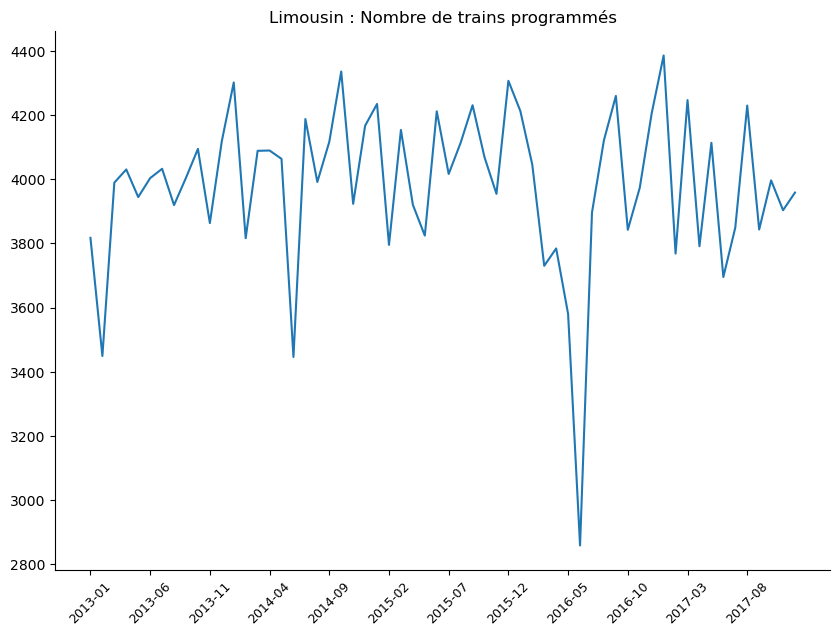

In [12]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(X['Date'],X['Nombre de trains programmés'])
plt.title(f"{c} : Nombre de trains programmés")

plt.show()

Limousin : Nombre de trains programmés


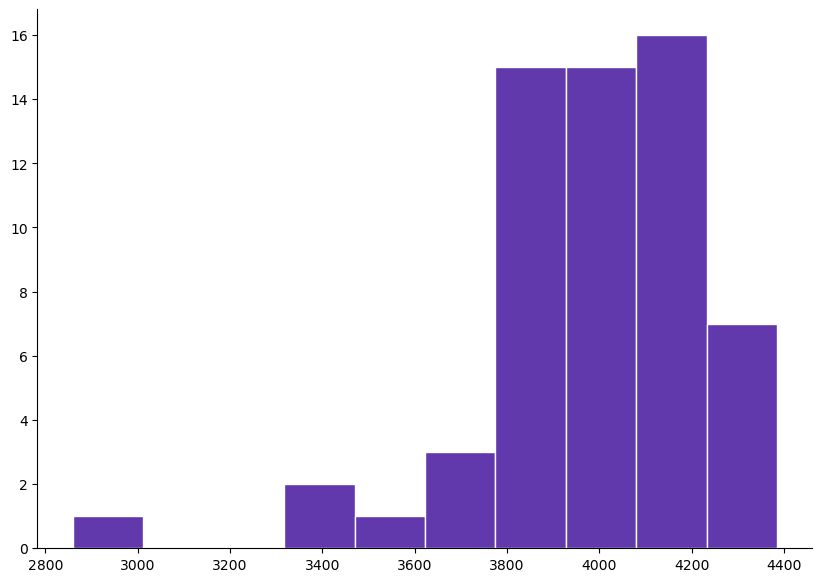

In [13]:
print(f"{c} : Nombre de trains programmés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(X[X.columns[2]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [15]:
index_list_X, param_list_X, log_lik_list_X=candidate_rupt(X['Nombre de trains programmés'])

In [16]:
max_value_X = max(log_lik_list_X)
max_index_X =log_lik_list_X.index(max_value_X)

Limousin : vraissemblance selon k


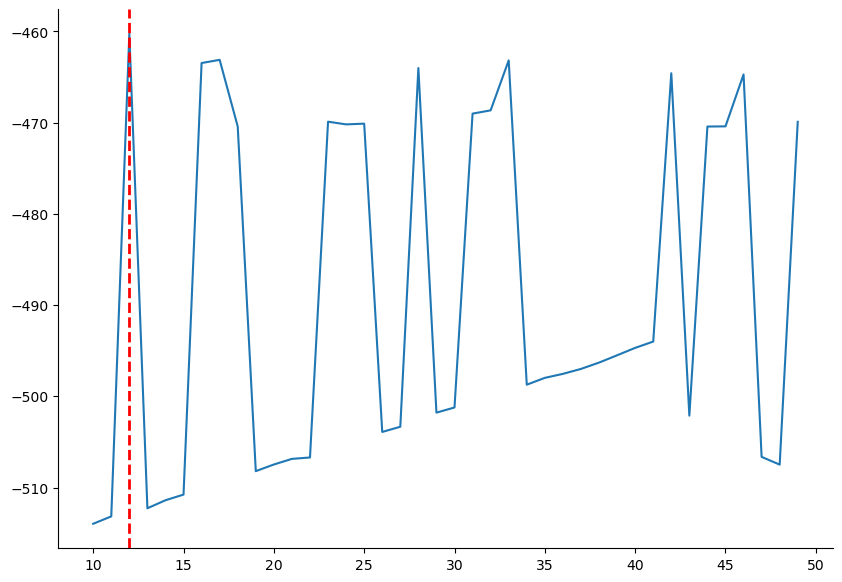

In [17]:
print(f"{c} : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_X,log_lik_list_X)
plt.axvline(x=index_list_X[max_index_X], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [18]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_X[max_index_X]}, Parametres des lois:{param_list_X[max_index_X]}")

Maximum de vraissemblance atteint pour k= 12, Parametres des lois:[4119.29835357 4319.91287425  244.05672843  422.30347788   -7.65708708]


In [19]:
k=index_list_X[max_index_X]
X.loc[k]

Date                                        2014-01
Région                                     Limousin
Nombre de trains programmés                  4301.0
Nombre de trains ayant circulé               4240.0
Nombre de trains annulés                       61.0
Nombre de trains en retard à l'arrivée        299.0
Taux de régularité                        92.948113
Name: 12, dtype: object

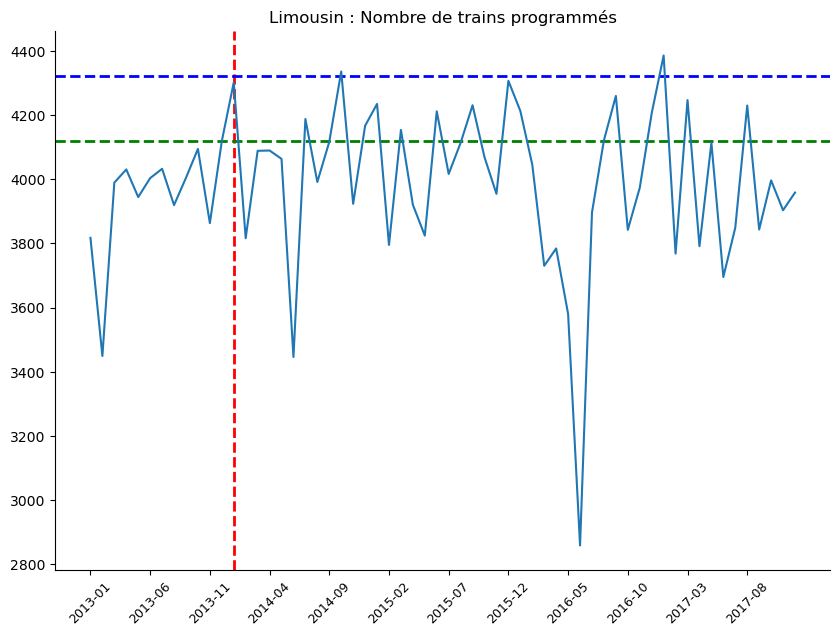

In [20]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_X=param_list_X[max_index_X]
plt.axvline(x=index_list_X[max_index_X], color='red', linestyle='dashed', linewidth=2)
plt.axhline(y=param_X[0], color='green', linestyle='dashed', linewidth=2)
plt.axhline(y=param_X[1], color='blue', linestyle='dashed', linewidth=2)

plt.plot(X['Date'],X['Nombre de trains programmés'])
plt.title(f"{c} : Nombre de trains programmés")

plt.show()

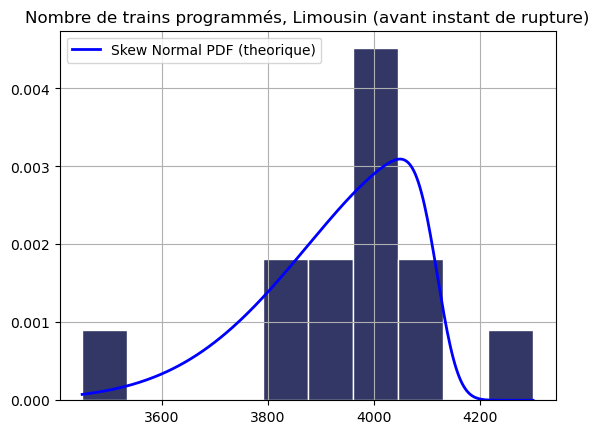

In [21]:
counts, bins, patches = plt.hist(X.loc[:k,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X[4], param_X[0], param_X[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés, {c} (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

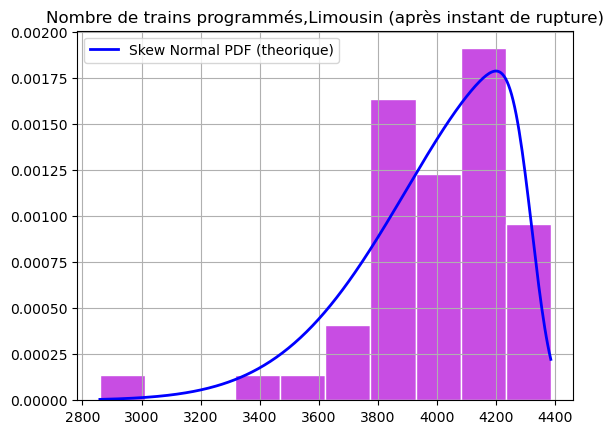

In [22]:
counts, bins, patches = plt.hist(X.loc[k:,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X[4], param_X[1], param_X[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés,{c} (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

### kolmogorov 

In [23]:
data1 = X.loc[index_list_X[max_index_X]:,'Nombre de trains programmés']
data2 = X.loc[:index_list_X[max_index_X],'Nombre de trains programmés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.2692307692307692
p-value: 0.3733815224618557
Fail to reject null hypothesis, distributions might be similar.


# Trains annules 

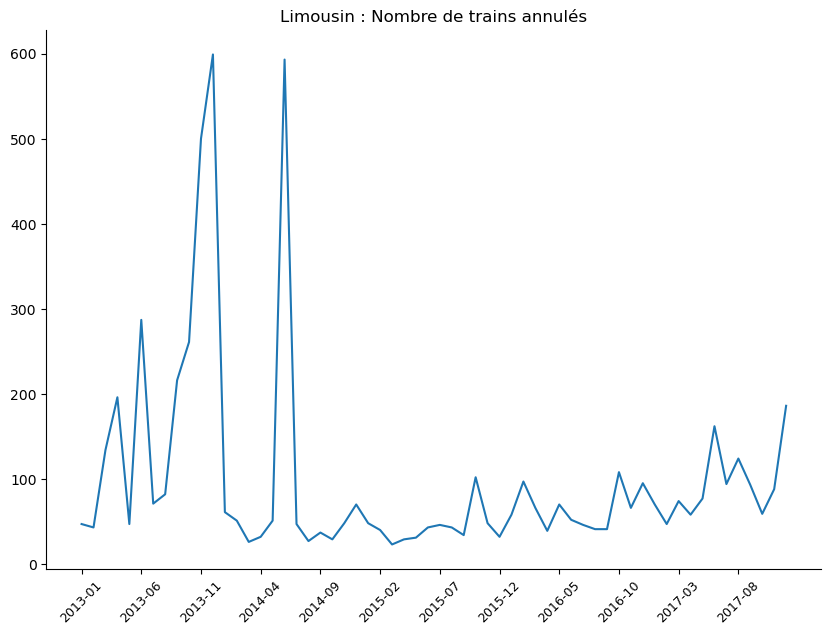

In [24]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(X['Date'],X['Nombre de trains annulés'])
plt.title(f"{c} : Nombre de trains annulés")

plt.show()


Limousin : Nombre de trains annulés


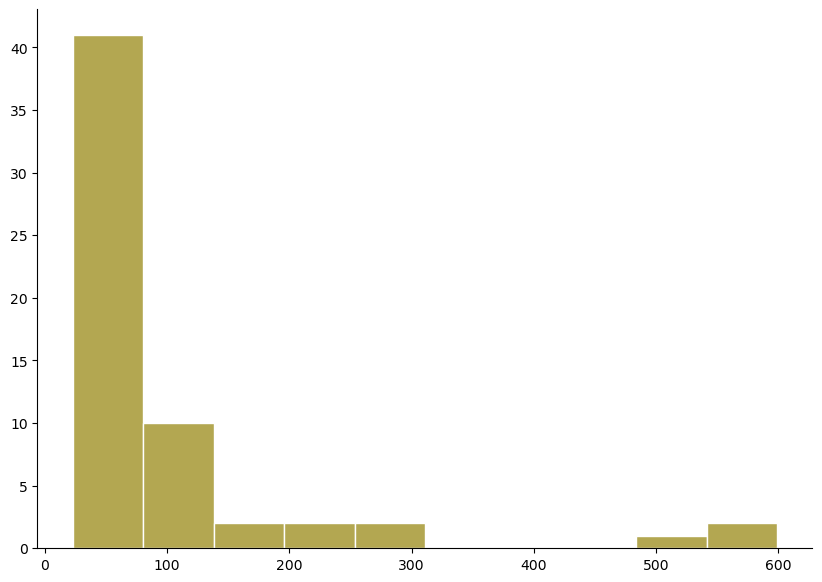

In [25]:
print(f"{c} : Nombre de trains annulés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(X[X.columns[4]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [26]:
index_list_X_2, param_list_X_2, log_lik_list_X_2=candidate_rupt(X['Nombre de trains annulés'])

In [27]:
max_value_X_2 = max(log_lik_list_X_2)
max_index_X_2 =log_lik_list_X_2.index(max_value_X_2)

Limousin : vraissemblance selon k


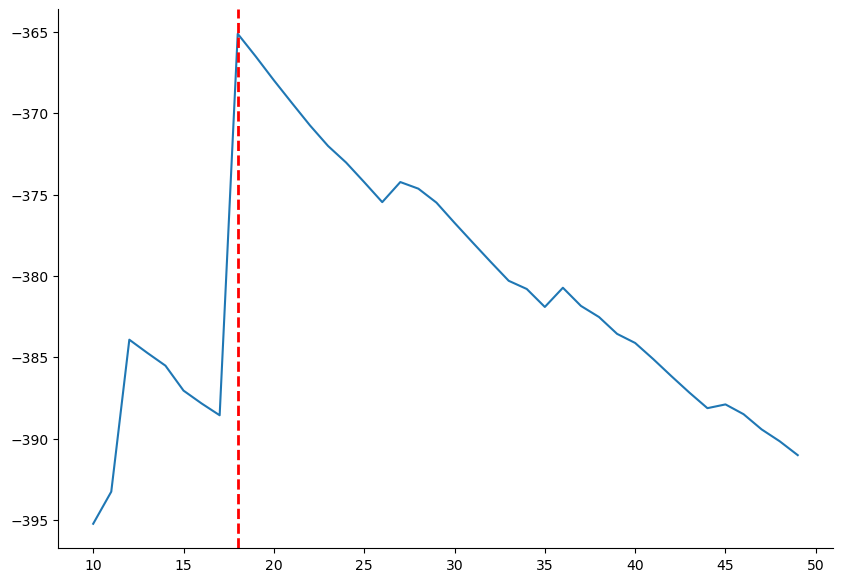

In [28]:
print(f"{c} : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_X_2,log_lik_list_X_2)
plt.axvline(x=index_list_X_2[max_index_X_2], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [29]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_X_2[max_index_X_2]}, Parametres des lois:{param_list_X_2[max_index_X_2]}")

Maximum de vraissemblance atteint pour k= 18, Parametres des lois:[  25.87174164   22.97165597  245.04125465   53.82118439 5391.82906561]


In [30]:
X.loc[index_list_X_2[max_index_X_2]]

Date                                       2014-07
Région                                    Limousin
Nombre de trains programmés                 4187.0
Nombre de trains ayant circulé              4140.0
Nombre de trains annulés                      47.0
Nombre de trains en retard à l'arrivée       329.0
Taux de régularité                        92.05314
Name: 18, dtype: object

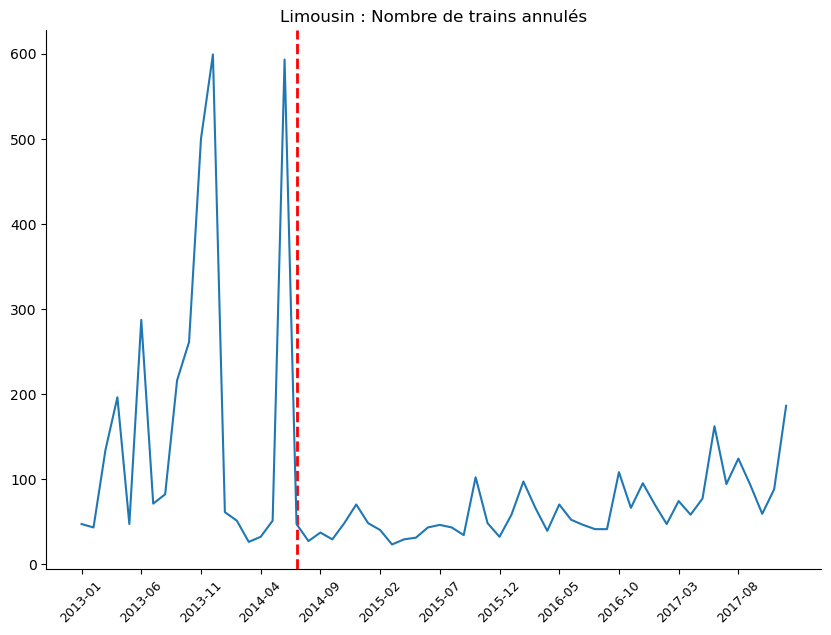

In [31]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_X_2=param_list_X_2[max_index_X_2]
plt.axvline(x=index_list_X_2[max_index_X_2], color='red', linestyle='dashed', linewidth=2)

plt.plot(X['Date'],X['Nombre de trains annulés'])
plt.title(f"{c} : Nombre de trains annulés")

plt.show()

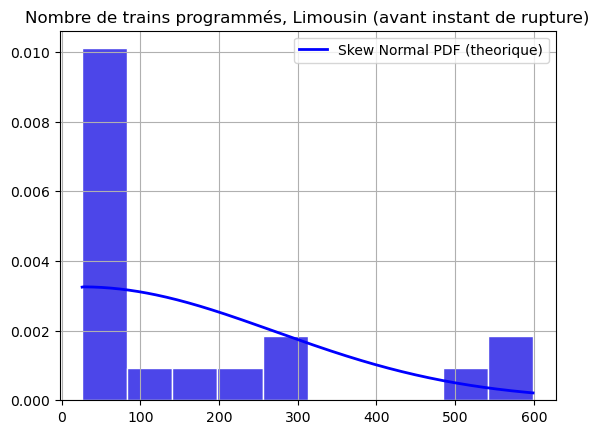

In [32]:
k=index_list_X_2[max_index_X_2]

counts, bins, patches = plt.hist(X.loc[:k,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X_2[4], param_X_2[0], param_X_2[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés, {c} (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

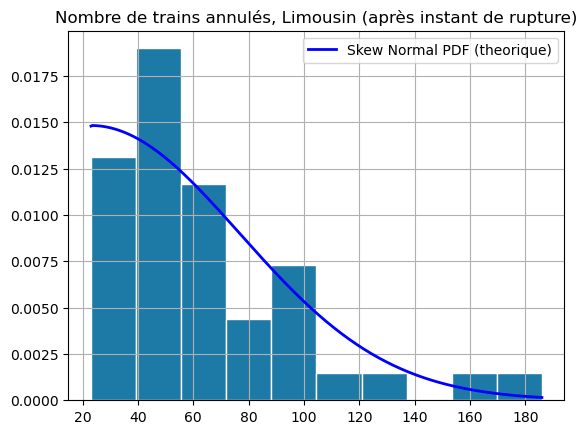

In [33]:
counts, bins, patches = plt.hist(X.loc[k:,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X_2[4], param_X_2[1], param_X_2[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains annulés, {c} (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

### kolmogorv test 


In [34]:
data1 = X.loc[k:,'Nombre de trains annulés']
data2 = X.loc[:k,'Nombre de trains annulés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.37343358395989973
p-value: 0.037536506275321964
Reject null hypothesis, distributions likely differ.


### Poitou Charentes

# train programmes

In [249]:
c='Poitou Charentes'
X=df[df['Région']==c]
X=X.reset_index(inplace=False, drop=True)

X.head()

,Date,Région,Nombre de trains programmés,Nombre de trains ayant circulé,Nombre de trains annulés,Nombre de trains en retard à l'arrivée,Taux de régularité
0,2013-01,Poitou Charentes,3269.0,3134.0,135.0,205.0,93.458839
1,2013-02,Poitou Charentes,3014.0,2991.0,23.0,118.0,96.054831
2,2013-03,Poitou Charentes,3433.0,3418.0,15.0,198.0,94.207139
3,2013-04,Poitou Charentes,3306.0,3285.0,21.0,181.0,94.490107
4,2013-05,Poitou Charentes,3292.0,3276.0,16.0,161.0,95.085470


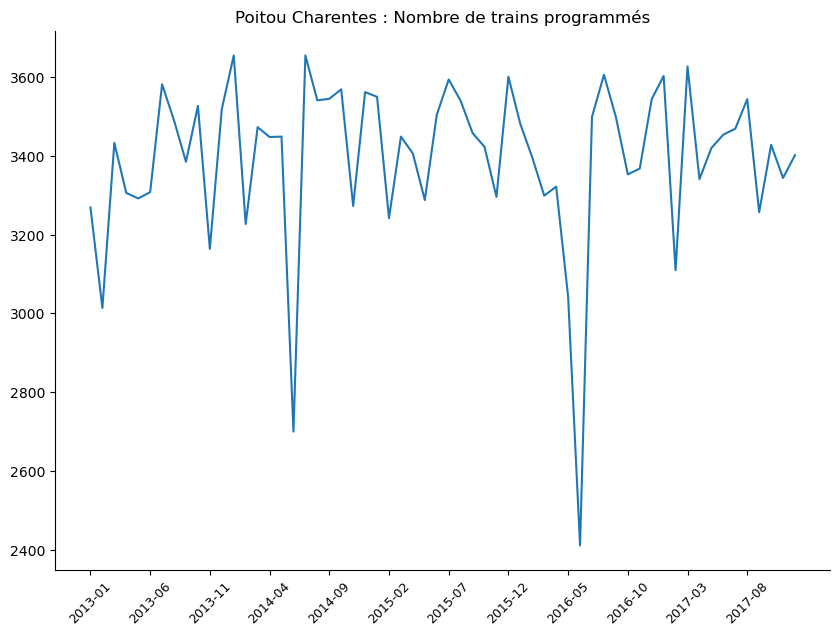

In [250]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(X['Date'],X['Nombre de trains programmés'])
plt.title(f"{c} : Nombre de trains programmés")

plt.show()

Poitou Charentes : Nombre de trains programmés


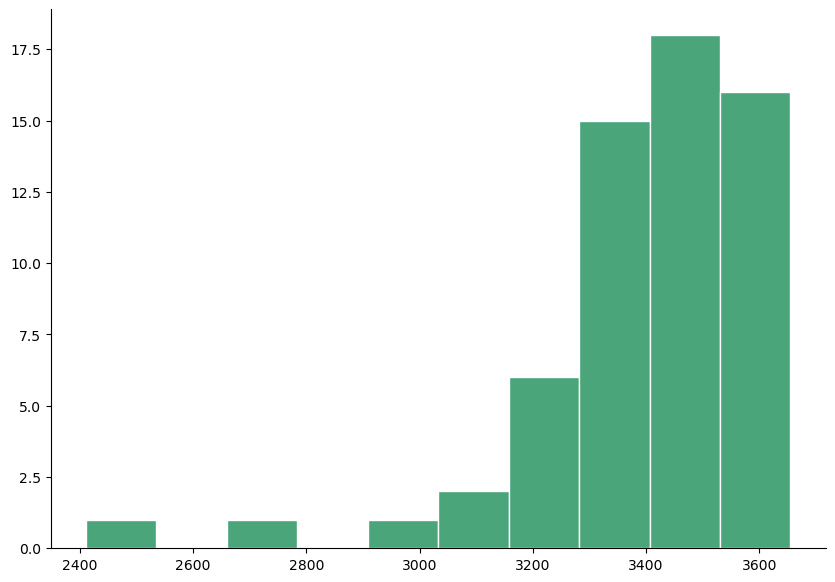

In [251]:
print(f"{c} : Nombre de trains programmés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(X[X.columns[2]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [252]:
index_list_X, param_list_X, log_lik_list_X=candidate_rupt(X['Nombre de trains programmés'])

In [253]:
max_value_X = max(log_lik_list_X)
max_index_X =log_lik_list_X.index(max_value_X)

Poitou Charentes : vraissemblance selon k


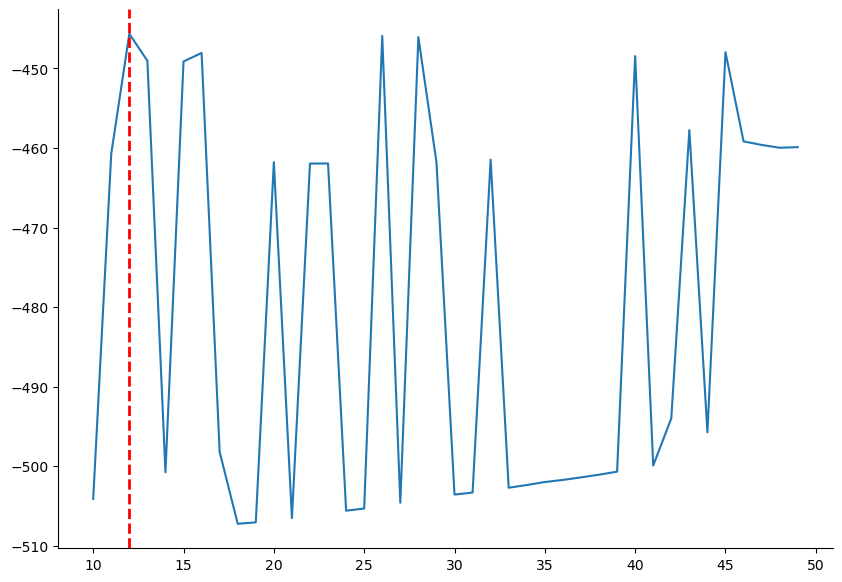

In [254]:
print(f"{c} : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_X,log_lik_list_X)
plt.axvline(x=index_list_X[max_index_X], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [255]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_X[max_index_X]}, Parametres des lois:{param_list_X[max_index_X]}")

Maximum de vraissemblance atteint pour k= 12, Parametres des lois:[ 3582.13717628  3655.15898673   275.07617267   338.32247108
 -6742.57674326]


In [256]:
k=index_list_X[max_index_X]
X.loc[k]

Date                                               2014-01
Région                                    Poitou Charentes
Nombre de trains programmés                         3655.0
Nombre de trains ayant circulé                      3620.0
Nombre de trains annulés                              35.0
Nombre de trains en retard à l'arrivée               165.0
Taux de régularité                               95.441989
Name: 12, dtype: object

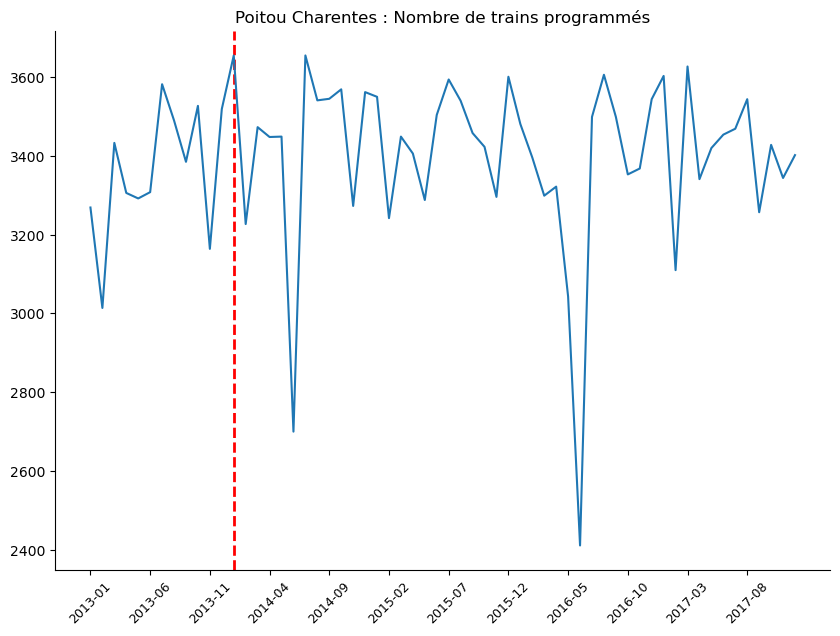

In [258]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_X=param_list_X[max_index_X]
plt.axvline(x=index_list_X[max_index_X], color='red', linestyle='dashed', linewidth=2)


plt.plot(X['Date'],X['Nombre de trains programmés'])
plt.title(f"{c} : Nombre de trains programmés")

plt.show()

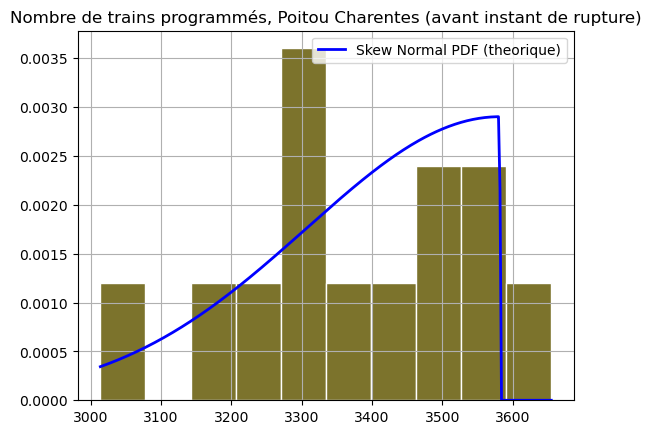

In [259]:
counts, bins, patches = plt.hist(X.loc[:k,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X[4], param_X[0], param_X[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés, {c} (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

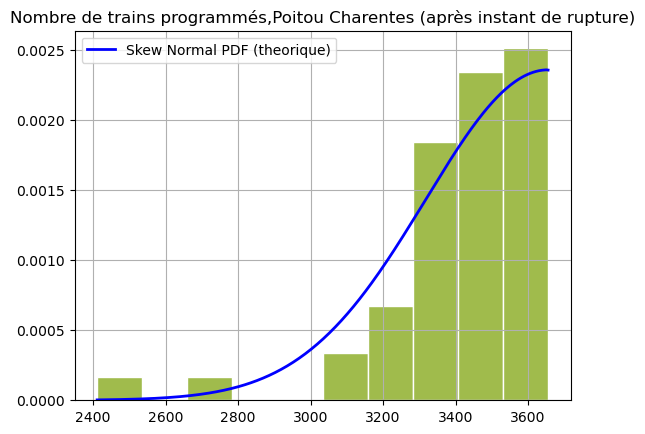

In [260]:
counts, bins, patches = plt.hist(X.loc[k:,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X[4], param_X[1], param_X[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés,{c} (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

### kolmogorov 

In [261]:
data1 = X.loc[index_list_X[max_index_X]:,'Nombre de trains programmés']
data2 = X.loc[:index_list_X[max_index_X],'Nombre de trains programmés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.23237179487179488
p-value: 0.5538879664140183
Fail to reject null hypothesis, distributions might be similar.


# Trains annules 

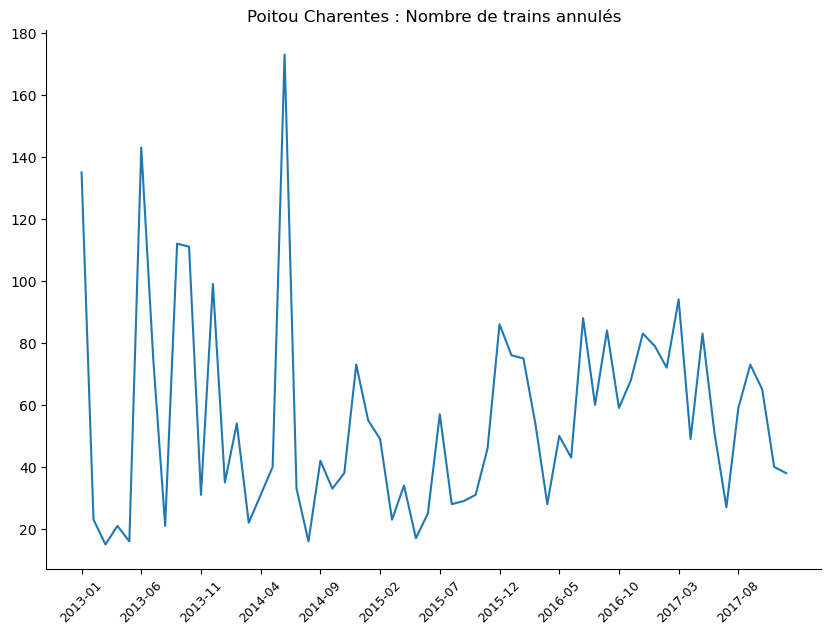

In [262]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(X['Date'],X['Nombre de trains annulés'])
plt.title(f"{c} : Nombre de trains annulés")

plt.show()


Poitou Charentes : Nombre de trains annulés


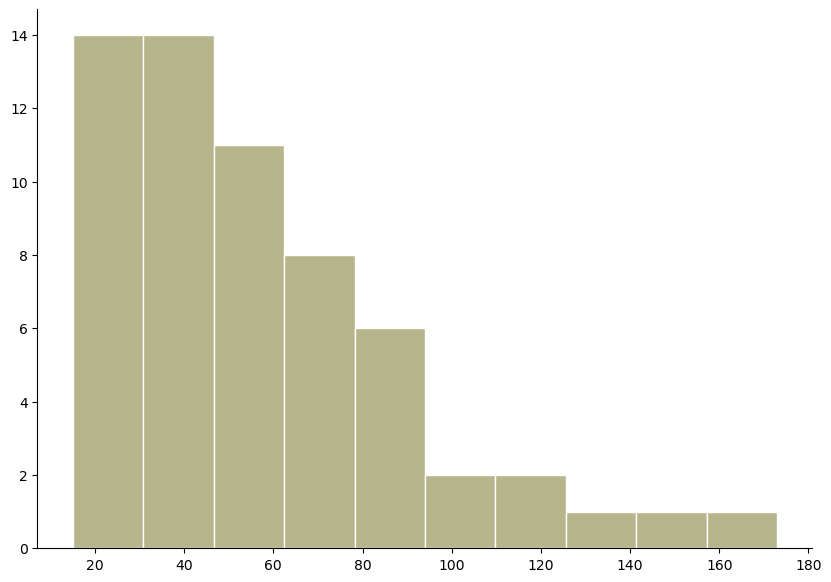

In [263]:
print(f"{c} : Nombre de trains annulés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(X[X.columns[4]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [264]:
index_list_X_2, param_list_X_2, log_lik_list_X_2=candidate_rupt(X['Nombre de trains annulés'])

In [265]:
max_value_X_2 = max(log_lik_list_X_2)
max_index_X_2 =log_lik_list_X_2.index(max_value_X_2)

Poitou Charentes : vraissemblance selon k


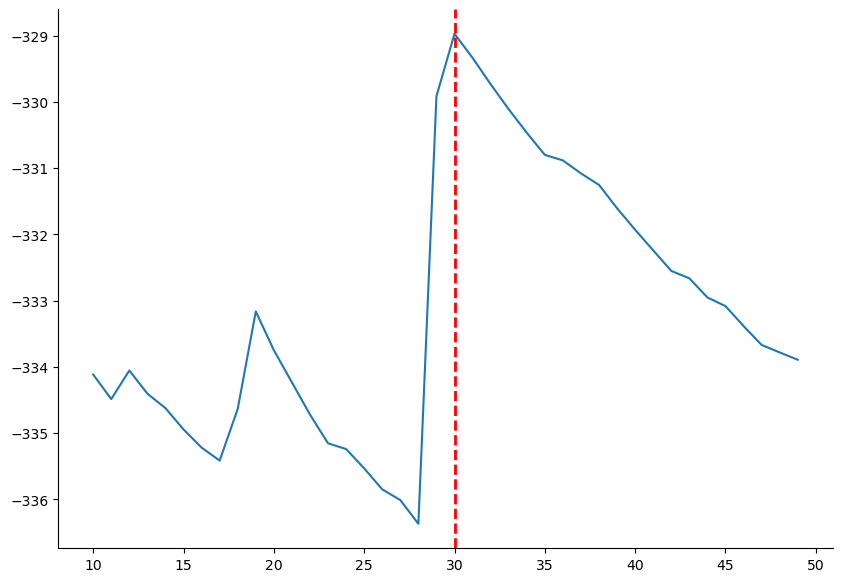

In [266]:
print(f"{c} : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_X_2,log_lik_list_X_2)
plt.axvline(x=index_list_X_2[max_index_X_2], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [267]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_X_2[max_index_X_2]}, Parametres des lois:{param_list_X_2[max_index_X_2]}")

Maximum de vraissemblance atteint pour k= 30, Parametres des lois:[  14.97714031   26.98510388   56.7978593    37.94234006 7905.45847622]


In [268]:
X.loc[index_list_X_2[max_index_X_2]]

Date                                               2015-07
Région                                    Poitou Charentes
Nombre de trains programmés                         3594.0
Nombre de trains ayant circulé                      3537.0
Nombre de trains annulés                              57.0
Nombre de trains en retard à l'arrivée               321.0
Taux de régularité                               90.924512
Name: 30, dtype: object

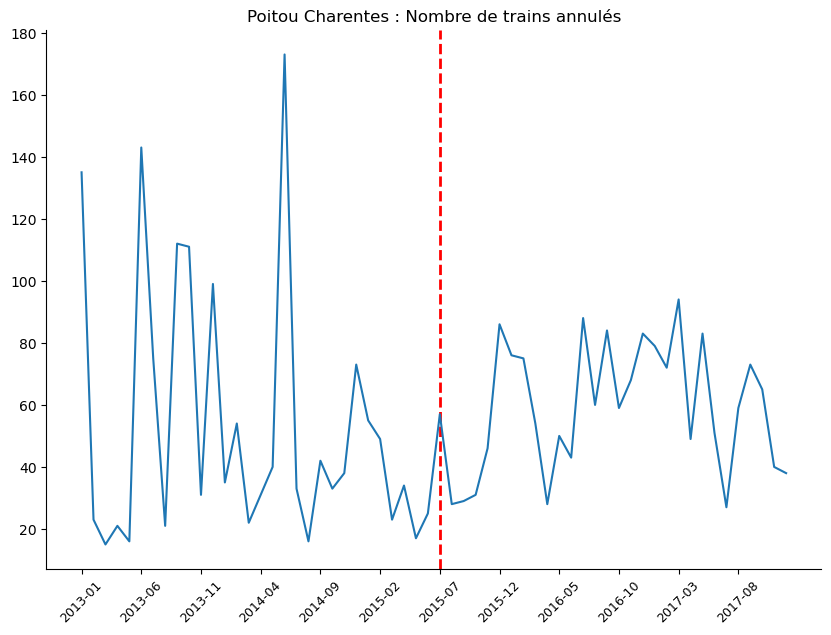

In [269]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_X_2=param_list_X_2[max_index_X_2]
plt.axvline(x=index_list_X_2[max_index_X_2], color='red', linestyle='dashed', linewidth=2)

plt.plot(X['Date'],X['Nombre de trains annulés'])
plt.title(f"{c} : Nombre de trains annulés")

plt.show()

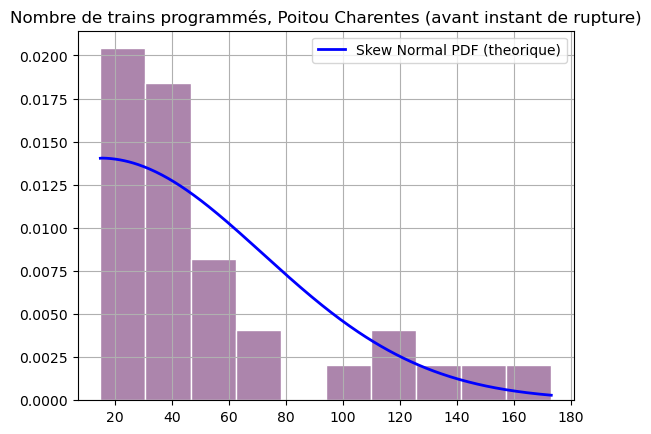

In [270]:
k=index_list_X_2[max_index_X_2]

counts, bins, patches = plt.hist(X.loc[:k,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X_2[4], param_X_2[0], param_X_2[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés, {c} (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

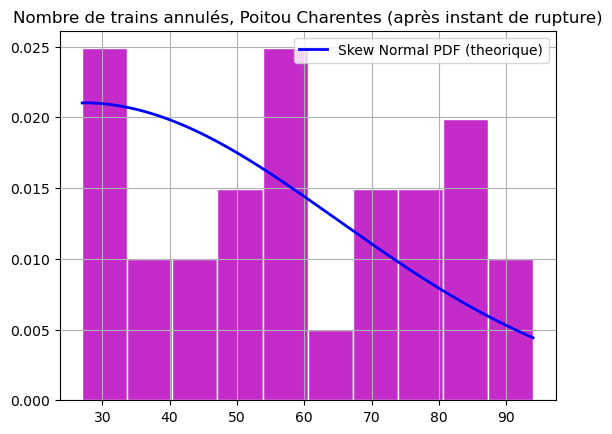

In [271]:
counts, bins, patches = plt.hist(X.loc[k:,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X_2[4], param_X_2[1], param_X_2[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains annulés, {c} (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

### kolmogorv test 


In [272]:
data1 = X.loc[k:,'Nombre de trains annulés']
data2 = X.loc[:k,'Nombre de trains annulés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.3795698924731183
p-value: 0.016054794696132604
Reject null hypothesis, distributions likely differ.


### Picardie

# train programmes

In [60]:
c='Picardie'
X=df[df['Région']==c]
X=X.reset_index(inplace=False, drop=True)

X.head()

,Date,Région,Nombre de trains programmés,Nombre de trains ayant circulé,Nombre de trains annulés,Nombre de trains en retard à l'arrivée,Taux de régularité
0,2013-01,Picardie,11754.0,11673.0,81.0,1245.0,89.334361
1,2013-02,Picardie,10215.0,10137.0,78.0,879.0,91.328796
2,2013-03,Picardie,10440.0,10304.0,136.0,882.0,91.440217
3,2013-04,Picardie,10870.0,10819.0,51.0,657.0,93.927350
4,2013-05,Picardie,10505.0,10450.0,55.0,623.0,94.038278


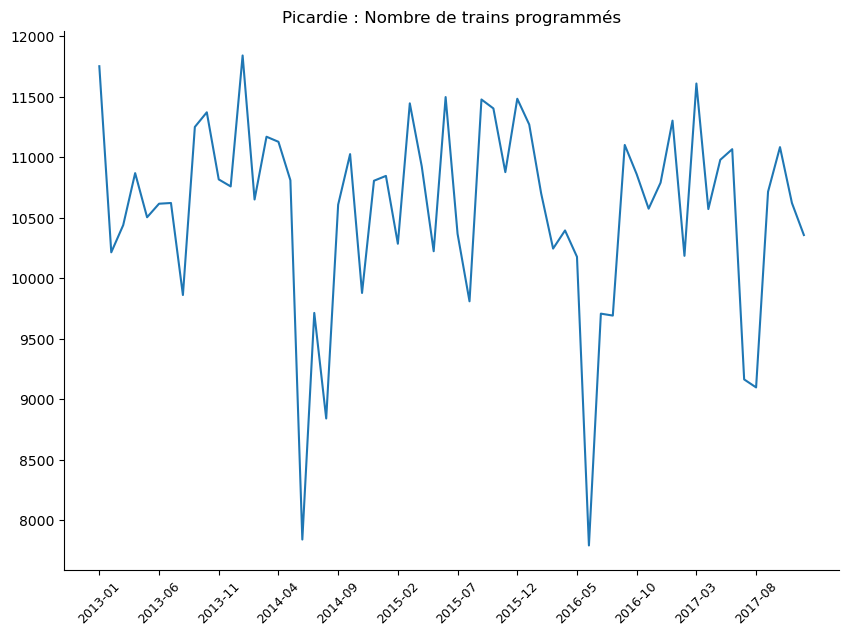

In [61]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(X['Date'],X['Nombre de trains programmés'])
plt.title(f"{c} : Nombre de trains programmés")

plt.show()

Picardie : Nombre de trains programmés


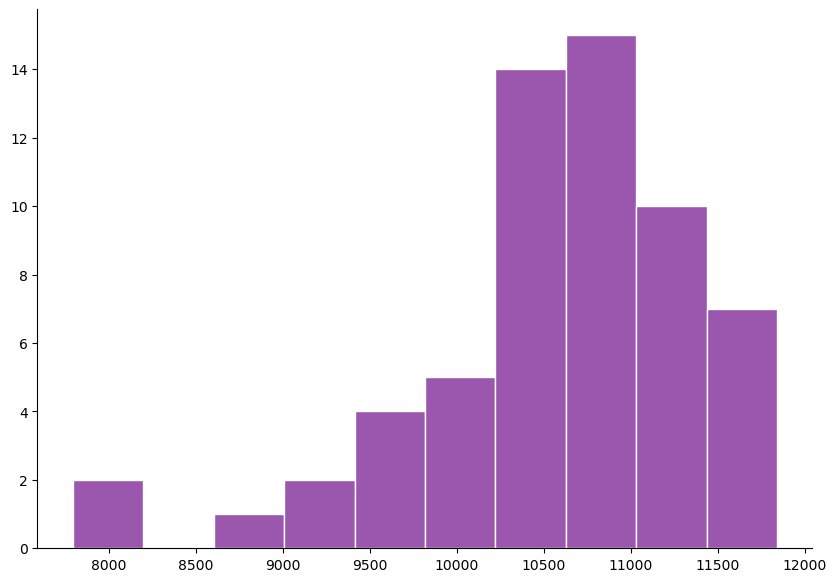

In [62]:
print(f"{c} : Nombre de trains programmés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(X[X.columns[2]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [63]:
index_list_X, param_list_X, log_lik_list_X=candidate_rupt(X['Nombre de trains programmés'])

In [64]:
max_value_X = max(log_lik_list_X)
max_index_X =log_lik_list_X.index(max_value_X)

Picardie : vraissemblance selon k


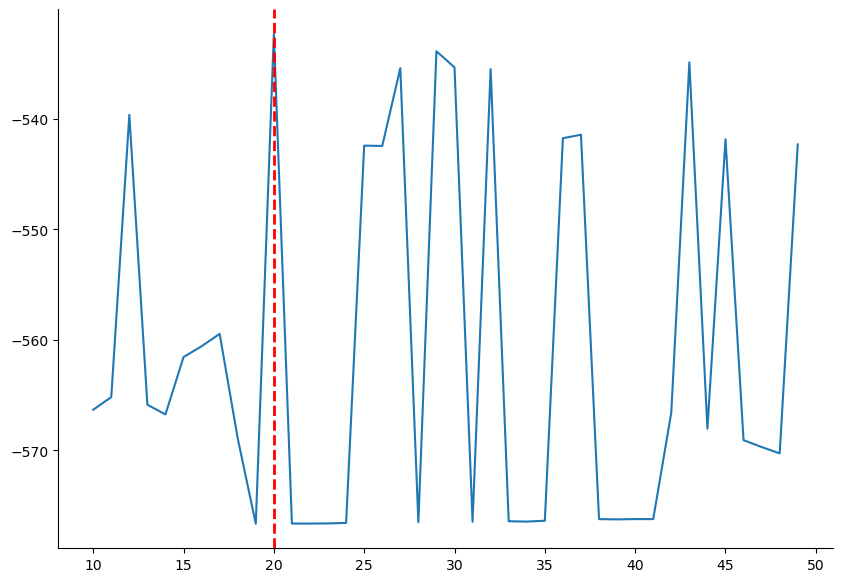

In [65]:
print(f"{c} : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_X,log_lik_list_X)
plt.axvline(x=index_list_X[max_index_X], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [66]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_X[max_index_X]}, Parametres des lois:{param_list_X[max_index_X]}")

Maximum de vraissemblance atteint pour k= 20, Parametres des lois:[11843.70088762 11611.52940781  1582.61617503  1282.41966323
 -7259.54828735]


In [67]:
k=index_list_X[max_index_X]
X.loc[k]

Date                                        2014-09
Région                                     Picardie
Nombre de trains programmés                 10609.0
Nombre de trains ayant circulé              10332.0
Nombre de trains annulés                      277.0
Nombre de trains en retard à l'arrivée        963.0
Taux de régularité                        90.679443
Name: 20, dtype: object

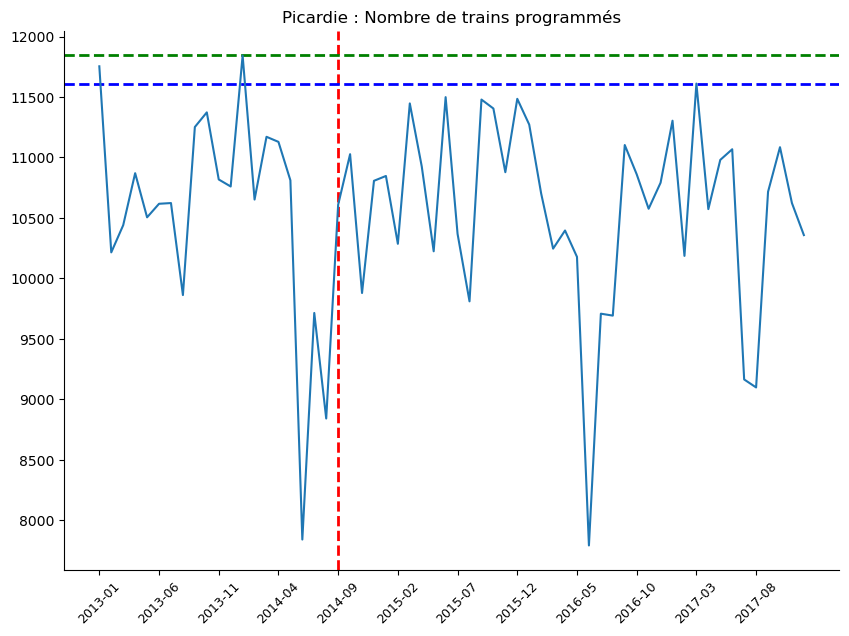

In [68]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_X=param_list_X[max_index_X]
plt.axvline(x=index_list_X[max_index_X], color='red', linestyle='dashed', linewidth=2)
plt.axhline(y=param_X[0], color='green', linestyle='dashed', linewidth=2)
plt.axhline(y=param_X[1], color='blue', linestyle='dashed', linewidth=2)

plt.plot(X['Date'],X['Nombre de trains programmés'])
plt.title(f"{c} : Nombre de trains programmés")

plt.show()

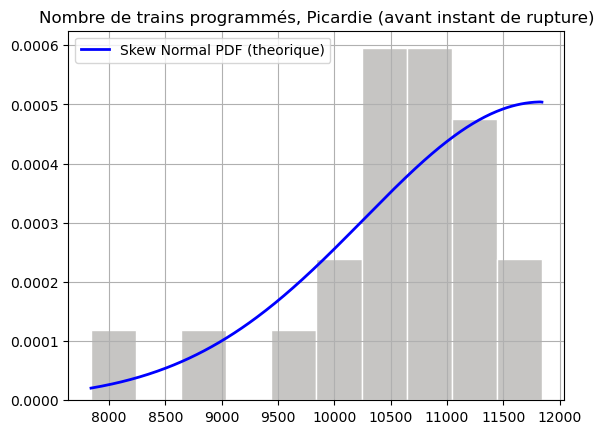

In [69]:
counts, bins, patches = plt.hist(X.loc[:k,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X[4], param_X[0], param_X[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés, {c} (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

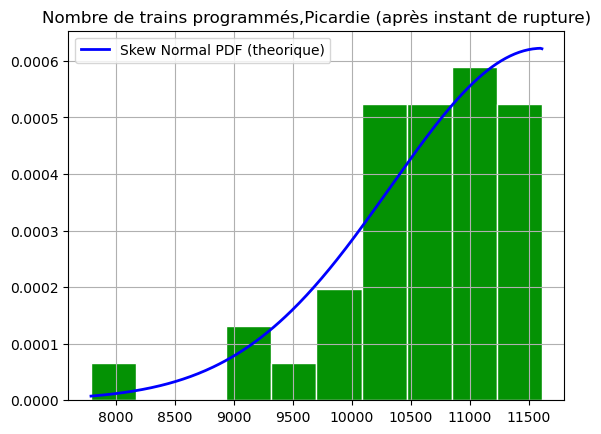

In [70]:
counts, bins, patches = plt.hist(X.loc[k:,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X[4], param_X[1], param_X[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés,{c} (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

### kolmogorov 

In [71]:
data1 = X.loc[index_list_X[max_index_X]:,'Nombre de trains programmés']
data2 = X.loc[:index_list_X[max_index_X],'Nombre de trains programmés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.13690476190476192
p-value: 0.9151706162260514
Fail to reject null hypothesis, distributions might be similar.


# Trains annules 

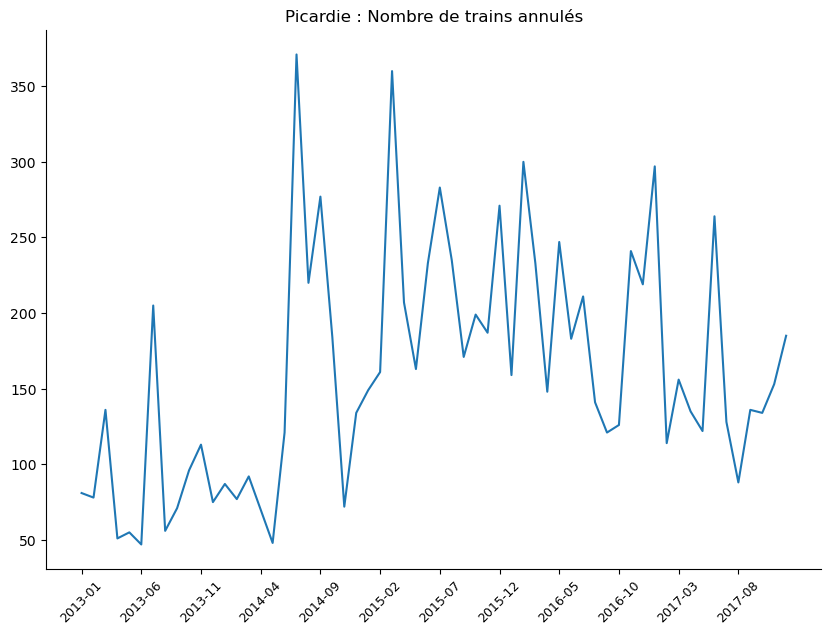

In [72]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(X['Date'],X['Nombre de trains annulés'])
plt.title(f"{c} : Nombre de trains annulés")

plt.show()


Picardie : Nombre de trains annulés


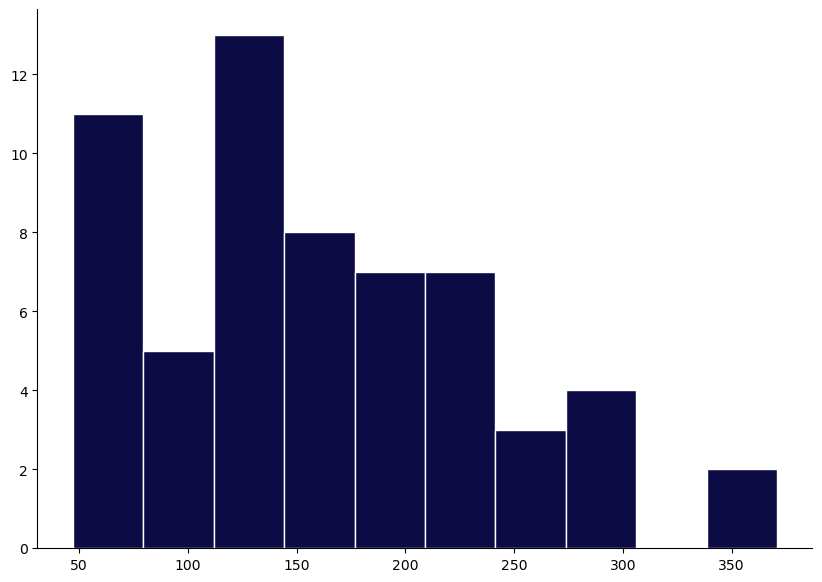

In [73]:
print(f"{c} : Nombre de trains annulés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(X[X.columns[4]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [74]:
index_list_X_2, param_list_X_2, log_lik_list_X_2=candidate_rupt(X['Nombre de trains annulés'])

In [75]:
max_value_X_2 = max(log_lik_list_X_2)
max_index_X_2 =log_lik_list_X_2.index(max_value_X_2)

Picardie : vraissemblance selon k


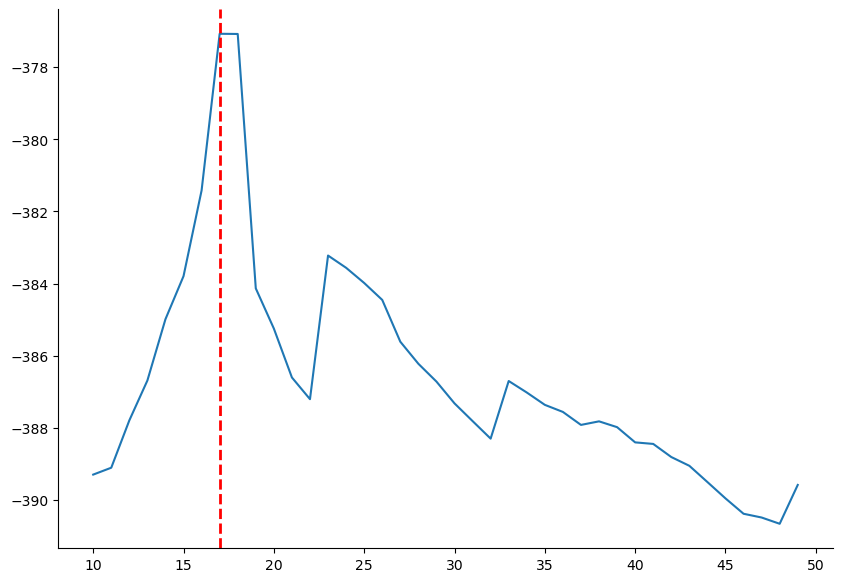

In [76]:
print(f"{c} : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_X_2,log_lik_list_X_2)
plt.axvline(x=index_list_X_2[max_index_X_2], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [77]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_X_2[max_index_X_2]}, Parametres des lois:{param_list_X_2[max_index_X_2]}")

Maximum de vraissemblance atteint pour k= 17, Parametres des lois:[ 45.09814097 103.20437657  52.80734433 113.62313465   5.65689154]


In [78]:
X.loc[index_list_X_2[max_index_X_2]]

Date                                        2014-06
Région                                     Picardie
Nombre de trains programmés                  7840.0
Nombre de trains ayant circulé               7719.0
Nombre de trains annulés                      121.0
Nombre de trains en retard à l'arrivée        780.0
Taux de régularité                        89.895064
Name: 17, dtype: object

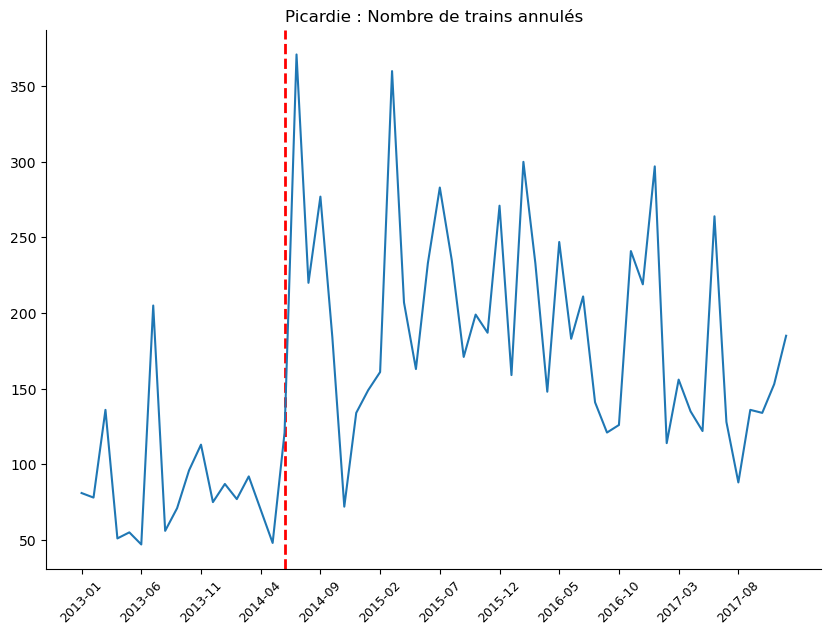

In [79]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_X_2=param_list_X_2[max_index_X_2]
plt.axvline(x=index_list_X_2[max_index_X_2], color='red', linestyle='dashed', linewidth=2)

plt.plot(X['Date'],X['Nombre de trains annulés'])
plt.title(f"{c} : Nombre de trains annulés")

plt.show()

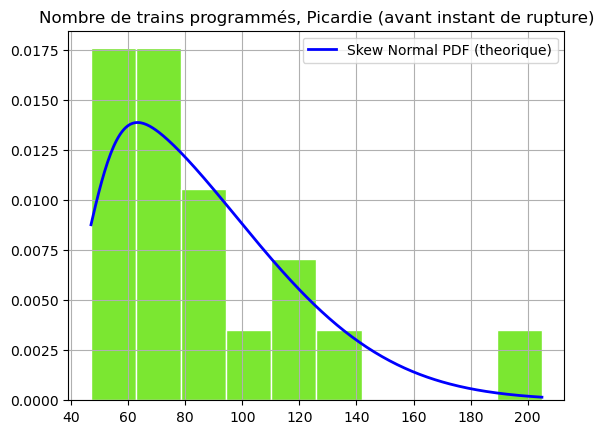

In [80]:
k=index_list_X_2[max_index_X_2]

counts, bins, patches = plt.hist(X.loc[:k,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X_2[4], param_X_2[0], param_X_2[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés, {c} (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

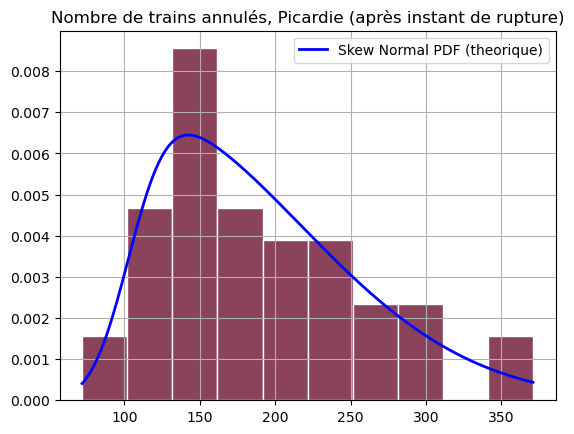

In [81]:
counts, bins, patches = plt.hist(X.loc[k:,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X_2[4], param_X_2[1], param_X_2[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains annulés, {c} (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

### kolmogorv test 


In [82]:
data1 = X.loc[k:,'Nombre de trains annulés']
data2 = X.loc[:k,'Nombre de trains annulés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.7868217054263565
p-value: 1.970219659525739e-08
Reject null hypothesis, distributions likely differ.


### Rhône Alpes

# train programmes

In [83]:
c='Rhône Alpes'
X=df[df['Région']==c]
X=X.reset_index(inplace=False, drop=True)

X.head()

,Date,Région,Nombre de trains programmés,Nombre de trains ayant circulé,Nombre de trains annulés,Nombre de trains en retard à l'arrivée,Taux de régularité
0,2013-01,Rhône Alpes,31438.0,30779.0,659.0,3552.0,88.459664
1,2013-02,Rhône Alpes,28215.0,27910.0,305.0,3771.0,86.488714
2,2013-03,Rhône Alpes,29670.0,29424.0,246.0,3644.0,87.615552
3,2013-04,Rhône Alpes,25660.0,25326.0,334.0,3016.0,88.091290
4,2013-05,Rhône Alpes,26805.0,26527.0,278.0,2512.0,90.530403


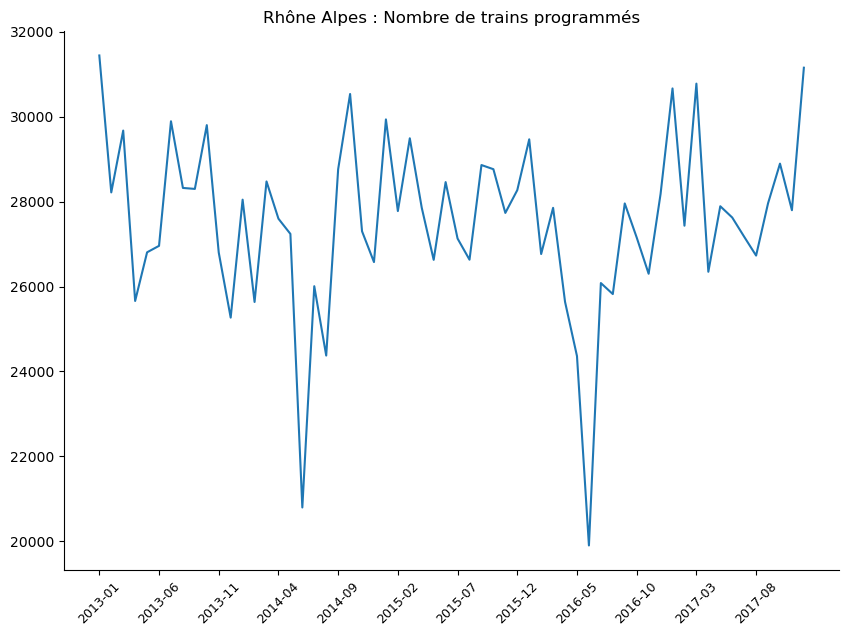

In [84]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(X['Date'],X['Nombre de trains programmés'])
plt.title(f"{c} : Nombre de trains programmés")

plt.show()

Rhône Alpes : Nombre de trains programmés


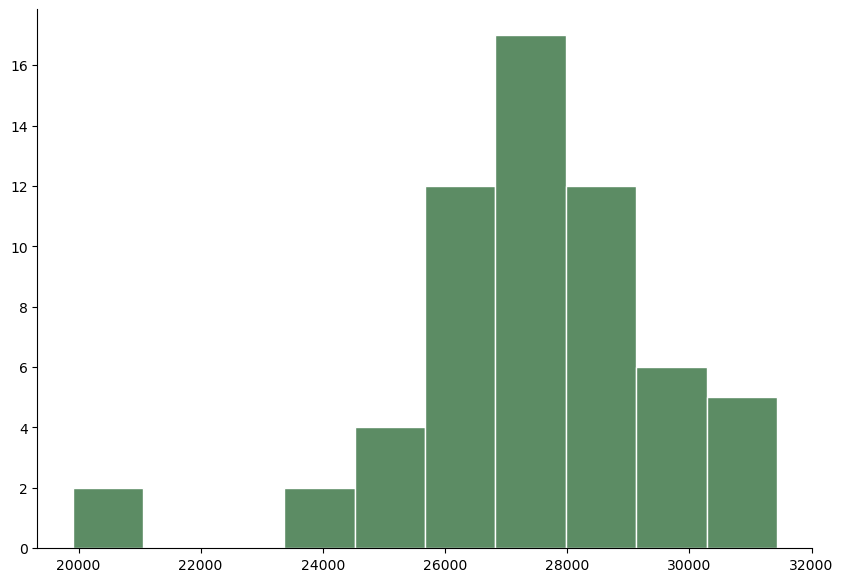

In [85]:
print(f"{c} : Nombre de trains programmés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(X[X.columns[2]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [86]:
index_list_X, param_list_X, log_lik_list_X=candidate_rupt(X['Nombre de trains programmés'])

In [87]:
max_value_X = max(log_lik_list_X)
max_index_X =log_lik_list_X.index(max_value_X)

Rhône Alpes : vraissemblance selon k


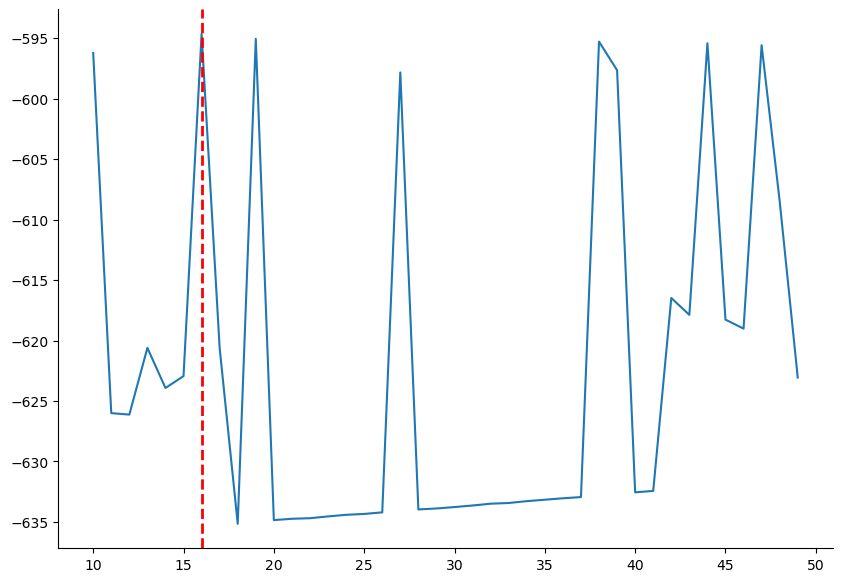

In [88]:
print(f"{c} : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_X,log_lik_list_X)
plt.axvline(x=index_list_X[max_index_X], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [89]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_X[max_index_X]}, Parametres des lois:{param_list_X[max_index_X]}")

Maximum de vraissemblance atteint pour k= 16, Parametres des lois:[ 2.97352480e+04  2.94641276e+04  2.53028147e+03  2.96788181e+03
 -2.02891459e+00]


In [90]:
k=index_list_X[max_index_X]
X.loc[k]

Date                                          2014-05
Région                                    Rhône Alpes
Nombre de trains programmés                   27238.0
Nombre de trains ayant circulé                26528.0
Nombre de trains annulés                        710.0
Nombre de trains en retard à l'arrivée         2621.0
Taux de régularité                          90.119873
Name: 16, dtype: object

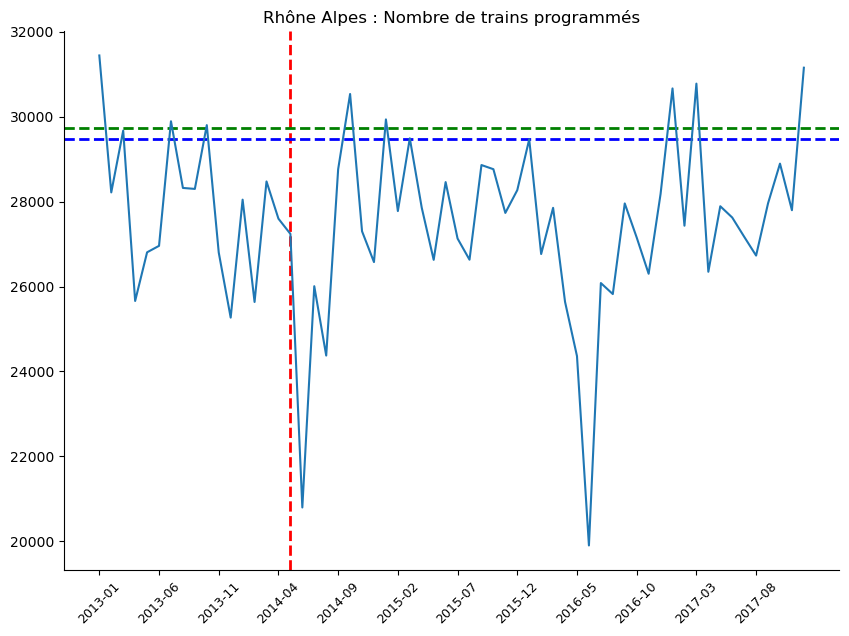

In [91]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_X=param_list_X[max_index_X]
plt.axvline(x=index_list_X[max_index_X], color='red', linestyle='dashed', linewidth=2)
plt.axhline(y=param_X[0], color='green', linestyle='dashed', linewidth=2)
plt.axhline(y=param_X[1], color='blue', linestyle='dashed', linewidth=2)

plt.plot(X['Date'],X['Nombre de trains programmés'])
plt.title(f"{c} : Nombre de trains programmés")

plt.show()

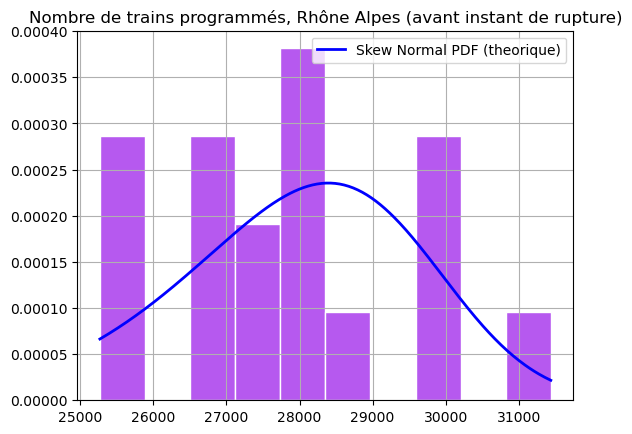

In [92]:
counts, bins, patches = plt.hist(X.loc[:k,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X[4], param_X[0], param_X[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés, {c} (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

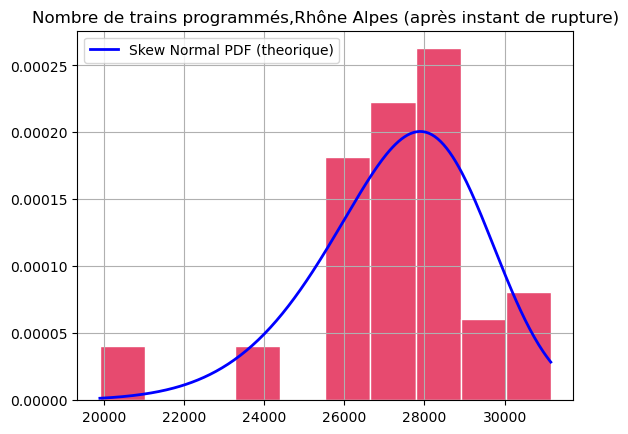

In [93]:
counts, bins, patches = plt.hist(X.loc[k:,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X[4], param_X[1], param_X[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés,{c} (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

### kolmogorov 

In [94]:
data1 = X.loc[index_list_X[max_index_X]:,'Nombre de trains programmés']
data2 = X.loc[:index_list_X[max_index_X],'Nombre de trains programmés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.21122994652406418
p-value: 0.5614933467778621
Fail to reject null hypothesis, distributions might be similar.


# Trains annules 

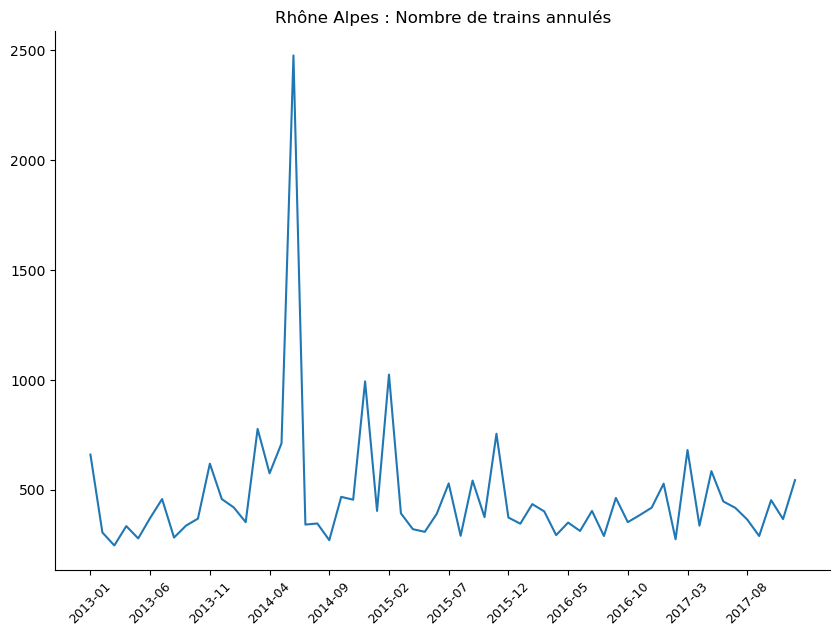

In [95]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(X['Date'],X['Nombre de trains annulés'])
plt.title(f"{c} : Nombre de trains annulés")

plt.show()


Rhône Alpes : Nombre de trains annulés


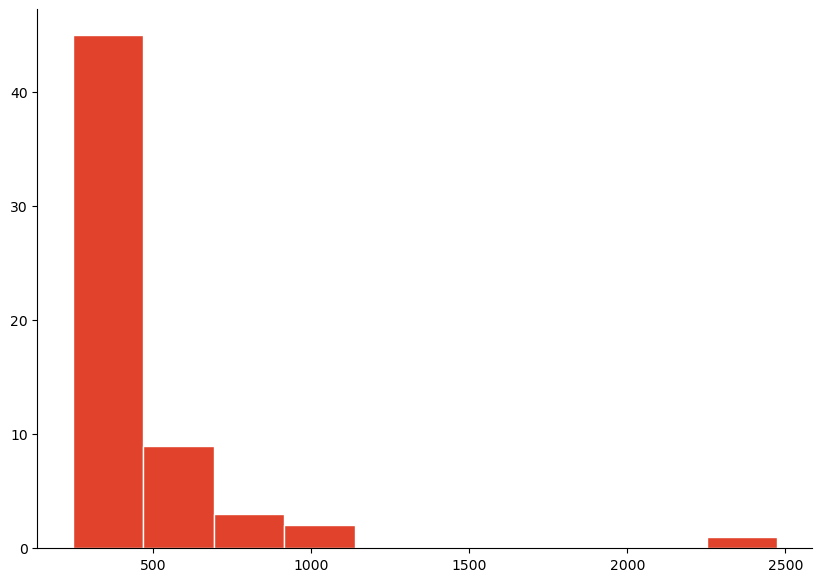

In [96]:
print(f"{c} : Nombre de trains annulés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(X[X.columns[4]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [97]:
index_list_X_2, param_list_X_2, log_lik_list_X_2=candidate_rupt(X['Nombre de trains annulés'])

In [98]:
max_value_X_2 = max(log_lik_list_X_2)
max_index_X_2 =log_lik_list_X_2.index(max_value_X_2)

Rhône Alpes : vraissemblance selon k


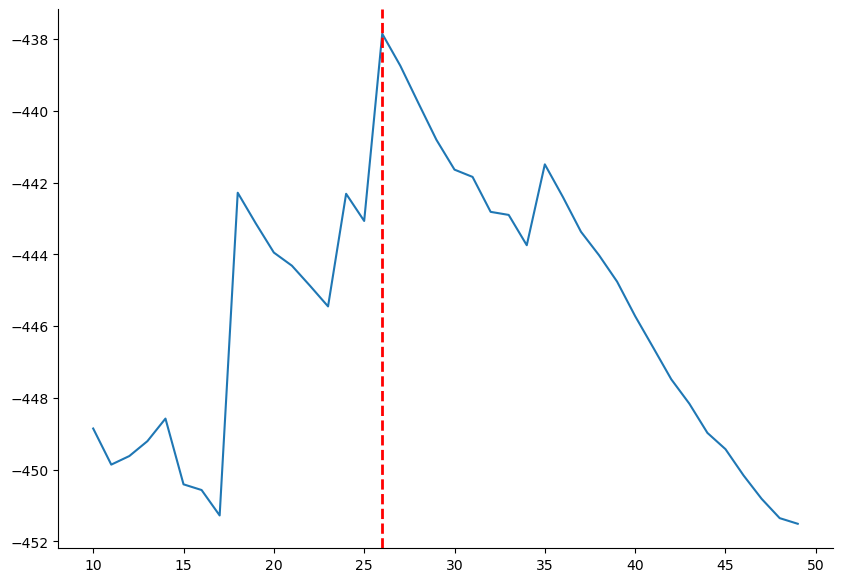

In [99]:
print(f"{c} : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_X_2,log_lik_list_X_2)
plt.axvline(x=index_list_X_2[max_index_X_2], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [100]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_X_2[max_index_X_2]}, Parametres des lois:{param_list_X_2[max_index_X_2]}")

Maximum de vraissemblance atteint pour k= 26, Parametres des lois:[ 245.64295584  273.88998713  539.63249597  177.56820259 4675.56056861]


In [101]:
X.loc[index_list_X_2[max_index_X_2]]

Date                                          2015-03
Région                                    Rhône Alpes
Nombre de trains programmés                   29488.0
Nombre de trains ayant circulé                29096.0
Nombre de trains annulés                        392.0
Nombre de trains en retard à l'arrivée         2773.0
Taux de régularité                           90.46948
Name: 26, dtype: object

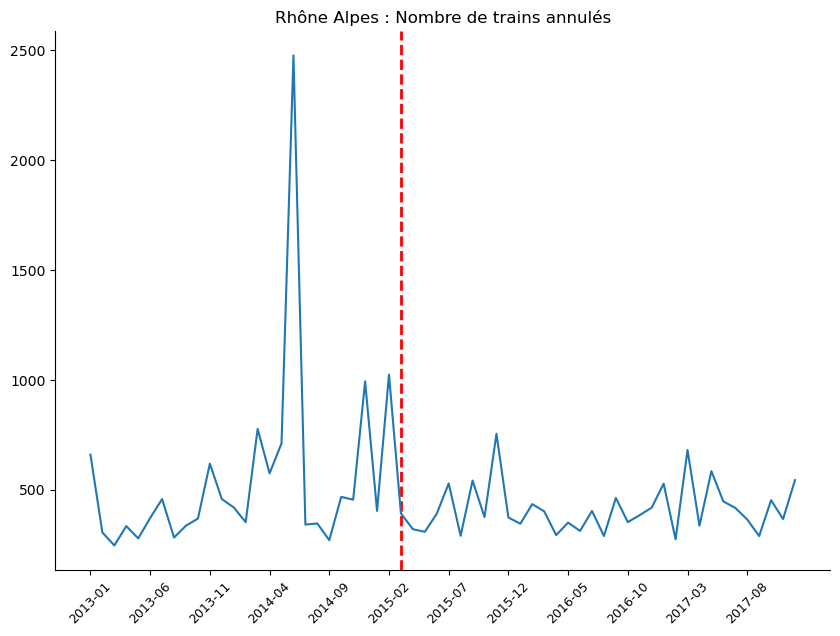

In [102]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_X_2=param_list_X_2[max_index_X_2]
plt.axvline(x=index_list_X_2[max_index_X_2], color='red', linestyle='dashed', linewidth=2)

plt.plot(X['Date'],X['Nombre de trains annulés'])
plt.title(f"{c} : Nombre de trains annulés")

plt.show()

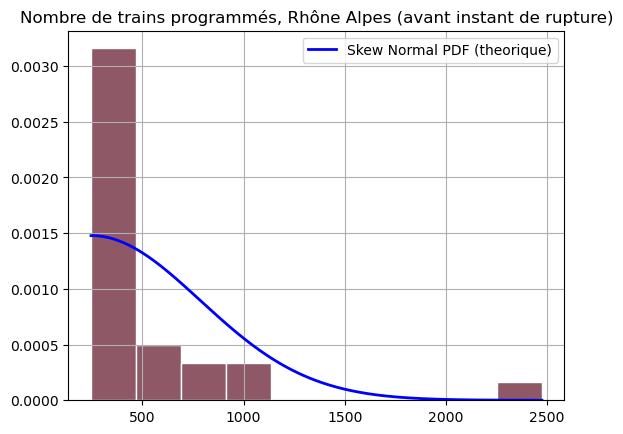

In [103]:
k=index_list_X_2[max_index_X_2]

counts, bins, patches = plt.hist(X.loc[:k,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X_2[4], param_X_2[0], param_X_2[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés, {c} (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

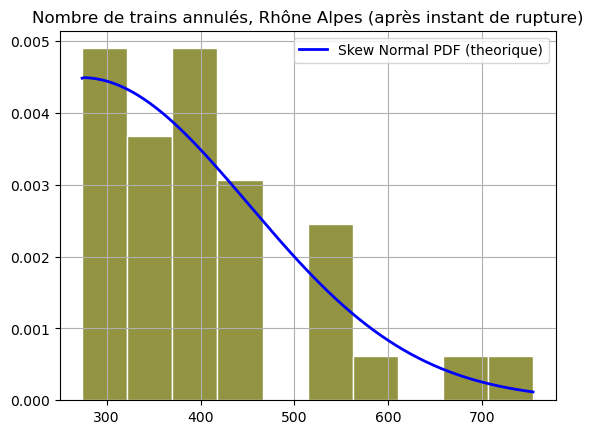

In [104]:
counts, bins, patches = plt.hist(X.loc[k:,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X_2[4], param_X_2[1], param_X_2[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains annulés, {c} (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

### kolmogorv test 


In [105]:
data1 = X.loc[k:,'Nombre de trains annulés']
data2 = X.loc[:k,'Nombre de trains annulés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.20915032679738563
p-value: 0.45127939617241003
Fail to reject null hypothesis, distributions might be similar.


### Languedoc Roussillon

# train programmes

In [106]:
c='Languedoc Roussillon'
X=df[df['Région']==c]
X=X.reset_index(inplace=False, drop=True)

X.head()

,Date,Région,Nombre de trains programmés,Nombre de trains ayant circulé,Nombre de trains annulés,Nombre de trains en retard à l'arrivée,Taux de régularité
0,2013-01,Languedoc Roussillon,5024.0,4897.0,127.0,377.0,92.301409
1,2013-02,Languedoc Roussillon,4614.0,4402.0,212.0,387.0,91.208542
2,2013-03,Languedoc Roussillon,4930.0,4548.0,382.0,567.0,87.532982
3,2013-04,Languedoc Roussillon,4776.0,4518.0,258.0,417.0,90.770252
4,2013-05,Languedoc Roussillon,4909.0,4666.0,243.0,335.0,92.820403


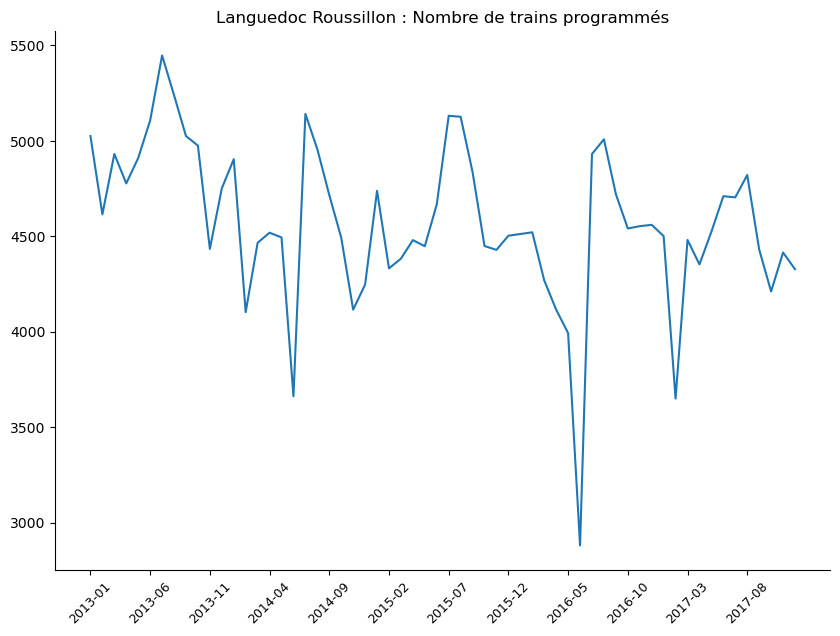

In [107]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(X['Date'],X['Nombre de trains programmés'])
plt.title(f"{c} : Nombre de trains programmés")

plt.show()

Languedoc Roussillon : Nombre de trains programmés


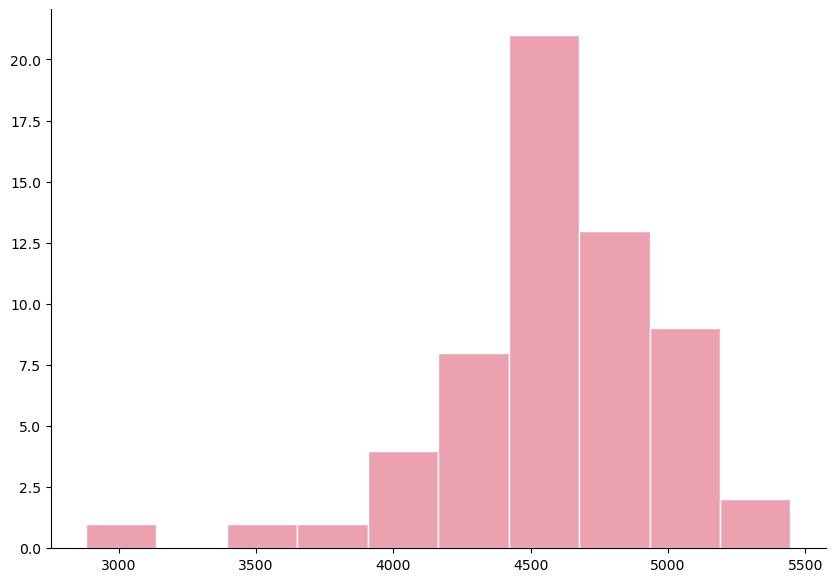

In [108]:
print(f"{c} : Nombre de trains programmés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(X[X.columns[2]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [109]:
index_list_X, param_list_X, log_lik_list_X=candidate_rupt(X['Nombre de trains programmés'])

In [110]:
max_value_X = max(log_lik_list_X)
max_index_X =log_lik_list_X.index(max_value_X)

Languedoc Roussillon : vraissemblance selon k


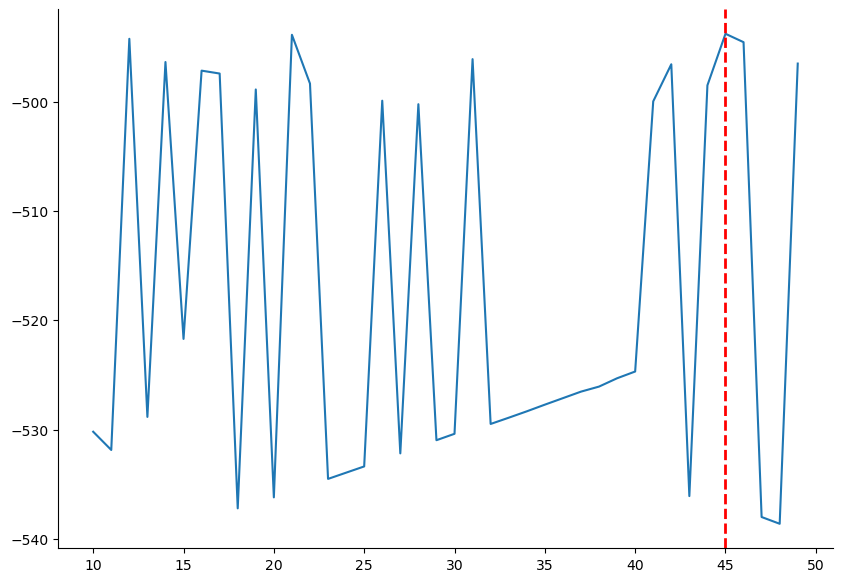

In [111]:
print(f"{c} : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_X,log_lik_list_X)
plt.axvline(x=index_list_X[max_index_X], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [112]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_X[max_index_X]}, Parametres des lois:{param_list_X[max_index_X]}")

Maximum de vraissemblance atteint pour k= 45, Parametres des lois:[ 5.13336768e+03  4.73120830e+03  6.89479768e+02  3.82422538e+02
 -3.44348056e+00]


In [113]:
k=index_list_X[max_index_X]
X.loc[k]

Date                                                   2016-10
Région                                    Languedoc Roussillon
Nombre de trains programmés                             4540.0
Nombre de trains ayant circulé                          4438.0
Nombre de trains annulés                                 102.0
Nombre de trains en retard à l'arrivée                   701.0
Taux de régularité                                   84.204597
Name: 45, dtype: object

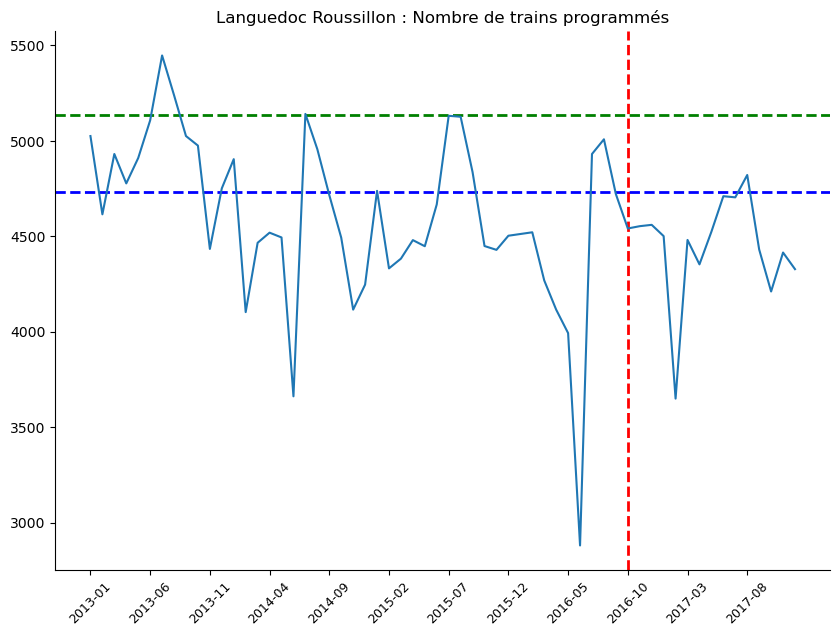

In [114]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_X=param_list_X[max_index_X]
plt.axvline(x=index_list_X[max_index_X], color='red', linestyle='dashed', linewidth=2)
plt.axhline(y=param_X[0], color='green', linestyle='dashed', linewidth=2)
plt.axhline(y=param_X[1], color='blue', linestyle='dashed', linewidth=2)

plt.plot(X['Date'],X['Nombre de trains programmés'])
plt.title(f"{c} : Nombre de trains programmés")

plt.show()

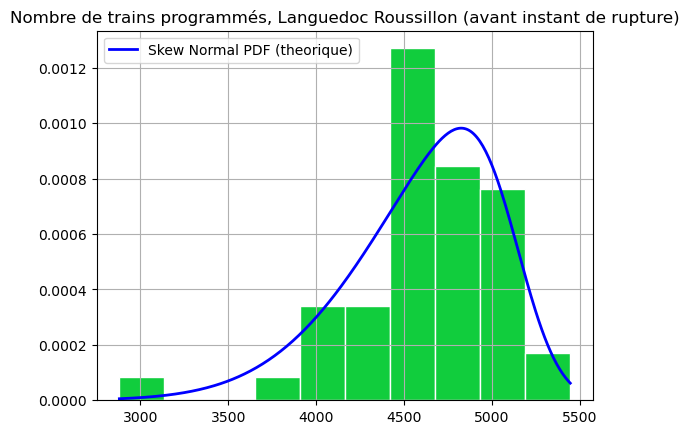

In [115]:
counts, bins, patches = plt.hist(X.loc[:k,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X[4], param_X[0], param_X[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés, {c} (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

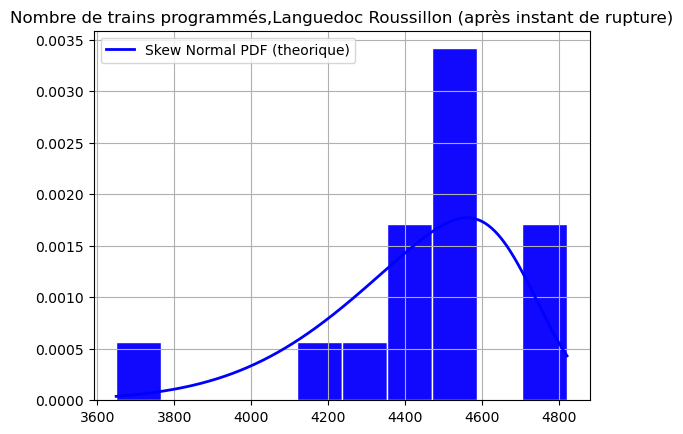

In [116]:
counts, bins, patches = plt.hist(X.loc[k:,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X[4], param_X[1], param_X[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés,{c} (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

### kolmogorov 

In [117]:
data1 = X.loc[index_list_X[max_index_X]:,'Nombre de trains programmés']
data2 = X.loc[:index_list_X[max_index_X],'Nombre de trains programmés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.3898550724637681
p-value: 0.042321138302727435
Reject null hypothesis, distributions likely differ.


# Trains annules 

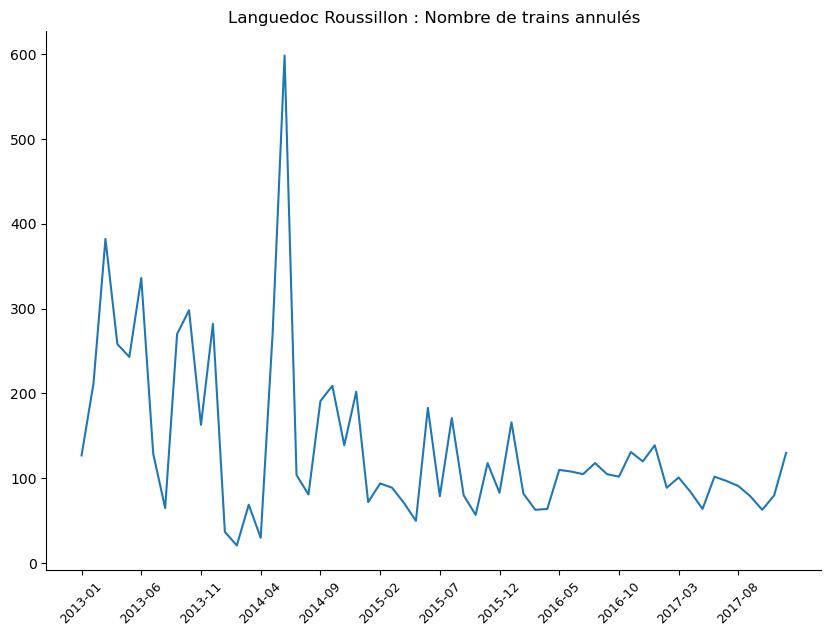

In [118]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(X['Date'],X['Nombre de trains annulés'])
plt.title(f"{c} : Nombre de trains annulés")

plt.show()


Languedoc Roussillon : Nombre de trains annulés


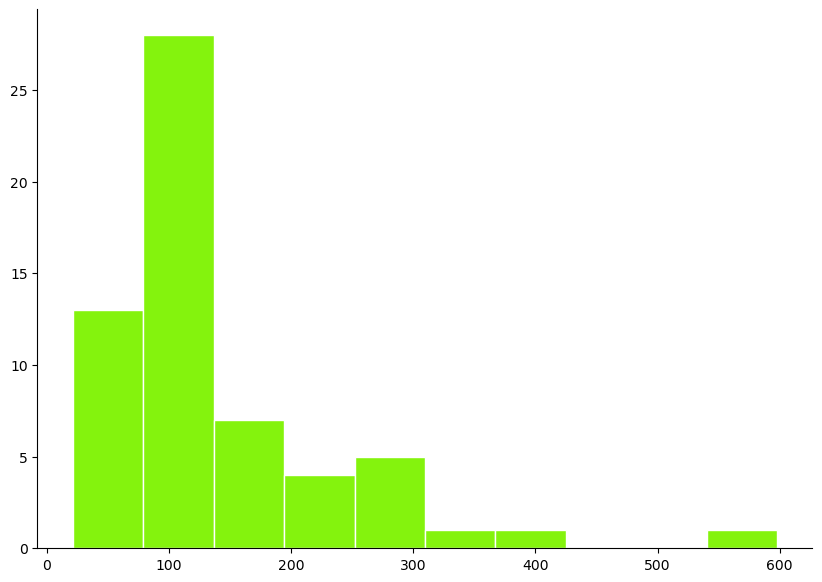

In [119]:
print(f"{c} : Nombre de trains annulés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(X[X.columns[4]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [120]:
index_list_X_2, param_list_X_2, log_lik_list_X_2=candidate_rupt(X['Nombre de trains annulés'])

In [121]:
max_value_X_2 = max(log_lik_list_X_2)
max_index_X_2 =log_lik_list_X_2.index(max_value_X_2)

Languedoc Roussillon : vraissemblance selon k


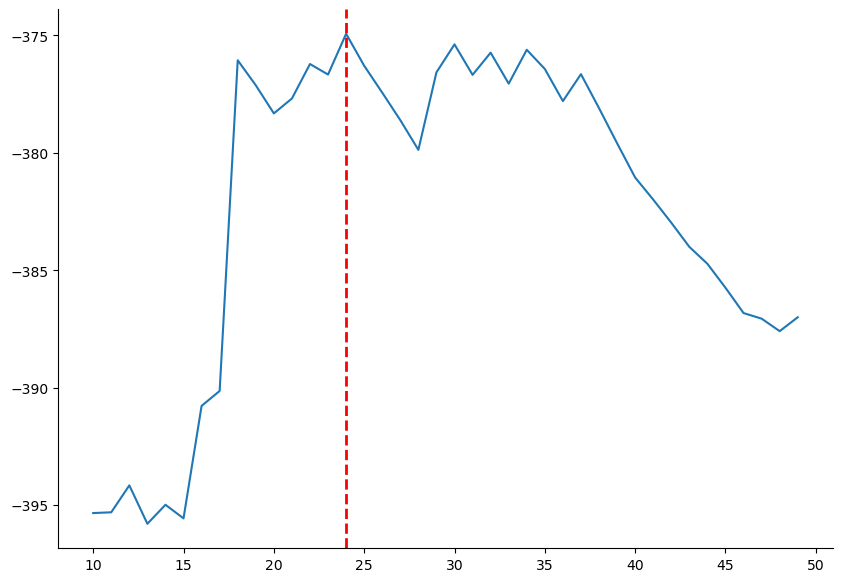

In [122]:
print(f"{c} : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_X_2,log_lik_list_X_2)
plt.axvline(x=index_list_X_2[max_index_X_2], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [123]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_X_2[max_index_X_2]}, Parametres des lois:{param_list_X_2[max_index_X_2]}")

Maximum de vraissemblance atteint pour k= 24, Parametres des lois:[ 22.52440236  55.84227156 214.05273318  53.21250592   9.89574722]


In [124]:
X.loc[index_list_X_2[max_index_X_2]]

Date                                                   2015-01
Région                                    Languedoc Roussillon
Nombre de trains programmés                             4737.0
Nombre de trains ayant circulé                          4665.0
Nombre de trains annulés                                  72.0
Nombre de trains en retard à l'arrivée                   429.0
Taux de régularité                                   90.803859
Name: 24, dtype: object

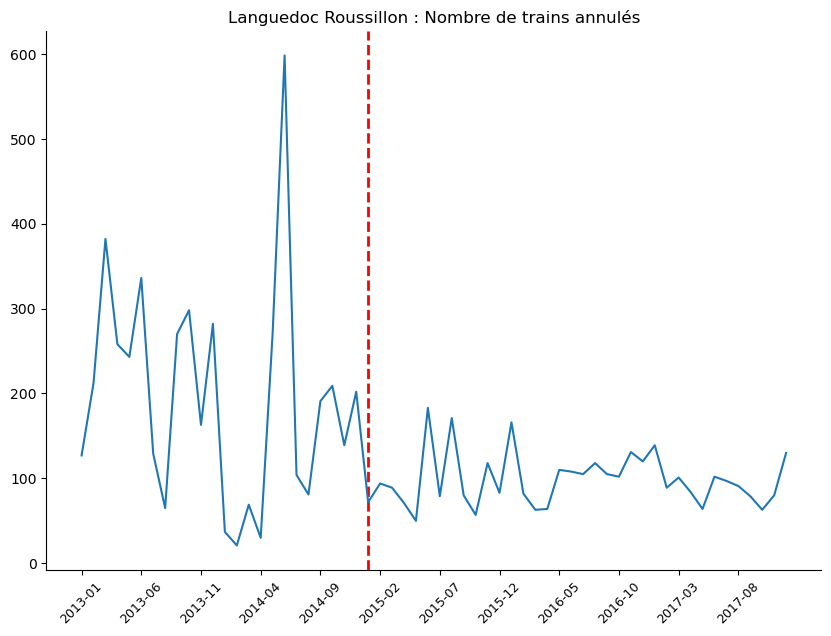

In [125]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_X_2=param_list_X_2[max_index_X_2]
plt.axvline(x=index_list_X_2[max_index_X_2], color='red', linestyle='dashed', linewidth=2)

plt.plot(X['Date'],X['Nombre de trains annulés'])
plt.title(f"{c} : Nombre de trains annulés")

plt.show()

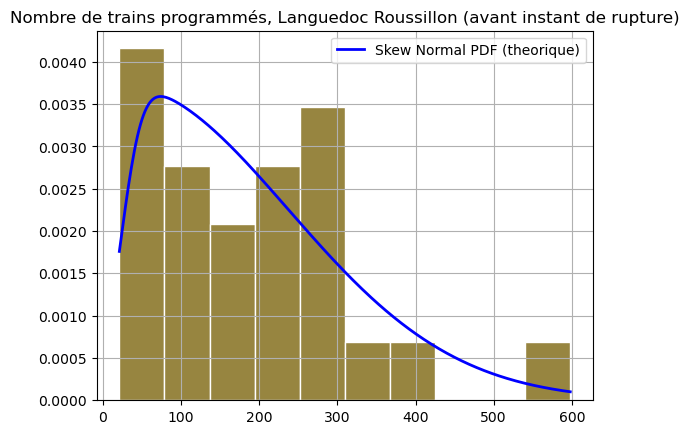

In [126]:
k=index_list_X_2[max_index_X_2]

counts, bins, patches = plt.hist(X.loc[:k,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X_2[4], param_X_2[0], param_X_2[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés, {c} (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

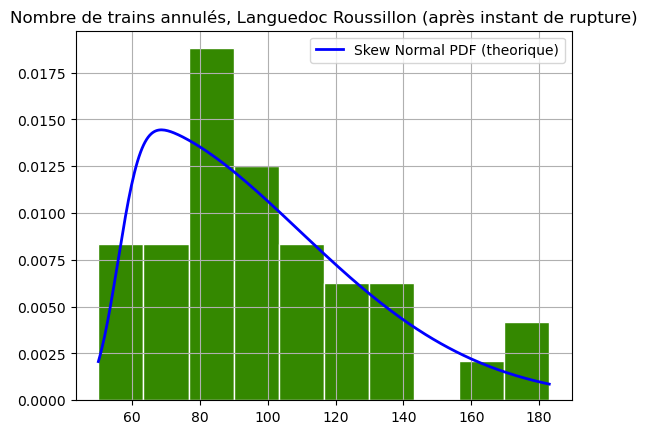

In [127]:
counts, bins, patches = plt.hist(X.loc[k:,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X_2[4], param_X_2[1], param_X_2[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains annulés, {c} (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

### kolmogorv test 


In [128]:
data1 = X.loc[k:,'Nombre de trains annulés']
data2 = X.loc[:k,'Nombre de trains annulés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.52
p-value: 0.0003277375350597742
Reject null hypothesis, distributions likely differ.


### Haute Normandie

# train programmes

In [129]:
c='Haute Normandie'
X=df[df['Région']==c]
X=X.reset_index(inplace=False, drop=True)

X.head()

,Date,Région,Nombre de trains programmés,Nombre de trains ayant circulé,Nombre de trains annulés,Nombre de trains en retard à l'arrivée,Taux de régularité
0,2013-01,Haute Normandie,5957.0,5878.0,79.0,488.0,91.697856
1,2013-02,Haute Normandie,5349.0,5301.0,48.0,211.0,96.019619
2,2013-03,Haute Normandie,5444.0,5320.0,124.0,326.0,93.872180
3,2013-04,Haute Normandie,5662.0,5616.0,46.0,245.0,95.637464
4,2013-05,Haute Normandie,5447.0,5433.0,14.0,215.0,96.042702


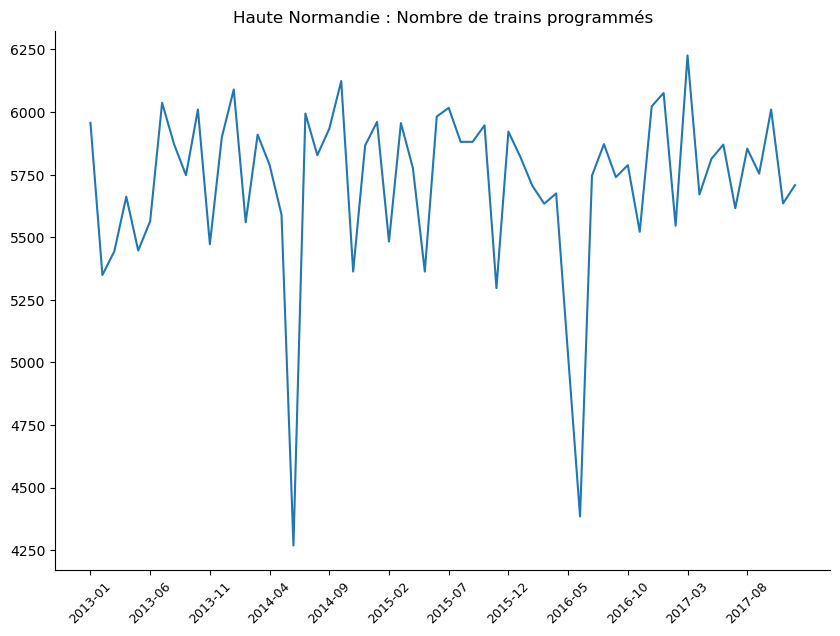

In [130]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(X['Date'],X['Nombre de trains programmés'])
plt.title(f"{c} : Nombre de trains programmés")

plt.show()

Haute Normandie : Nombre de trains programmés


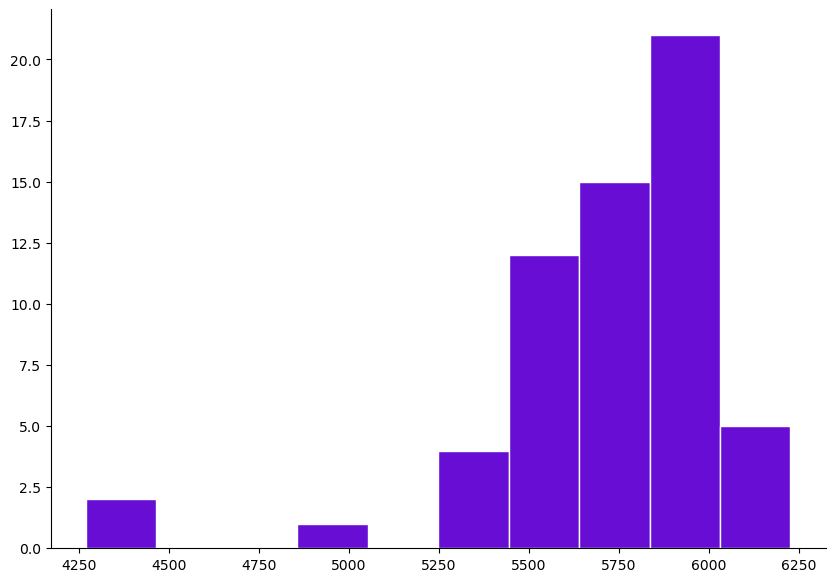

In [131]:
print(f"{c} : Nombre de trains programmés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(X[X.columns[2]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [132]:
index_list_X, param_list_X, log_lik_list_X=candidate_rupt(X['Nombre de trains programmés'])

In [133]:
max_value_X = max(log_lik_list_X)
max_index_X =log_lik_list_X.index(max_value_X)

Haute Normandie : vraissemblance selon k


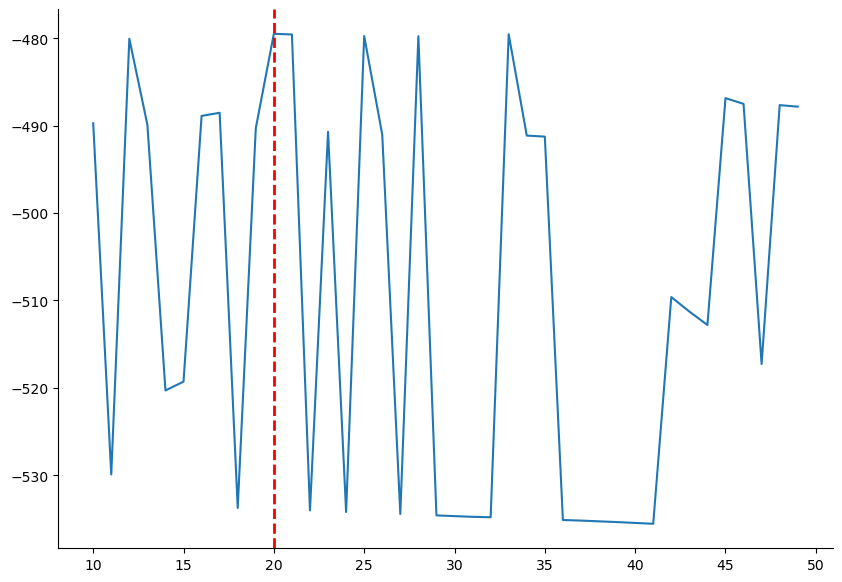

In [134]:
print(f"{c} : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_X,log_lik_list_X)
plt.axvline(x=index_list_X[max_index_X], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [135]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_X[max_index_X]}, Parametres des lois:{param_list_X[max_index_X]}")

Maximum de vraissemblance atteint pour k= 20, Parametres des lois:[6078.57464331 6102.60580011  544.52807773  495.06037046   -6.12157284]


In [136]:
k=index_list_X[max_index_X]
X.loc[k]

Date                                              2014-09
Région                                    Haute Normandie
Nombre de trains programmés                        5933.0
Nombre de trains ayant circulé                     5865.0
Nombre de trains annulés                             68.0
Nombre de trains en retard à l'arrivée              256.0
Taux de régularité                              95.635124
Name: 20, dtype: object

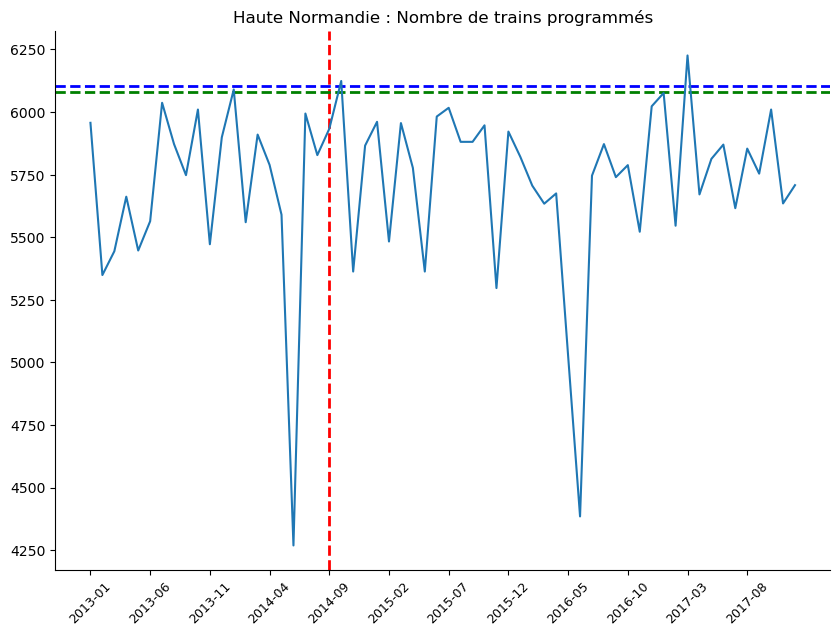

In [137]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_X=param_list_X[max_index_X]
plt.axvline(x=index_list_X[max_index_X], color='red', linestyle='dashed', linewidth=2)
plt.axhline(y=param_X[0], color='green', linestyle='dashed', linewidth=2)
plt.axhline(y=param_X[1], color='blue', linestyle='dashed', linewidth=2)

plt.plot(X['Date'],X['Nombre de trains programmés'])
plt.title(f"{c} : Nombre de trains programmés")

plt.show()

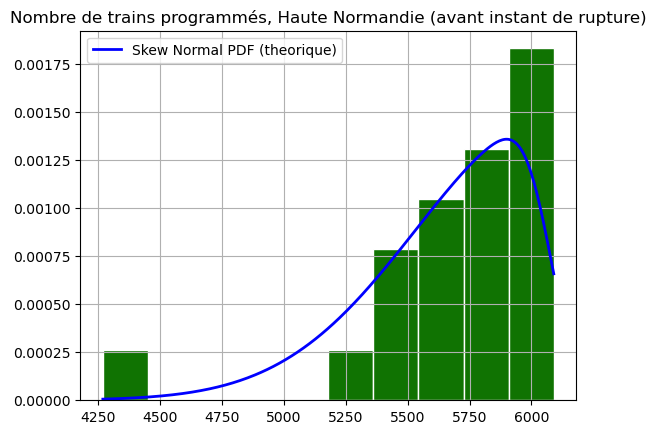

In [138]:
counts, bins, patches = plt.hist(X.loc[:k,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X[4], param_X[0], param_X[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés, {c} (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

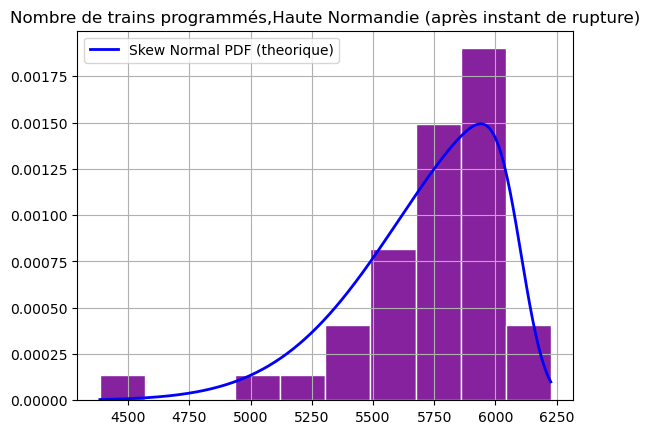

In [139]:
counts, bins, patches = plt.hist(X.loc[k:,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X[4], param_X[1], param_X[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés,{c} (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

### kolmogorov 

In [140]:
data1 = X.loc[index_list_X[max_index_X]:,'Nombre de trains programmés']
data2 = X.loc[:index_list_X[max_index_X],'Nombre de trains programmés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.18095238095238095
p-value: 0.6793957356551368
Fail to reject null hypothesis, distributions might be similar.


# Trains annules 

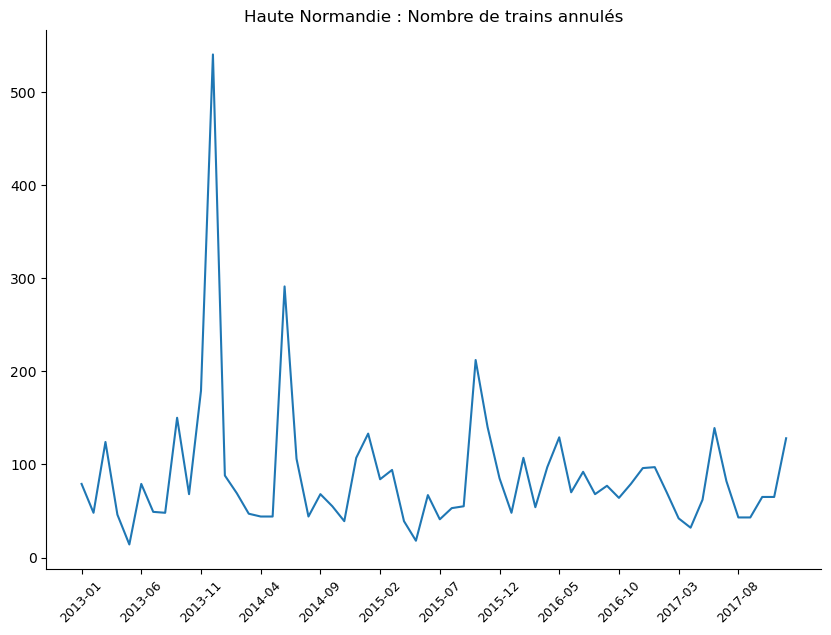

In [141]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(X['Date'],X['Nombre de trains annulés'])
plt.title(f"{c} : Nombre de trains annulés")

plt.show()


Haute Normandie : Nombre de trains annulés


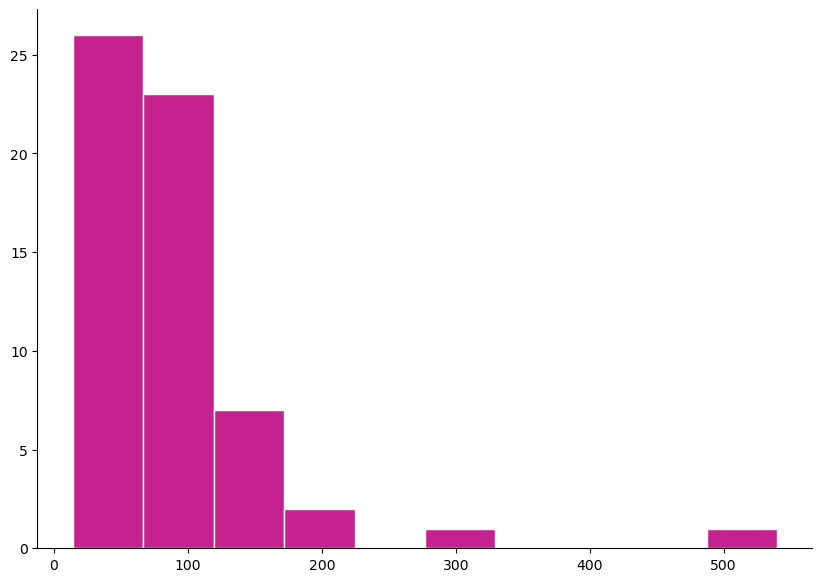

In [142]:
print(f"{c} : Nombre de trains annulés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(X[X.columns[4]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [143]:
index_list_X_2, param_list_X_2, log_lik_list_X_2=candidate_rupt(X['Nombre de trains annulés'])

In [144]:
max_value_X_2 = max(log_lik_list_X_2)
max_index_X_2 =log_lik_list_X_2.index(max_value_X_2)

Haute Normandie : vraissemblance selon k


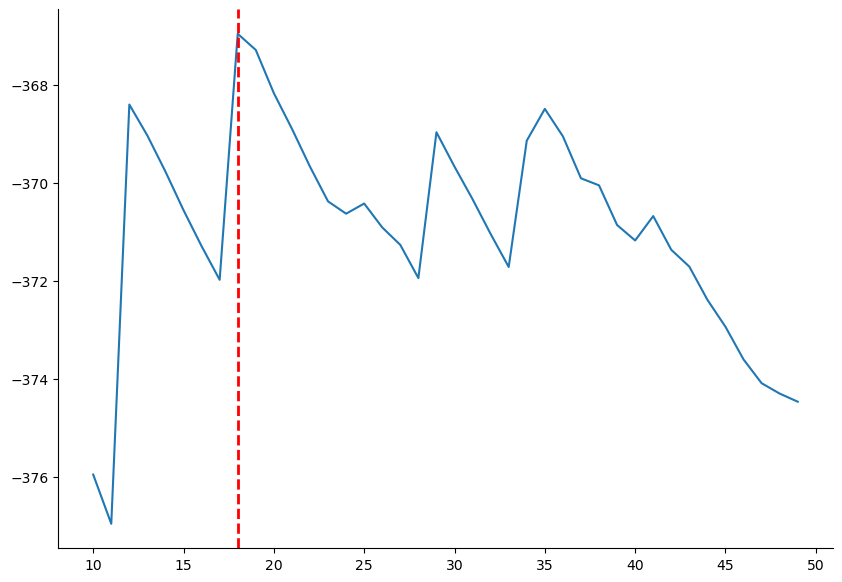

In [145]:
print(f"{c} : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_X_2,log_lik_list_X_2)
plt.axvline(x=index_list_X_2[max_index_X_2], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [146]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_X_2[max_index_X_2]}, Parametres des lois:{param_list_X_2[max_index_X_2]}")

Maximum de vraissemblance atteint pour k= 18, Parametres des lois:[ 13.28047745  31.37507127 150.94674099  60.68276948   7.42116474]


In [147]:
X.loc[index_list_X_2[max_index_X_2]]

Date                                              2014-07
Région                                    Haute Normandie
Nombre de trains programmés                        5994.0
Nombre de trains ayant circulé                     5888.0
Nombre de trains annulés                            106.0
Nombre de trains en retard à l'arrivée              345.0
Taux de régularité                              94.140625
Name: 18, dtype: object

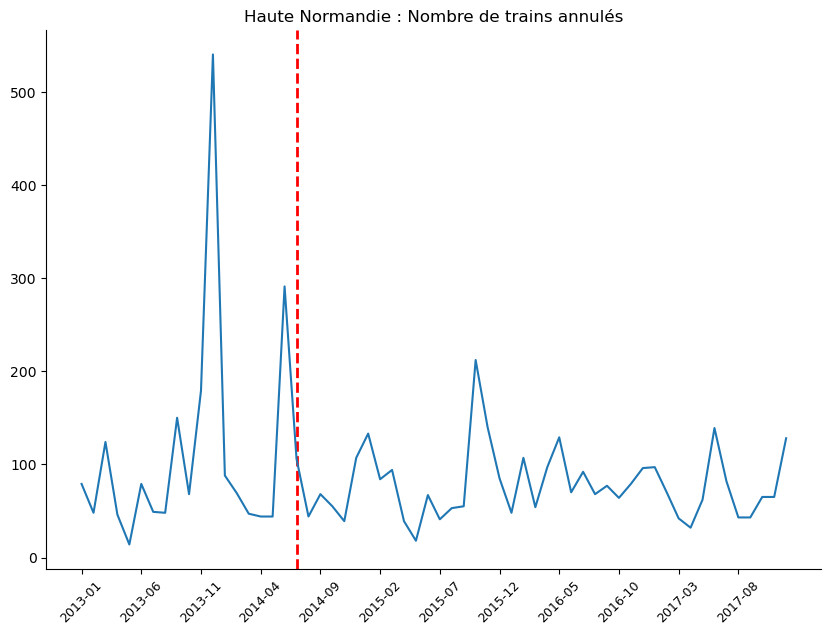

In [148]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_X_2=param_list_X_2[max_index_X_2]
plt.axvline(x=index_list_X_2[max_index_X_2], color='red', linestyle='dashed', linewidth=2)

plt.plot(X['Date'],X['Nombre de trains annulés'])
plt.title(f"{c} : Nombre de trains annulés")

plt.show()

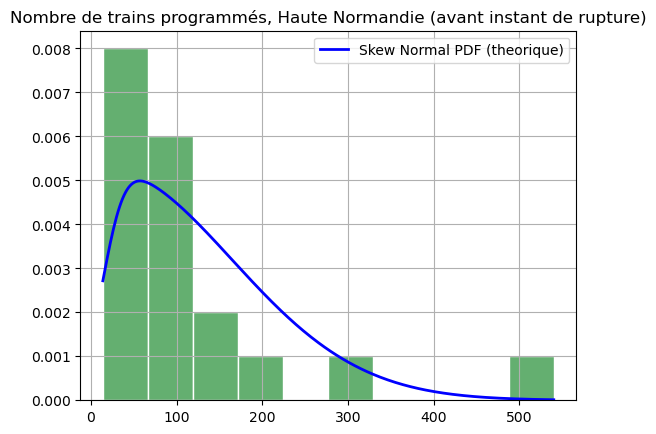

In [149]:
k=index_list_X_2[max_index_X_2]

counts, bins, patches = plt.hist(X.loc[:k,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X_2[4], param_X_2[0], param_X_2[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés, {c} (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

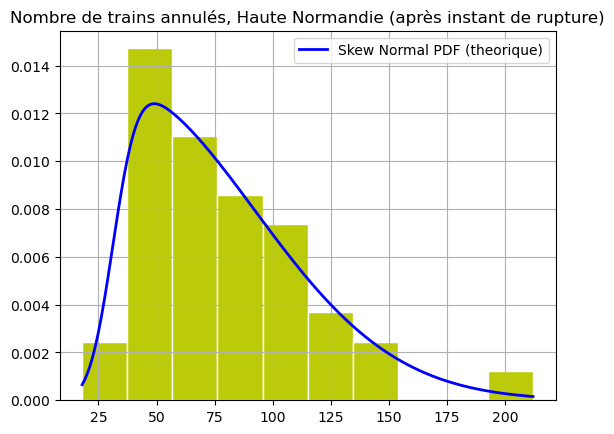

In [150]:
counts, bins, patches = plt.hist(X.loc[k:,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X_2[4], param_X_2[1], param_X_2[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains annulés, {c} (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

### kolmogorv test 


In [151]:
data1 = X.loc[k:,'Nombre de trains annulés']
data2 = X.loc[:k,'Nombre de trains annulés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.18671679197994986
p-value: 0.669983087811123
Fail to reject null hypothesis, distributions might be similar.


### 'Franche Comté'

# train programmes

In [152]:
c='Franche Comté'
X=df[df['Région']==c]
X=X.reset_index(inplace=False, drop=True)

X.head()

,Date,Région,Nombre de trains programmés,Nombre de trains ayant circulé,Nombre de trains annulés,Nombre de trains en retard à l'arrivée,Taux de régularité
0,2013-01,Franche Comté,5826.0,5744.0,82.0,553.0,90.372563
1,2013-02,Franche Comté,5241.0,5174.0,67.0,522.0,89.911094
2,2013-03,Franche Comté,5676.0,5628.0,48.0,360.0,93.603412
3,2013-04,Franche Comté,5655.0,5638.0,17.0,327.0,94.200071
4,2013-05,Franche Comté,5776.0,5742.0,34.0,417.0,92.737722


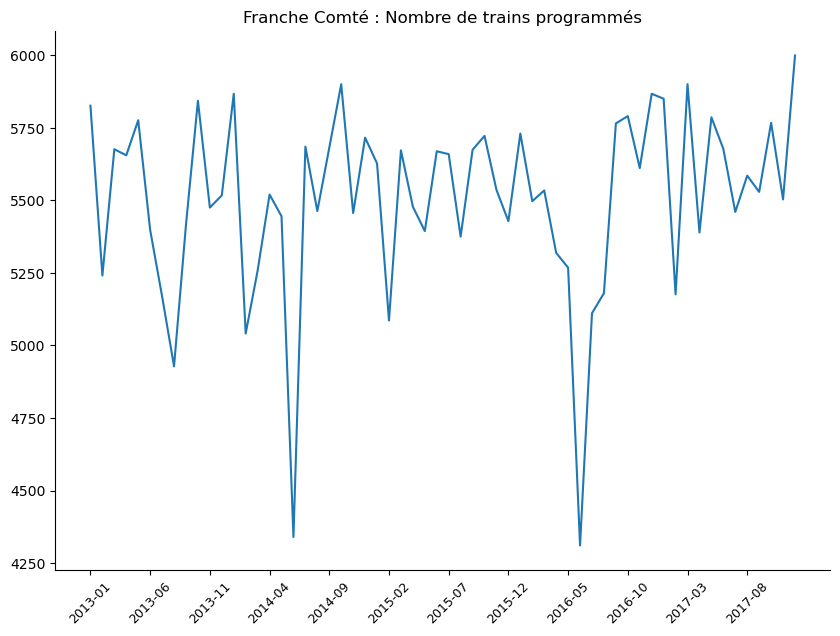

In [153]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(X['Date'],X['Nombre de trains programmés'])
plt.title(f"{c} : Nombre de trains programmés")

plt.show()

Franche Comté : Nombre de trains programmés


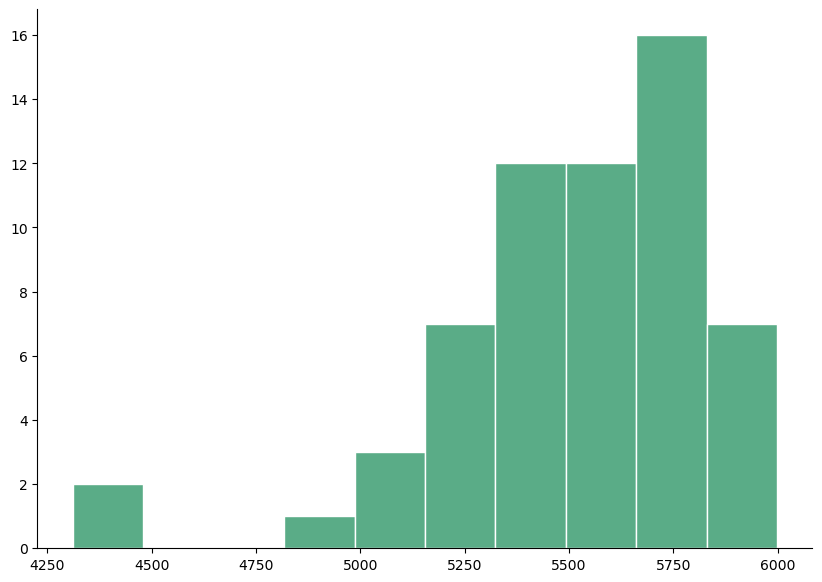

In [154]:
print(f"{c} : Nombre de trains programmés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(X[X.columns[2]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [155]:
index_list_X, param_list_X, log_lik_list_X=candidate_rupt(X['Nombre de trains programmés'])

In [156]:
max_value_X = max(log_lik_list_X)
max_index_X =log_lik_list_X.index(max_value_X)

Franche Comté : vraissemblance selon k


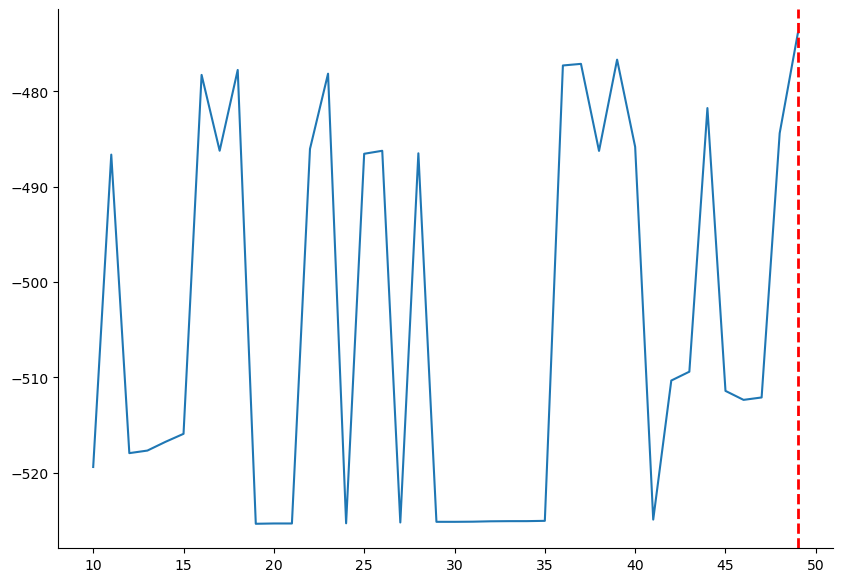

In [157]:
print(f"{c} : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_X,log_lik_list_X)
plt.axvline(x=index_list_X[max_index_X], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [158]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_X[max_index_X]}, Parametres des lois:{param_list_X[max_index_X]}")

Maximum de vraissemblance atteint pour k= 49, Parametres des lois:[  5900.15646468   5999.16849978    539.41330334    448.44575742
 -10936.05578813]


In [159]:
k=index_list_X[max_index_X]
X.loc[k]

Date                                            2017-02
Région                                    Franche Comté
Nombre de trains programmés                      5176.0
Nombre de trains ayant circulé                   5115.0
Nombre de trains annulés                           61.0
Nombre de trains en retard à l'arrivée            528.0
Taux de régularité                            89.677419
Name: 49, dtype: object

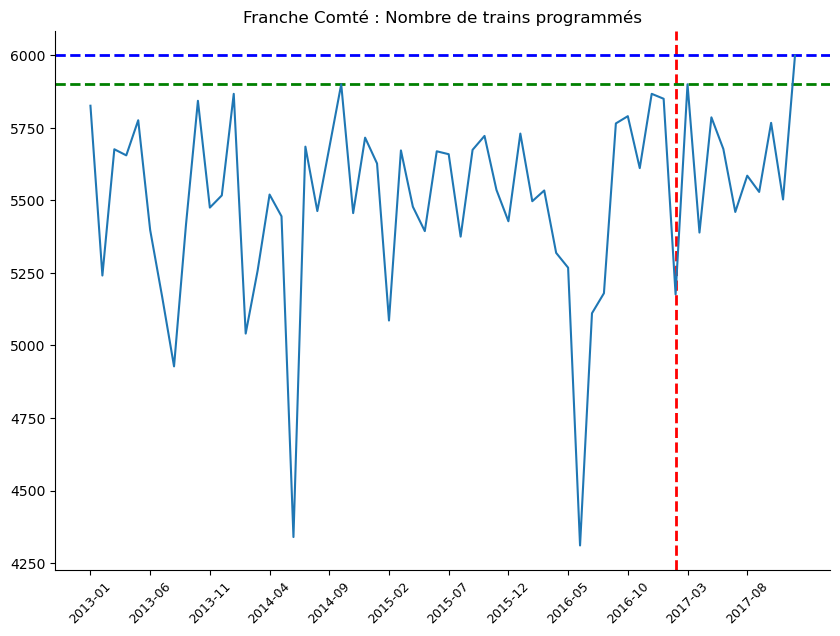

In [160]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_X=param_list_X[max_index_X]
plt.axvline(x=index_list_X[max_index_X], color='red', linestyle='dashed', linewidth=2)
plt.axhline(y=param_X[0], color='green', linestyle='dashed', linewidth=2)
plt.axhline(y=param_X[1], color='blue', linestyle='dashed', linewidth=2)

plt.plot(X['Date'],X['Nombre de trains programmés'])
plt.title(f"{c} : Nombre de trains programmés")

plt.show()

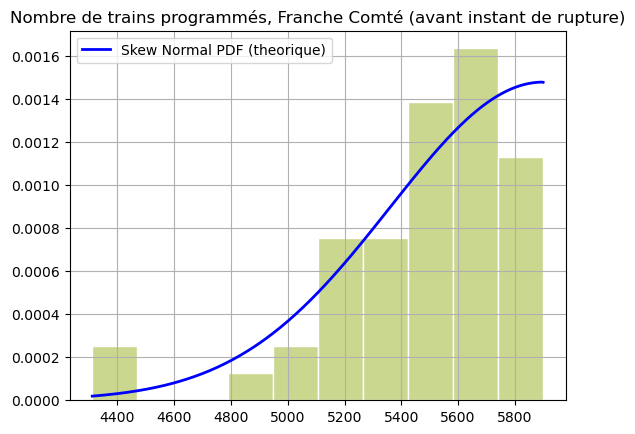

In [161]:
counts, bins, patches = plt.hist(X.loc[:k,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X[4], param_X[0], param_X[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés, {c} (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

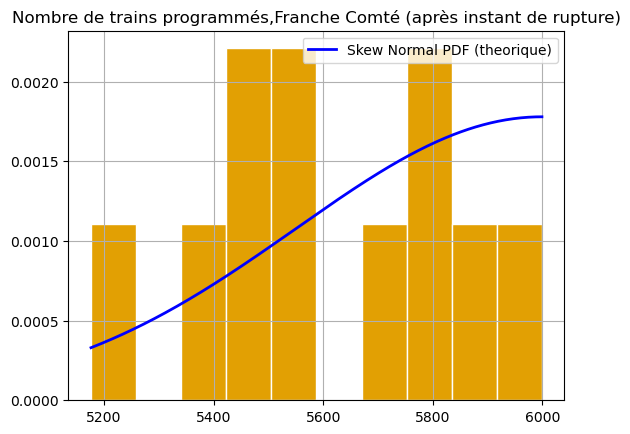

In [162]:
counts, bins, patches = plt.hist(X.loc[k:,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X[4], param_X[1], param_X[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés,{c} (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

### kolmogorov 

In [163]:
data1 = X.loc[index_list_X[max_index_X]:,'Nombre de trains programmés']
data2 = X.loc[:index_list_X[max_index_X],'Nombre de trains programmés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.21818181818181817
p-value: 0.6979042992847573
Fail to reject null hypothesis, distributions might be similar.


# Trains annules 

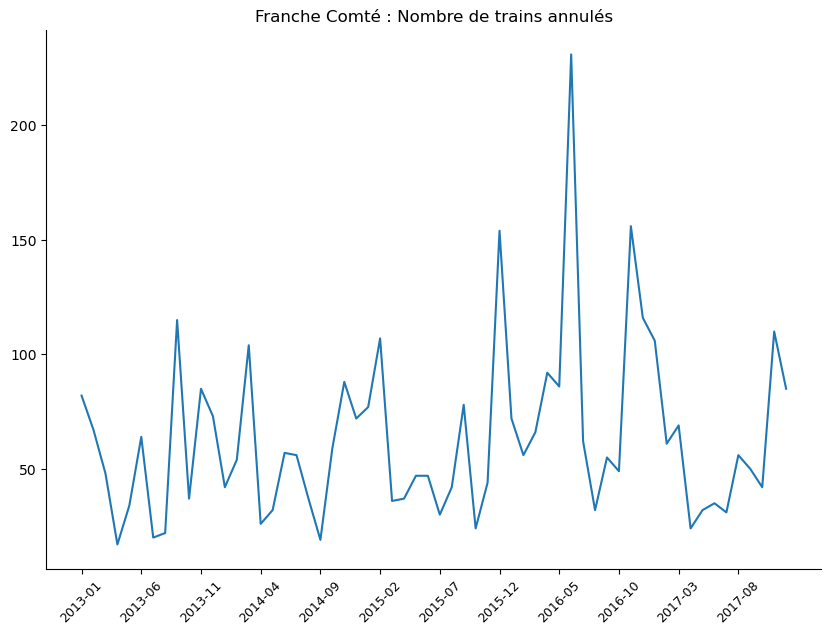

In [164]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(X['Date'],X['Nombre de trains annulés'])
plt.title(f"{c} : Nombre de trains annulés")

plt.show()


Franche Comté : Nombre de trains annulés


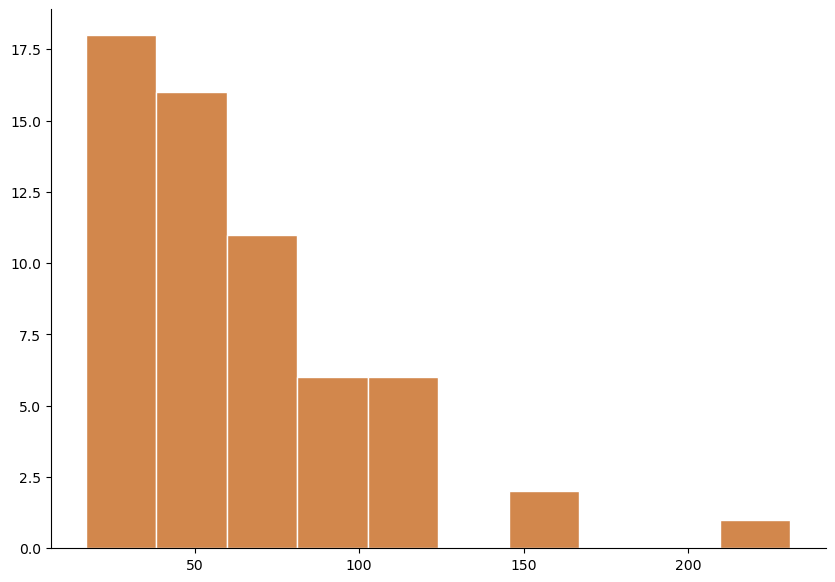

In [165]:
print(f"{c} : Nombre de trains annulés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(X[X.columns[4]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [166]:
index_list_X_2, param_list_X_2, log_lik_list_X_2=candidate_rupt(X['Nombre de trains annulés'])

In [167]:
max_value_X_2 = max(log_lik_list_X_2)
max_index_X_2 =log_lik_list_X_2.index(max_value_X_2)

Franche Comté : vraissemblance selon k


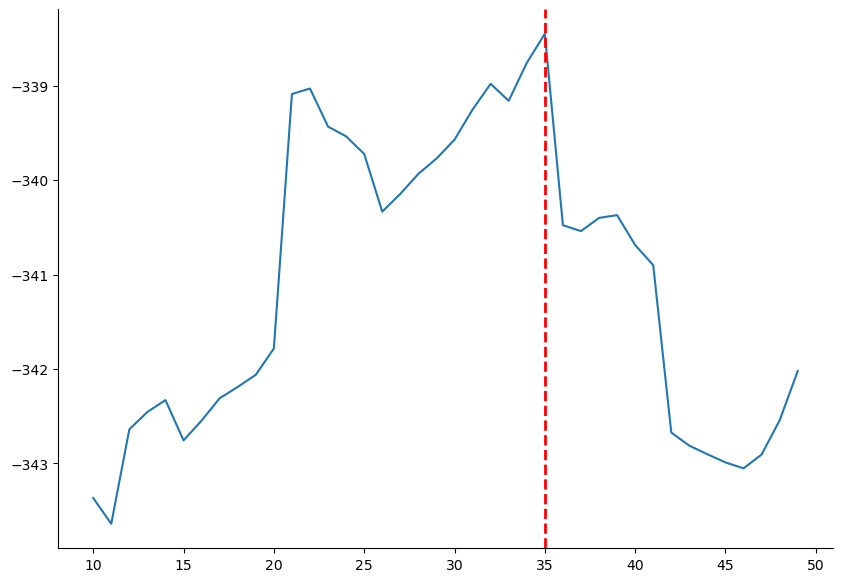

In [168]:
print(f"{c} : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_X_2,log_lik_list_X_2)
plt.axvline(x=index_list_X_2[max_index_X_2], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [169]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_X_2[max_index_X_2]}, Parametres des lois:{param_list_X_2[max_index_X_2]}")

Maximum de vraissemblance atteint pour k= 35, Parametres des lois:[  16.98281633   23.97169186   44.97060014   70.94265818 8035.08690563]


In [170]:
X.loc[index_list_X_2[max_index_X_2]]

Date                                            2015-12
Région                                    Franche Comté
Nombre de trains programmés                      5428.0
Nombre de trains ayant circulé                   5274.0
Nombre de trains annulés                          154.0
Nombre de trains en retard à l'arrivée            365.0
Taux de régularité                            93.079257
Name: 35, dtype: object

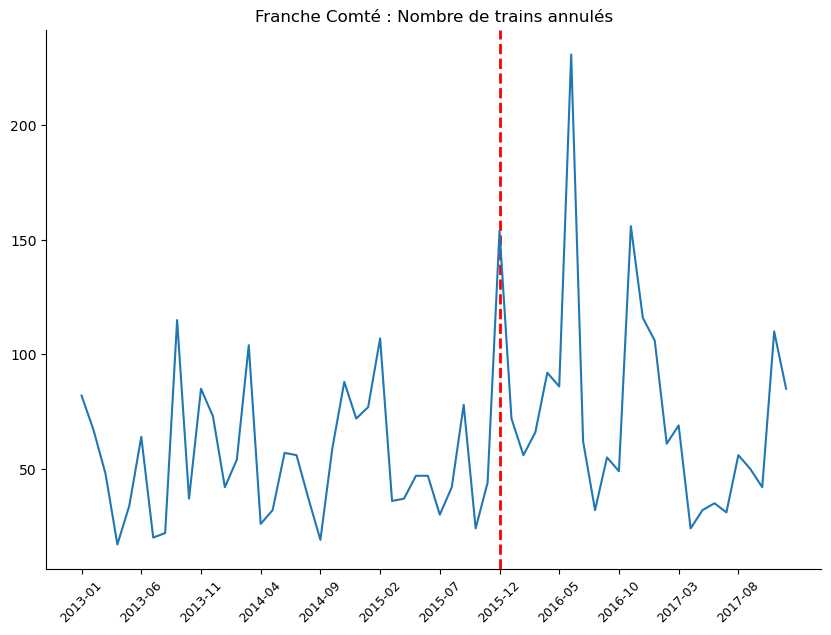

In [171]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_X_2=param_list_X_2[max_index_X_2]
plt.axvline(x=index_list_X_2[max_index_X_2], color='red', linestyle='dashed', linewidth=2)

plt.plot(X['Date'],X['Nombre de trains annulés'])
plt.title(f"{c} : Nombre de trains annulés")

plt.show()

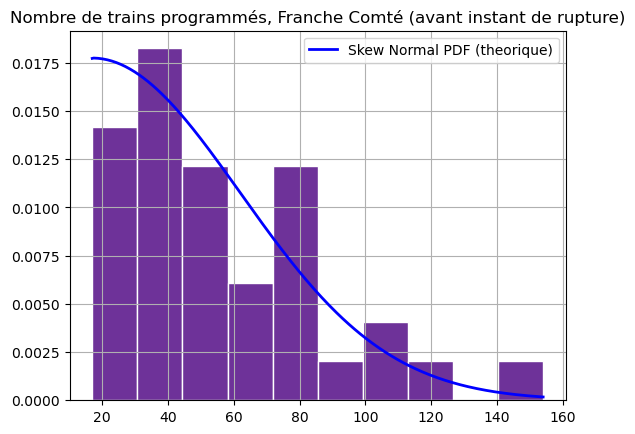

In [172]:
k=index_list_X_2[max_index_X_2]

counts, bins, patches = plt.hist(X.loc[:k,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X_2[4], param_X_2[0], param_X_2[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés, {c} (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

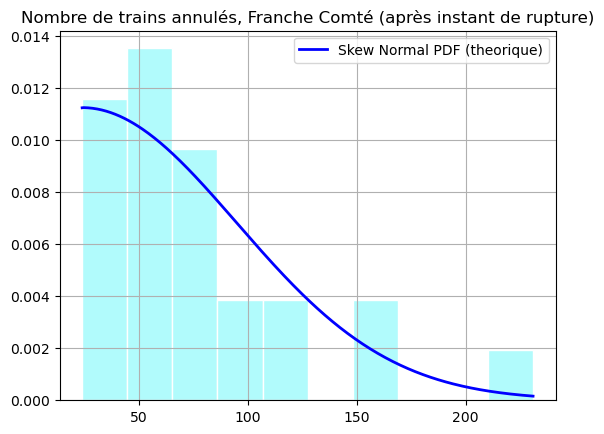

In [173]:
counts, bins, patches = plt.hist(X.loc[k:,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X_2[4], param_X_2[1], param_X_2[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains annulés, {c} (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

### kolmogorv test 


In [174]:
data1 = X.loc[k:,'Nombre de trains annulés']
data2 = X.loc[:k,'Nombre de trains annulés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.2877777777777778
p-value: 0.13801800966793207
Fail to reject null hypothesis, distributions might be similar.


### Bourgogne

# train programmes

In [175]:
c='Bourgogne'
X=df[df['Région']==c]
X=X.reset_index(inplace=False, drop=True)

X.head()

,Date,Région,Nombre de trains programmés,Nombre de trains ayant circulé,Nombre de trains annulés,Nombre de trains en retard à l'arrivée,Taux de régularité
0,2013-01,Bourgogne,8400.0,8332.0,68.0,625.0,92.498800
1,2013-02,Bourgogne,7418.0,7337.0,81.0,630.0,91.413384
2,2013-03,Bourgogne,7949.0,7646.0,303.0,634.0,91.708083
3,2013-04,Bourgogne,7492.0,7403.0,89.0,654.0,91.165744
4,2013-05,Bourgogne,7507.0,7429.0,78.0,806.0,89.150626


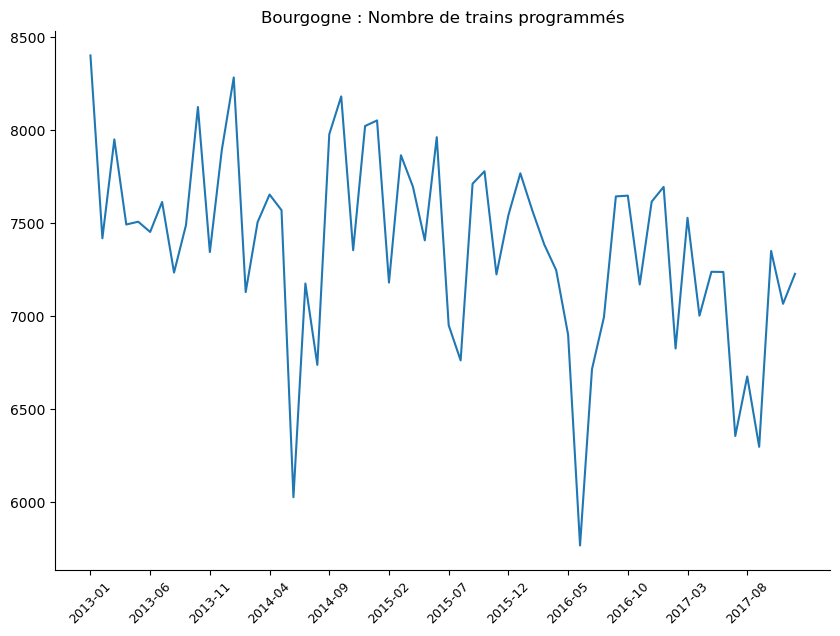

In [176]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(X['Date'],X['Nombre de trains programmés'])
plt.title(f"{c} : Nombre de trains programmés")

plt.show()

Bourgogne : Nombre de trains programmés


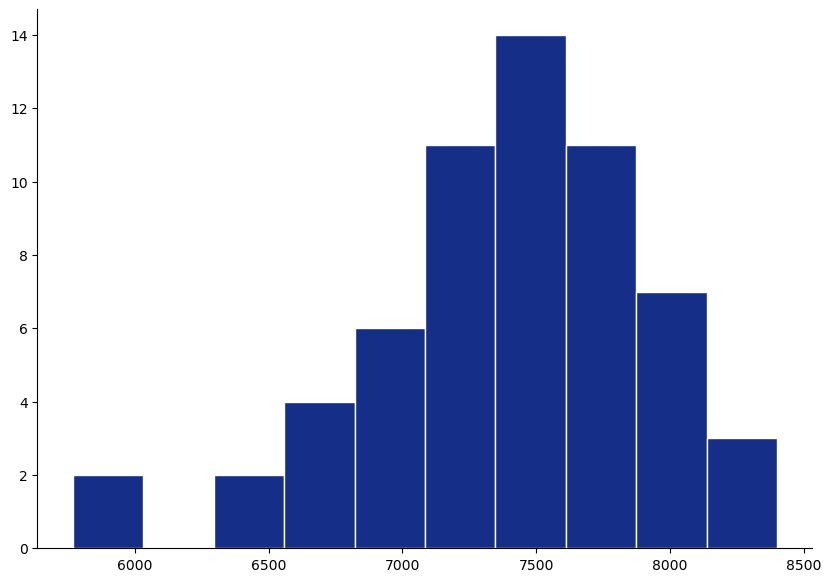

In [177]:
print(f"{c} : Nombre de trains programmés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(X[X.columns[2]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [178]:
index_list_X, param_list_X, log_lik_list_X=candidate_rupt(X['Nombre de trains programmés'])

In [179]:
max_value_X = max(log_lik_list_X)
max_index_X =log_lik_list_X.index(max_value_X)

Bourgogne : vraissemblance selon k


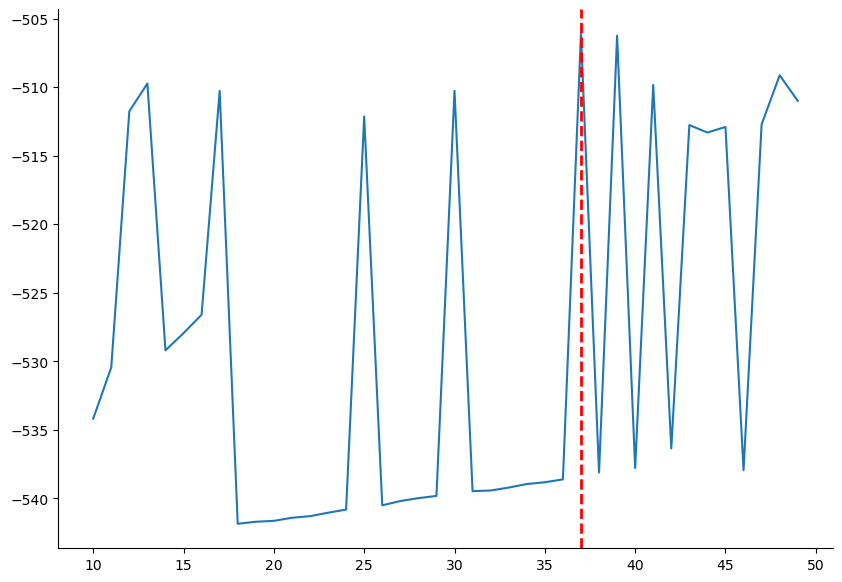

In [180]:
print(f"{c} : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_X,log_lik_list_X)
plt.axvline(x=index_list_X[max_index_X], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [181]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_X[max_index_X]}, Parametres des lois:{param_list_X[max_index_X]}")

Maximum de vraissemblance atteint pour k= 37, Parametres des lois:[ 8.15591028e+03  7.65886309e+03  7.76563150e+02  7.22653125e+02
 -4.27749005e+00]


In [182]:
k=index_list_X[max_index_X]
X.loc[k]

Date                                        2016-02
Région                                    Bourgogne
Nombre de trains programmés                  7568.0
Nombre de trains ayant circulé               7489.0
Nombre de trains annulés                       79.0
Nombre de trains en retard à l'arrivée        712.0
Taux de régularité                        90.492723
Name: 37, dtype: object

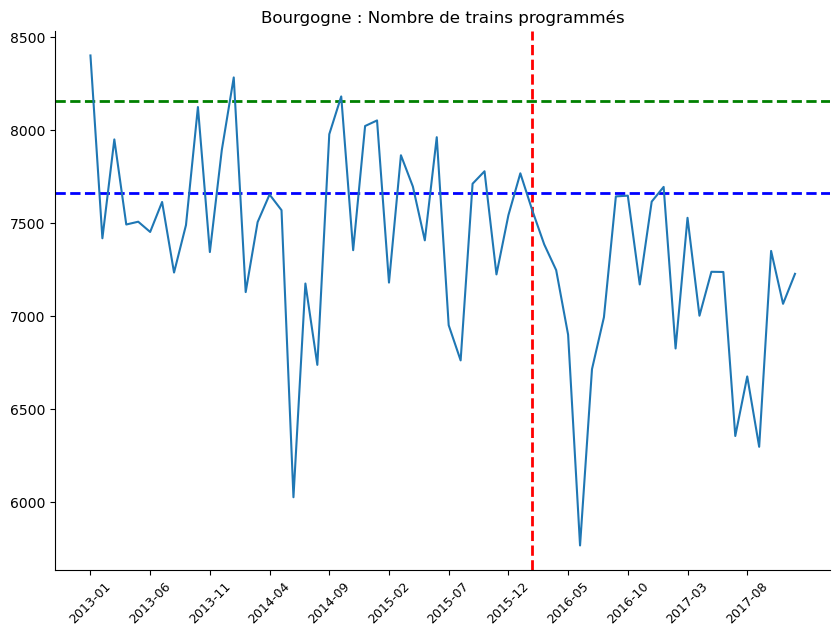

In [183]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_X=param_list_X[max_index_X]
plt.axvline(x=index_list_X[max_index_X], color='red', linestyle='dashed', linewidth=2)
plt.axhline(y=param_X[0], color='green', linestyle='dashed', linewidth=2)
plt.axhline(y=param_X[1], color='blue', linestyle='dashed', linewidth=2)

plt.plot(X['Date'],X['Nombre de trains programmés'])
plt.title(f"{c} : Nombre de trains programmés")

plt.show()

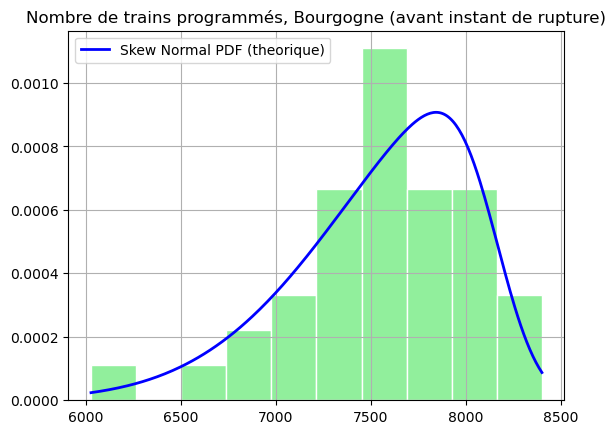

In [184]:
counts, bins, patches = plt.hist(X.loc[:k,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X[4], param_X[0], param_X[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés, {c} (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

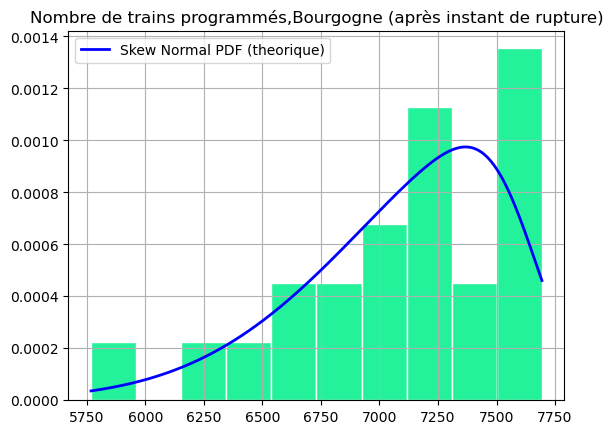

In [185]:
counts, bins, patches = plt.hist(X.loc[k:,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X[4], param_X[1], param_X[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés,{c} (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

### kolmogorov 

In [186]:
data1 = X.loc[index_list_X[max_index_X]:,'Nombre de trains programmés']
data2 = X.loc[:index_list_X[max_index_X],'Nombre de trains programmés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.4496567505720824
p-value: 0.0038287575424754495
Reject null hypothesis, distributions likely differ.


# Trains annules 

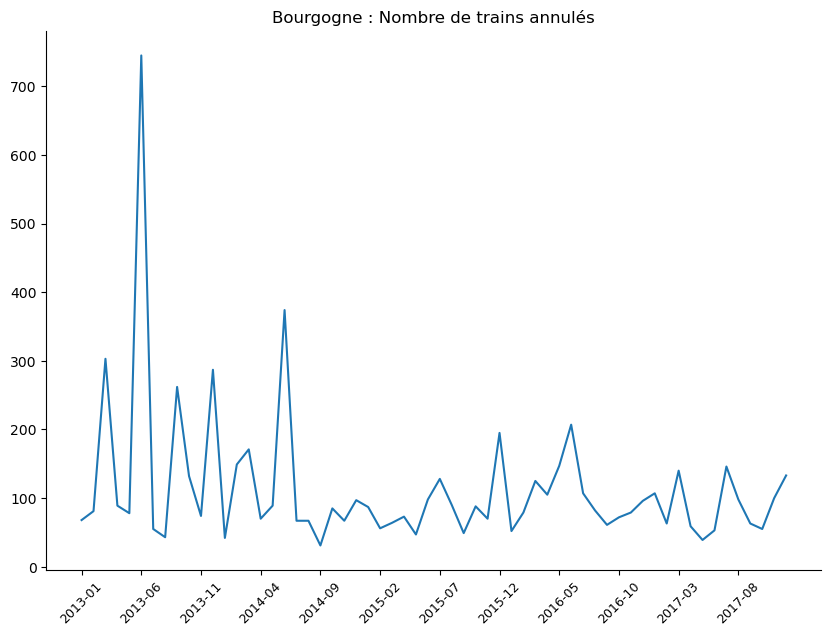

In [187]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(X['Date'],X['Nombre de trains annulés'])
plt.title(f"{c} : Nombre de trains annulés")

plt.show()


Bourgogne : Nombre de trains annulés


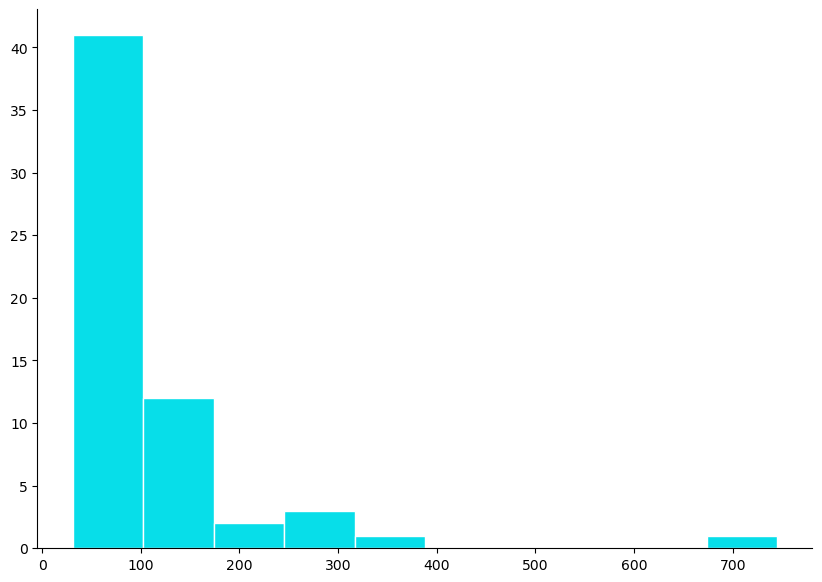

In [188]:
print(f"{c} : Nombre de trains annulés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(X[X.columns[4]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [189]:
index_list_X_2, param_list_X_2, log_lik_list_X_2=candidate_rupt(X['Nombre de trains annulés'])

In [190]:
max_value_X_2 = max(log_lik_list_X_2)
max_index_X_2 =log_lik_list_X_2.index(max_value_X_2)

Bourgogne : vraissemblance selon k


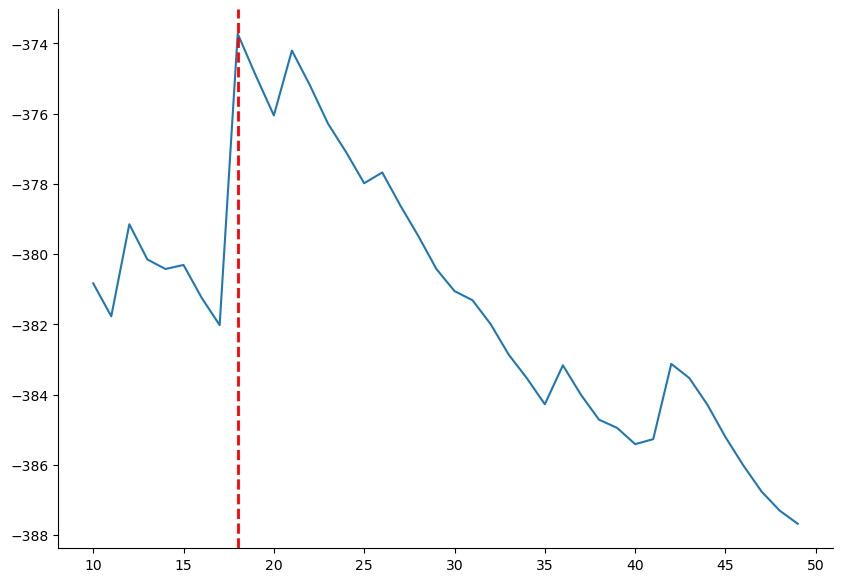

In [191]:
print(f"{c} : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_X_2,log_lik_list_X_2)
plt.axvline(x=index_list_X_2[max_index_X_2], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [192]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_X_2[max_index_X_2]}, Parametres des lois:{param_list_X_2[max_index_X_2]}")

Maximum de vraissemblance atteint pour k= 18, Parametres des lois:[ 25.60860635  40.7420511  215.86977891  62.38870441   8.73418874]


In [193]:
X.loc[index_list_X_2[max_index_X_2]]

Date                                        2014-07
Région                                    Bourgogne
Nombre de trains programmés                  7175.0
Nombre de trains ayant circulé               7108.0
Nombre de trains annulés                       67.0
Nombre de trains en retard à l'arrivée        576.0
Taux de régularité                        91.896455
Name: 18, dtype: object

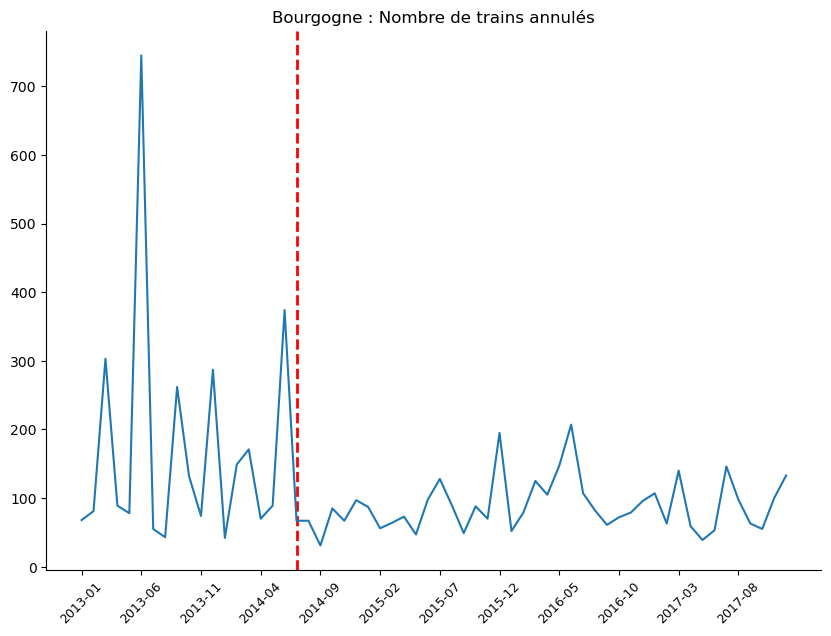

In [194]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_X_2=param_list_X_2[max_index_X_2]
plt.axvline(x=index_list_X_2[max_index_X_2], color='red', linestyle='dashed', linewidth=2)

plt.plot(X['Date'],X['Nombre de trains annulés'])
plt.title(f"{c} : Nombre de trains annulés")

plt.show()

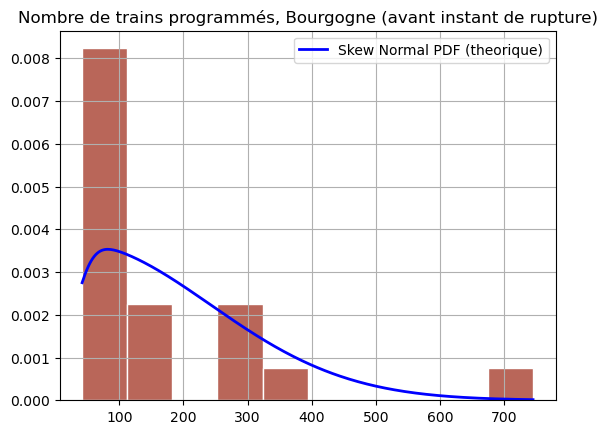

In [195]:
k=index_list_X_2[max_index_X_2]

counts, bins, patches = plt.hist(X.loc[:k,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X_2[4], param_X_2[0], param_X_2[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés, {c} (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

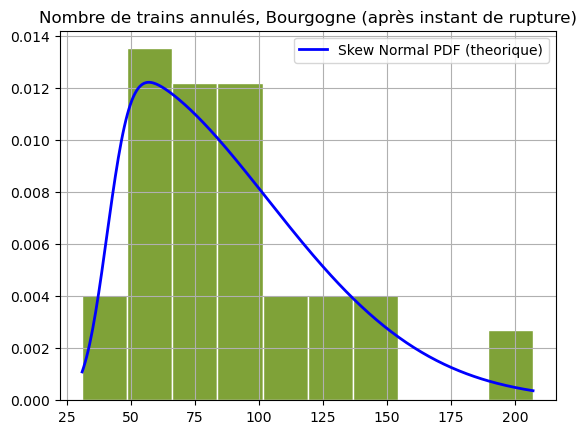

In [196]:
counts, bins, patches = plt.hist(X.loc[k:,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X_2[4], param_X_2[1], param_X_2[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains annulés, {c} (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

### kolmogorv test 


In [197]:
data1 = X.loc[k:,'Nombre de trains annulés']
data2 = X.loc[:k,'Nombre de trains annulés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.3208020050125313
p-value: 0.10487541955270374
Fail to reject null hypothesis, distributions might be similar.


# Basse Normandie

## train programmes

In [198]:
c='Basse Normandie'
X=df[df['Région']==c]
X=X.reset_index(inplace=False, drop=True)

X.head()

,Date,Région,Nombre de trains programmés,Nombre de trains ayant circulé,Nombre de trains annulés,Nombre de trains en retard à l'arrivée,Taux de régularité
0,2013-01,Basse Normandie,3331.0,3297.0,34.0,311.0,90.567182
1,2013-02,Basse Normandie,3013.0,2991.0,22.0,185.0,93.814778
2,2013-03,Basse Normandie,3283.0,2808.0,475.0,251.0,91.061254
3,2013-04,Basse Normandie,3221.0,3137.0,84.0,190.0,93.943258
4,2013-05,Basse Normandie,3178.0,3009.0,169.0,173.0,94.250582


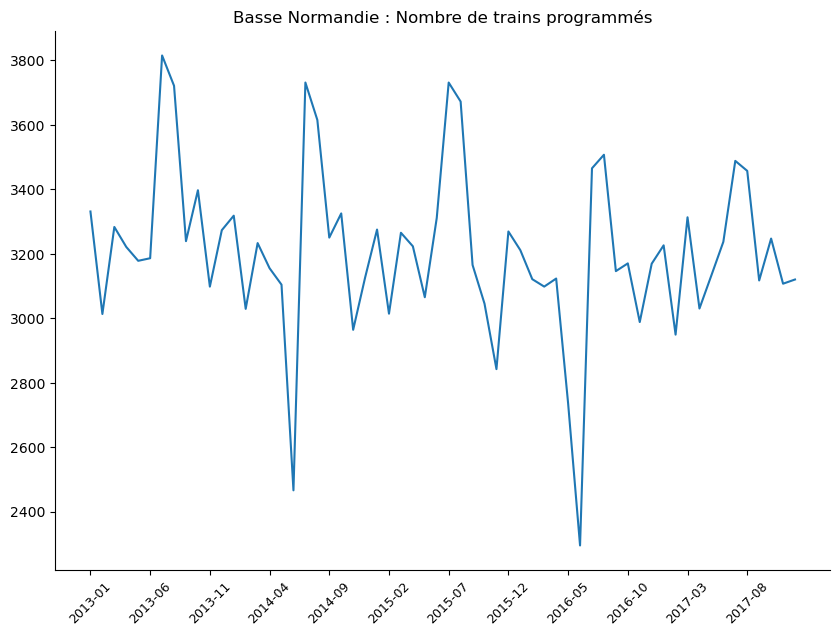

In [199]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(X['Date'],X['Nombre de trains programmés'])
plt.title(f"{c} : Nombre de trains programmés")

plt.show()

Basse Normandie : Nombre de trains programmés


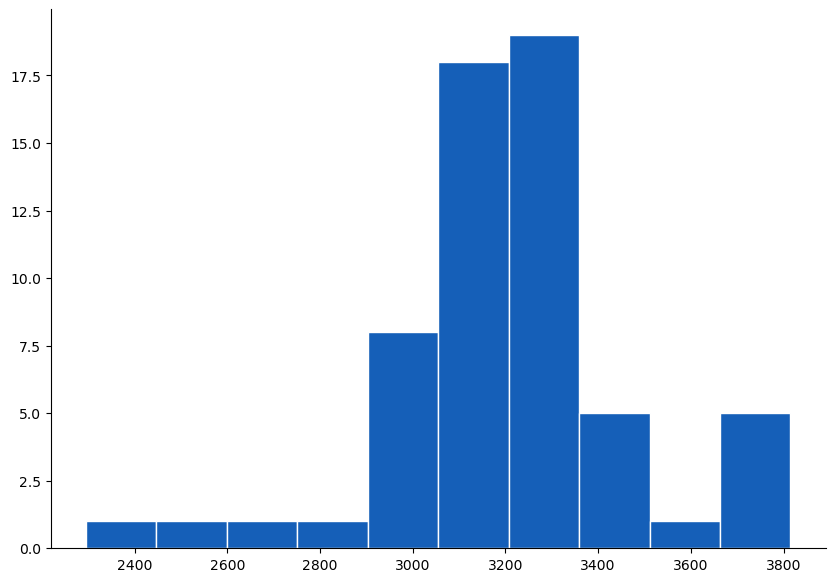

In [200]:
print(f"{c} : Nombre de trains programmés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(X[X.columns[2]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [201]:
index_list_X, param_list_X, log_lik_list_X=candidate_rupt(X['Nombre de trains programmés'])

In [202]:
max_value_X = max(log_lik_list_X)
max_index_X =log_lik_list_X.index(max_value_X)

Basse Normandie : vraissemblance selon k


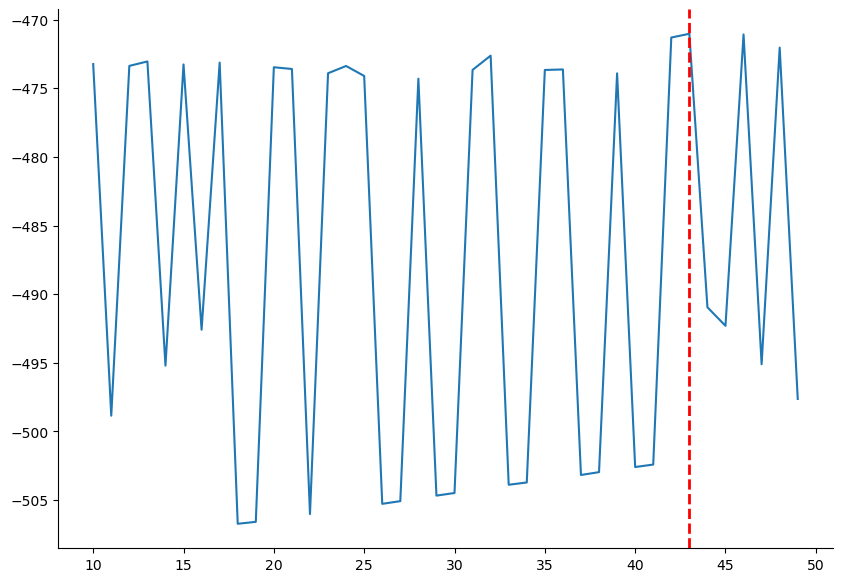

In [203]:
print(f"{c} : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_X,log_lik_list_X)
plt.axvline(x=index_list_X[max_index_X], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [204]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_X[max_index_X]}, Parametres des lois:{param_list_X[max_index_X]}")

Maximum de vraissemblance atteint pour k= 43, Parametres des lois:[3.20344747e+03 3.19716530e+03 2.95594226e+02 1.58761773e+02
 2.43613343e-02]


In [205]:
k=index_list_X[max_index_X]
X.loc[k]

Date                                              2016-08
Région                                    Basse Normandie
Nombre de trains programmés                        3507.0
Nombre de trains ayant circulé                     3479.0
Nombre de trains annulés                             28.0
Nombre de trains en retard à l'arrivée              202.0
Taux de régularité                              94.193734
Name: 43, dtype: object

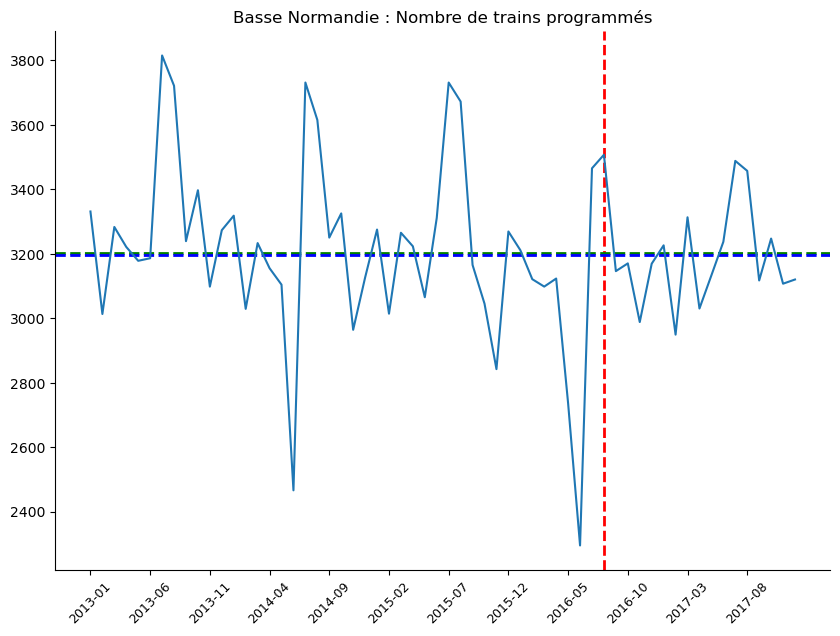

In [206]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_X=param_list_X[max_index_X]
plt.axvline(x=index_list_X[max_index_X], color='red', linestyle='dashed', linewidth=2)
plt.axhline(y=param_X[0], color='green', linestyle='dashed', linewidth=2)
plt.axhline(y=param_X[1], color='blue', linestyle='dashed', linewidth=2)

plt.plot(X['Date'],X['Nombre de trains programmés'])
plt.title(f"{c} : Nombre de trains programmés")

plt.show()

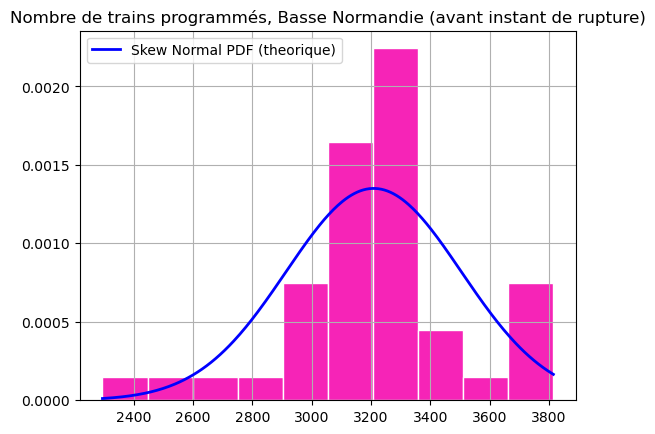

In [207]:
counts, bins, patches = plt.hist(X.loc[:k,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X[4], param_X[0], param_X[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés, {c} (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

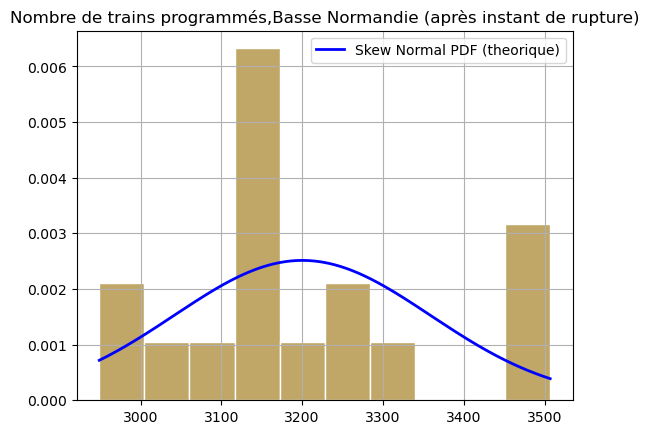

In [208]:
counts, bins, patches = plt.hist(X.loc[k:,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X[4], param_X[1], param_X[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés,{c} (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

### kolmogorov 

In [209]:
data1 = X.loc[index_list_X[max_index_X]:,'Nombre de trains programmés']
data2 = X.loc[:index_list_X[max_index_X],'Nombre de trains programmés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.196524064171123
p-value: 0.649348855623939
Fail to reject null hypothesis, distributions might be similar.


## Trains annules 

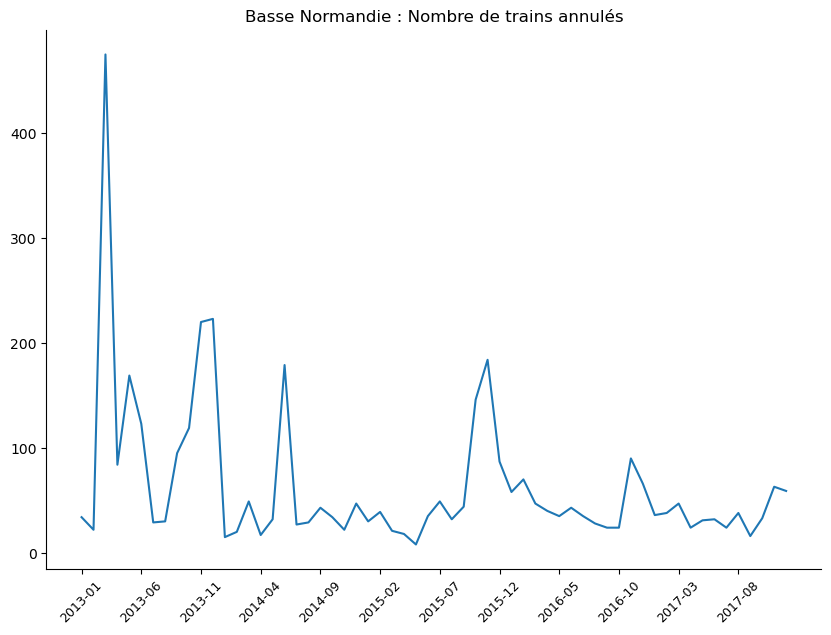

In [210]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(X['Date'],X['Nombre de trains annulés'])
plt.title(f"{c} : Nombre de trains annulés")

plt.show()


Basse Normandie : Nombre de trains annulés


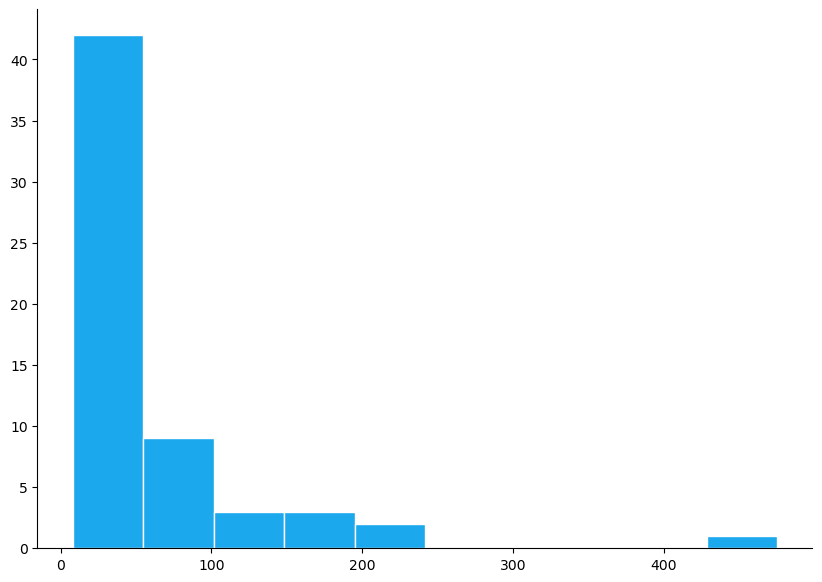

In [211]:
print(f"{c} : Nombre de trains annulés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(X[X.columns[4]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [212]:
index_list_X_2, param_list_X_2, log_lik_list_X_2=candidate_rupt(X['Nombre de trains annulés'])

In [213]:
max_value_X_2 = max(log_lik_list_X_2)
max_index_X_2 =log_lik_list_X_2.index(max_value_X_2)

Basse Normandie : vraissemblance selon k


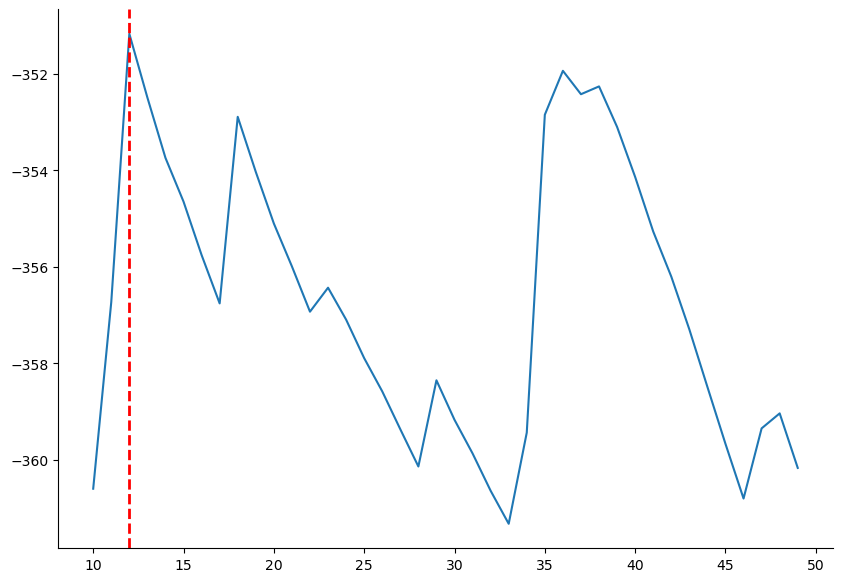

In [214]:
print(f"{c} : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_X_2,log_lik_list_X_2)
plt.axvline(x=index_list_X_2[max_index_X_2], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [215]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_X_2[max_index_X_2]}, Parametres des lois:{param_list_X_2[max_index_X_2]}")

Maximum de vraissemblance atteint pour k= 12, Parametres des lois:[ 11.43898169  11.37098215 169.32211164  50.66823381  15.41487363]


In [216]:
X.loc[index_list_X_2[max_index_X_2]]

Date                                              2014-01
Région                                    Basse Normandie
Nombre de trains programmés                        3318.0
Nombre de trains ayant circulé                     3303.0
Nombre de trains annulés                             15.0
Nombre de trains en retard à l'arrivée              128.0
Taux de régularité                              96.124735
Name: 12, dtype: object

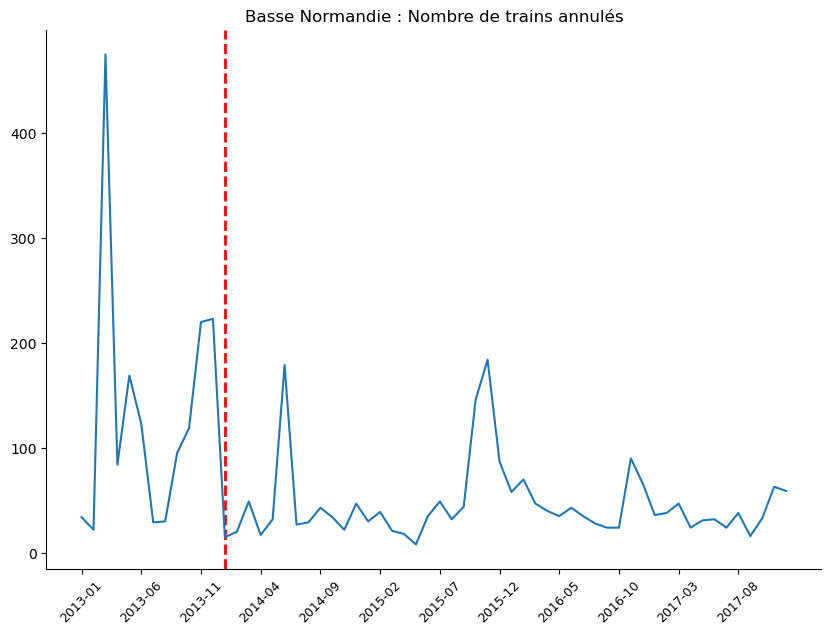

In [217]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_X_2=param_list_X_2[max_index_X_2]
plt.axvline(x=index_list_X_2[max_index_X_2], color='red', linestyle='dashed', linewidth=2)

plt.plot(X['Date'],X['Nombre de trains annulés'])
plt.title(f"{c} : Nombre de trains annulés")

plt.show()

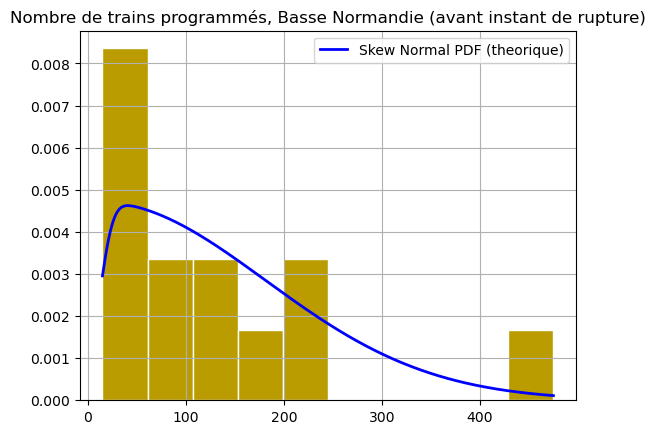

In [218]:
k=index_list_X_2[max_index_X_2]

counts, bins, patches = plt.hist(X.loc[:k,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X_2[4], param_X_2[0], param_X_2[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés, {c} (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

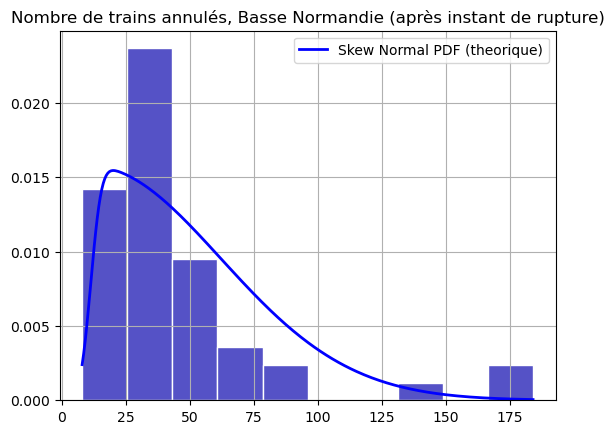

In [219]:
counts, bins, patches = plt.hist(X.loc[k:,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X_2[4], param_X_2[1], param_X_2[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains annulés, {c} (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

### kolmogorv test 


In [220]:
data1 = X.loc[k:,'Nombre de trains annulés']
data2 = X.loc[:k,'Nombre de trains annulés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.5112179487179487
p-value: 0.005547972501959483
Reject null hypothesis, distributions likely differ.


# Auvergne

# train programmes

In [221]:
c='Auvergne'
X=df[df['Région']==c]
X=X.reset_index(inplace=False, drop=True)

X.head()

,Date,Région,Nombre de trains programmés,Nombre de trains ayant circulé,Nombre de trains annulés,Nombre de trains en retard à l'arrivée,Taux de régularité
0,2013-01,Auvergne,5785.0,5732.0,53.0,431.0,92.480809
1,2013-02,Auvergne,5229.0,5166.0,63.0,427.0,91.734417
2,2013-03,Auvergne,5099.0,5045.0,54.0,371.0,92.646184
3,2013-04,Auvergne,5202.0,5167.0,35.0,342.0,93.381072
4,2013-05,Auvergne,4996.0,4965.0,31.0,393.0,92.084592


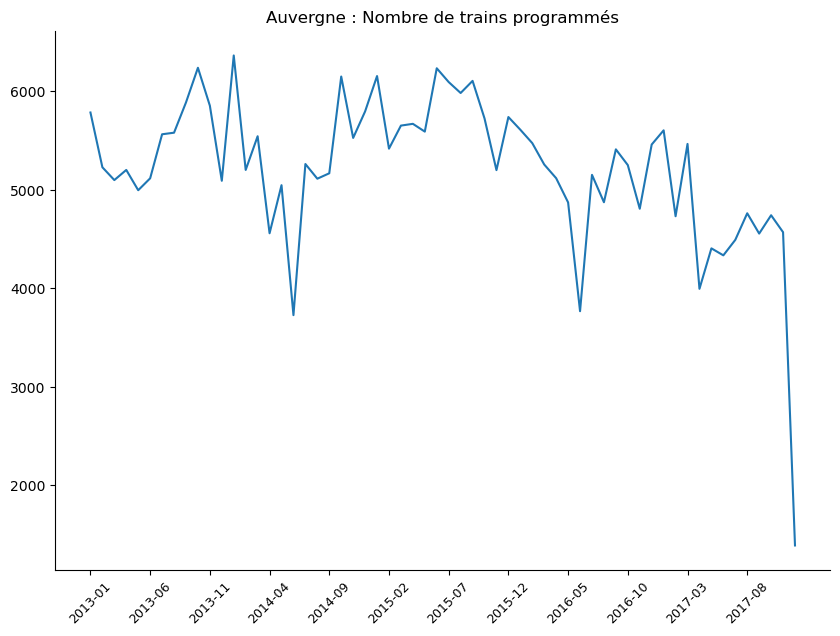

In [222]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(X['Date'],X['Nombre de trains programmés'])
plt.title(f"{c} : Nombre de trains programmés")

plt.show()

Auvergne : Nombre de trains programmés


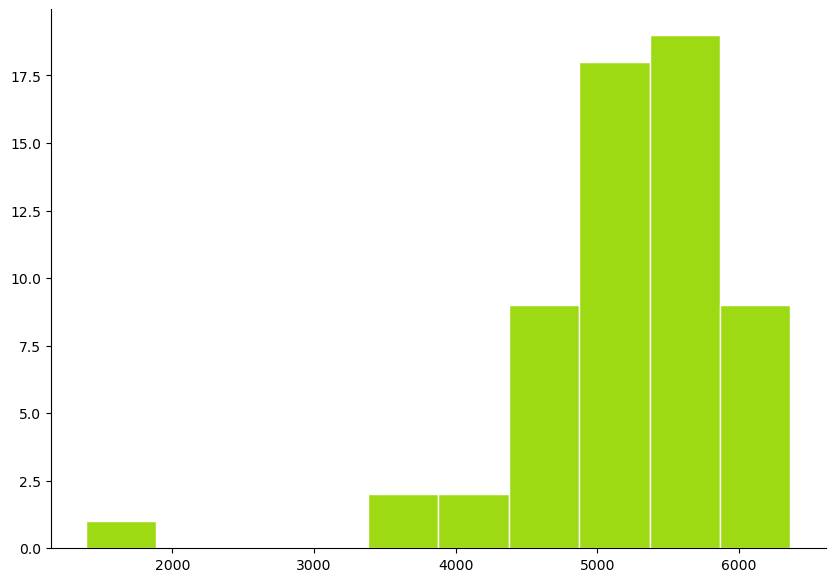

In [223]:
print(f"{c} : Nombre de trains programmés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(X[X.columns[2]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [224]:
index_list_X, param_list_X, log_lik_list_X=candidate_rupt(X['Nombre de trains programmés'])

In [225]:
max_value_X = max(log_lik_list_X)
max_index_X =log_lik_list_X.index(max_value_X)

Auvergne : vraissemblance selon k


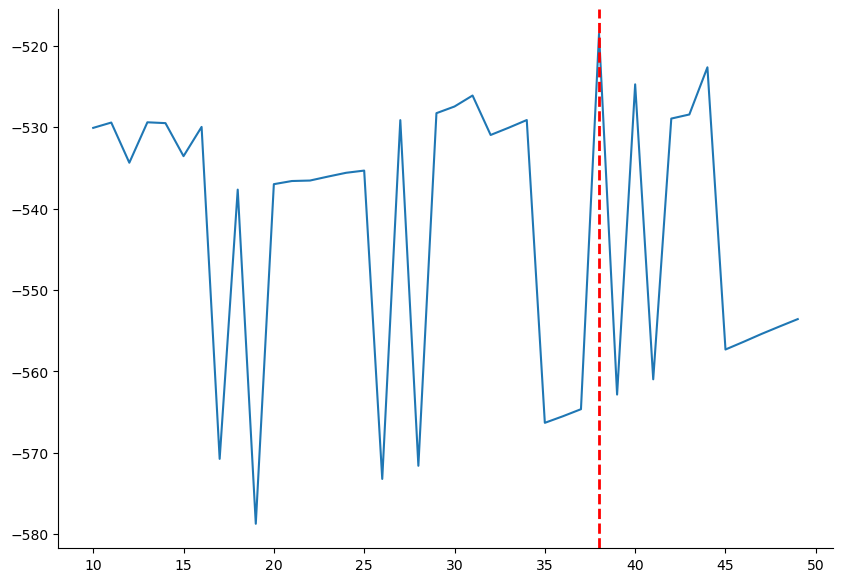

In [226]:
print(f"{c} : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_X,log_lik_list_X)
plt.axvline(x=index_list_X[max_index_X], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [227]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_X[max_index_X]}, Parametres des lois:{param_list_X[max_index_X]}")

Maximum de vraissemblance atteint pour k= 38, Parametres des lois:[6288.64350875 5594.16321096  929.33951287 1235.7560854   -12.29427827]


In [228]:
k=index_list_X[max_index_X]
X.loc[k]

Date                                        2016-03
Région                                     Auvergne
Nombre de trains programmés                  5257.0
Nombre de trains ayant circulé               5203.0
Nombre de trains annulés                       54.0
Nombre de trains en retard à l'arrivée        321.0
Taux de régularité                        93.830482
Name: 38, dtype: object

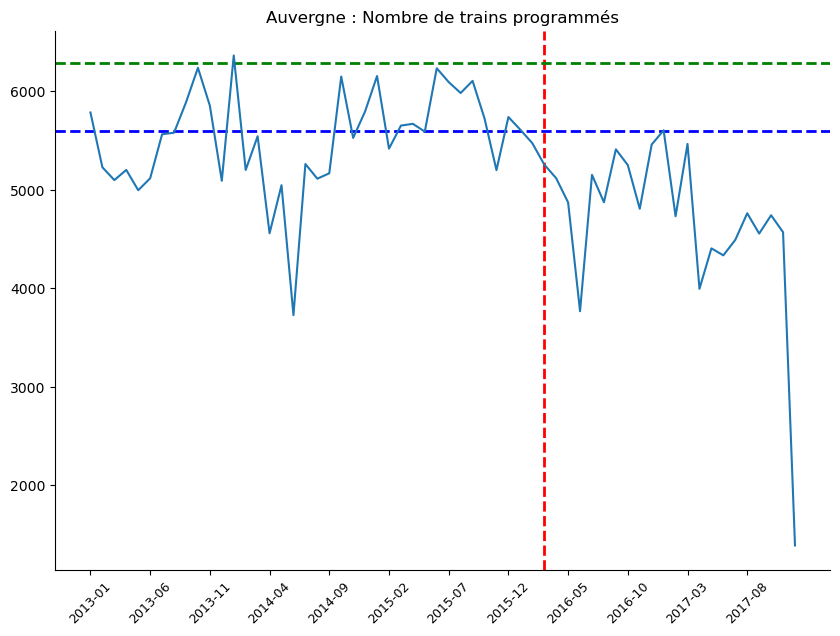

In [229]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_X=param_list_X[max_index_X]
plt.axvline(x=index_list_X[max_index_X], color='red', linestyle='dashed', linewidth=2)
plt.axhline(y=param_X[0], color='green', linestyle='dashed', linewidth=2)
plt.axhline(y=param_X[1], color='blue', linestyle='dashed', linewidth=2)

plt.plot(X['Date'],X['Nombre de trains programmés'])
plt.title(f"{c} : Nombre de trains programmés")

plt.show()

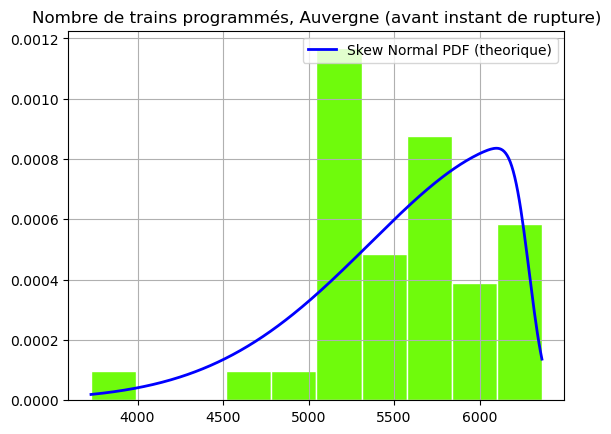

In [230]:
counts, bins, patches = plt.hist(X.loc[:k,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X[4], param_X[0], param_X[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés, {c} (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

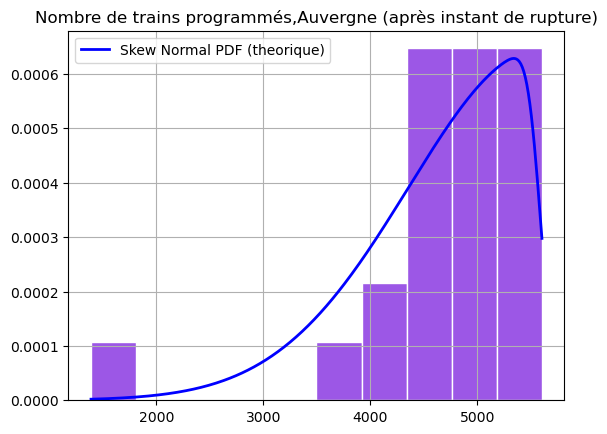

In [231]:
counts, bins, patches = plt.hist(X.loc[k:,'Nombre de trains programmés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X[4], param_X[1], param_X[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés,{c} (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

### kolmogorov 

In [232]:
data1 = X.loc[index_list_X[max_index_X]:,'Nombre de trains programmés']
data2 = X.loc[:index_list_X[max_index_X],'Nombre de trains programmés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.585081585081585
p-value: 4.945489350241052e-05
Reject null hypothesis, distributions likely differ.


# Trains annules 

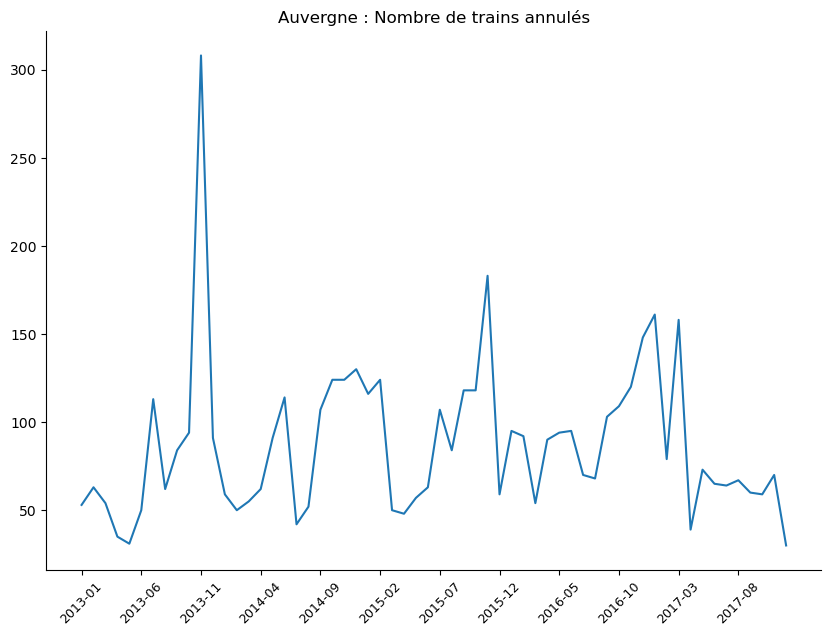

In [233]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

plt.plot(X['Date'],X['Nombre de trains annulés'])
plt.title(f"{c} : Nombre de trains annulés")

plt.show()


Auvergne : Nombre de trains annulés


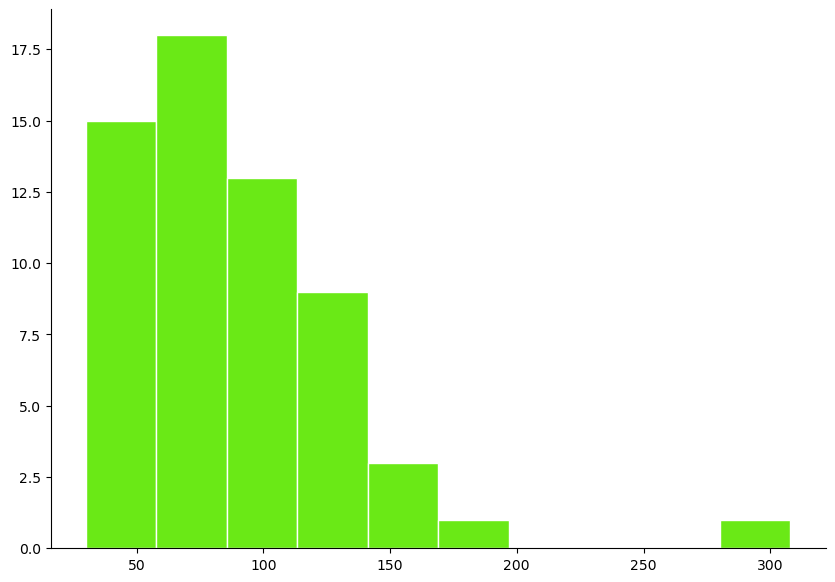

In [234]:
print(f"{c} : Nombre de trains annulés")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')


plt.hist(X[X.columns[4]].values , ec="white",color=numpy.random.rand(3))
plt.show()

In [235]:
index_list_X_2, param_list_X_2, log_lik_list_X_2=candidate_rupt(X['Nombre de trains annulés'])

In [236]:
max_value_X_2 = max(log_lik_list_X_2)
max_index_X_2 =log_lik_list_X_2.index(max_value_X_2)

Auvergne : vraissemblance selon k


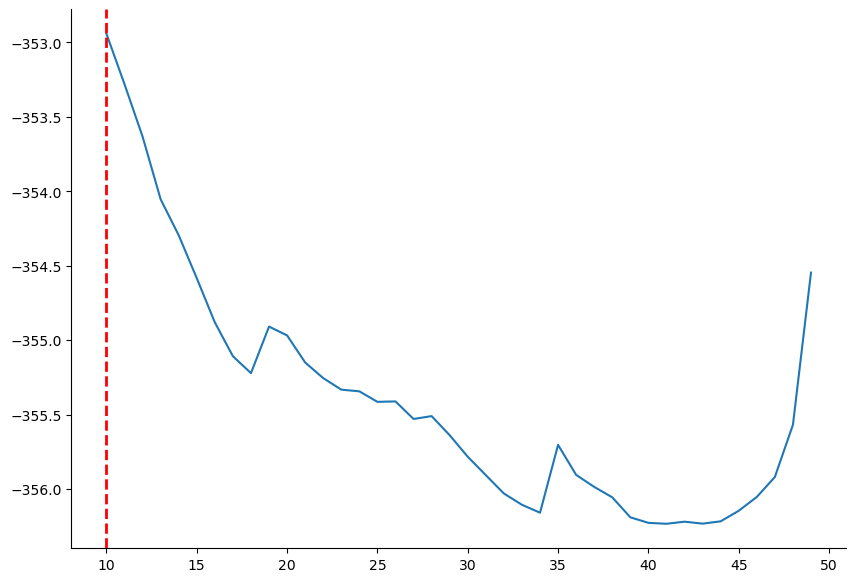

In [237]:
print(f"{c} : vraissemblance selon k")

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

plt.plot(index_list_X_2,log_lik_list_X_2)
plt.axvline(x=index_list_X_2[max_index_X_2], color='red', linestyle='dashed', linewidth=2)

plt.show()

In [238]:
print(f"Maximum de vraissemblance atteint pour k= {index_list_X_2[max_index_X_2]}, Parametres des lois:{param_list_X_2[max_index_X_2]}")

Maximum de vraissemblance atteint pour k= 10, Parametres des lois:[30.0320799  39.63958994 41.00768026 70.05599593  8.88425511]


In [239]:
X.loc[index_list_X_2[max_index_X_2]]

Date                                        2013-11
Région                                     Auvergne
Nombre de trains programmés                  5854.0
Nombre de trains ayant circulé               5546.0
Nombre de trains annulés                      308.0
Nombre de trains en retard à l'arrivée        721.0
Taux de régularité                        86.999639
Name: 10, dtype: object

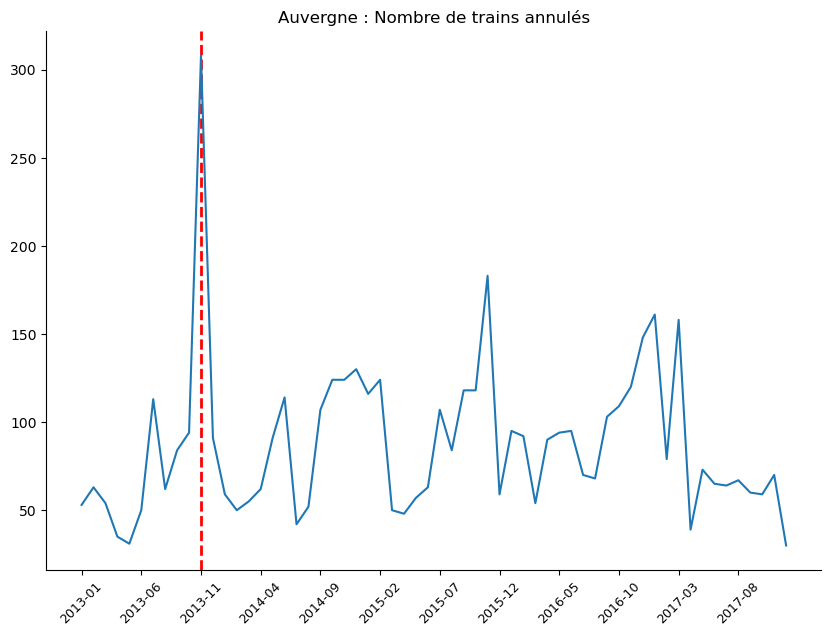

In [240]:
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(111)

# cacher les cadres : haut et droit
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')

ensemble_affichage=[i for i in range(len(X)) if i%5==0]
plt.xticks(ensemble_affichage,[X[X.columns[0]].values[i] for i in ensemble_affichage],
           rotation=45,size=9)

param_X_2=param_list_X_2[max_index_X_2]
plt.axvline(x=index_list_X_2[max_index_X_2], color='red', linestyle='dashed', linewidth=2)

plt.plot(X['Date'],X['Nombre de trains annulés'])
plt.title(f"{c} : Nombre de trains annulés")

plt.show()

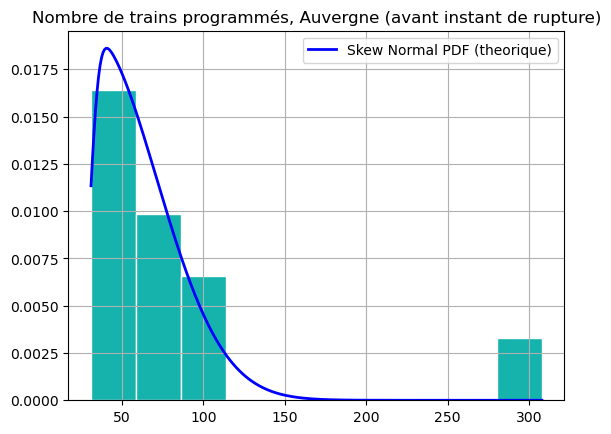

In [246]:
k=index_list_X_2[max_index_X_2]

counts, bins, patches = plt.hist(X.loc[:k,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X_2[4], param_X_2[0], param_X_2[2])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains programmés, {c} (avant instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

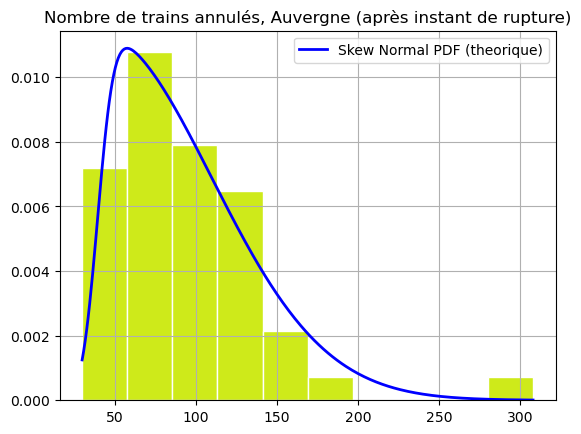

In [247]:
counts, bins, patches = plt.hist(X.loc[k:,'Nombre de trains annulés'], ec="white", color=np.random.rand(3),density=True)

# Courbe PDF theorique pour une loi skew normal avec les parametres estimes
x_smooth = np.linspace(min(bins), max(bins), 300)
pdf = skewnorm.pdf(x_smooth, param_X_2[4], param_X_2[1], param_X_2[3])
plt.plot(x_smooth, pdf, 'b-', linewidth=2, label='Skew Normal PDF (theorique)')

plt.title(f'Nombre de trains annulés, {c} (après instant de rupture)')
plt.grid(True)
plt.legend()
plt.show()

### kolmogorov

In [248]:
data1 = X.loc[k:,'Nombre de trains annulés']
data2 = X.loc[:k,'Nombre de trains annulés']

statistic, pvalue = stats.kstest(data1, data2)

print("Kolmogorov-Smirnov statistic:", statistic)
print("p-value:", pvalue)

# Interpretation (assuming alpha=0.05)
if pvalue < 0.05:
  print("Reject null hypothesis, distributions likely differ.")
else:
  print("Fail to reject null hypothesis, distributions might be similar.")

Kolmogorov-Smirnov statistic: 0.31636363636363635
p-value: 0.2659226262669921
Fail to reject null hypothesis, distributions might be similar.
